In [2]:
import pandas as pd
import warnings
warnings.filterwarnings("ignore")

In [3]:
ozon_xlsx = pd.read_excel('/kaggle/input/market-data/ozon.xlsx')
sber_xlsx = pd.read_excel('/kaggle/input/market-data/sber.xlsx')
wb_xlsx = pd.read_excel('/kaggle/input/market-data/wb.xlsx')
ya_xlsx = pd.read_excel('/kaggle/input/yandex-db/ya.xlsx')

In [4]:
ozon_df = pd.DataFrame(columns=['order_id', 
                                'date_creation', 
                                'status', 
                                'sku_name', 
                                'sku_id', 
                                'amount', 
                                'unit_price', 
                                'unit_discount', 
                                'unit_total_price', 
                                'order_price', 
                                'order_discount', 
                                'order_total_price', 
                                'market_place'])
sber_df = pd.DataFrame(columns=['order_id', 
                                'date_creation', 
                                'status', 
                                'sku_name', 
                                'sku_id', 
                                'amount', 
                                'unit_price', 
                                'unit_discount', 
                                'unit_total_price', 
                                'order_price', 
                                'order_discount', 
                                'order_total_price', 
                                'market_place'])
wb_df = pd.DataFrame(columns=['order_id', 
                                'date_creation', 
                                'status', 
                                'sku_name', 
                                'sku_id', 
                                'amount', 
                                'unit_price', 
                                'unit_discount', 
                                'unit_total_price', 
                                'order_price', 
                                'order_discount', 
                                'order_total_price', 
                                'market_place'])
ya_df = pd.DataFrame(columns=['order_id', 
                                'date_creation', 
                                'status', 
                                'sku_name', 
                                'sku_id', 
                                'amount', 
                                'unit_price', 
                                'unit_discount', 
                                'unit_total_price', 
                                'order_price', 
                                'order_discount', 
                                'order_total_price', 
                                'market_place'])
total_df = pd.DataFrame(columns=['order_id', 
                                'date_creation', 
                                'status', 
                                'sku_name', 
                                'sku_id', 
                                'amount', 
                                'unit_price', 
                                'unit_discount', 
                                'unit_total_price', 
                                'order_price', 
                                'order_discount', 
                                'order_total_price', 
                                'market_place'])

In [5]:
ozon_df['order_id'] = ozon_xlsx['Номер заказа']
ozon_df['date_creation'] = ozon_xlsx['Принят в обработку']
ozon_df['status'] = ozon_xlsx['Статус']
ozon_df['sku_name'] = ozon_xlsx['Наименование товара']
ozon_df['sku_id'] = ozon_xlsx['OZON id']
ozon_df['amount'] = ozon_xlsx['Количество']
ozon_df['unit_price'] = ozon_xlsx['Цена товара до скидок']
ozon_df['unit_discount'] = ozon_xlsx['Скидка руб'] / ozon_xlsx['Количество']
ozon_df['unit_total_price'] = ozon_xlsx['Итоговая стоимость товара']
ozon_df['order_price'] = ozon_xlsx['Цена товара до скидок'] * ozon_xlsx['Количество']
ozon_df['order_discount'] = ozon_xlsx['Цена товара до скидок'] * ozon_xlsx['Количество'] - ozon_xlsx['Сумма отправления'] 
ozon_df['order_total_price'] = ozon_xlsx['Сумма отправления']
ozon_df['market_place'] = 'ozon'

In [6]:
sber_df['order_id'] = sber_xlsx['# Заказа Мегармаркет']
sber_df['date_creation'] = sber_xlsx['Заказ оформлен']
sber_df['status'] = sber_xlsx['Состояние']
sber_df['sku_name'] = sber_xlsx['Наименование']
sber_df['sku_id'] = sber_xlsx['Артикул']
sber_df['amount'] = sber_xlsx['Кол-во']
sber_df['unit_price'] = sber_xlsx['Цена']
sber_df['unit_discount'] = sber_xlsx['Скидка']
sber_df['unit_total_price'] = sber_xlsx['Цена со скидкой']
sber_df['order_price'] = sber_xlsx['Сумма']
sber_df['order_discount'] = sber_xlsx['Скидка'] * sber_xlsx['Кол-во'] 
sber_df['order_total_price'] = sber_xlsx['Сумма'] - sber_df['order_discount'] 
sber_df['market_place'] = 'sber'

In [7]:
ya_df['order_id'] = ya_xlsx['Номер заказа']
ya_df['date_creation'] = ya_xlsx['Дата оформления']
ya_df['status'] = ya_xlsx['Статус товара']
ya_df['sku_name'] = ya_xlsx['Название товара']
ya_df['sku_id'] = ya_xlsx['Ваш SKU']
ya_df['amount'] = ya_xlsx['Количество']
ya_df['unit_price'] = ya_xlsx['Ваша цена, ₽']
ya_df['unit_discount'] = ya_xlsx['Другие скидки Маркета, ₽']
ya_df['unit_total_price'] = ya_xlsx['Ваша цена, ₽'] - ya_xlsx['Другие скидки Маркета, ₽']
ya_df['order_price'] = ya_df['unit_price'] * ya_xlsx['Количество']
ya_df['order_discount'] = ya_df['unit_discount'] * ya_xlsx['Количество'] + ya_xlsx['Оплата бонусами СберСпасибо (за шт.), ₽'] + ya_xlsx['Оплата баллами Яндекс Плюса (за шт.), ₽']
ya_df['order_total_price'] = ya_df['order_price'] - ya_df['order_discount']
ya_df['market_place'] = 'ya'
ya_df = ya_df.drop([0]).reset_index(drop=True)


In [8]:
wb_xlsx_new = wb_xlsx.drop(['№ задания', 'Стикер', 'Короб', 'Баркод', 'Валюта', 'ФИО покупателя', 'Телефон покупателя', 'Размер', 'Цвет', 'Куда доставить', 'Дата сканирования товара', 'Время с момента заказа', 'Склад продавца', 'Дата доставки клиенту', 'Дата сканирования ШК ТТН'], axis=1).dropna().reset_index().drop(['index'], axis=1)
wb_xlsx = wb_xlsx_new.groupby(wb_xlsx_new.columns.tolist(),as_index=False).size()

In [9]:
wb_xlsx

,QR-код поставки,Дата создания,Наименование,Стоимость,Артикул Wildberries,Артикул продавца,Статус задания,size
0,WB-GI-41037143,00:47:47 01.03.2023,Слюноотсосы стоматологические 150 мм /100 шт. ...,345.0,71697756,1А51031А5103Синий,Продано,1
1,WB-GI-41037143,00:47:47 01.03.2023,Слюноотсосы стоматологические 150 мм/100 шт. ц...,345.0,71697038,1А51011А5101Прозрачный,Продано,1
2,WB-GI-41070356,07:24:37 02.03.2023,Рулон для стерилизации с индикатором 150мм х 200м,2989.0,144442410,GR150200,Продано,1
3,WB-GI-41070356,07:38:40 02.03.2023,Слюноотсосы стоматологические 150 мм /100 шт. ...,358.0,71697756,1А51031А5103Синий,Продано,1
4,WB-GI-41070356,08:05:57 02.03.2023,Слюноотсосы стоматологические 150 мм /100 шт. ...,345.0,71688501,1А51081А5108Зеленый,Продано,1
...,...,...,...,...,...,...,...,...
12394,WB-GI-83087631,22:57:22 10.04.2024,Слюноотсосы стоматологические 150 мм/100 шт. ц...,321.0,71697038,1А51011А5101Прозрачный,Отсортировано,1
12395,WB-GI-83087631,23:21:34 10.04.2024,"Диспенсер для ватных валиков нажимной, синий",519.0,84890609,1А00401А0040С,Отсортировано,2
12396,WB-GI-83087631,23:40:49 10.04.2024,"Стоматологические наконечники 4:1, 10:1 (48шт)",734.0,173015201,1А6826,Отсортировано,1
12397,WB-GI-83087631,23:47:20 10.04.2024,Зубная паста концентрированная 2 шт по 50 мл,966.0,168555780,160050603_2,Отсортировано,1


In [10]:
wb_df['order_id'] = wb_xlsx['QR-код поставки']
wb_df['date_creation'] = wb_xlsx['Дата создания']
wb_df['status'] = wb_xlsx['Статус задания']
wb_df['sku_name'] = wb_xlsx['Наименование']
wb_df['sku_id'] = wb_xlsx['Артикул продавца']
wb_df['amount'] = wb_xlsx['size']
wb_df['unit_price'] = wb_xlsx['Стоимость']
wb_df['unit_discount'] = 0
wb_df['unit_total_price'] = wb_xlsx['Стоимость']
wb_df['order_price'] = wb_xlsx['Стоимость'] * wb_xlsx['size']
wb_df['order_discount'] = 0
wb_df['order_total_price'] = wb_xlsx['Стоимость'] * wb_xlsx['size']
wb_df['market_place'] = 'wb'

In [11]:
frames = [ozon_df, sber_df, ya_df, wb_df]
total = pd.concat(frames).reset_index().drop(['index'], axis=1)

In [12]:
total

,order_id,date_creation,status,sku_name,sku_id,amount,unit_price,unit_discount,unit_total_price,order_price,order_discount,order_total_price,market_place
0,94375609-0002,2023-03-01 04:35:33,Доставлен,Реминерализующая зубная паста GARDA BASTION Ко...,537685656,1.0,487.0,193.0,294.0,487.0,193.0,294.0,ozon
1,45477278-0210,2023-03-01 08:10:44,Доставлен,Фартук защитный стоматологический из нейлона н...,564665112,1.0,1400.0,701.0,699.0,1400.0,701.0,699.0,ozon
2,0111748529-0010,2023-03-01 08:57:54,Отменен,Фартук защитный стоматологический из нейлона н...,564665112,1.0,1400.0,701.0,699.0,1400.0,701.0,699.0,ozon
3,29481162-0458,2023-03-01 12:57:03,Доставлен,"Ложки слепочные стоматологические 12 шт., малы...",605055971,2.0,930.0,275.0,655.0,1860.0,550.0,1310.0,ozon
4,29481162-0458,2023-03-01 12:57:03,Доставлен,"Ложки слепочные стоматологические 12 шт., разм...",603511628,2.0,930.0,275.0,655.0,1860.0,550.0,1310.0,ozon
...,...,...,...,...,...,...,...,...,...,...,...,...,...
18978,WB-GI-83087631,22:57:22 10.04.2024,Отсортировано,Слюноотсосы стоматологические 150 мм/100 шт. ц...,1А51011А5101Прозрачный,1.0,321.0,0.0,321.0,321.0,0.0,321.0,wb
18979,WB-GI-83087631,23:21:34 10.04.2024,Отсортировано,"Диспенсер для ватных валиков нажимной, синий",1А00401А0040С,2.0,519.0,0.0,519.0,1038.0,0.0,1038.0,wb
18980,WB-GI-83087631,23:40:49 10.04.2024,Отсортировано,"Стоматологические наконечники 4:1, 10:1 (48шт)",1А6826,1.0,734.0,0.0,734.0,734.0,0.0,734.0,wb
18981,WB-GI-83087631,23:47:20 10.04.2024,Отсортировано,Зубная паста концентрированная 2 шт по 50 мл,160050603_2,1.0,966.0,0.0,966.0,966.0,0.0,966.0,wb


In [13]:
wb_df.to_excel("wb_df.xlsx")

In [14]:
! pip install workalendar

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 210.7/210.7 kB 3.9 MB/s eta 0:00:00a 0:00:01


In [15]:
import matplotlib.pyplot as plt

from workalendar.europe import Russia

from datetime import timedelta
import numpy as np

from sklearn.metrics import mean_absolute_percentage_error

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, accuracy_score, r2_score, mean_absolute_error, f1_score
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier

from statsmodels.tsa.statespace.sarimax import SARIMAX

from prophet import Prophet
from sklearn.metrics import balanced_accuracy_score


from sklearn.model_selection import train_test_split

from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge, Lasso

from sklearn.linear_model import LogisticRegression, SGDRegressor
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from xgboost import XGBClassifier, XGBRegressor

from sklearn.utils.class_weight import compute_class_weight
from sklearn.svm import SVC

from sklearn.tree import DecisionTreeClassifier, plot_tree, export_text
from sklearn.model_selection import GridSearchCV
from sklearn.feature_selection import RFE

from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import BaggingClassifier

import optuna
from sklearn.ensemble import StackingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.feature_selection import SequentialFeatureSelector

from sklearn.metrics import roc_auc_score, roc_curve, auc
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import seaborn as sns

from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer
from sklearn.metrics import (
    roc_curve, auc, roc_auc_score, precision_score,
    recall_score, f1_score, accuracy_score
)

In [16]:
pip install chart_studio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.4/64.4 kB 1.5 MB/s eta 0:00:00a 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [17]:
import logging
logging.getLogger("prophet").setLevel(logging.ERROR)
logging.getLogger("cmdstanpy").setLevel(logging.ERROR)

import chart_studio.plotly as py
import plotly.graph_objs as go
from plotly.offline import iplot

import cufflinks
cufflinks.go_offline()

# Настройка глобальной темы cufflinks
cufflinks.set_config_file(world_readable=True, theme='pearl', offline=True)

In [18]:
cal_xlsx = pd.read_excel('/kaggle/input/calendar/production_calendar.xlsx')
start_index = cal_xlsx[(cal_xlsx['day'] == 1) & (cal_xlsx['month'] == 3) & (cal_xlsx['year'] == 2023)].index[0]
finish_index = cal_xlsx[(cal_xlsx['day'] == 31) & (cal_xlsx['month'] == 3) & (cal_xlsx['year'] == 2024)].index[0]
    
cal_df = cal_xlsx.loc[start_index:finish_index].reset_index(drop=True)

In [19]:
def make_df(item_id, st_date, fn_date, st_date_test, fn_date_test):
    st_date = pd.to_datetime(st_date)
    fn_date = pd.to_datetime(fn_date)
    
    st_date_test = pd.to_datetime(st_date_test)
    fn_date_test = pd.to_datetime(fn_date_test)
    
    df = wb_df.copy()
    df = df[df['sku_name'] == item_id][['date_creation', 'amount', 'unit_price']]
    
    df['date_creation'] = pd.to_datetime(wb_df['date_creation'], format='%H:%M:%S %d.%m.%Y')
    df = df.loc[((df['date_creation'] >= st_date) & (df['date_creation'] < fn_date_test))]
    
    df['day'] = pd.to_datetime(df['date_creation'].dt.date)
    df = df.groupby(['day']).agg({'amount': 'sum', 'unit_price': 'mean'}).reset_index()
    
    full_date_range = pd.date_range(start=pd.to_datetime(df['day'].min() - timedelta(1)), end=pd.to_datetime(df['day'].max() + timedelta(1)))
    df_m = pd.DataFrame(full_date_range, columns=['day'])

    df = pd.merge(df_m, df, on='day', how='left')
    df['amount'].fillna(0, inplace=True)
    df['unit_price'] = df['unit_price'].fillna(method='ffill')
    df['unit_price'].fillna(df['unit_price'].dropna().mean(), inplace=True)
    
    cal = Russia()
    
    holidays_2023 = cal.holidays(2023)
    holidays_2024 = cal.holidays(2024)
    holidays = holidays_2023 + holidays_2024
    holiday_dates = [date for date, name in holidays]
    df[['not_working_day', 'pre_holiday', 'not_working_day_prev', 'not_working_day_next', 'new_year_holidays_period', 'may_holidays_period']] = cal_df[['not_working_day', 'pre_holiday', 'not_working_day_prev', 'not_working_day_next', 'new_year_holidays_period', 'may_holidays_period']]
    df['is_holiday'] = df['day'].isin(holiday_dates).astype(int) | df['day'].dt.dayofweek.isin([5, 6]).astype(int)
    
    df['had_sales'] = (df['amount'] > 0).astype(int)
    for i in [1, 2, 3, 5, 7, 9, 12, 14]:
        df[f'diff_{i}'] = df['amount'].diff(periods=i).fillna(0).shift(1)
        
    for i in [2, 3, 5, 7, 9, 12, 14]:
        df[f'price_rolling_mean_{i}'] = df['unit_price'].rolling(window=i, min_periods=1).mean()
    
    for i in [2, 3, 5, 7, 9, 12, 14]:
        df[f'amount_rolling_mean_{i}'] = df['amount'].rolling(window=i, min_periods=1).mean().shift(1)
        
    for i in [2, 3, 5, 7, 9, 12, 14]:
        df[f'price_rolling_median_{i}'] = df['unit_price'].rolling(window=i, min_periods=1).median()
    
    for i in [2, 3, 5, 7, 9, 12, 14]:
        df[f'amount_rolling_median_{i}'] = df['amount'].rolling(window=i, min_periods=1).median().shift(1)
        
    for i in [3, 7, 9, 14]:
        df[f'ewm_sales_week_{i}'] = df['amount'].ewm(span=i, adjust=False).mean().shift(1)
    df['day_num'] = df['day'].dt.day
    df['month'] = df['day'].dt.month
    df['year'] = df['day'].dt.year
    
    df['zero_streak'] = (df['amount'] == 0).astype(int)
    df['zero_streak'] = df['zero_streak'].groupby((df['zero_streak'] != df['zero_streak'].shift()).cumsum()).cumsum()

    # Создание логического индекса для удаления строк
    to_drop = df['zero_streak'] >= 7
    # Удаление строк из датафрейма
    df = df[~to_drop].drop(columns=['zero_streak'])
    
    df = df.dropna()
    train_df = df.loc[((df['day'] >= st_date) & (df['day'] < fn_date))]
    #val_df = df.loc[((df['day'] > train_df['day'].max()) & (df['day'] < st_date_test))]
    test_df = df.loc[((df['day'] >= st_date_test) & (df['day'] < fn_date_test))]
    
    cnt = 5
    while len(test_df) == 0:
        train_df = df.loc[((df['day'] >= st_date) & (df['day'] < fn_date - timedelta(30 + cnt)))]
        val_df = df.loc[((df['day'] > train_df['day'].max()) & (df['day'] < st_date_test - timedelta(cnt)))]
        test_df = df.loc[((df['day'] > val_df['day'].max()) & (df['day'] < fn_date_test))]
        cnt += 14
    #first_nonzero_index = train_df[train_df['amount'] > 0].index[0]
    #train_df = train_df.loc[first_nonzero_index:].reset_index(drop=True)
    
    
    return train_df, test_df, [i for i in train_df.columns]


In [20]:
for i in range(12):
        cur_idx_m = ((4 + i) % 13) + ((4 + i) // 13)
        cur_idx_y = 2023 + (4 + i) // 13
        print(cur_idx_m, cur_idx_y)

4 2023
5 2023
6 2023
7 2023
8 2023
9 2023
10 2023
11 2023
12 2023
1 2024
2 2024
3 2024


In [21]:
def sales_mask(cur_train, cur_test, features, model=DecisionTreeClassifier(), print_flag=False):
        
    train = cur_train.copy()
    test = cur_test.copy()
    if cur_train.equals(cur_test):
        train = cur_train[((cur_train['month'] >= 3) & (cur_train['year'] == 2023)) | ((cur_train['month'] < 3) & (cur_train['year'] == 2024))]
        test = train.copy()
        y_train_class = train['had_sales']
        X_train_class = train[features]
        X_test_class = test[features]

        scaler = StandardScaler()
        X_train_class = scaler.fit_transform(X_train_class)
        X_test_class = scaler.transform(X_test_class)
        binary_clf = model
        binary_clf.fit(X_train_class, y_train_class)
        y_pred = binary_clf.predict(X_test_class)
        y_scores = binary_clf.predict_proba(X_test_class)[:, 1]
        y_test_class = test['had_sales']
        balanced_acc = balanced_accuracy_score(y_test_class, y_pred)
        f1 = f1_score(y_test_class, y_pred)
        
        if print_flag:

            fpr, tpr, _ = roc_curve(y_test_class, y_scores)
            roc_auc = auc(fpr, tpr)

            precision = precision_score(y_test_class, y_pred)
            recall = recall_score(y_test_class, y_pred)
            f1 = f1_score(y_test_class, y_pred)
            accuracy = accuracy_score(y_test_class, y_pred)
            gini = 2 * roc_auc - 1

            plt.figure()
            plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
            plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
            plt.xlim([0.0, 1.0])
            plt.ylim([0.0, 1.05])
            plt.xlabel('False Positive Rate')
            plt.ylabel('True Positive Rate')
            plt.title('Receiver Operating Characteristic')
            plt.legend(loc="lower right")
            plt.show()

            import pandas as pd

            metrics = {
                "Metric": ["ROC AUC", "Gini", "Precision", "Recall", "F1 Score", "Accuracy"],
                "Value": [roc_auc, gini, precision, recall, f1, accuracy]
            }
            cm = confusion_matrix(y_test_class, y_pred)

            TN, FP, FN, TP = cm.ravel()

            print(f"True Positives (TP): {TP}")
            print(f"True Negatives (TN): {TN}")
            print(f"False Positives (FP): {FP}")
            print(f"False Negatives (FN): {FN}")
            print(f"TPR: {TP/(TP+FN)}")
            print(f"FPR: {FP/(FP+TN)}")

            disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
            disp.plot(cmap=plt.cm.Blues)
            plt.title('Confusion Matrix')
            plt.show()
            
            metrics_df = pd.DataFrame(metrics)
            print(metrics_df)
        return y_pred, [balanced_acc, f1]
    
    y_pred = np.empty(1)
    if print_flag:
        y_scores = np.empty(1)
    y_pred_train = []
    for i in range(12):
        cur_idx_m = ((4 + i) % 13) + ((4 + i) // 13)
        cur_idx_y = 2023 + (4 + i) // 13
        test_month = test[(test['month'] == cur_idx_m) & (test['year'] == cur_idx_y)]
        y_train_class = train['had_sales']
        X_train_class = train[features]
        X_test_class = test_month[features]
        if X_test_class.empty:
            continue
        scaler = StandardScaler()
        X_train_class = scaler.fit_transform(X_train_class)
        X_test_class = scaler.transform(X_test_class)
        binary_clf = model
        binary_clf.fit(X_train_class, y_train_class)
        y_pred = np.hstack((y_pred, np.array(binary_clf.predict(X_test_class))))
        if print_flag:
            y_scores = np.hstack((y_scores, np.array(binary_clf.predict_proba(X_test_class)[:, 1])))
        import pandas as pd
        train = pd.concat([train, test_month])
    
    y_pred = y_pred[1:]
    if print_flag:
        y_scores = y_scores[1:]
    y_test_class = cur_test['had_sales']
    balanced_acc = balanced_accuracy_score(y_test_class, y_pred)
    if print_flag:
        cm = confusion_matrix(y_test_class, y_pred)

        TN, FP, FN, TP = cm.ravel()

        print(f"True Positives (TP): {TP}")
        print(f"True Negatives (TN): {TN}")
        print(f"False Positives (FP): {FP}")
        print(f"False Negatives (FN): {FN}")
        print(f"TPR: {TP/(TP+FN)}")
        print(f"FPR: {FP/(FP+TN)}")
        
        print(f'Presicion = TP / (TP + FP) = {TP} / ({TP} + {FP}) = {TP} / {TP + FP} = {TP / (TP + FP)}')
        print(f'Recall = TP / (TP + FN) = {TP} / ({TP} + {FN}) = {TP} / {TP + FN} = {TP / (TP + FN)}')
        print(f'F1 score = 2 * precision * recall / (precision + recall) = {f1_score(y_test_class, y_pred)}')
        
        fpr, tpr, _ = roc_curve(y_test_class, y_scores)
        fpr_cur = [0, FP/(FP+TN), 1]
        tpr_cur = [0, TP/(TP+FN), 1]
        
        roc_auc_cur = auc(fpr_cur, tpr_cur)
        roc_auc = auc(fpr, tpr)

        precision = precision_score(y_test_class, y_pred)
        recall = recall_score(y_test_class, y_pred)
        f1 = f1_score(y_test_class, y_pred)
        accuracy = accuracy_score(y_test_class, y_pred)
        gini = 2 * roc_auc - 1

        plt.figure()
        plt.plot(fpr_cur, tpr_cur, color='green', lw=2, label=f'cur ROC curve (area = {roc_auc_cur:.2f})')
        plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('Receiver Operating Characteristic')
        plt.legend(loc="lower right")
        plt.show()

        metrics = {
            "Metric": ["ROC AUC", "Gini", "Precision", "Recall", "F1 Score", "Accuracy"],
            "Value": [roc_auc, gini, precision, recall, f1, accuracy]
        }

        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
        disp.plot(cmap=plt.cm.Blues)
        plt.title('Confusion Matrix')
        plt.show()

        metrics_df = pd.DataFrame(metrics)
        print(metrics_df)
    f1 = f1_score(y_test_class, y_pred)

    return y_pred, [balanced_acc, f1] 

In [22]:
def build_graph(cur_train, cur_test):
    
    df = pd.concat([cur_train, cur_test]).copy().set_index('day')
    days_of_week = {
    'Monday': df[df.index.weekday == 0],
    'Tuesday': df[df.index.weekday == 1],
    'Wednesday': df[df.index.weekday == 2],
    'Thursday': df[df.index.weekday == 3],
    'Friday': df[df.index.weekday == 4],
    'Saturday': df[df.index.weekday == 5],
    'Sunday': df[df.index.weekday == 6]
    }

    # Создание графика
    fig = go.Figure()
    ewm_sales = df['amount'].ewm(span=7, adjust=False).mean().shift(1).dropna()
    # Линия для всех данных
    fig.add_trace(go.Scatter(x=df.index, y=df['amount'], mode='lines', name='Продажи'))
    fig.add_trace(go.Scatter(x=df.index, y=ewm_sales, mode='lines', name='Экспоненциальное сглаживание', line=dict(dash='dash', color='brown')))

    # Цвета для каждого дня недели
    colors = {
        'Monday': 'blue',
        'Tuesday': 'orange',
        'Wednesday': 'green',
        'Thursday': 'purple',
        'Friday': 'red',
        'Saturday': 'brown',
        'Sunday': 'pink'
    }

    # Точки для каждого дня недели
    for day, data in days_of_week.items():
        fig.add_trace(go.Scatter(x=data.index, y=data['amount'], mode='markers', name=day, marker=dict(color=colors[day], size=10)))

    # Настройка внешнего вида графика
    fig.update_layout(
        title='               Продажи по дням с подсветкой дней',
        xaxis_title='Дата',
        yaxis_title='Количество продаж',
        template='plotly_white'
    )

    fig.show()

In [48]:
def update(train, test, row):

    test['amount'] = row
    
    tmp = test
    tmp['had_sales'] = (tmp['amount'] > 0).astype(int)
    for i in [1, 2, 3, 5, 7, 9, 12, 14]:
        tmp[f'diff_{i}'] = tmp['amount'].diff(periods=i).fillna(0)
        
    for i in [2, 3, 5, 7, 9, 12, 14]:
        tmp[f'price_rolling_mean_{i}'] = tmp['unit_price'].rolling(window=i, min_periods=1).mean()
    
    for i in [2, 3, 5, 7, 9, 12, 14]:
        tmp[f'amount_rolling_mean_{i}'] = tmp['amount'].rolling(window=i, min_periods=1).mean()
        
    for i in [2, 3, 5, 7, 9, 12, 14]:
        tmp[f'price_rolling_median_{i}'] = tmp['unit_price'].rolling(window=i, min_periods=1).median()
    
    for i in [2, 3, 5, 7, 9, 12, 14]:
        tmp[f'amount_rolling_median_{i}'] = tmp['amount'].rolling(window=i, min_periods=1).median()
        
    for i in [3, 7, 9, 14]:
        tmp[f'ewm_sales_week_{i}'] = tmp['amount'].ewm(span=i, adjust=False).mean()

    return pd.concat([train, tmp])
    

In [24]:
def WMAPE(actual: np.ndarray, forecast: np.ndarray) -> float:
    if actual.shape != forecast.shape:
        raise ValueError("The shapes of actual and forecast arrays must match.")
    
    # Вычисление WMAPE
    absolute_errors = np.abs(actual - forecast)
    sum_absolute_errors = np.sum(absolute_errors)
    sum_actuals = np.sum(actual)
    
    wmape = sum_absolute_errors / sum_actuals
    return wmape

In [44]:
def LinearReg(item_id, cur_train, cur_test, mask, features, build_graph=False):
    
    train = cur_train.copy()
    test = cur_test.copy()
    y_pred = np.empty(1)
    for i in range(12):
        cur_idx_m = ((4 + i) % 13) + ((4 + i) // 13)
        cur_idx_y = 2023 + (4 + i) // 13
        test_month = test[(test['month'] == cur_idx_m) & (test['year'] == cur_idx_y)]
        y_train = train['amount']
        X_train = train[features]
        X_test = test_month[features]
        if X_test.empty:
            continue
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)
        model = LinearRegression()
        model.fit(X_train, y_train)
        cur_pred = np.array(model.predict(X_test))
        y_pred = np.hstack((y_pred, cur_pred))
        train = update(train, test_month, cur_pred)
    
    y_pred = y_pred[1:]
    y_test = test['amount']
        
    
    y_pred = y_pred * np.array(mask)
    
    if (len(y_pred) * len(y_test) == 0):
        return 0, [100000, 1000000, 1000000, 100000]
    mse = mean_squared_error(y_test, y_pred)
    r2 =  r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    mape = WMAPE(y_test, y_pred)
    
    if build_graph:
        df = cur_test.copy().set_index('day')
        fig = go.Figure()
        fig.add_trace(go.Scatter(x=df.index, y=df['amount'], mode='lines', name='Продажи'))
        fig.add_trace(go.Scatter(x=df.index, y=y_pred, mode='lines', name='Прогноз модели', line=dict(dash='dash', color='brown')))
        fig.update_layout(
            title=f'                    Прогноз для {item_id}',
            xaxis_title='Дата',
            yaxis_title='Количество продаж',
            template='plotly_white'
        )

        fig.show()

    return y_pred, [mse, r2, mae, mape]

In [26]:
def Sarimax(cur_train, cur_test, mask, features, build_graph=False):
    
    
    exog_train = cur_train[features[3:]]
    exog_test = cur_test[features[3:]]
    model = SARIMAX(cur_train['amount'], exog=exog_train, order=(1, 1, 1), seasonal_order=(1, 1, 1, 7))

    model_fit = model.fit(disp=False)
    forecast_steps = len(cur_test)
    forecast = model_fit.get_forecast(steps=forecast_steps, exog=exog_test)
    
    predicted_mean = forecast.predicted_mean * mask
    conf_int = forecast.conf_int()
    
    if build_graph:

        plt.figure(figsize=(24, 12))
        plt.gca().xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%Y-%m-%d'))
        plt.gcf().autofmt_xdate()
        plt.plot(cur_test['day'][:len( cur_test['amount'][:-1])], cur_test['amount'][:-1], label='Реальные продажи', color='blue', marker='o')
        plt.plot(cur_test['day'][:len(predicted_mean[1:])], predicted_mean[1:], label='Ожидаемые продажи', color='red', marker='o')
        plt.fill_between(cur_test['day'], conf_int.iloc[:, 0], conf_int.iloc[:, 1], color='pink', alpha=0.3)
        plt.ylabel('Продажи')
        plt.xlabel('Дата')
        plt.title('Прогноз продаж SARIMAX')
        plt.legend()
        plt.grid(True)
        plt.show()
    
    y_pred = predicted_mean
    y_test = cur_test['amount']

    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    smape = SMAPE(y_test, y_pred)

    return y_pred, [mse, r2, mae, smape]


In [27]:
st_date = pd.to_datetime('2023-03-01')
fn_date = pd.to_datetime('2023-04-01')
st_date_test = pd.to_datetime('2023-04-01')
fn_date_test = pd.to_datetime('2024-04-01')

In [27]:
len(wb_df['sku_name'].unique())

189

In [56]:
def mean_sales_previous_week(input_date, cur_test):
    input_date = pd.to_datetime(input_date)
    
    start_date = input_date - timedelta(days=7)
    end_date = input_date - timedelta(days=1)
    
    previous_week_data = cur_test[(pd.to_datetime(cur_test['day']) >= start_date) & (pd.to_datetime(cur_test['day']) <= end_date)]
    
    median_sales = previous_week_data['amount'].mean()
    
    return median_sales

In [57]:
def mean_model(cur_train, cur_test, mask, features, build_graph=False):
    date_range = pd.date_range(start=cur_test['day'].min(), end=cur_test['day'].max())


    results = []
    for single_date in date_range:
        median_sales = mean_sales_previous_week(single_date, cur_test)
        actual_sales = cur_test.loc[pd.to_datetime(cur_test['day']) == single_date, 'amount'].values
        if len(actual_sales) == 0: 
            actual_sales = [0]
        results.append({'date': single_date, 'agg_sales': median_sales, 'actual_sales': actual_sales[0]})

    results_df = pd.DataFrame(results)

    results_df.fillna(0, inplace=True)

    y_true = results_df['actual_sales']
    y_pred = results_df['agg_sales']
    mse = mean_squared_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    smape = SMAPE(y_true, y_pred)
    
    if build_graph:

        plt.figure(figsize=(12, 6))
        plt.gca().xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%Y-%m-%d'))
        plt.gcf().autofmt_xdate()
        plt.plot(cur_test['day'], cur_test['amount'], label='Реальные продажи', color='blue', marker='o')
        plt.plot(cur_test['day'][:len(y_pred)], y_pred, label='Предсказанные продажи', color='red', marker='o')
        plt.ylabel('Продажи')
        plt.xlabel('Дата')
        plt.title('Прогноз продаж Baseline 2 (mean)')
        plt.legend()
        plt.grid(True)
        plt.show()
        
    return y_pred, [mse, r2, mae, smape]


In [58]:
def ZeroPred(cur_train, cur_test):
    y_true = cur_cur_test
    y_pred = results_df['agg_sales']
    mse = mean_squared_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    smape = SMAPE(y_true, y_pred)

In [59]:
item_dict = {}

metrics_dict = {}

group = {}

model_dict = {}

model_dict[0] = 'Линейная регрессия'
model_dict[1] = 'Среднее за 7 дней'
error_arr = []
features = ['month', 'unit_price', 'is_holiday', 'amount_rolling_mean_7', 'amount_rolling_mean_2', 'diff_1', 'diff_2']
cnt = 0
cnt_no_changes = 0
for idx, item_id in enumerate(wb_df['sku_name'].unique()):
    item_dict[idx] = item_id
    idx_str = str(idx + 1).ljust(3)
    item_id_str = str(item_id).ljust(70)
    cur_train, cur_test = make_df(item_id, st_date, fn_date, st_date_test, fn_date_test)
    if len(cur_train) == 0:
        print(f"{idx_str} || {item_id_str} || train-данных нет")
        continue
    elif len(cur_test) == 0:
        print(f"{idx_str} || {item_id_str} || test-данных нет")
        continue
    mask, _ = sales_mask(cur_train, cur_test, features)
    if _[0] < 0.5:
        mask = np.ones(len(mask))
    lin_model_pred, lin_model_metrics = LinearReg(item_id, cur_train, cur_test, mask, features)

    mean_model_pred, mean_model_metrics = mean_model(cur_train, cur_test, mask, features)
    
    best_model = np.argmin([lin_model_metrics[2], mean_model_metrics[2]])
    best_mae = np.min([lin_model_metrics[2], mean_model_metrics[2]])
    if best_mae != 0:
        group[idx] = best_model
    metrics_dict[item_id] = f"Лучший MAE показатель у модели: {model_dict[best_model]}. Он равен {best_mae}"
    print(f'{idx_str} || {item_id_str} || {metrics_dict[item_id]}')

ValueError: too many values to unpack (expected 2)

In [ ]:
lin_reg_amount = list(group.values()).count(0)
mean_amount = list(group.values()).count(1)

In [ ]:
zero_amount_beside_one_point = 189 - (lin_reg_amount + mean_amount)

In [ ]:
df = pd.DataFrame({'num': [lin_reg_amount,  mean_amount, zero_amount_beside_one_point]},
                  index=['LinReg', '7mean', 'zero_without_one'])
plot = df.plot.pie(y='num', figsize=(17, 11), autopct='%1.0f%%')

In [ ]:
model_arr = [LinearReg, mean_model]

In [ ]:
def make_df_for_small_data(item_id, st_date, fn_date, st_date_test, fn_date_test):
    
    st_date = pd.to_datetime(st_date)
    fn_date = pd.to_datetime(fn_date)
    
    st_date_test = pd.to_datetime(st_date_test)
    fn_date_test = pd.to_datetime(fn_date_test)
    
    wb_df['date_creation'] = pd.to_datetime(wb_df['date_creation'], format='%H:%M:%S %d.%m.%Y')
    train_df = wb_df.loc[((wb_df['date_creation'] >= st_date) & (wb_df['date_creation'] < fn_date))]
    test_df =  wb_df.loc[((wb_df['date_creation'] >= st_date_test) & (wb_df['date_creation'] < fn_date_test))]
    
    cur_train = train_df[train_df['sku_name'] == item_id][['date_creation', 'amount', 'unit_price']]
    cur_train['day'] = pd.to_datetime(cur_train['date_creation'].dt.date)
    cur_test = test_df[test_df['sku_name'] == item_id][['date_creation', 'amount', 'unit_price']]
    cur_test['day'] = pd.to_datetime(cur_test['date_creation'].dt.date)

    cur_train = cur_train.groupby(['day']).agg({'amount': 'sum', 'unit_price': 'mean'}).reset_index()
    cur_test = cur_test.groupby(['day']).agg({'amount': 'sum', 'unit_price': 'mean'}).reset_index()
    
    if len(cur_train) + len(cur_test) <= 1:
        if len(cur_train) == 0:
            cur_train = cur_test
        else:
            cur_test = cur_train
    elif len(cur_train) == 0 and len(cur_test) != 0:
        first_non_zero_index = cur_test[cur_test['amount'] != 0].index[0] + 1
        cur_test_old = cur_test.copy()
        cur_train = cur_test_old.iloc[:first_non_zero_index]
        cur_test = cur_test_old.iloc[first_non_zero_index:]
    elif len(cur_train) != 0 and len(cur_test) == 0:
        first_non_zero_index = cur_train[cur_train['amount'] != 0].index[0] + 1
        cur_train_old = cur_train.copy()
        cur_train = cur_train_old.iloc[:first_non_zero_index]
        cur_test = cur_train_old.iloc[first_non_zero_index:]
    
    full_date_range_tr = pd.date_range(start=pd.to_datetime(cur_train['day'].min() - timedelta(1)), end=pd.to_datetime(cur_train['day'].max() + timedelta(1)))
    full_date_range_ts = pd.date_range(start=pd.to_datetime(cur_test['day'].min() - timedelta(1)), end=pd.to_datetime(cur_test['day'].max() + timedelta(1)))
    df_tr = pd.DataFrame(full_date_range_tr, columns=['day'])
    df_ts = pd.DataFrame(full_date_range_ts, columns=['day'])
    
    cur_train = pd.merge(df_tr, cur_train, on='day', how='left')

    cur_train['amount'].fillna(0, inplace=True)
    
    first_nonzero_index = cur_train[cur_train['amount'] > 0].index[0]

    cur_train = cur_train.loc[first_nonzero_index:].reset_index(drop=True)
    cur_test = pd.merge(df_ts, cur_test, on='day', how='left')
    
    cur_train = cur_train.dropna()
    cur_test = cur_test.dropna()
    
    return cur_train, cur_test

In [ ]:
wb_df['sku_name'].unique()[101]

In [46]:
item_id = 'Микробраши Extra-THIN 100 шт./ Микроаппликаторы'
cur_train, cur_val, cur_test, features = make_df(item_id, st_date, fn_date, st_date_test, fn_date_test)

ValueError: not enough values to unpack (expected 4, got 3)

In [28]:
sku_list =['1А51031А5103Синий', '1А51011А5101Прозрачный', '1А00151А0015Б', 'SG01_1', 'SG01', '1А51081А5108Зеленый', '1А00401А0040С', '1А00101А0010Б', '13.00050.03130005003Белый'] 

In [29]:
item_id = wb_df[wb_df['sku_id'] == '1А51011А5101Прозрачный']['sku_name'].unique()[0]
cur_train, cur_test, features = make_df(item_id, st_date, fn_date, st_date_test, fn_date_test)
cur_train['had_sales'].value_counts()

had_sales
1    21
0    10
Name: count, dtype: int64

In [51]:
cur_test['had_sales'].value_counts()

had_sales
0    176
1    137
Name: count, dtype: int64

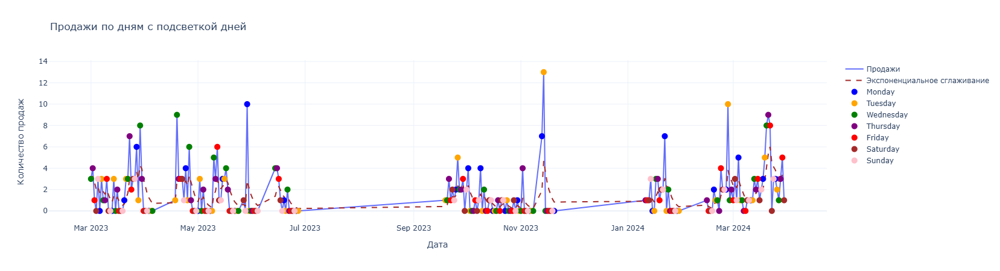

In [58]:
build_graph(cur_train, cur_test)

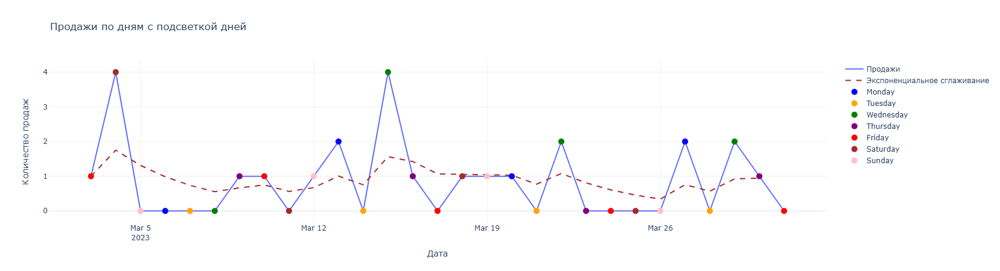

In [53]:
build_graph(pd.DataFrame(), cur_train)

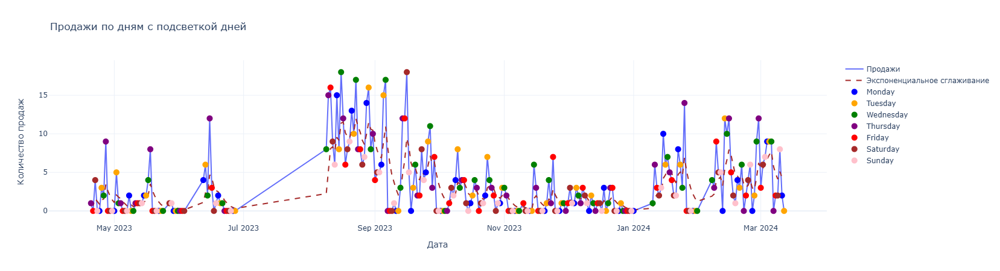

In [44]:
build_graph(pd.DataFrame(), cur_test)

In [30]:
def find_best_features_old(model, item_id, print_flag = False):    
    metrics = []
    cur_train, cur_val, features = make_df(item_id, st_date, fn_date, st_date_test, fn_date_test)
    copy_features = np.delete(features[2:], 8)
    best_features = []
    err_arr_tr = []
    err_arr_val = []
    for j in range(len(copy_features)):
        arr = []
        for idx, i in enumerate(copy_features):
            best_features_copy = best_features.copy()
            best_features_copy.append(i)
            mask, _ = sales_mask(pd.concat([cur_train, cur_val]), pd.concat([cur_train, cur_val]), best_features_copy, model=model)
            arr.append(_[1])
        val_idx = np.argmax(arr)
        best_features.append(copy_features[val_idx])
        copy_features = np.delete(copy_features, val_idx)
        cur_train, cur_val, useless_features = make_df(item_id, st_date, fn_date, st_date_test, fn_date_test)
        mask, _tr = sales_mask(pd.concat([cur_train, cur_val]), pd.concat([cur_train, cur_val]), best_features, model=model, print_flag=False)
        mask, _val = sales_mask(cur_train, cur_val, best_features, model=model, print_flag=False)
        err_arr_tr.append(_tr[1])
        err_arr_val.append(_val[1])



    plt.plot(err_arr_tr, label='Трэйновая выборка')
    plt.plot(err_arr_val, label = 'Валидационная выборка')
    plt.legend()
    plt.grid()
    plt.title(f'{item_id} Значение метрик на двух выборках от числа фичей для модели {model}')
    plt.xlabel('Число фичей')
    plt.ylabel('F1 score')
    plt.show()
    idx = np.argmax(err_arr_val) + 1
    best_features = best_features[:idx]
    print('Crosvall')
    mask_, _tr_ = sales_mask(cur_train, cur_val, best_features, model=model, print_flag=True)
    print('Train')
    mask, _tr = sales_mask(pd.concat([cur_train, cur_val]), pd.concat([cur_train, cur_val]), best_features, model=model, print_flag=True)
    print(best_features)
    return best_features, _tr_[1]

In [40]:
def find_best_features_new(model, print_flag = False):    
    for name_id, sku_id in enumerate(['13.00050.03130005003Белый']):
        item_id = wb_df[wb_df['sku_id'] == sku_id]['sku_name'].unique()[0]
        cur_train, cur_val, cur_test, features = make_df(item_id, st_date, fn_date, st_date_test, fn_date_test)
        copy_features = np.delete(features[2:], 8)
        if isinstance(model, SVC) or isinstance(model, LogisticRegression):
            scaler = StandardScaler()
            cur_train[copy_features] = scaler.fit_transform(cur_train[copy_features])
            cur_val[copy_features] = scaler.transform(cur_val[copy_features])
            cur_test[copy_features] = scaler.transform(cur_test[copy_features])
        arr = []
        err_arr_tr = []
        err_arr_val = []
        features_arr = []

        for t in range(1, 50):
            sfs = SequentialFeatureSelector(model, n_features_to_select=t, direction='forward', scoring='f1', cv=5)
            sfs.fit(cur_train[copy_features], cur_train['had_sales'])
            selected_features = sfs.get_support(indices=True)
            selected_feature_names = [copy_features[i] for i in selected_features]
            print(selected_feature_names)
            X_train_selected = cur_train[selected_feature_names]
            X_val_selected = cur_val[selected_feature_names]


            model.fit(X_train_selected, cur_train['had_sales'])
            y_pred = model.predict(X_val_selected)
            y_pred_train = model.predict(X_train_selected)


            y_test_class = cur_val['had_sales']
            balanced_acc = balanced_accuracy_score(y_test_class, y_pred)
            features_arr.append(selected_feature_names)
            f1 = f1_score(y_test_class, y_pred)
            f1_train = f1_score(cur_train['had_sales'], y_pred_train)
            from IPython.display import clear_output
            clear_output(wait=True)
            err_arr_tr.append(f1_train)
            err_arr_val.append(f1)
            plt.plot(err_arr_tr, label='Трэйновая выборка')
            plt.plot(err_arr_val, label = 'Валидационная выборка')
            plt.legend()
            plt.grid()
            plt.title(f'{sku_id} Значение метрик на двух выборках от числа фичей для модели {model}')
            plt.xlabel('Число фичей')
            plt.ylabel('F1 score')
            plt.show()
            
            y_pred_proba = clf.predict_proba(X_val_selected)[:, 1]
            pri
            roc_auc = roc_auc_score(y_test_class, y_pred_proba)

            print(f'Test ROC AUC with selected features: {roc_auc:.4f}')

            fpr, tpr, thresholds = roc_curve(y_test_class, y_pred_proba)
            roc_auc = auc(fpr, tpr)

            plt.figure()
            plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
            plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
            plt.xlim([0.0, 1.0])
            plt.ylim([0.0, 1.05])
            plt.xlabel('False Positive Rate')
            plt.ylabel('True Positive Rate')
            plt.title('Receiver Operating Characteristic')
            plt.legend(loc='lower right')
            plt.show()
            print(features_arr[np.argmax(err_arr_val)])
        
        tree_features = features_arr[np.argmax(err_arr_val)]
        model.fit(cur_train[tree_features], cur_train[['had_sales']])
        pred = model.predict(cur_test[tree_features])
        f1 = f1_score(cur_test[['had_sales']], pred)
        balanced_acc = balanced_accuracy_score(cur_test[['had_sales']], pred)
        
    return tree_features, [balanced_acc, f1]

In [32]:
cur_train, cur_test, features = make_df(item_id, st_date, fn_date, st_date_test, fn_date_test)
feature_names = ['price_rolling_mean_14']
model = RandomForestClassifier()

In [33]:
df = pd.DataFrame()
df['had_sales'] = pd.concat([cur_train, cur_test])['had_sales']
df[feature_names] =  pd.concat([cur_train, cur_test])[feature_names]

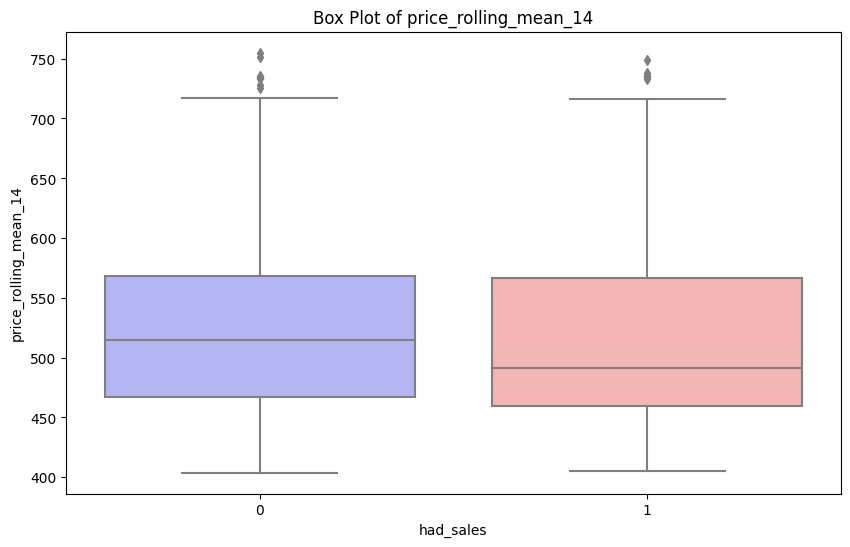

In [34]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='had_sales', y='price_rolling_mean_14', data=df, palette='bwr')
plt.title('Box Plot of price_rolling_mean_14')
plt.show()

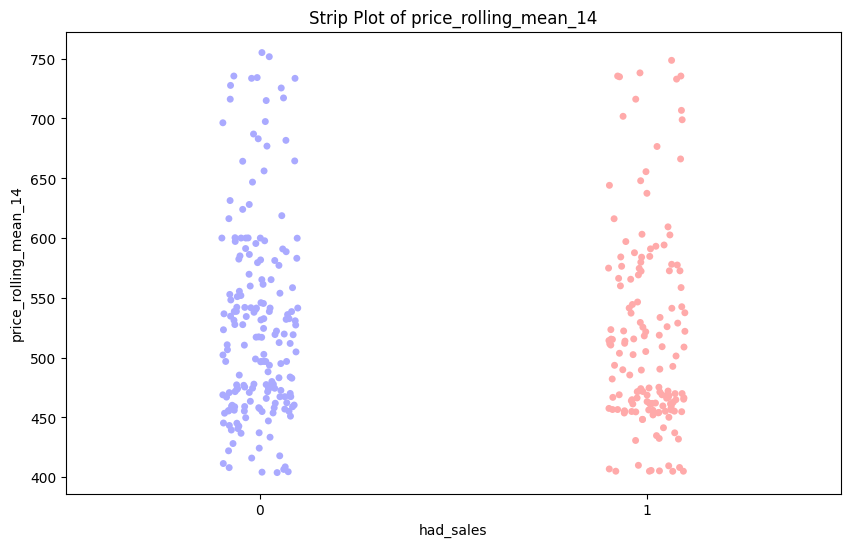

In [35]:
plt.figure(figsize=(10, 6))
sns.stripplot(x='had_sales', y='price_rolling_mean_14', data=df, palette='bwr', jitter=True)
plt.title('Strip Plot of price_rolling_mean_14')
plt.show()

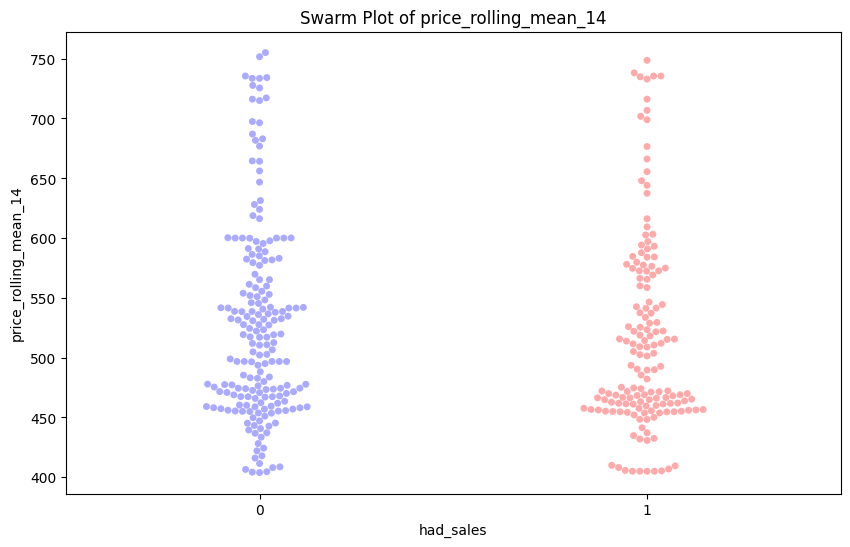

In [36]:
plt.figure(figsize=(10, 6))
sns.swarmplot(x='had_sales', y='price_rolling_mean_14', data=df, palette='bwr')
plt.title('Swarm Plot of price_rolling_mean_14')
plt.show()

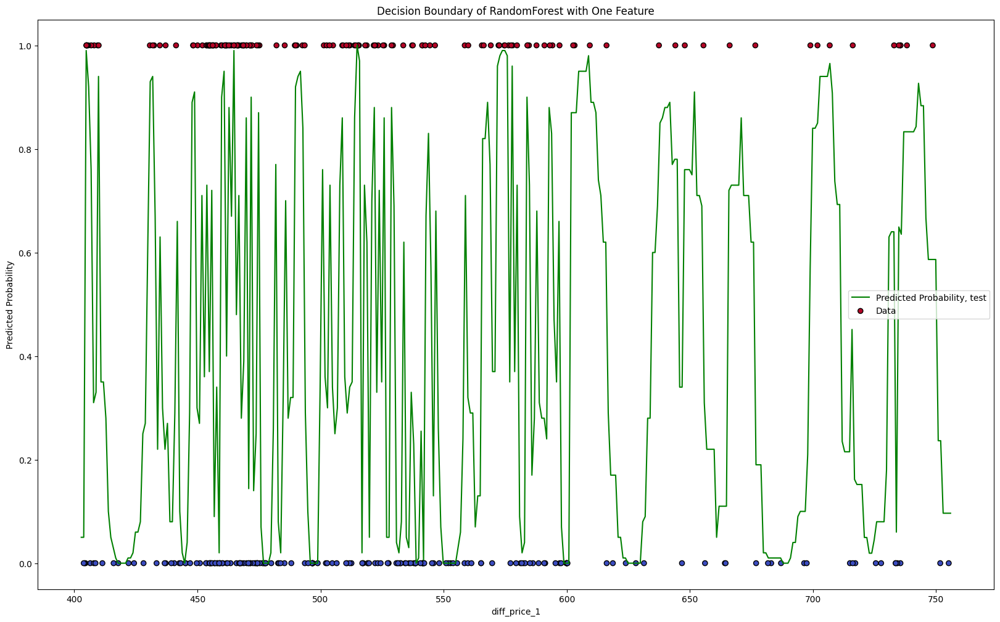

In [38]:
clf = RandomForestClassifier(
        random_state=42
        )
clf.fit(np.array(pd.concat([cur_train, cur_test])['price_rolling_mean_14']).reshape(-1, 1), pd.concat([cur_train, cur_test])['had_sales'])

X = pd.concat([cur_train, cur_test])[['price_rolling_mean_14']].values
y = pd.concat([cur_train, cur_test])['had_sales'].values


x_min, x_max = X.min() - 1, X.max() + 1
xx = np.arange(x_min, x_max, 1).reshape(-1, 1)

# Прогнозирование вероятностей для сетки
probs = clf.predict_proba(xx)[:, 1]
# Построение графика
plt.figure(figsize=(20, 12))
plt.plot(xx, probs, label='Predicted Probability, test', color='green')
plt.scatter(X, y, c=y, edgecolors='k', cmap='coolwarm', label='Data', s=35)
plt.xlabel('diff_price_1')
plt.ylabel('Predicted Probability')
plt.title('Decision Boundary of RandomForest with One Feature')
plt.legend()
plt.show()

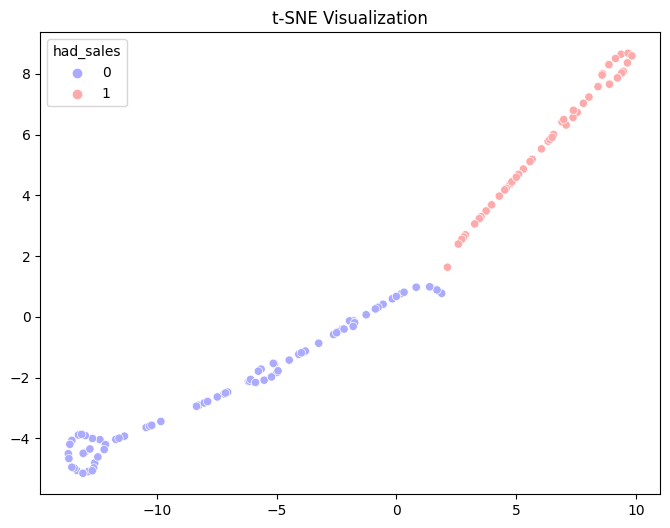

In [202]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(df)

# Визуализация
plt.figure(figsize=(8, 6))
sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], hue=df['had_sales'], palette='bwr')
plt.title('t-SNE Visualization')
plt.show()

<Figure size 1200x800 with 0 Axes>

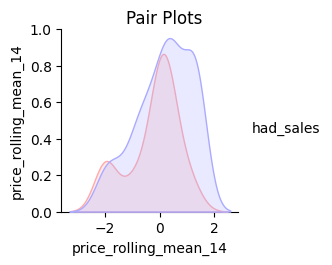

In [174]:
plt.figure(figsize=(12, 8))
sns.pairplot(df, hue='had_sales', palette='bwr', markers=["o", "s"])
plt.suptitle("Pair Plots", y=1.02)
plt.show()

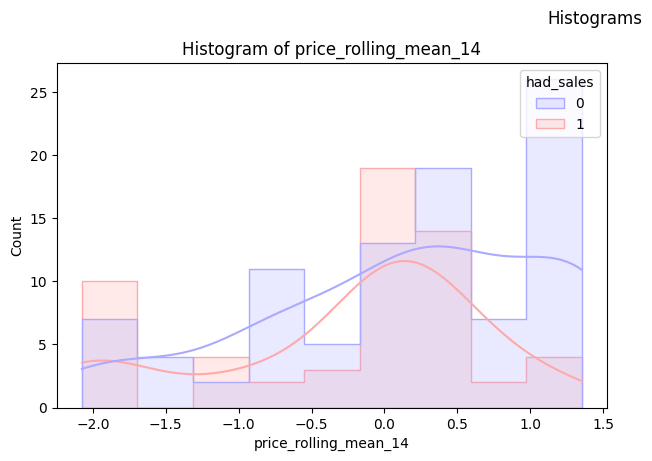

In [176]:
plt.figure(figsize=(12, 8))
for i, feature in enumerate(feature_names):
    plt.subplot(2, 2, i+1)
    sns.histplot(df, x=feature, hue='had_sales', element='step', palette='bwr', kde=True)
    plt.title(f'Histogram of {feature}')
plt.tight_layout()
plt.suptitle("Histograms", y=1.02)
plt.show()

**RANDOM FOREST OLD**

Params:

*     n_estimators: 105
*     max_depth: 19
*     min_samples_split: 7
*     min_samples_leaf: 2
*     max_features: auto

In [31]:
def give_rf_features(item_id):
    rf_features_old, rf_metr_old = find_best_features_old(RandomForestClassifier(random_state=42, min_samples_leaf=4), item_id, True)
    return rf_features_old, rf_metr_old

**LOG REG OLD**

In [32]:
def give_log_features(item_id):
    return find_best_features_old(LogisticRegression(random_state=42), item_id, True)

**DESICION TREE OLD**

In [42]:
def give_tree_features(item_id):
    i, j = find_best_features_old(DecisionTreeClassifier(random_state=42), item_id, True)
    return i, j

**SVM**

In [41]:
def give_svm_features(item_id):
    i, j = find_best_features_old(SVC(random_state=42, probability=True), item_id, True)
    return i, j

**KNN**

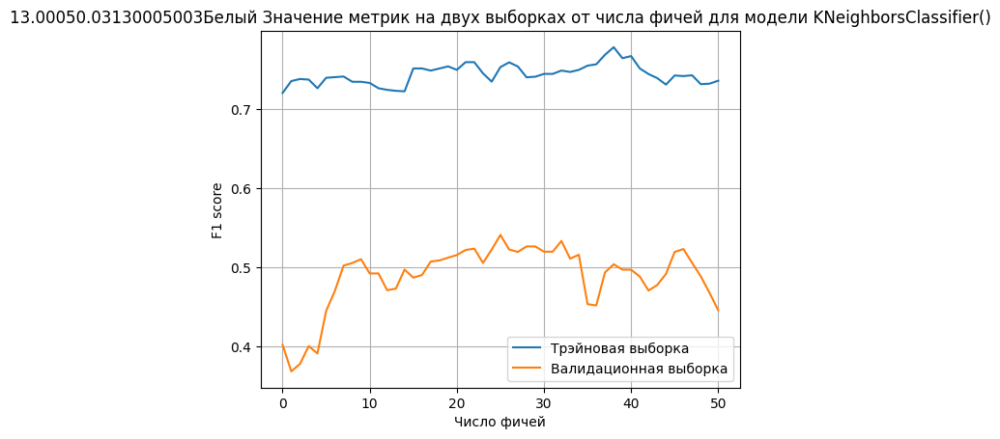

Crosvall


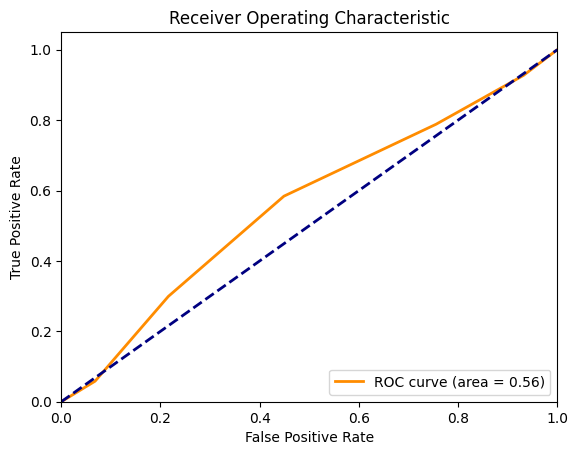

True Positives (TP): 80
True Negatives (TN): 97
False Positives (FP): 79
False Negatives (FN): 57
TPR: 0.583941605839416
FPR: 0.44886363636363635


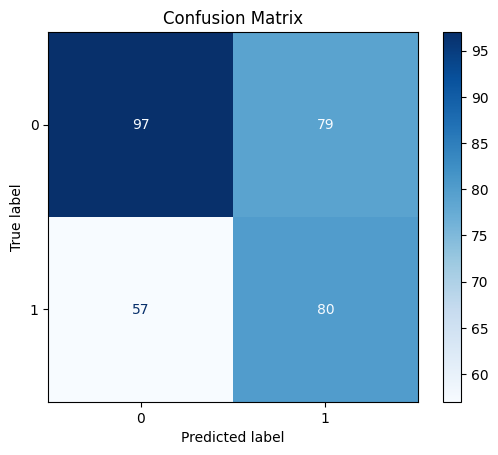

      Metric     Value
0    ROC AUC  0.558560
1       Gini  0.117120
2  Precision  0.503145
3     Recall  0.583942
4   F1 Score  0.540541
5   Accuracy  0.565495
Train


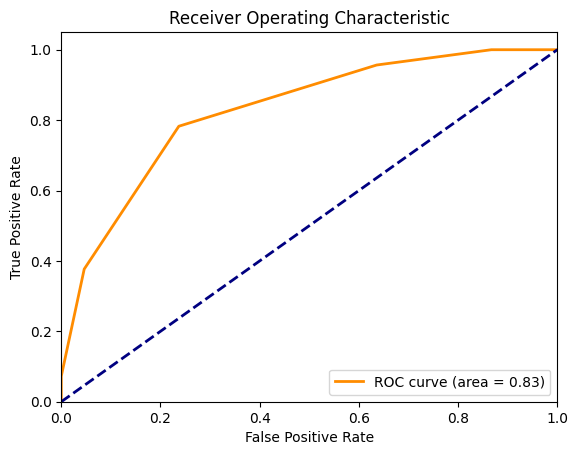

True Positives (TP): 108
True Negatives (TN): 132
False Positives (FP): 41
False Negatives (FN): 30
TPR: 0.782608695652174
FPR: 0.23699421965317918


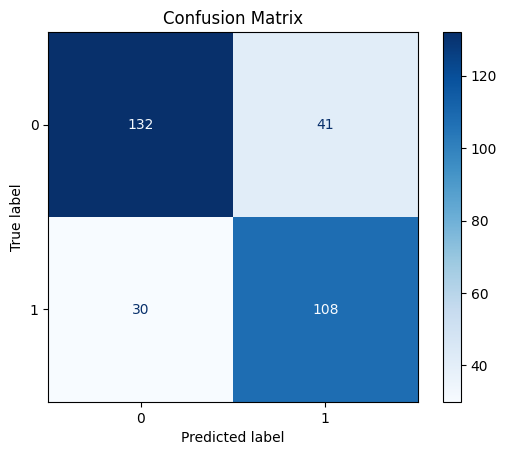

      Metric     Value
0    ROC AUC  0.826925
1       Gini  0.653849
2  Precision  0.724832
3     Recall  0.782609
4   F1 Score  0.752613
5   Accuracy  0.771704
['ewm_sales_week_3', 'may_holidays_period', 'new_year_holidays_period', 'pre_holiday', 'price_rolling_mean_2', 'price_rolling_mean_12', 'price_rolling_median_5', 'price_rolling_median_14', 'diff_1', 'price_rolling_mean_9', 'price_rolling_median_12', 'price_rolling_median_9', 'unit_price', 'not_working_day_next', 'diff_9', 'amount_rolling_mean_3', 'price_rolling_mean_3', 'price_rolling_mean_14', 'amount_rolling_median_9', 'price_rolling_mean_5', 'price_rolling_median_2', 'ewm_sales_week_7', 'price_rolling_median_3', 'price_rolling_mean_7', 'amount_rolling_mean_12', 'amount_rolling_median_12']


In [42]:
knn_features_old, knn_metr_old = find_best_features_old(KNeighborsClassifier(), True)

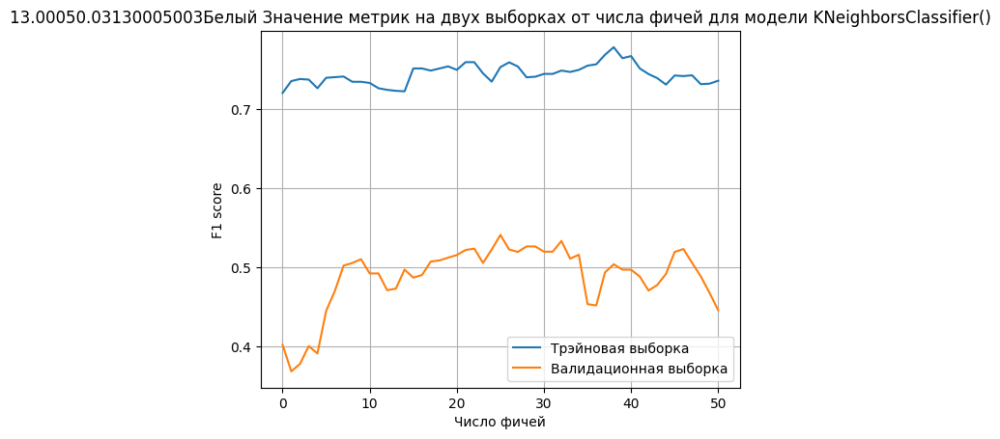

['ewm_sales_week_3', 'may_holidays_period', 'new_year_holidays_period', 'pre_holiday', 'price_rolling_mean_2', 'price_rolling_mean_12', 'price_rolling_median_5', 'price_rolling_median_14', 'diff_1', 'price_rolling_mean_9', 'price_rolling_median_12', 'price_rolling_median_9', 'unit_price', 'not_working_day_next', 'diff_9', 'amount_rolling_mean_3', 'price_rolling_mean_3', 'price_rolling_mean_14', 'amount_rolling_median_9', 'price_rolling_mean_5', 'price_rolling_median_2', 'ewm_sales_week_7', 'price_rolling_median_3', 'price_rolling_mean_7', 'amount_rolling_mean_12', 'amount_rolling_median_12']


In [40]:
knn_features_old, knn_metr_old = find_best_features_old(KNeighborsClassifier(), True)

**BAGGING**

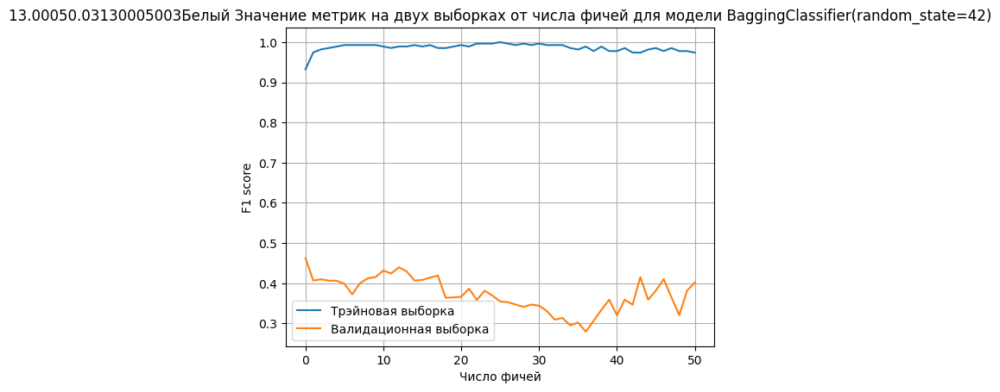

Crosvall


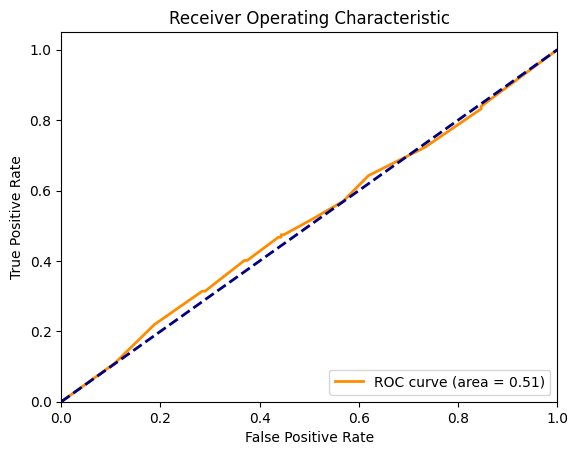

      Metric     Value
0    ROC AUC  0.509871
1       Gini  0.019741
2  Precision  0.451389
3     Recall  0.474453
4   F1 Score  0.462633
5   Accuracy  0.517572
Train


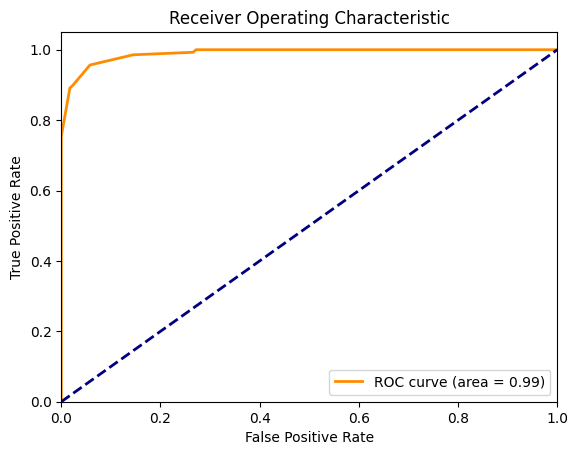

      Metric     Value
0    ROC AUC  0.989947
1       Gini  0.979894
2  Precision  0.968750
3     Recall  0.898551
4   F1 Score  0.932331
5   Accuracy  0.942122
['ewm_sales_week_3']


In [42]:
bag_features_old, bag_metr_old = find_best_features_old(BaggingClassifier(random_state=42), True)

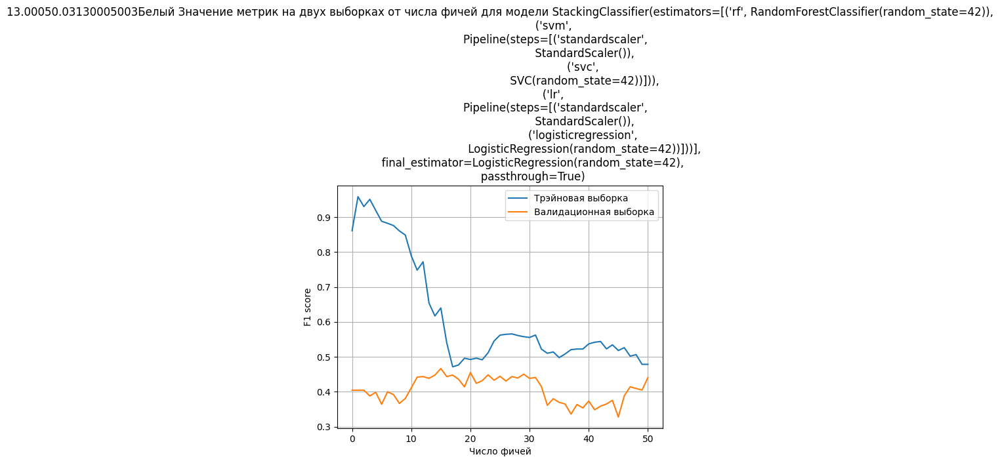

['price_rolling_mean_14', 'year', 'new_year_holidays_period', 'price_rolling_mean_12', 'amount_rolling_median_7', 'ewm_sales_week_14', 'amount_rolling_median_3', 'pre_holiday', 'may_holidays_period', 'ewm_sales_week_9', 'amount_rolling_mean_7', 'ewm_sales_week_7', 'amount_rolling_median_5', 'ewm_sales_week_3', 'amount_rolling_mean_3', 'price_rolling_mean_9']


In [107]:
rf = RandomForestClassifier(random_state=42)
svm = make_pipeline(StandardScaler(), SVC(random_state=42))
lr = make_pipeline(StandardScaler(), LogisticRegression(random_state=42))

estimators = [
    ('rf', rf),
    ('svm', svm),
    ('lr', lr)
]

clf = StackingClassifier(
    estimators=estimators,
    final_estimator=LogisticRegression(random_state=42),
    passthrough=True
)

stack_features_old, stack_metr_old = find_best_features_old(clf, True)

In [ ]:
wb_df_pumps = wb_df.copy()
wb_df_pumps['date_creation'] = pd.to_datetime(wb_df_pumps['date_creation'], format='%H:%M:%S %d.%m.%Y')
wb_df_pumps['day'] = pd.to_datetime(wb_df_pumps['date_creation'].dt.date)

def transform_amount(row):
    if '1000' in row['sku_name']:
        return row['amount'] * 1000
    elif '100' in row['sku_name']:
        return row['amount'] * 100
    else:
        return row['amount']

filtered_df = wb_df_pumps[wb_df_pumps['sku_name'].str.contains('Слюноотсос')]
filtered_df['amount'] = filtered_df.apply(transform_amount, axis=1)

result = filtered_df.groupby(['day']).agg({'amount': 'sum', 'unit_price': 'mean'}).reset_index()


full_date_range_tr = pd.date_range(start=pd.to_datetime(result['day'].min() - timedelta(1)), end=pd.to_datetime(result['day'].max() + timedelta(1)))
df_tr = pd.DataFrame(full_date_range_tr, columns=['day'])
result = pd.merge(df_tr, result, on='day', how='left')




result['amount'].fillna(0, inplace=True)
result['unit_price'] = result['unit_price'].fillna(method='ffill')
result['unit_price'].fillna(result['unit_price'].dropna().mean(), inplace=True)

cal = Russia()
    
holidays_2023 = cal.holidays(2023)
holidays_2024 = cal.holidays(2024)
holidays = holidays_2023 + holidays_2024
holiday_dates = [date for date, name in holidays]
result['is_holiday'] = result['day'].isin(holiday_dates).astype(int) | result['day'].dt.dayofweek.isin([5, 6]).astype(int)
    
result['had_sales'] = (result['amount'] > 0).astype(int).shift(1)
result['sales_increased'] = result['amount'].diff().fillna(0).apply(lambda x: 1 if x > 0 else 0).shift(1)
result['sales_decreased'] = result['amount'].diff().fillna(0).apply(lambda x: 1 if x < 0 else 0).shift(1)
    
result['diff_1'] = result['amount'].diff().fillna(0).shift(1)
result['diff_2'] = result['amount'].diff(periods=2).shift(1)
result['price_rolling_mean_2'] = result['unit_price'].rolling(window=2, min_periods=1).mean()
result['price_rolling_mean_7'] = result['unit_price'].rolling(window=7, min_periods=1).mean()
result['price_rolling_median_7'] = result['unit_price'].rolling(window=7, min_periods=1).mean()
    
result['amount_rolling_median_7'] = result['amount'].rolling(window=7, min_periods=1).median().shift(1)
result['amount_rolling_mean_2'] = result['amount'].rolling(window=2, min_periods=1).mean().shift(1)
result['amount_rolling_mean_7'] = result['amount'].rolling(window=7, min_periods=1).mean().shift(1)
result['amount_rolling_sum_7'] = result['amount'].rolling(window=7, min_periods=1).sum().shift(1)
result['ewm_sales_week'] = result['amount'].ewm(span=7, adjust=False).mean().shift(1)
result = result.dropna()

train_df = result.loc[((result['day'] >= st_date) & (result['day'] < fn_date))]
test_df =  result.loc[((result['day'] >= st_date_test) & (result['day'] < fn_date_test))]

In [ ]:
def sales_mask_grid_seach(cur_train, cur_test, features, model=XGBClassifier(n_estimators=200, random_state=421), print_flag=False):
    
    
    item_data = cur_train.copy()

    item_data_test = cur_test.copy()
    
    modeli = model()
    
    X_train_class = item_data[features]
    X_test_class = item_data_test[features]

    if X_train_class.ndim == 1:
        X_train_class = np.array(X_train_class).reshape(-1, 1)

    if X_test_class.ndim == 1:
        X_test_class = np.array(X_test_class).reshape(-1, 1)

    y_train_class = item_data['had_sales']
    y_test_class = item_data_test['had_sales']
    
    parameters = {'n_estimators':[200, 1000], 'min_samples_split':[2, 10], 'min_samples_leaf':[1, 10]}
    
    binary_clf = GridSearchCV(modeli, parameters)
    
    binary_clf.fit(X_train_class, y_train_class)
    print(binary_clf.best_params_)
    grid_search_model = model(n_estimators = binary_clf.best_params_['n_estimators'], min_samples_split = binary_clf.best_params_['min_samples_split'], min_samples_leaf = binary_clf.best_params_['min_samples_leaf'])
    grid_search_model.fit(X_train_class, y_train_class)
    y_pred_class = grid_search_model.predict(X_test_class)  
    balanced_acc = balanced_accuracy_score(y_test_class, y_pred_class)
    f1 = f1_score(y_test_class, y_pred_class)
    
    if print_flag:
        plt.figure(figsize=(30, 15))
        plot_tree(grid_search_model, feature_names=features, filled=True, rounded=True, fontsize=10)
        plt.title("Decision Tree Classifier", fontsize=16)
        plt.show()

    return y_pred_class, [balanced_acc, f1] 
    

In [34]:
def find_best_params(objective, n_trials=50):
    optuna.logging.set_verbosity(optuna.logging.WARNING)
    study = optuna.create_study(direction='maximize')
    study.optimize(objective, n_trials)
    optuna.visualization.plot_optimization_history(study).show()
    optuna.visualization.plot_param_importances(study).show()
    
    print('Best trial:')
    trial = study.best_trial

    print('  Value: {}'.format(trial.value))
    print('  Params: ')
    for key, value in trial.params.items():
        print('    {}: {}'.format(key, value))
    
    return trial.params

In [35]:
def evaluate(clf, features):
    cur_train, cur_val, useless_features = make_df(item_id, st_date, fn_date, st_date_test, fn_date_test)
    z, _ = sales_mask(cur_train, cur_val, features, model=clf, print_flag=True)

    return _

In [36]:
def rf_objective(trial):
    n_estimators = 100
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 10)
    max_features = trial.suggest_int('max_features', 1, len(rf_features) + 1)
    cur_train, cur_test, _ = make_df(item_id, st_date, fn_date, st_date_test, fn_date_test)
    clf = RandomForestClassifier(
        n_estimators=n_estimators,
        min_samples_leaf=min_samples_leaf,
        max_features=max_features,
        random_state=42
    )
    cur_train, cur_val, useless_features = make_df(item_id, st_date, fn_date, st_date_test, fn_date_test)
    z, _ = sales_mask(cur_train, cur_val, rf_features, model=clf, print_flag=False)

    return _[1]

In [37]:
def log_objective(trial):
    C = trial.suggest_float('C', 1e-6, 1e3, log=True)
    solver = trial.suggest_categorical('solver', ['lbfgs', 'saga', 'liblinear'])
    if solver == 'saga':
        l1_ratio = trial.suggest_float('l1_ratio', 0.0, 1.0)
    else:
        l1_ratio = None

    clf = LogisticRegression(
        C=C,
        solver=solver,
        l1_ratio=l1_ratio,
        max_iter=1000,
        random_state=42
    )

    cur_train, cur_val, useless_features = make_df(item_id, st_date, fn_date, st_date_test, fn_date_test)
    z, _ = sales_mask(cur_train, cur_val, log_features, model=clf, print_flag=False)

    return _[1]

In [38]:
def tree_objective(trial):
    max_depth = trial.suggest_int('max_depth', 1, 30)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 20)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 20)
    max_features = trial.suggest_int('max_features', 1, len(tree_features) + 1)
    
    clf = DecisionTreeClassifier(
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        max_features=max_features,
        random_state=42
    )
    cur_train, cur_val, useless_features = make_df(item_id, st_date, fn_date, st_date_test, fn_date_test)
    z, _ = sales_mask(cur_train, cur_val, tree_features, model=clf, print_flag=False)

    return _[1]

In [39]:
def svm_objective(trial):
    svm_C = trial.suggest_float('svm_C', 0.01, 10.0, log=True)
    svm_kernel = trial.suggest_categorical('svm_kernel', ['linear', 'poly', 'rbf', 'sigmoid'])
    
    svm = make_pipeline(StandardScaler(), SVC(C=svm_C, kernel=svm_kernel, probability=True, random_state=42))
    
    cur_train, cur_val, useless_features = make_df(item_id, st_date, fn_date, st_date_test, fn_date_test)
    z, _ = sales_mask(cur_train, cur_val, svm_features, model=svm, print_flag=False)

    return _[1]

[0.38016528925619836, 0.4685314685314685, 0.4366197183098592, 0.25263157894736843]


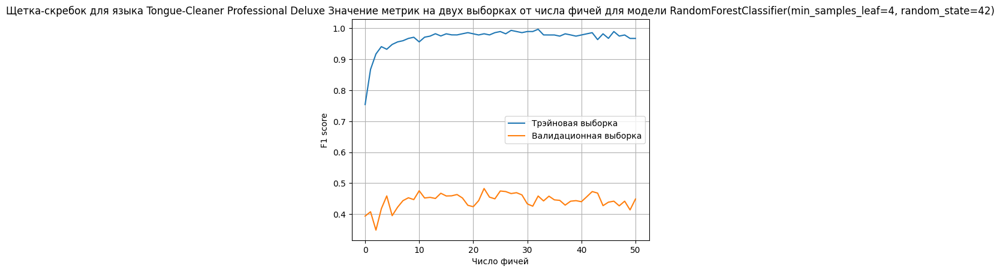

Crosvall
True Positives (TP): 63
True Negatives (TN): 115
False Positives (FP): 61
False Negatives (FN): 74
TPR: 0.45985401459854014
FPR: 0.3465909090909091
Presicion = TP / (TP + FP) = 63 / (63 + 61) = 63 / 124 = 0.5080645161290323
Recall = TP / (TP + FN) = 63 / (63 + 74) = 63 / 137 = 0.45985401459854014
F1 score = 2 * precision * recall / (precision + recall) = 0.4827586206896552


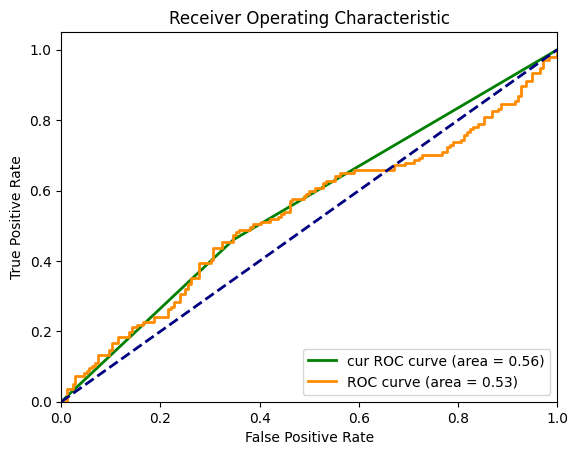

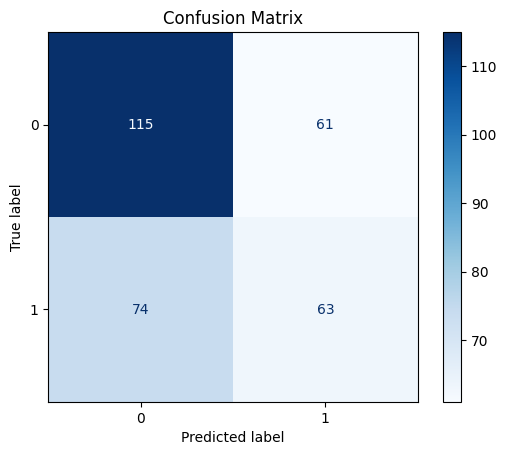

      Metric     Value
0    ROC AUC  0.532764
1       Gini  0.065528
2  Precision  0.508065
3     Recall  0.459854
4   F1 Score  0.482759
5   Accuracy  0.568690
Train


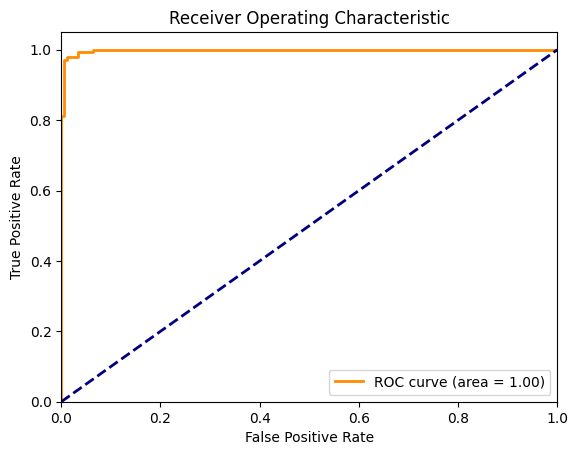

True Positives (TP): 135
True Negatives (TN): 171
False Positives (FP): 2
False Negatives (FN): 3
TPR: 0.9782608695652174
FPR: 0.011560693641618497


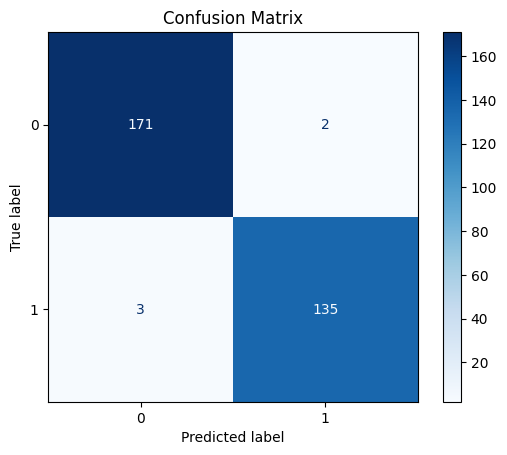

      Metric     Value
0    ROC AUC  0.998031
1       Gini  0.996063
2  Precision  0.985401
3     Recall  0.978261
4   F1 Score  0.981818
5   Accuracy  0.983923
['ewm_sales_week_3', 'price_rolling_mean_12', 'ewm_sales_week_14', 'amount_rolling_mean_7', 'price_rolling_mean_2', 'day_num', 'ewm_sales_week_7', 'price_rolling_mean_7', 'diff_14', 'price_rolling_mean_5', 'diff_9', 'amount_rolling_mean_14', 'diff_2', 'diff_1', 'price_rolling_median_14', 'diff_5', 'pre_holiday', 'is_holiday', 'price_rolling_mean_9', 'amount_rolling_mean_2', 'amount_rolling_mean_5', 'may_holidays_period', 'price_rolling_mean_14']


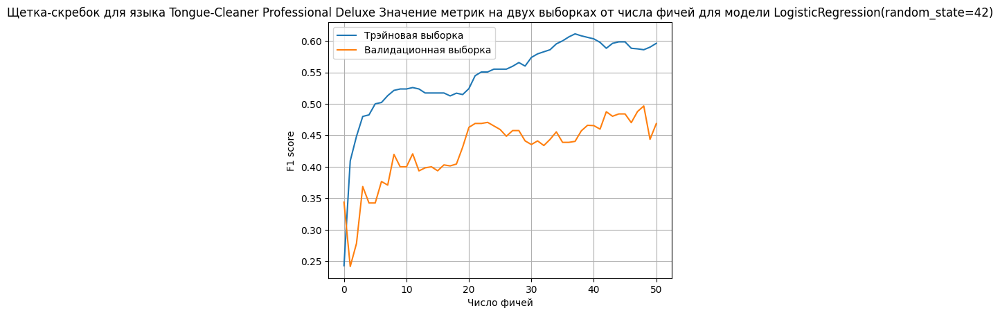

Crosvall
True Positives (TP): 73
True Negatives (TN): 92
False Positives (FP): 84
False Negatives (FN): 64
TPR: 0.5328467153284672
FPR: 0.4772727272727273
Presicion = TP / (TP + FP) = 73 / (73 + 84) = 73 / 157 = 0.46496815286624205
Recall = TP / (TP + FN) = 73 / (73 + 64) = 73 / 137 = 0.5328467153284672
F1 score = 2 * precision * recall / (precision + recall) = 0.4965986394557823


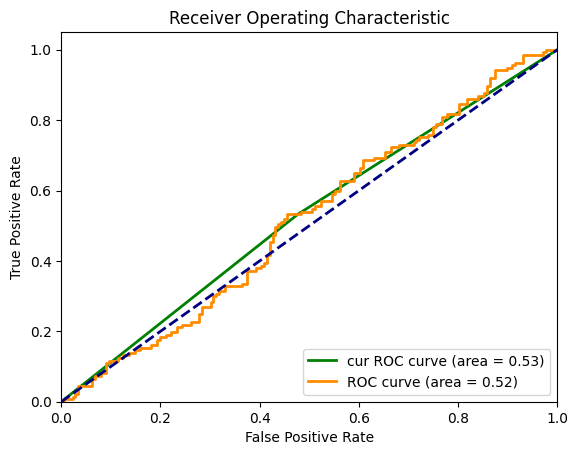

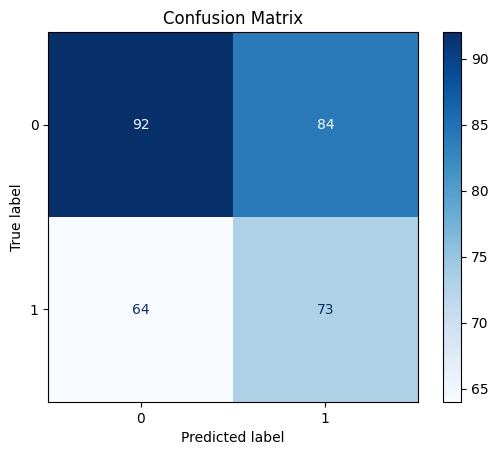

      Metric     Value
0    ROC AUC  0.517543
1       Gini  0.035086
2  Precision  0.464968
3     Recall  0.532847
4   F1 Score  0.496599
5   Accuracy  0.527157
Train


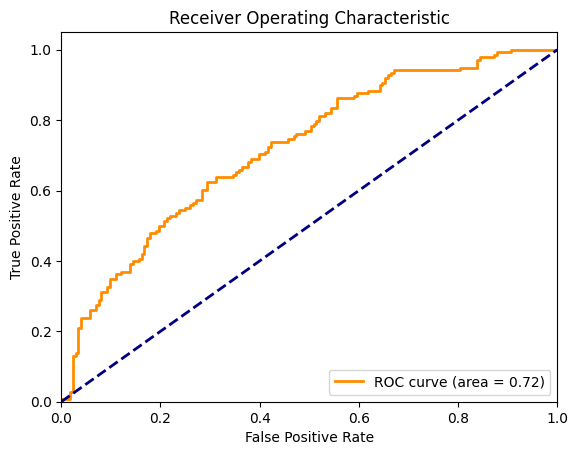

True Positives (TP): 75
True Negatives (TN): 130
False Positives (FP): 43
False Negatives (FN): 63
TPR: 0.5434782608695652
FPR: 0.24855491329479767


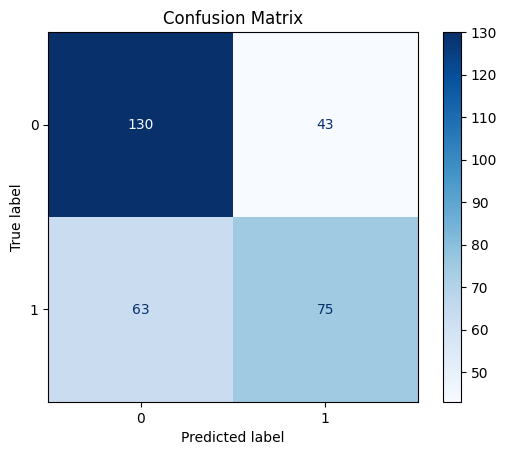

      Metric     Value
0    ROC AUC  0.720700
1       Gini  0.441401
2  Precision  0.635593
3     Recall  0.543478
4   F1 Score  0.585938
5   Accuracy  0.659164
['amount_rolling_mean_14', 'price_rolling_median_3', 'not_working_day_next', 'price_rolling_mean_5', 'may_holidays_period', 'new_year_holidays_period', 'amount_rolling_mean_7', 'ewm_sales_week_3', 'year', 'amount_rolling_mean_12', 'price_rolling_mean_3', 'price_rolling_mean_2', 'diff_12', 'price_rolling_median_2', 'amount_rolling_mean_5', 'unit_price', 'price_rolling_median_9', 'price_rolling_median_12', 'price_rolling_median_7', 'diff_9', 'amount_rolling_median_3', 'price_rolling_mean_14', 'price_rolling_median_5', 'price_rolling_mean_7', 'price_rolling_median_14', 'price_rolling_mean_9', 'diff_5', 'amount_rolling_median_5', 'price_rolling_mean_12', 'amount_rolling_median_7', 'ewm_sales_week_14', 'amount_rolling_median_14', 'diff_1', 'not_working_day_prev', 'amount_rolling_median_9', 'amount_rolling_mean_9', 'day_num', 'ewm_sa

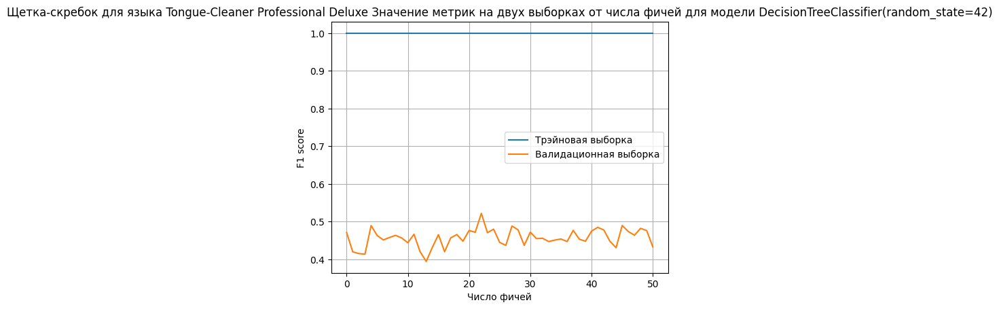

Crosvall
True Positives (TP): 78
True Negatives (TN): 92
False Positives (FP): 84
False Negatives (FN): 59
TPR: 0.5693430656934306
FPR: 0.4772727272727273
Presicion = TP / (TP + FP) = 78 / (78 + 84) = 78 / 162 = 0.48148148148148145
Recall = TP / (TP + FN) = 78 / (78 + 59) = 78 / 137 = 0.5693430656934306
F1 score = 2 * precision * recall / (precision + recall) = 0.5217391304347826


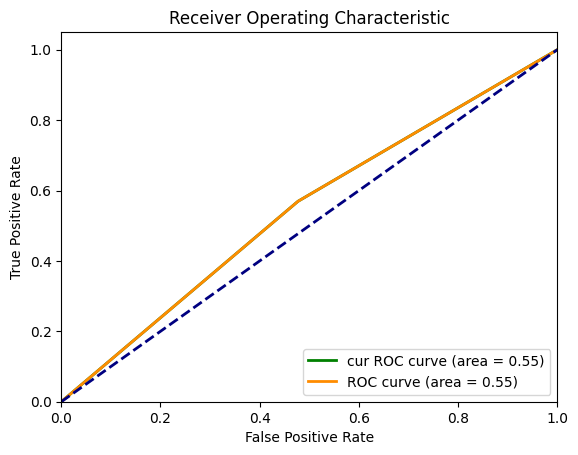

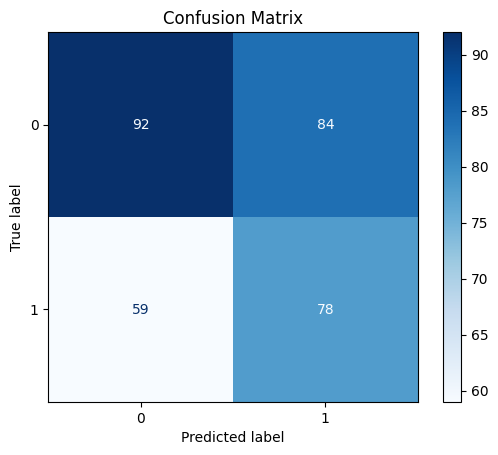

      Metric     Value
0    ROC AUC  0.546035
1       Gini  0.092070
2  Precision  0.481481
3     Recall  0.569343
4   F1 Score  0.521739
5   Accuracy  0.543131
Train


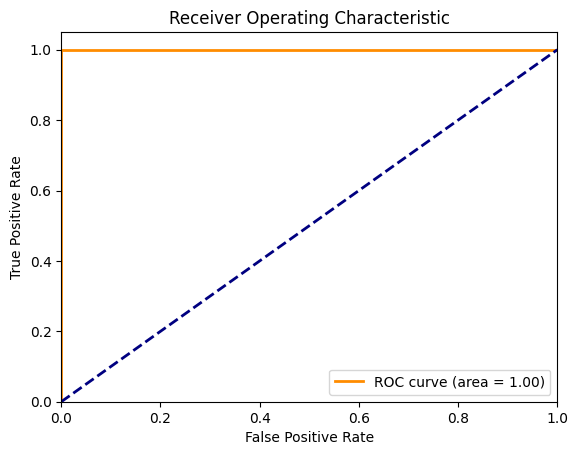

True Positives (TP): 138
True Negatives (TN): 173
False Positives (FP): 0
False Negatives (FN): 0
TPR: 1.0
FPR: 0.0


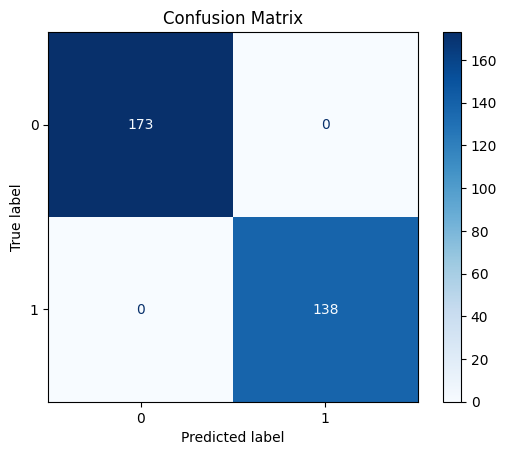

      Metric  Value
0    ROC AUC    1.0
1       Gini    1.0
2  Precision    1.0
3     Recall    1.0
4   F1 Score    1.0
5   Accuracy    1.0
['ewm_sales_week_7', 'unit_price', 'not_working_day', 'pre_holiday', 'not_working_day_prev', 'not_working_day_next', 'new_year_holidays_period', 'may_holidays_period', 'is_holiday', 'diff_1', 'diff_2', 'diff_3', 'diff_5', 'diff_7', 'diff_9', 'diff_12', 'diff_14', 'price_rolling_mean_2', 'price_rolling_mean_3', 'price_rolling_mean_5', 'price_rolling_mean_7', 'price_rolling_mean_9', 'price_rolling_mean_12']


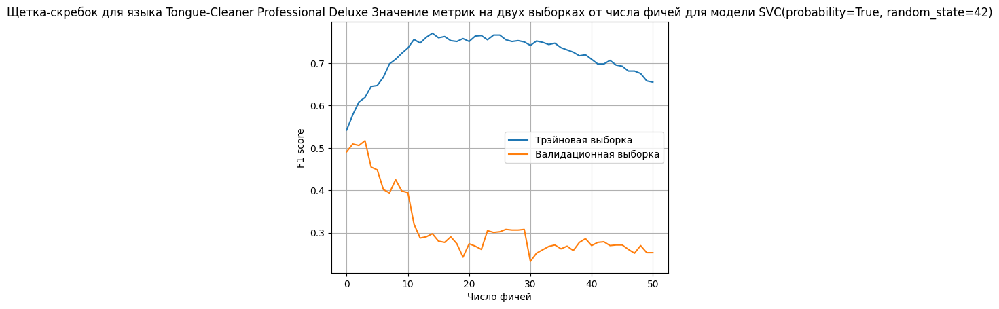

Crosvall
True Positives (TP): 69
True Negatives (TN): 115
False Positives (FP): 61
False Negatives (FN): 68
TPR: 0.5036496350364964
FPR: 0.3465909090909091
Presicion = TP / (TP + FP) = 69 / (69 + 61) = 69 / 130 = 0.5307692307692308
Recall = TP / (TP + FN) = 69 / (69 + 68) = 69 / 137 = 0.5036496350364964
F1 score = 2 * precision * recall / (precision + recall) = 0.5168539325842697


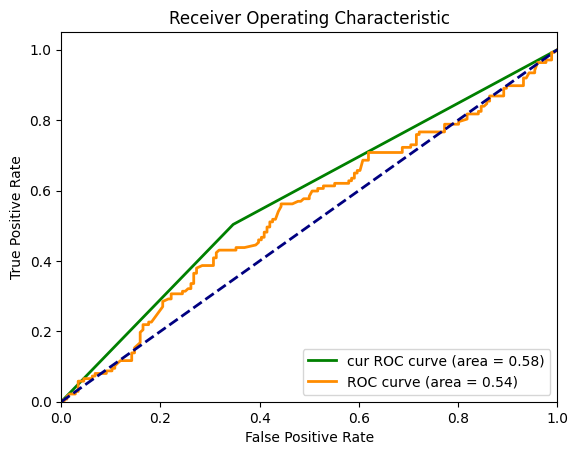

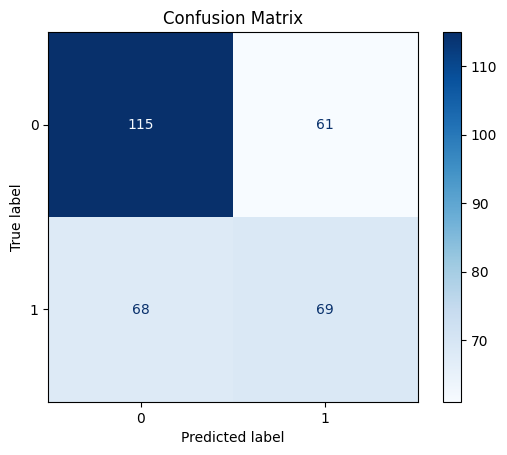

      Metric     Value
0    ROC AUC  0.538674
1       Gini  0.077347
2  Precision  0.530769
3     Recall  0.503650
4   F1 Score  0.516854
5   Accuracy  0.587859
Train


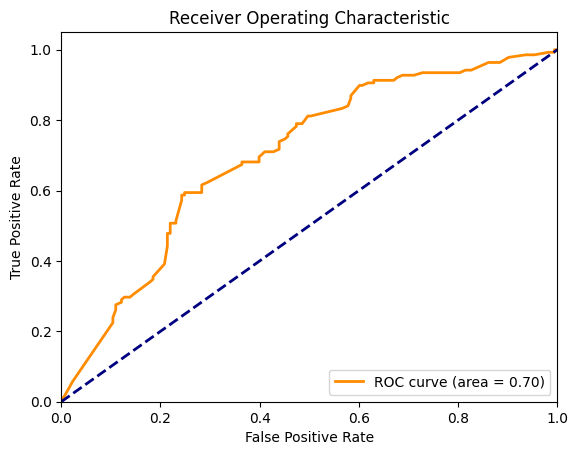

True Positives (TP): 82
True Negatives (TN): 128
False Positives (FP): 45
False Negatives (FN): 56
TPR: 0.5942028985507246
FPR: 0.26011560693641617


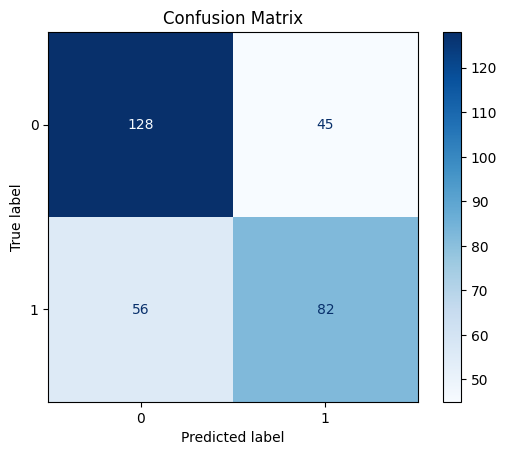

      Metric     Value
0    ROC AUC  0.700616
1       Gini  0.401231
2  Precision  0.645669
3     Recall  0.594203
4   F1 Score  0.618868
5   Accuracy  0.675241
['diff_5', 'diff_2', 'is_holiday', 'amount_rolling_median_9']


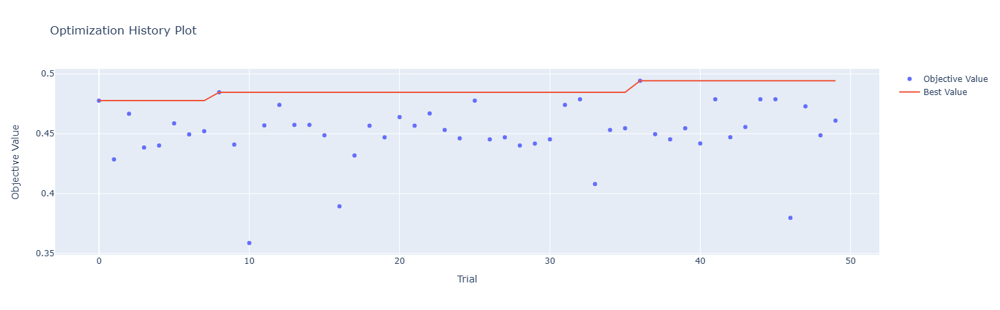

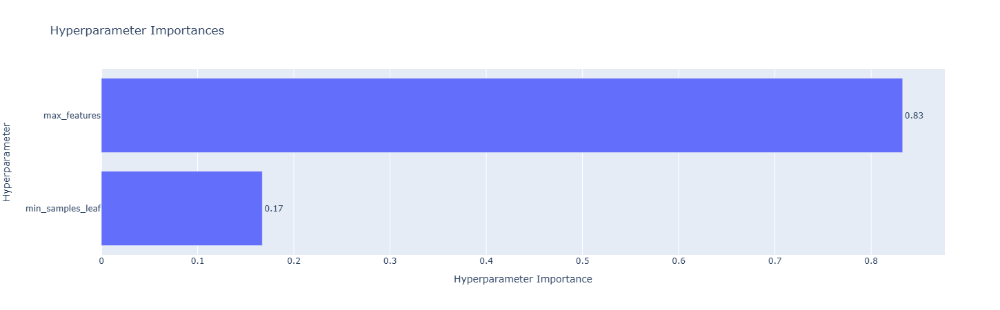

Best trial:
  Value: 0.4942084942084942
  Params: 
    min_samples_leaf: 7
    max_features: 8


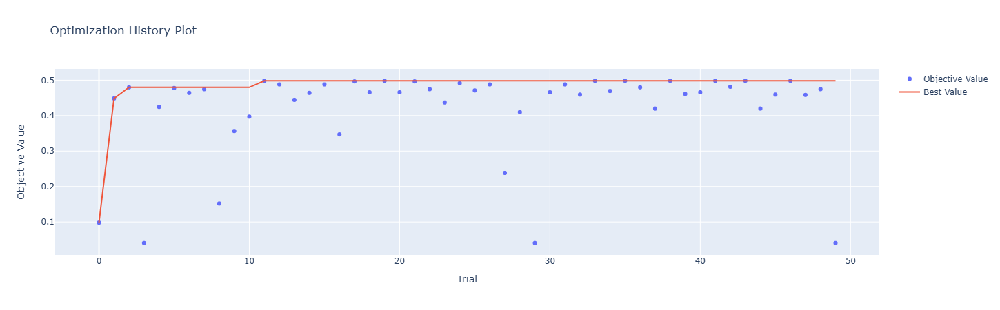

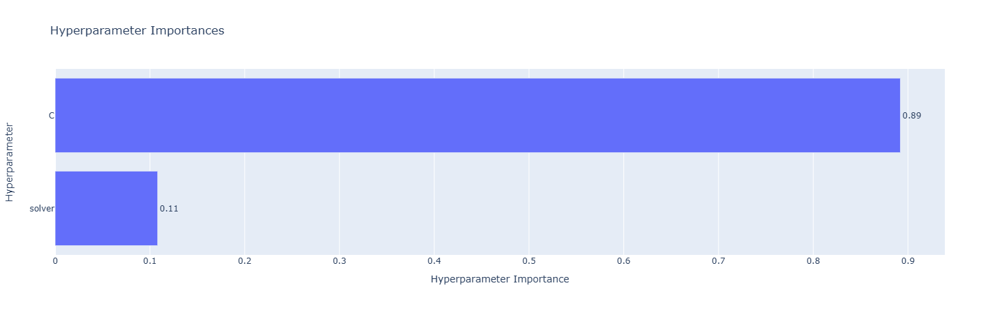

Best trial:
  Value: 0.4983164983164984
  Params: 
    C: 1.6174306532632736
    solver: saga
    l1_ratio: 0.5815958815436761


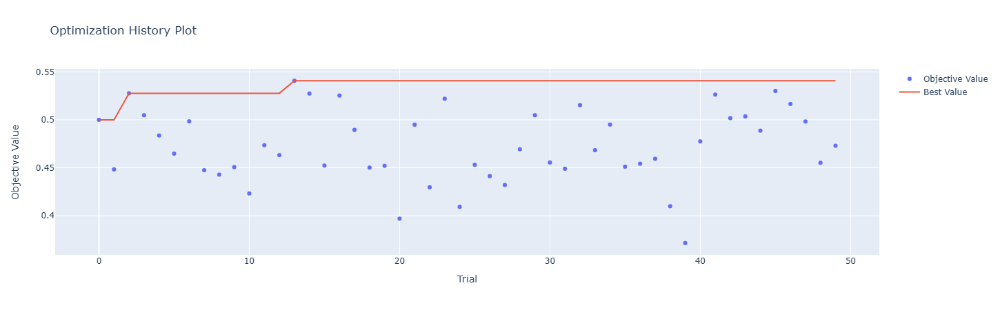

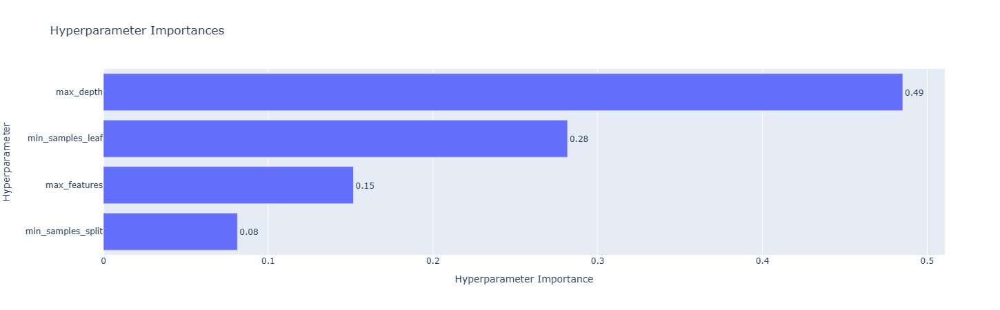

Best trial:
  Value: 0.5407166123778501
  Params: 
    max_depth: 21
    min_samples_split: 9
    min_samples_leaf: 2
    max_features: 15


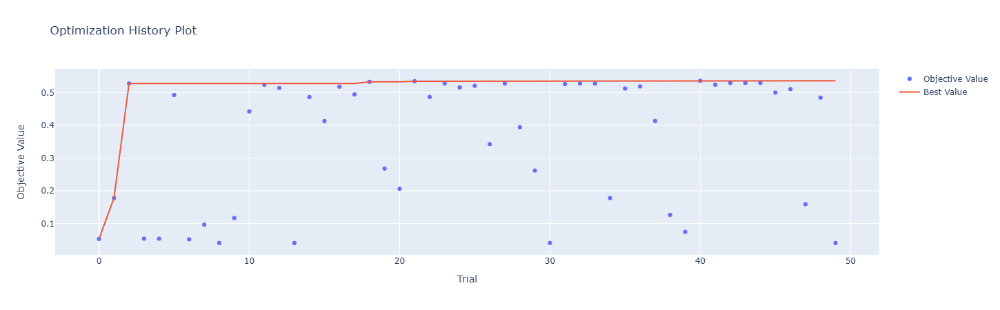

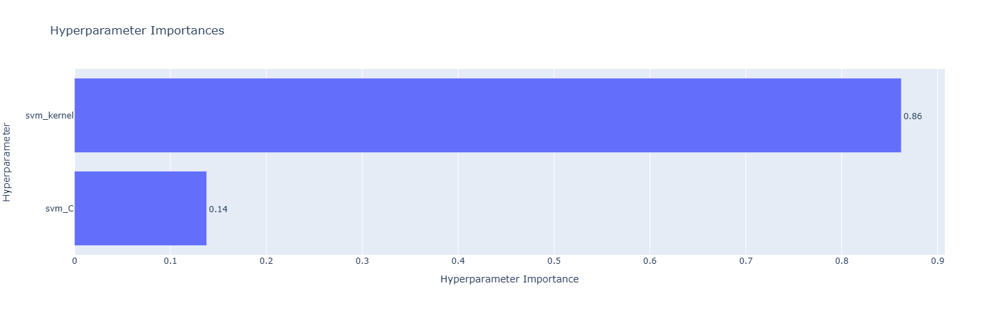

Best trial:
  Value: 0.536082474226804
  Params: 
    svm_C: 6.696178453776117
    svm_kernel: rbf
True Positives (TP): 64
True Negatives (TN): 118
False Positives (FP): 58
False Negatives (FN): 73
TPR: 0.46715328467153283
FPR: 0.32954545454545453
Presicion = TP / (TP + FP) = 64 / (64 + 58) = 64 / 122 = 0.5245901639344263
Recall = TP / (TP + FN) = 64 / (64 + 73) = 64 / 137 = 0.46715328467153283
F1 score = 2 * precision * recall / (precision + recall) = 0.4942084942084942


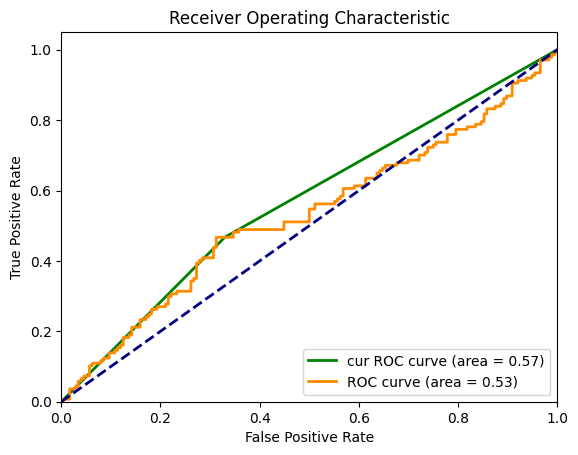

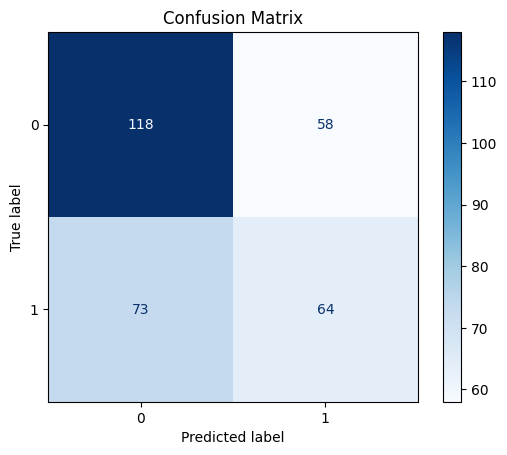

      Metric     Value
0    ROC AUC  0.528596
1       Gini  0.057191
2  Precision  0.524590
3     Recall  0.467153
4   F1 Score  0.494208
5   Accuracy  0.581470
True Positives (TP): 74
True Negatives (TN): 90
False Positives (FP): 86
False Negatives (FN): 63
TPR: 0.5401459854014599
FPR: 0.48863636363636365
Presicion = TP / (TP + FP) = 74 / (74 + 86) = 74 / 160 = 0.4625
Recall = TP / (TP + FN) = 74 / (74 + 63) = 74 / 137 = 0.5401459854014599
F1 score = 2 * precision * recall / (precision + recall) = 0.4983164983164984


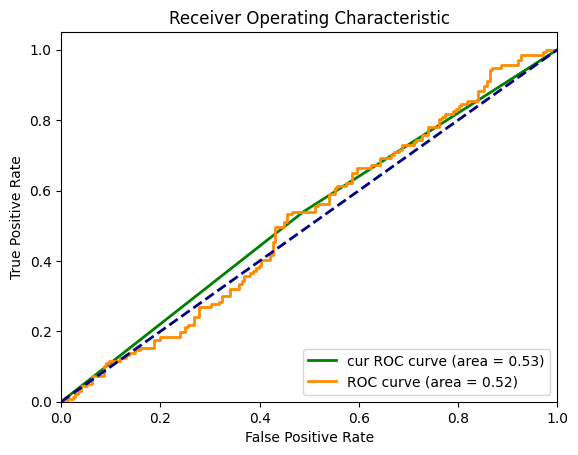

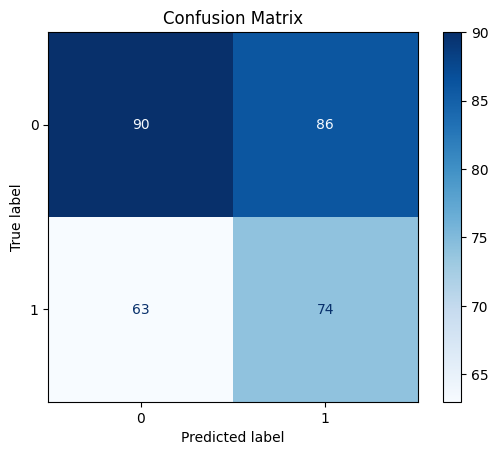

      Metric     Value
0    ROC AUC  0.516175
1       Gini  0.032349
2  Precision  0.462500
3     Recall  0.540146
4   F1 Score  0.498316
5   Accuracy  0.523962
True Positives (TP): 83
True Negatives (TN): 89
False Positives (FP): 87
False Negatives (FN): 54
TPR: 0.6058394160583942
FPR: 0.4943181818181818
Presicion = TP / (TP + FP) = 83 / (83 + 87) = 83 / 170 = 0.48823529411764705
Recall = TP / (TP + FN) = 83 / (83 + 54) = 83 / 137 = 0.6058394160583942
F1 score = 2 * precision * recall / (precision + recall) = 0.5407166123778501


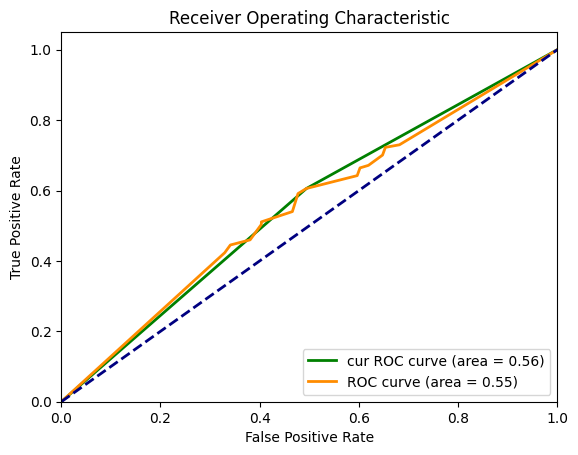

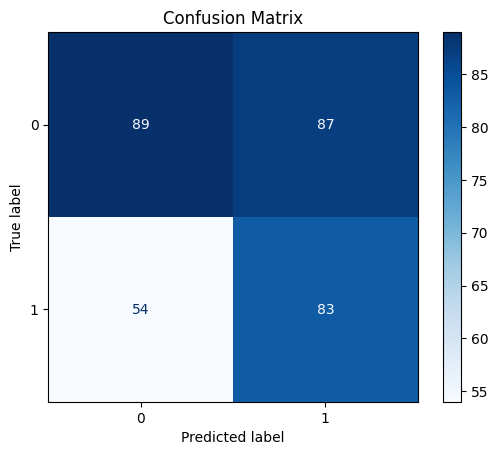

      Metric     Value
0    ROC AUC  0.551427
1       Gini  0.102853
2  Precision  0.488235
3     Recall  0.605839
4   F1 Score  0.540717
5   Accuracy  0.549521
True Positives (TP): 78
True Negatives (TN): 100
False Positives (FP): 76
False Negatives (FN): 59
TPR: 0.5693430656934306
FPR: 0.4318181818181818
Presicion = TP / (TP + FP) = 78 / (78 + 76) = 78 / 154 = 0.5064935064935064
Recall = TP / (TP + FN) = 78 / (78 + 59) = 78 / 137 = 0.5693430656934306
F1 score = 2 * precision * recall / (precision + recall) = 0.536082474226804


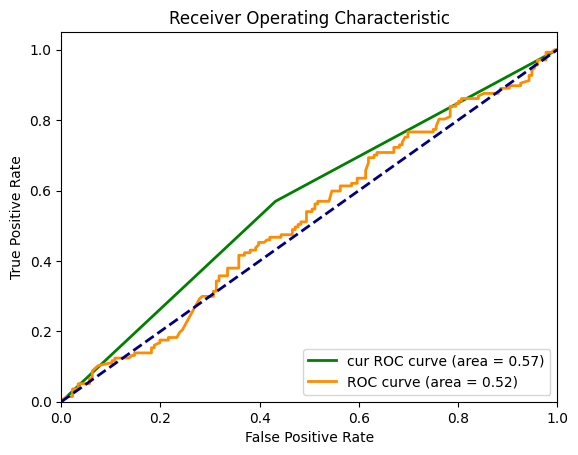

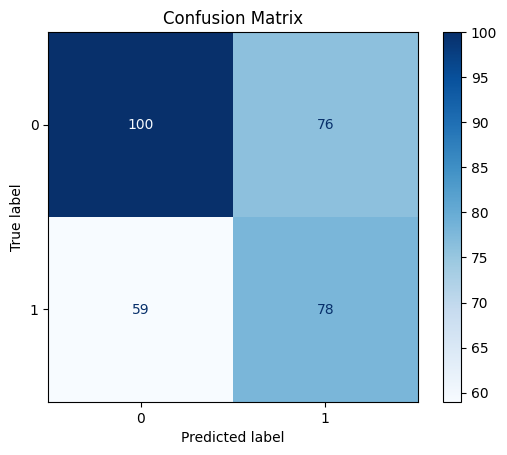

      Metric     Value
0    ROC AUC  0.518559
1       Gini  0.037118
2  Precision  0.506494
3     Recall  0.569343
4   F1 Score  0.536082
5   Accuracy  0.568690
Результат для Щетка-скребок для языка Tongue-Cleaner Professional Deluxe


,Model,Standart Features,Best features,Bset Features and Hyperparameters
0,RandomForest,0.380165,0.482759,"[0.5688039150630391, 0.4942084942084942]"
1,LogReg,0.468531,0.496599,"[0.525754810882548, 0.4983164983164984]"
2,Tree,0.436620,0.521739,"[0.5557606171201062, 0.5407166123778501]"
3,SVM,0.252632,0.516854,"[0.5687624419376245, 0.536082474226804]"


In [74]:
for idx in ['13.00050.03130005003Белый']:
    item_id = wb_df[wb_df['sku_id'] == idx]['sku_name'].unique()[0]
    cur_train, cur_val, useless_features = make_df(item_id, st_date, fn_date, st_date_test, fn_date_test)
    useless_features = np.delete(useless_features[2:], 8) 
    model_array = []
    model_array.append(RandomForestClassifier(min_samples_leaf=10, random_state=42))
    model_array.append(LogisticRegression(random_state=42))
    model_array.append(DecisionTreeClassifier(random_state=42))
    model_array.append(SVC(random_state=42, probability=True))
    first_iter_metrics = []
    for i in range(4):
        z, _ = sales_mask(cur_train, cur_val, useless_features, model=model_array[i], print_flag=False)
        first_iter_metrics.append(_[1])
    print(first_iter_metrics)
    rf_features, rf_metr = give_rf_features(item_id)
    log_features, log_metr = give_log_features(item_id)
    tree_features, tree_metr = give_tree_features(item_id)
    svm_features, svm_metr = give_svm_features(item_id)
    
    second_iter_metrics = [rf_metr, log_metr, tree_metr, svm_metr]
    
    rf_best_params = find_best_params(rf_objective, 50)
    log_best_params = find_best_params(log_objective, 50)
    tree_best_params = find_best_params(tree_objective, 50)
    svm_best_params = find_best_params(svm_objective, 50)
    
    model_1 = RandomForestClassifier(
        min_samples_leaf=rf_best_params['min_samples_leaf'],
        max_features=rf_best_params['max_features'],
        random_state=42
        )
    
    model_2 = LogisticRegression(
        C = log_best_params['C'],
        solver=log_best_params['solver'],
        max_iter=1000,
        random_state=42
        )
    
    model_3 =  DecisionTreeClassifier(
        max_depth=tree_best_params['max_depth'],
        min_samples_split=tree_best_params['min_samples_split'],
        min_samples_leaf=tree_best_params['min_samples_leaf'],
        max_features=tree_best_params['max_features'],
        random_state=42
        )
    
    model_4 = SVC(C=svm_best_params['svm_C'], kernel=svm_best_params['svm_kernel'], probability=True, random_state=42)
    
    rf_metr_upd = evaluate(model_1, rf_features)
    log_metr_upd = evaluate(model_2, log_features)
    tree_metr_upd = evaluate(model_3, tree_features)
    svm_metr_upd = evaluate(model_4, svm_features)
    
    third_iter_metrics = [rf_metr_upd, log_metr_upd, tree_metr_upd, svm_metr_upd]
    result = {
            "Model": ["RandomForest", "LogReg", "Tree", "SVM"],
            "Standart Features" : first_iter_metrics,
            "Best features" : second_iter_metrics,
            "Bset Features and Hyperparameters" : third_iter_metrics
    }
    print(f"Результат для {item_id}")
    result = pd.DataFrame(result)
    from IPython.display import display
    display(result)

[0.40963855421686746, 0.4685314685314685, 0.4366197183098592, 0.25263157894736843]


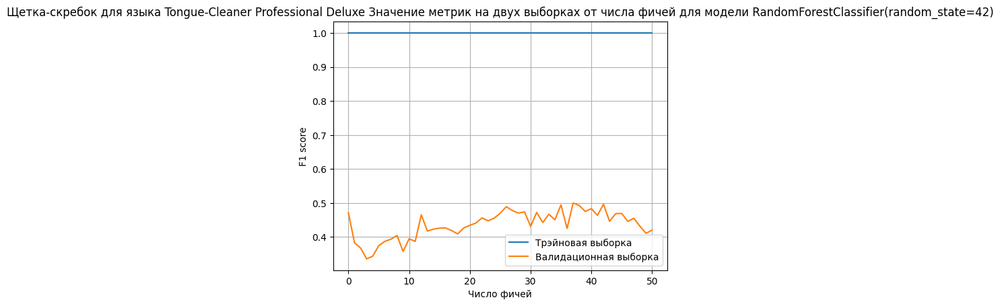

Crosvall
True Positives (TP): 69
True Negatives (TN): 106
False Positives (FP): 70
False Negatives (FN): 68
TPR: 0.5036496350364964
FPR: 0.3977272727272727
Presicion = TP / (TP + FP) = 69 / (69 + 70) = 69 / 139 = 0.49640287769784175
Recall = TP / (TP + FN) = 69 / (69 + 68) = 69 / 137 = 0.5036496350364964
F1 score = 2 * precision * recall / (precision + recall) = 0.5


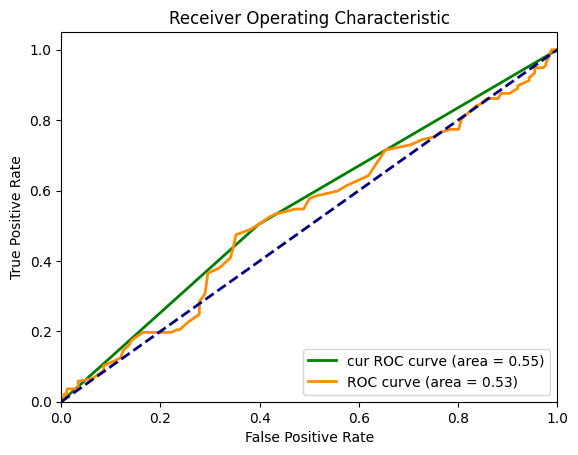

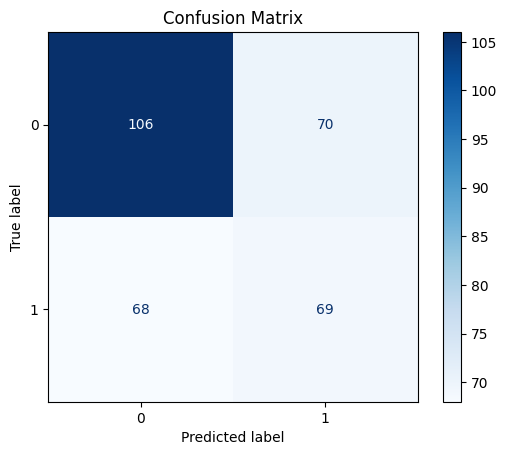

      Metric     Value
0    ROC AUC  0.526750
1       Gini  0.053500
2  Precision  0.496403
3     Recall  0.503650
4   F1 Score  0.500000
5   Accuracy  0.559105
Train


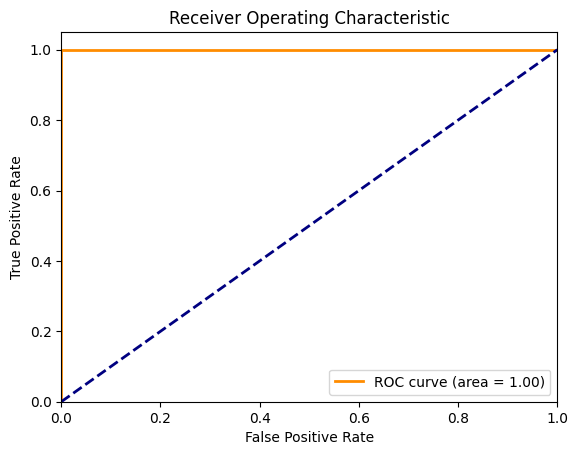

True Positives (TP): 138
True Negatives (TN): 173
False Positives (FP): 0
False Negatives (FN): 0
TPR: 1.0
FPR: 0.0


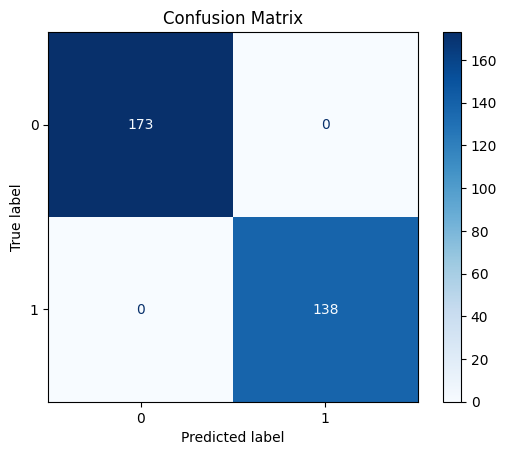

      Metric  Value
0    ROC AUC    1.0
1       Gini    1.0
2  Precision    1.0
3     Recall    1.0
4   F1 Score    1.0
5   Accuracy    1.0
['ewm_sales_week_7', 'unit_price', 'not_working_day', 'pre_holiday', 'not_working_day_prev', 'not_working_day_next', 'new_year_holidays_period', 'may_holidays_period', 'is_holiday', 'diff_1', 'diff_2', 'diff_3', 'diff_5', 'diff_7', 'diff_9', 'diff_12', 'diff_14', 'price_rolling_mean_2', 'price_rolling_mean_3', 'price_rolling_mean_5', 'price_rolling_mean_7', 'price_rolling_mean_9', 'price_rolling_mean_12', 'price_rolling_mean_14', 'amount_rolling_mean_2', 'amount_rolling_mean_3', 'amount_rolling_mean_5', 'amount_rolling_mean_7', 'amount_rolling_mean_9', 'amount_rolling_mean_12', 'amount_rolling_mean_14', 'price_rolling_median_2', 'price_rolling_median_3', 'price_rolling_median_5', 'price_rolling_median_7', 'price_rolling_median_9', 'price_rolling_median_12', 'price_rolling_median_14']


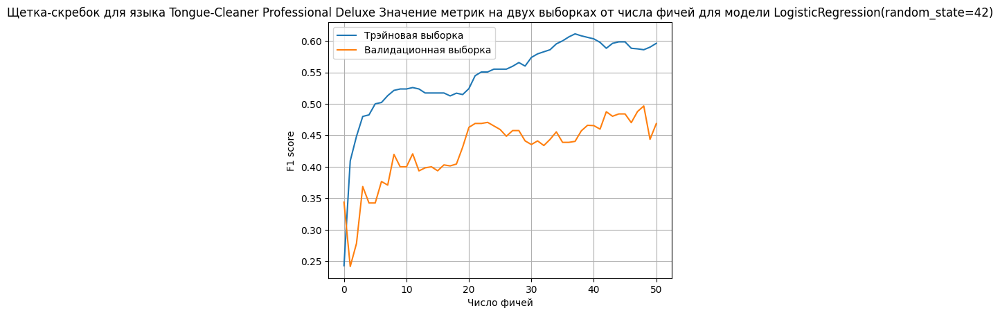

Crosvall
True Positives (TP): 73
True Negatives (TN): 92
False Positives (FP): 84
False Negatives (FN): 64
TPR: 0.5328467153284672
FPR: 0.4772727272727273
Presicion = TP / (TP + FP) = 73 / (73 + 84) = 73 / 157 = 0.46496815286624205
Recall = TP / (TP + FN) = 73 / (73 + 64) = 73 / 137 = 0.5328467153284672
F1 score = 2 * precision * recall / (precision + recall) = 0.4965986394557823


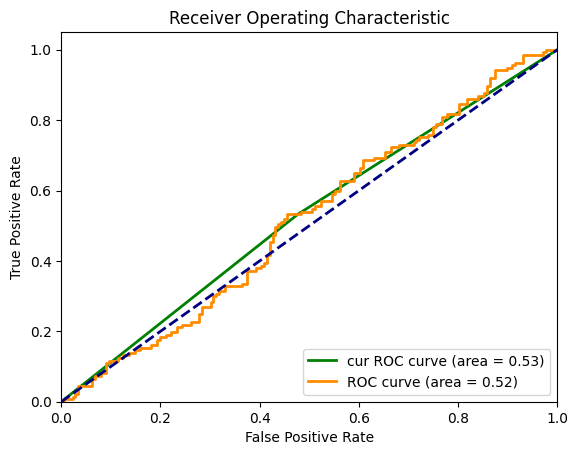

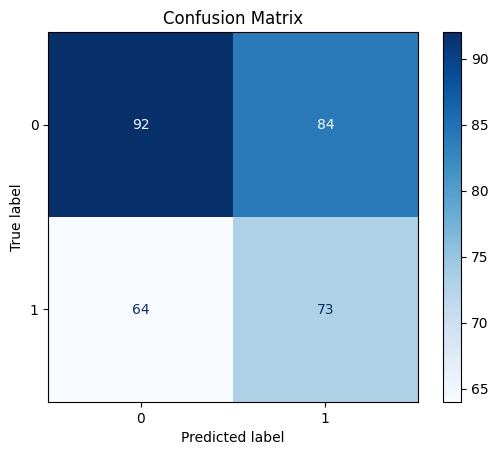

      Metric     Value
0    ROC AUC  0.517543
1       Gini  0.035086
2  Precision  0.464968
3     Recall  0.532847
4   F1 Score  0.496599
5   Accuracy  0.527157
Train


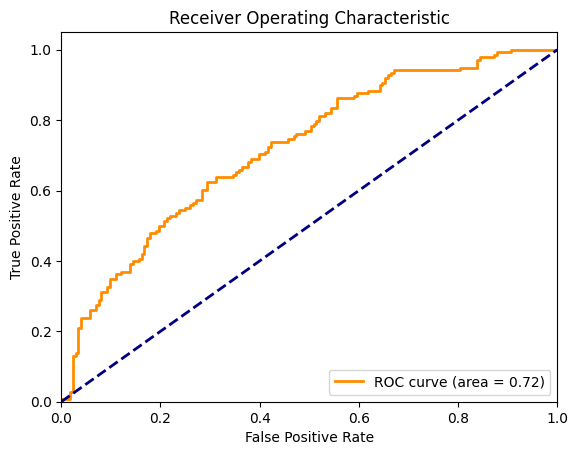

True Positives (TP): 75
True Negatives (TN): 130
False Positives (FP): 43
False Negatives (FN): 63
TPR: 0.5434782608695652
FPR: 0.24855491329479767


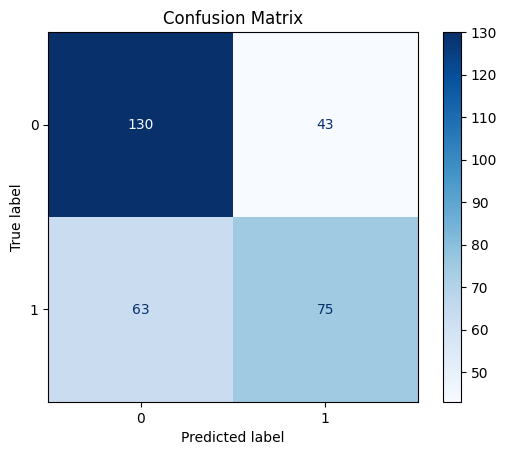

      Metric     Value
0    ROC AUC  0.720700
1       Gini  0.441401
2  Precision  0.635593
3     Recall  0.543478
4   F1 Score  0.585938
5   Accuracy  0.659164
['amount_rolling_mean_14', 'price_rolling_median_3', 'not_working_day_next', 'price_rolling_mean_5', 'may_holidays_period', 'new_year_holidays_period', 'amount_rolling_mean_7', 'ewm_sales_week_3', 'year', 'amount_rolling_mean_12', 'price_rolling_mean_3', 'price_rolling_mean_2', 'diff_12', 'price_rolling_median_2', 'amount_rolling_mean_5', 'unit_price', 'price_rolling_median_9', 'price_rolling_median_12', 'price_rolling_median_7', 'diff_9', 'amount_rolling_median_3', 'price_rolling_mean_14', 'price_rolling_median_5', 'price_rolling_mean_7', 'price_rolling_median_14', 'price_rolling_mean_9', 'diff_5', 'amount_rolling_median_5', 'price_rolling_mean_12', 'amount_rolling_median_7', 'ewm_sales_week_14', 'amount_rolling_median_14', 'diff_1', 'not_working_day_prev', 'amount_rolling_median_9', 'amount_rolling_mean_9', 'day_num', 'ewm_sa

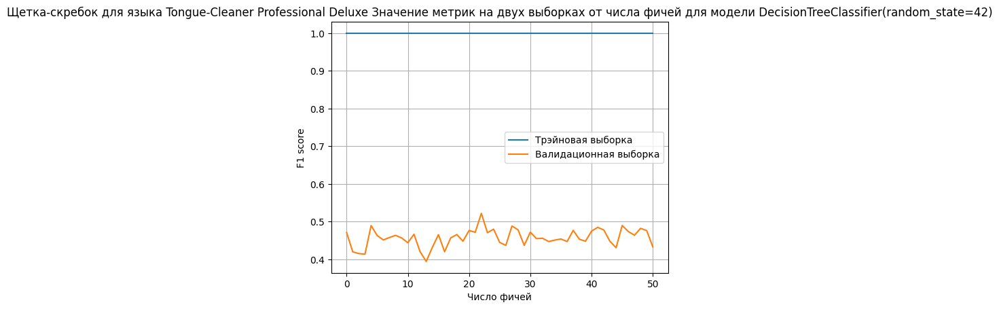

Crosvall
True Positives (TP): 78
True Negatives (TN): 92
False Positives (FP): 84
False Negatives (FN): 59
TPR: 0.5693430656934306
FPR: 0.4772727272727273
Presicion = TP / (TP + FP) = 78 / (78 + 84) = 78 / 162 = 0.48148148148148145
Recall = TP / (TP + FN) = 78 / (78 + 59) = 78 / 137 = 0.5693430656934306
F1 score = 2 * precision * recall / (precision + recall) = 0.5217391304347826


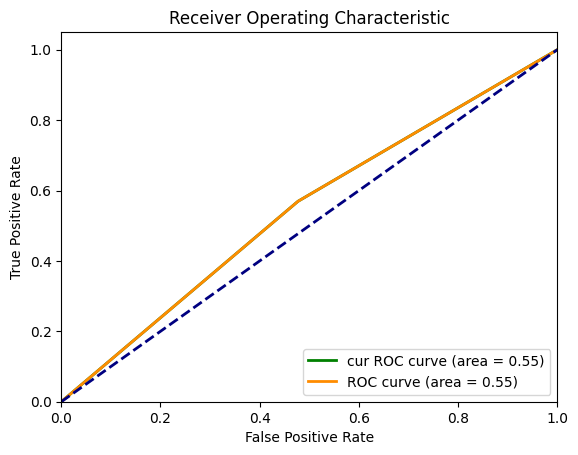

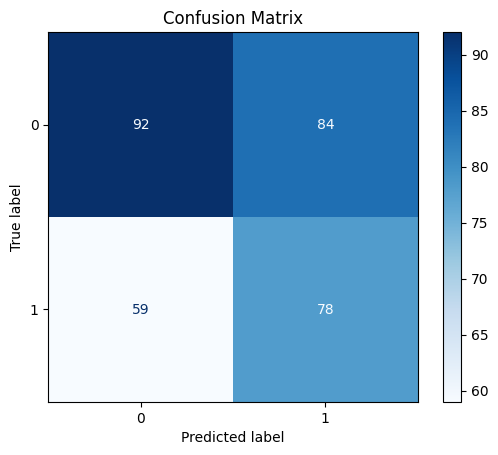

      Metric     Value
0    ROC AUC  0.546035
1       Gini  0.092070
2  Precision  0.481481
3     Recall  0.569343
4   F1 Score  0.521739
5   Accuracy  0.543131
Train


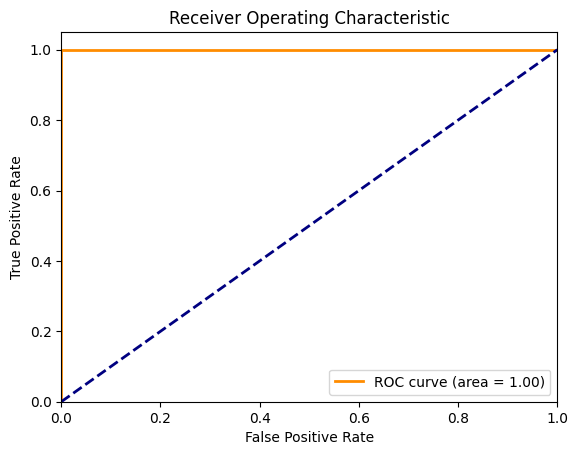

True Positives (TP): 138
True Negatives (TN): 173
False Positives (FP): 0
False Negatives (FN): 0
TPR: 1.0
FPR: 0.0


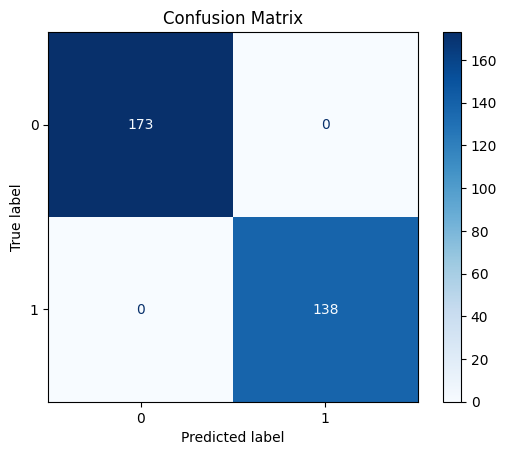

      Metric  Value
0    ROC AUC    1.0
1       Gini    1.0
2  Precision    1.0
3     Recall    1.0
4   F1 Score    1.0
5   Accuracy    1.0
['ewm_sales_week_7', 'unit_price', 'not_working_day', 'pre_holiday', 'not_working_day_prev', 'not_working_day_next', 'new_year_holidays_period', 'may_holidays_period', 'is_holiday', 'diff_1', 'diff_2', 'diff_3', 'diff_5', 'diff_7', 'diff_9', 'diff_12', 'diff_14', 'price_rolling_mean_2', 'price_rolling_mean_3', 'price_rolling_mean_5', 'price_rolling_mean_7', 'price_rolling_mean_9', 'price_rolling_mean_12']


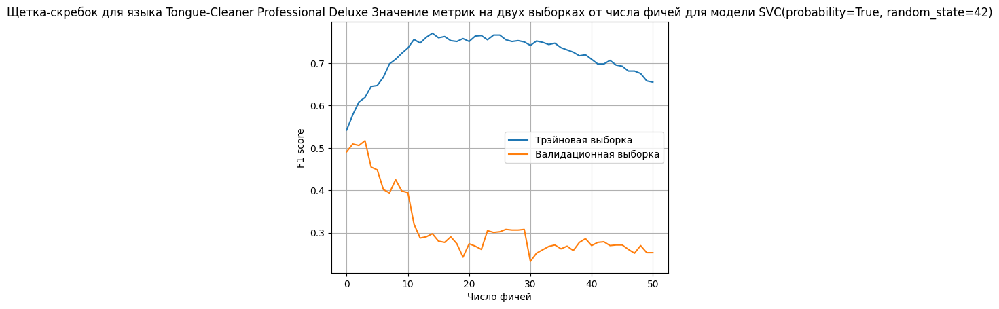

Crosvall
True Positives (TP): 69
True Negatives (TN): 115
False Positives (FP): 61
False Negatives (FN): 68
TPR: 0.5036496350364964
FPR: 0.3465909090909091
Presicion = TP / (TP + FP) = 69 / (69 + 61) = 69 / 130 = 0.5307692307692308
Recall = TP / (TP + FN) = 69 / (69 + 68) = 69 / 137 = 0.5036496350364964
F1 score = 2 * precision * recall / (precision + recall) = 0.5168539325842697


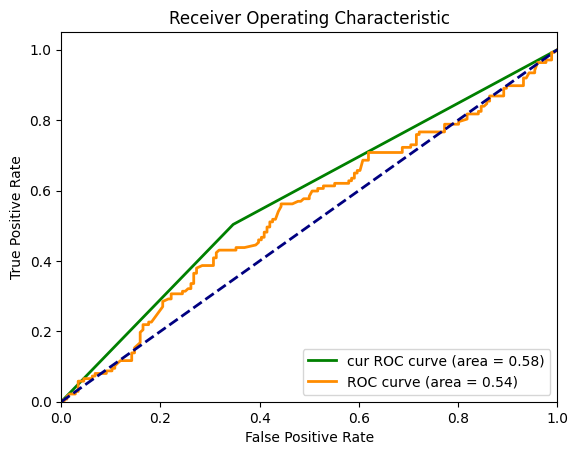

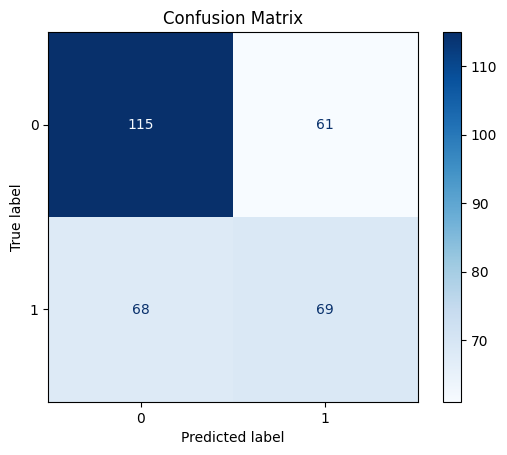

      Metric     Value
0    ROC AUC  0.538674
1       Gini  0.077347
2  Precision  0.530769
3     Recall  0.503650
4   F1 Score  0.516854
5   Accuracy  0.587859
Train


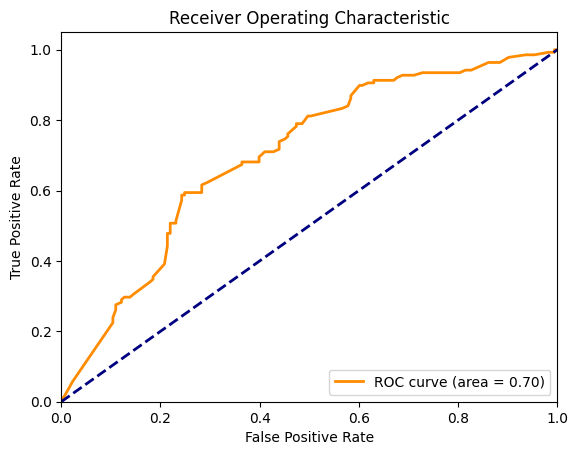

True Positives (TP): 82
True Negatives (TN): 128
False Positives (FP): 45
False Negatives (FN): 56
TPR: 0.5942028985507246
FPR: 0.26011560693641617


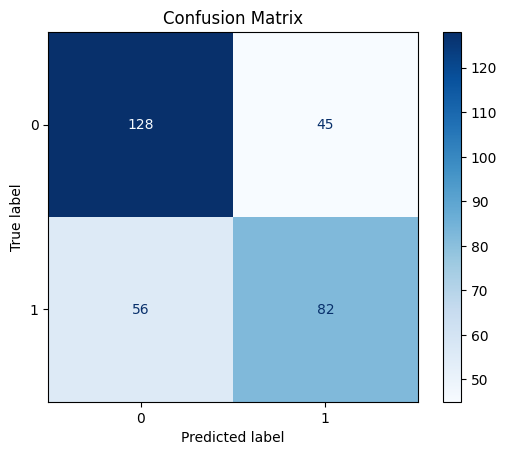

      Metric     Value
0    ROC AUC  0.700616
1       Gini  0.401231
2  Precision  0.645669
3     Recall  0.594203
4   F1 Score  0.618868
5   Accuracy  0.675241
['diff_5', 'diff_2', 'is_holiday', 'amount_rolling_median_9']


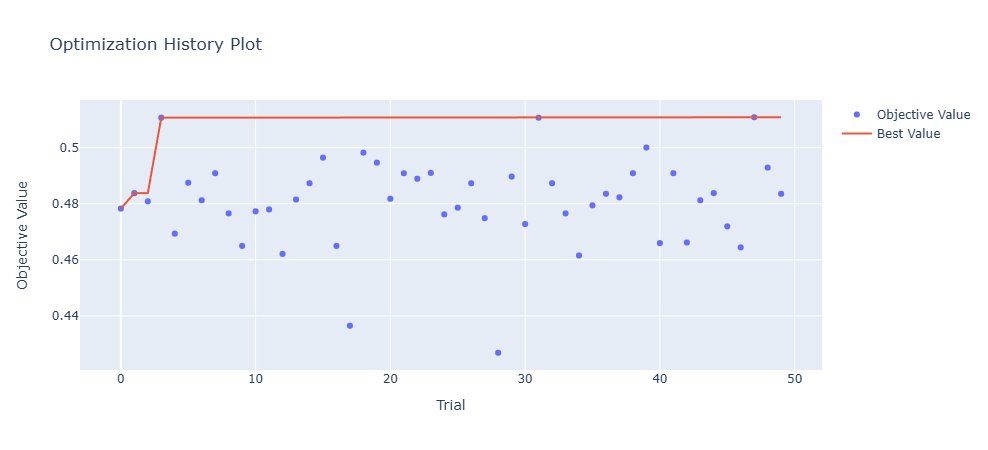

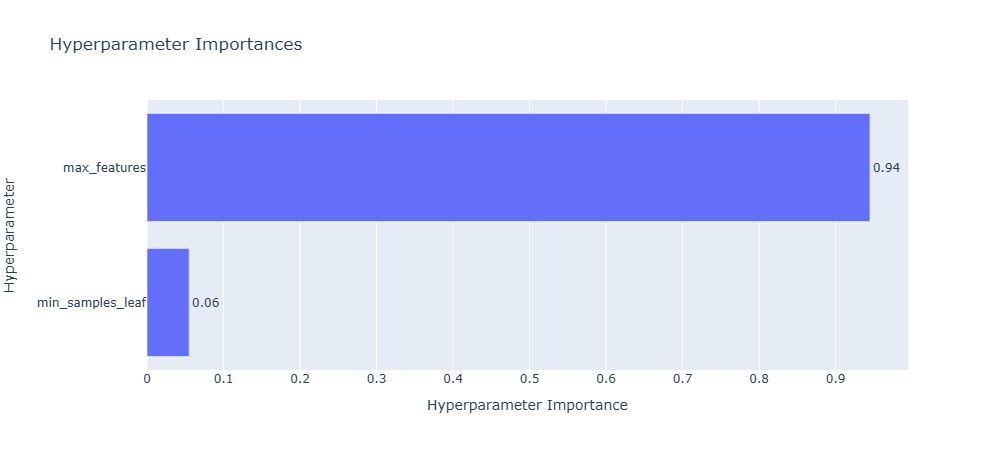

Best trial:
  Value: 0.5107913669064749
  Params: 
    min_samples_leaf: 4
    max_features: 12


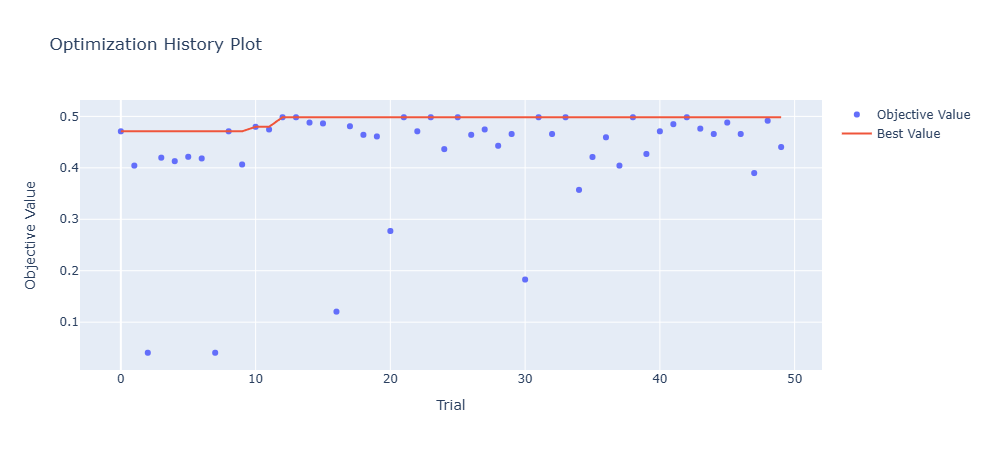

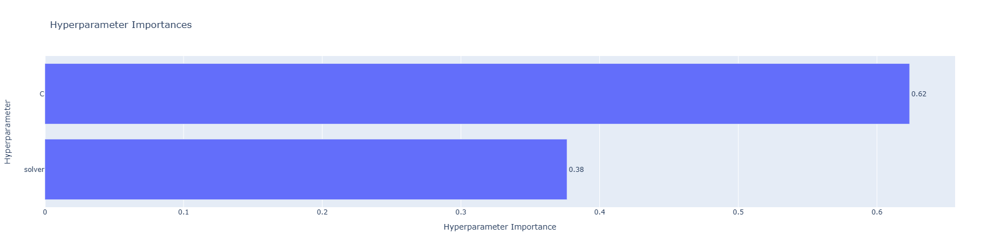

Best trial:
  Value: 0.4983164983164984
  Params: 
    C: 1.215902417188451
    solver: saga
    l1_ratio: 0.05159305754050712


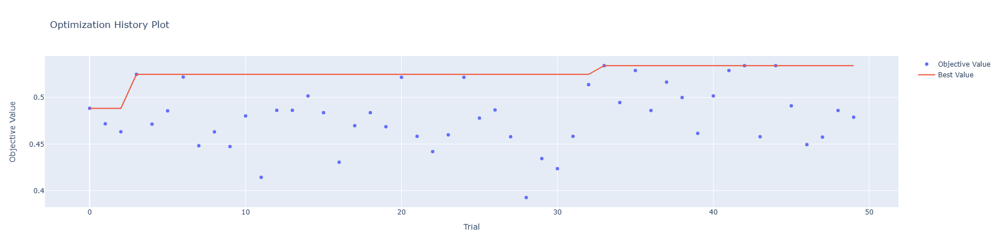

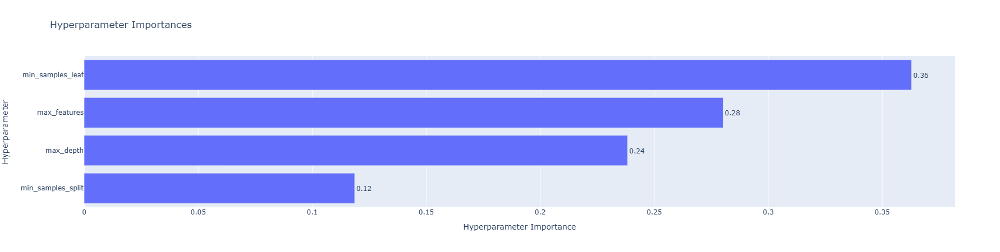

Best trial:
  Value: 0.5342465753424658
  Params: 
    max_depth: 20
    min_samples_split: 2
    min_samples_leaf: 5
    max_features: 21


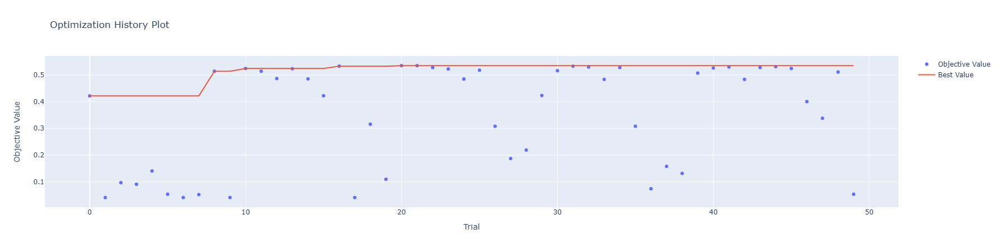

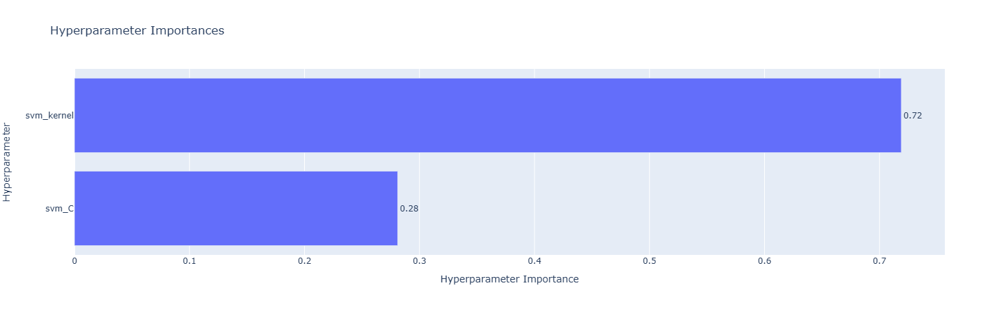

Best trial:
  Value: 0.5347222222222222
  Params: 
    svm_C: 4.035068834616153
    svm_kernel: rbf
True Positives (TP): 71
True Negatives (TN): 106
False Positives (FP): 70
False Negatives (FN): 66
TPR: 0.5182481751824818
FPR: 0.3977272727272727
Presicion = TP / (TP + FP) = 71 / (71 + 70) = 71 / 141 = 0.5035460992907801
Recall = TP / (TP + FN) = 71 / (71 + 66) = 71 / 137 = 0.5182481751824818
F1 score = 2 * precision * recall / (precision + recall) = 0.5107913669064749


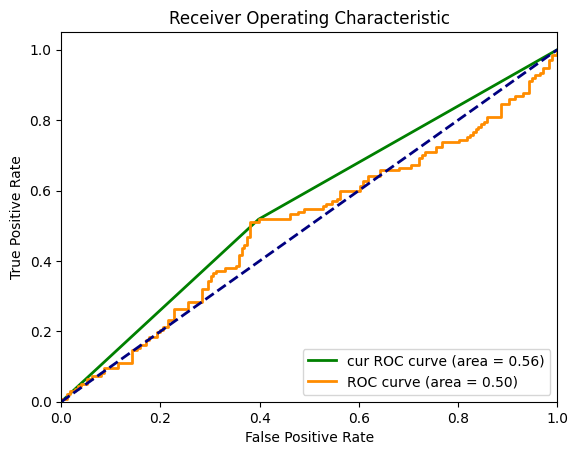

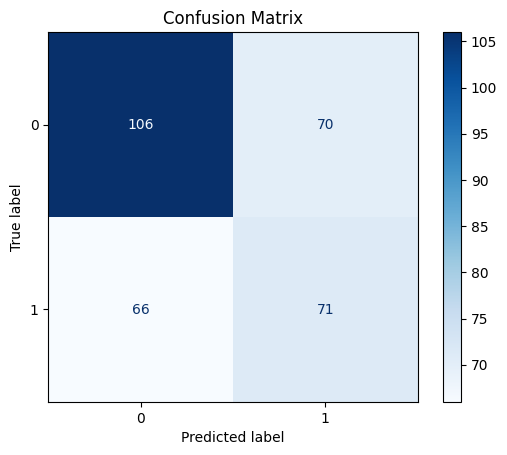

      Metric     Value
0    ROC AUC  0.503733
1       Gini  0.007465
2  Precision  0.503546
3     Recall  0.518248
4   F1 Score  0.510791
5   Accuracy  0.565495
True Positives (TP): 74
True Negatives (TN): 90
False Positives (FP): 86
False Negatives (FN): 63
TPR: 0.5401459854014599
FPR: 0.48863636363636365
Presicion = TP / (TP + FP) = 74 / (74 + 86) = 74 / 160 = 0.4625
Recall = TP / (TP + FN) = 74 / (74 + 63) = 74 / 137 = 0.5401459854014599
F1 score = 2 * precision * recall / (precision + recall) = 0.4983164983164984


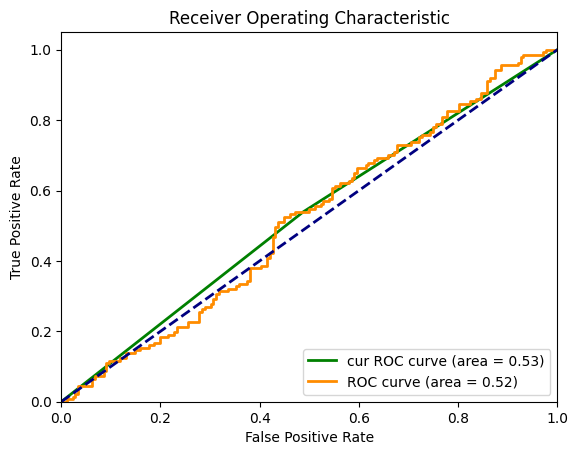

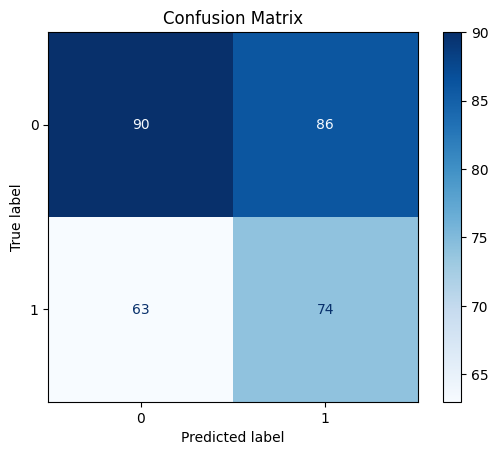

      Metric     Value
0    ROC AUC  0.517045
1       Gini  0.034091
2  Precision  0.462500
3     Recall  0.540146
4   F1 Score  0.498316
5   Accuracy  0.523962
True Positives (TP): 78
True Negatives (TN): 99
False Positives (FP): 77
False Negatives (FN): 59
TPR: 0.5693430656934306
FPR: 0.4375
Presicion = TP / (TP + FP) = 78 / (78 + 77) = 78 / 155 = 0.5032258064516129
Recall = TP / (TP + FN) = 78 / (78 + 59) = 78 / 137 = 0.5693430656934306
F1 score = 2 * precision * recall / (precision + recall) = 0.5342465753424658


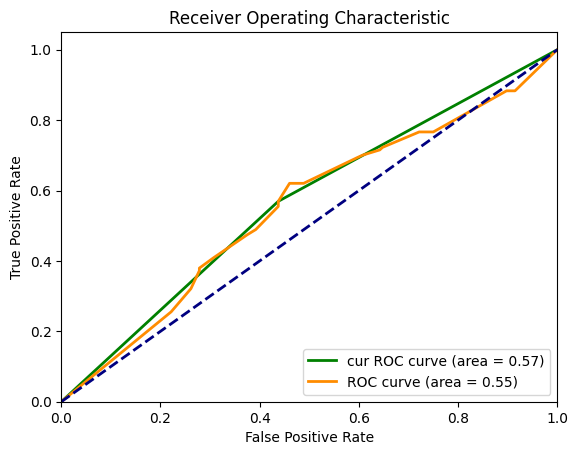

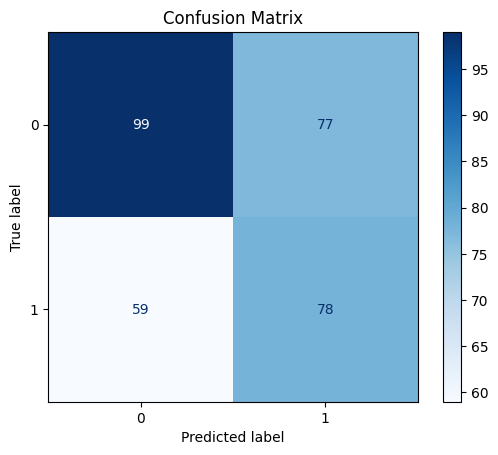

      Metric     Value
0    ROC AUC  0.551053
1       Gini  0.102107
2  Precision  0.503226
3     Recall  0.569343
4   F1 Score  0.534247
5   Accuracy  0.565495
True Positives (TP): 77
True Negatives (TN): 102
False Positives (FP): 74
False Negatives (FN): 60
TPR: 0.5620437956204379
FPR: 0.42045454545454547
Presicion = TP / (TP + FP) = 77 / (77 + 74) = 77 / 151 = 0.5099337748344371
Recall = TP / (TP + FN) = 77 / (77 + 60) = 77 / 137 = 0.5620437956204379
F1 score = 2 * precision * recall / (precision + recall) = 0.5347222222222222


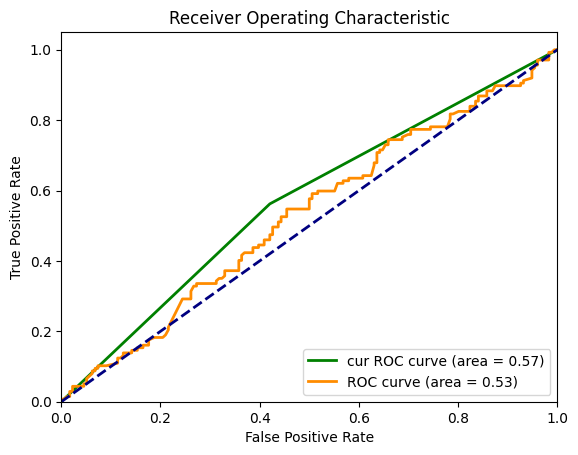

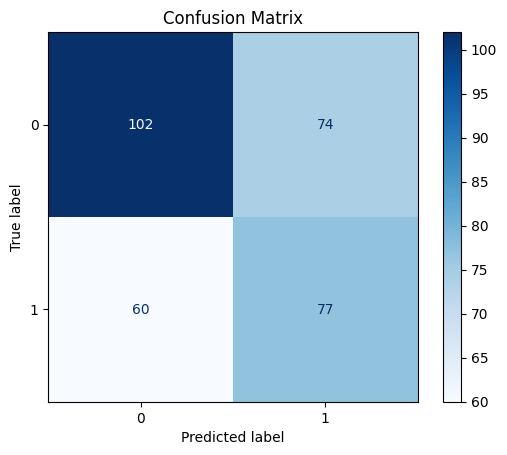

      Metric     Value
0    ROC AUC  0.529404
1       Gini  0.058809
2  Precision  0.509934
3     Recall  0.562044
4   F1 Score  0.534722
5   Accuracy  0.571885
Результат для Щетка-скребок для языка Tongue-Cleaner Professional Deluxe


,Model,Standart Features,Best features,Bset Features and Hyperparameters
0,RandomForest,0.409639,0.500000,"[0.5602604512276046, 0.5107913669064749]"
1,LogReg,0.468531,0.496599,"[0.525754810882548, 0.4983164983164984]"
2,Tree,0.436620,0.521739,"[0.5659215328467153, 0.5342465753424658]"
3,SVM,0.252632,0.516854,"[0.5707946250829463, 0.5347222222222222]"


In [39]:
for idx in ['13.00050.03130005003Белый']:
    item_id = wb_df[wb_df['sku_id'] == idx]['sku_name'].unique()[0]
    cur_train, cur_val, useless_features = make_df(item_id, st_date, fn_date, st_date_test, fn_date_test)
    useless_features = np.delete(useless_features[2:], 8) 
    model_array = []
    model_array.append(RandomForestClassifier(random_state=42))
    model_array.append(LogisticRegression(random_state=42))
    model_array.append(DecisionTreeClassifier(random_state=42))
    model_array.append(SVC(random_state=42, probability=True))
    first_iter_metrics = []
    for i in range(4):
        z, _ = sales_mask(cur_train, cur_val, useless_features, model=model_array[i], print_flag=False)
        first_iter_metrics.append(_[1])
    print(first_iter_metrics)
    rf_features, rf_metr = give_rf_features(item_id)
    log_features, log_metr = give_log_features(item_id)
    tree_features, tree_metr = give_tree_features(item_id)
    svm_features, svm_metr = give_svm_features(item_id)
    
    second_iter_metrics = [rf_metr, log_metr, tree_metr, svm_metr]
    
    rf_best_params = find_best_params(rf_objective, 50)
    log_best_params = find_best_params(log_objective, 50)
    tree_best_params = find_best_params(tree_objective, 50)
    svm_best_params = find_best_params(svm_objective, 50)
    
    model_1 = RandomForestClassifier(
        min_samples_leaf=rf_best_params['min_samples_leaf'],
        max_features=rf_best_params['max_features'],
        random_state=42
        )
    
    model_2 = LogisticRegression(
        C = log_best_params['C'],
        solver=log_best_params['solver'],
        max_iter=1000,
        random_state=42
        )
    
    model_3 =  DecisionTreeClassifier(
        max_depth=tree_best_params['max_depth'],
        min_samples_split=tree_best_params['min_samples_split'],
        min_samples_leaf=tree_best_params['min_samples_leaf'],
        max_features=tree_best_params['max_features'],
        random_state=42
        )
    
    model_4 = SVC(C=svm_best_params['svm_C'], kernel=svm_best_params['svm_kernel'], probability=True, random_state=42)
    
    rf_metr_upd = evaluate(model_1, rf_features)
    log_metr_upd = evaluate(model_2, log_features)
    tree_metr_upd = evaluate(model_3, tree_features)
    svm_metr_upd = evaluate(model_4, svm_features)
    
    third_iter_metrics = [rf_metr_upd, log_metr_upd, tree_metr_upd, svm_metr_upd]
    result = {
            "Model": ["RandomForest", "LogReg", "Tree", "SVM"],
            "Standart Features" : first_iter_metrics,
            "Best features" : second_iter_metrics,
            "Bset Features and Hyperparameters" : third_iter_metrics
    }
    print(f"Результат для {item_id}")
    result = pd.DataFrame(result)
    from IPython.display import display
    display(result)

[0.6519823788546256, 0.616161616161616, 0.64, 0.6575342465753424]


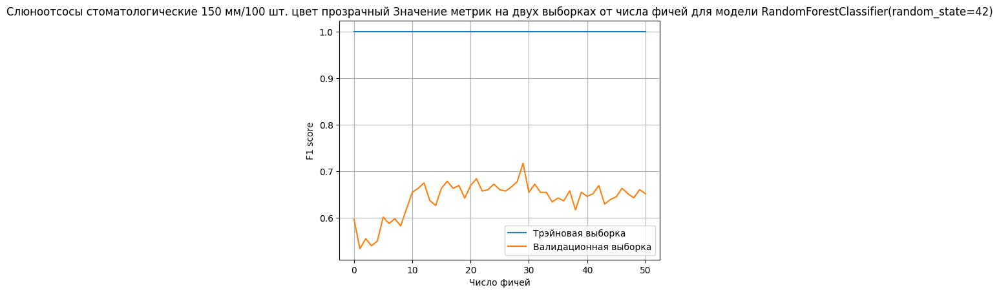

Crosvall
True Positives (TP): 85
True Negatives (TN): 37
False Positives (FP): 46
False Negatives (FN): 21
TPR: 0.8018867924528302
FPR: 0.5542168674698795
Presicion = TP / (TP + FP) = 85 / (85 + 46) = 85 / 131 = 0.648854961832061
Recall = TP / (TP + FN) = 85 / (85 + 21) = 85 / 106 = 0.8018867924528302
F1 score = 2 * precision * recall / (precision + recall) = 0.7172995780590717


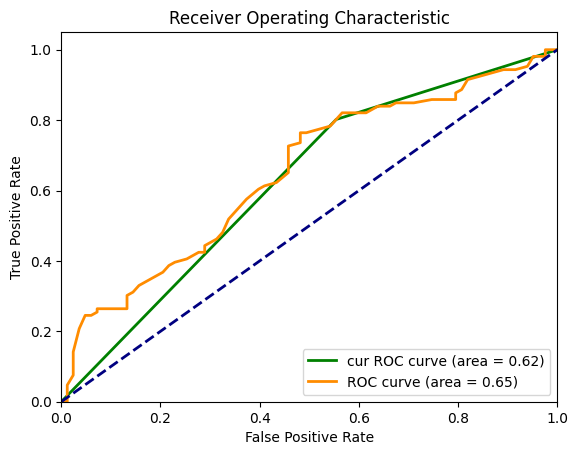

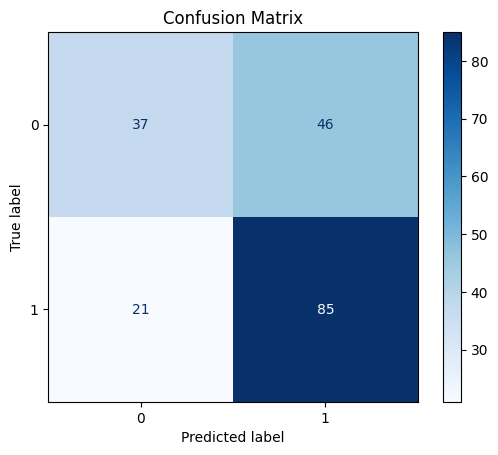

      Metric     Value
0    ROC AUC  0.649977
1       Gini  0.299955
2  Precision  0.648855
3     Recall  0.801887
4   F1 Score  0.717300
5   Accuracy  0.645503
Train


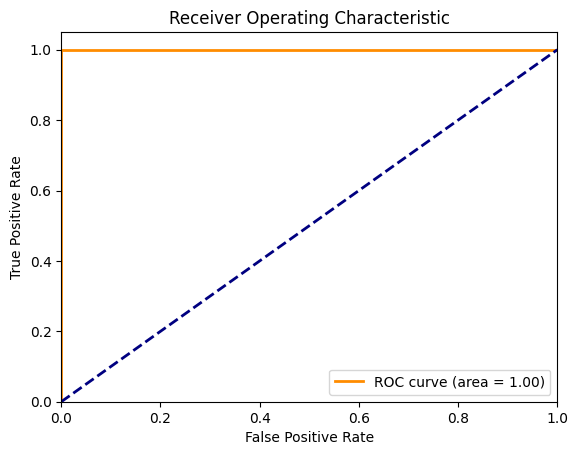

True Positives (TP): 100
True Negatives (TN): 90
False Positives (FP): 0
False Negatives (FN): 0
TPR: 1.0
FPR: 0.0


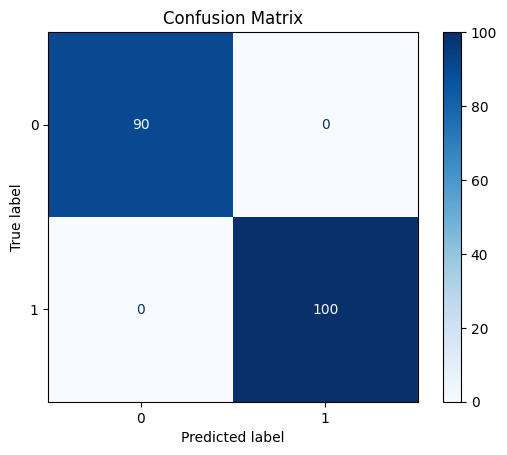

      Metric  Value
0    ROC AUC    1.0
1       Gini    1.0
2  Precision    1.0
3     Recall    1.0
4   F1 Score    1.0
5   Accuracy    1.0
['ewm_sales_week_7', 'unit_price', 'not_working_day', 'pre_holiday', 'not_working_day_prev', 'not_working_day_next', 'new_year_holidays_period', 'may_holidays_period', 'is_holiday', 'diff_1', 'diff_2', 'diff_3', 'diff_5', 'diff_7', 'diff_9', 'diff_12', 'diff_14', 'price_rolling_mean_2', 'price_rolling_mean_3', 'price_rolling_mean_5', 'price_rolling_mean_7', 'price_rolling_mean_9', 'price_rolling_mean_12', 'price_rolling_mean_14', 'amount_rolling_mean_2', 'amount_rolling_mean_3', 'amount_rolling_mean_5', 'amount_rolling_mean_7', 'amount_rolling_mean_9', 'amount_rolling_mean_12']


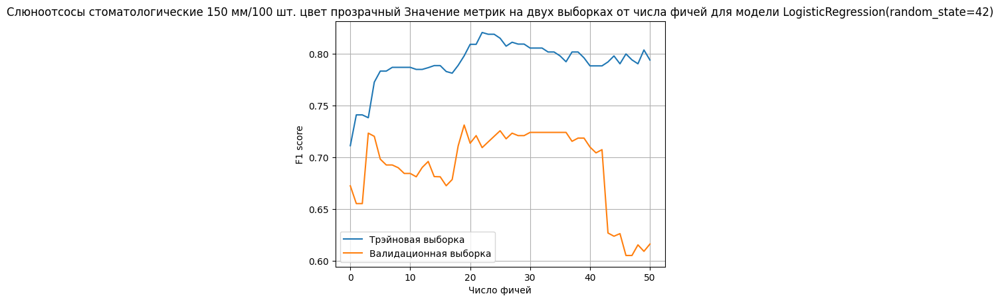

Crosvall
True Positives (TP): 83
True Negatives (TN): 45
False Positives (FP): 38
False Negatives (FN): 23
TPR: 0.7830188679245284
FPR: 0.4578313253012048
Presicion = TP / (TP + FP) = 83 / (83 + 38) = 83 / 121 = 0.6859504132231405
Recall = TP / (TP + FN) = 83 / (83 + 23) = 83 / 106 = 0.7830188679245284
F1 score = 2 * precision * recall / (precision + recall) = 0.7312775330396476


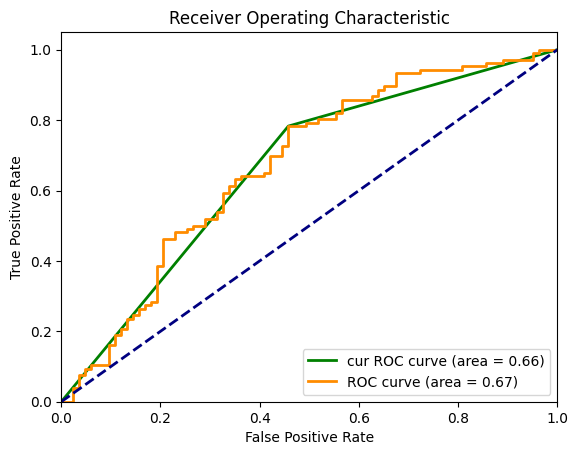

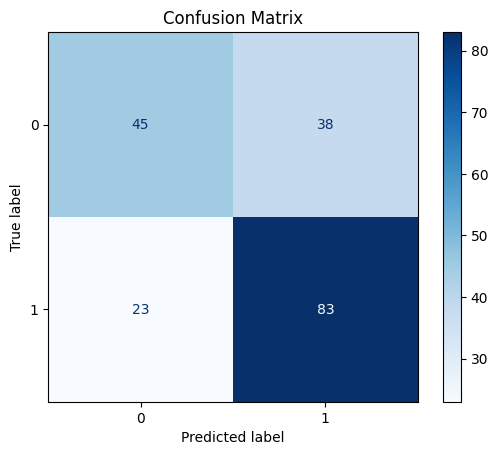

      Metric     Value
0    ROC AUC  0.672085
1       Gini  0.344169
2  Precision  0.685950
3     Recall  0.783019
4   F1 Score  0.731278
5   Accuracy  0.677249
Train


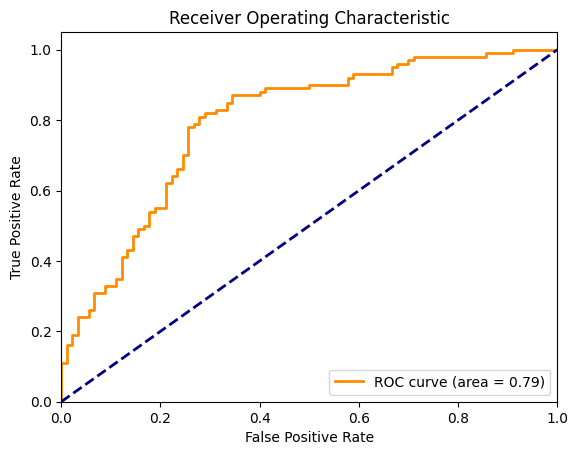

True Positives (TP): 87
True Negatives (TN): 59
False Positives (FP): 31
False Negatives (FN): 13
TPR: 0.87
FPR: 0.34444444444444444


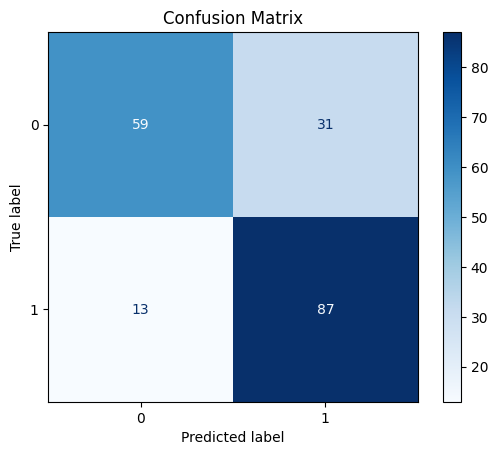

      Metric     Value
0    ROC AUC  0.794778
1       Gini  0.589556
2  Precision  0.737288
3     Recall  0.870000
4   F1 Score  0.798165
5   Accuracy  0.768421
['diff_9', 'amount_rolling_mean_5', 'new_year_holidays_period', 'amount_rolling_median_5', 'diff_1', 'diff_5', 'pre_holiday', 'ewm_sales_week_3', 'diff_12', 'price_rolling_median_12', 'amount_rolling_mean_3', 'amount_rolling_median_9', 'price_rolling_median_14', 'year', 'diff_14', 'day_num', 'amount_rolling_median_7', 'diff_3', 'amount_rolling_median_12', 'amount_rolling_median_14']


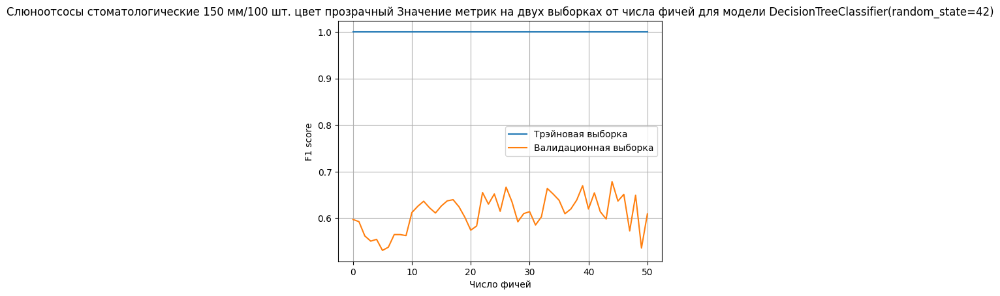

Crosvall
True Positives (TP): 76
True Negatives (TN): 41
False Positives (FP): 42
False Negatives (FN): 30
TPR: 0.7169811320754716
FPR: 0.5060240963855421
Presicion = TP / (TP + FP) = 76 / (76 + 42) = 76 / 118 = 0.6440677966101694
Recall = TP / (TP + FN) = 76 / (76 + 30) = 76 / 106 = 0.7169811320754716
F1 score = 2 * precision * recall / (precision + recall) = 0.6785714285714285


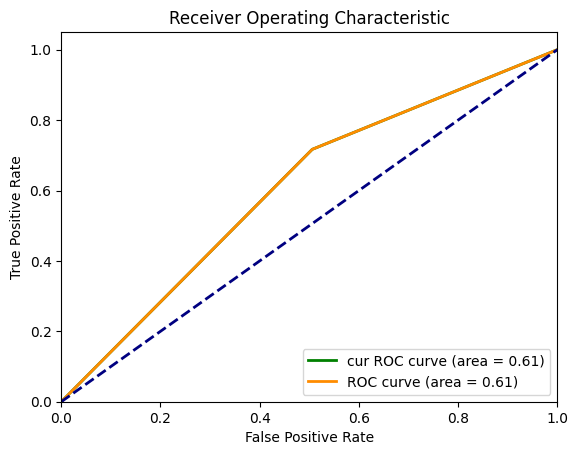

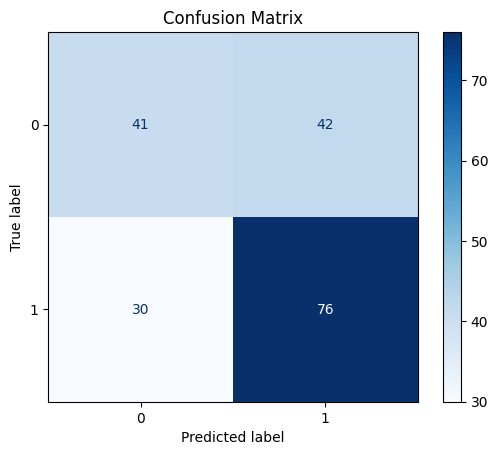

      Metric     Value
0    ROC AUC  0.605479
1       Gini  0.210957
2  Precision  0.644068
3     Recall  0.716981
4   F1 Score  0.678571
5   Accuracy  0.619048
Train


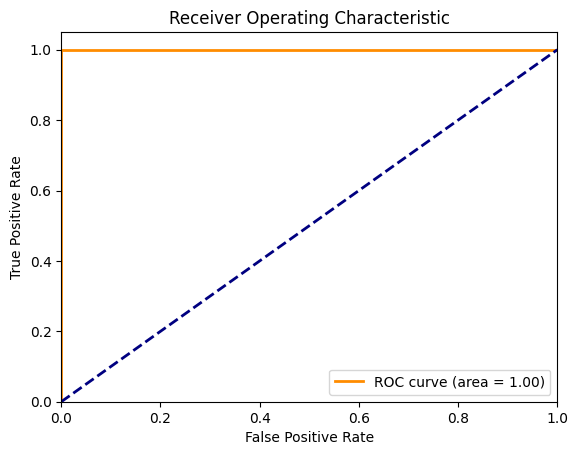

True Positives (TP): 100
True Negatives (TN): 90
False Positives (FP): 0
False Negatives (FN): 0
TPR: 1.0
FPR: 0.0


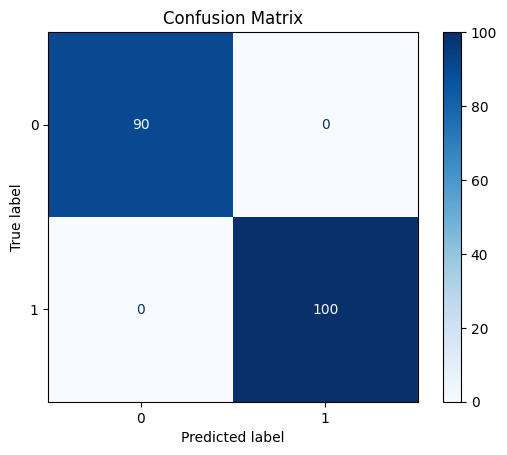

      Metric  Value
0    ROC AUC    1.0
1       Gini    1.0
2  Precision    1.0
3     Recall    1.0
4   F1 Score    1.0
5   Accuracy    1.0
['ewm_sales_week_7', 'unit_price', 'not_working_day', 'pre_holiday', 'not_working_day_prev', 'not_working_day_next', 'new_year_holidays_period', 'may_holidays_period', 'is_holiday', 'diff_1', 'diff_2', 'diff_3', 'diff_5', 'diff_7', 'diff_9', 'diff_12', 'diff_14', 'price_rolling_mean_2', 'price_rolling_mean_3', 'price_rolling_mean_5', 'price_rolling_mean_7', 'price_rolling_mean_9', 'price_rolling_mean_12', 'price_rolling_mean_14', 'amount_rolling_mean_2', 'amount_rolling_mean_3', 'amount_rolling_mean_5', 'amount_rolling_mean_7', 'amount_rolling_mean_9', 'amount_rolling_mean_12', 'amount_rolling_mean_14', 'price_rolling_median_2', 'price_rolling_median_3', 'price_rolling_median_5', 'price_rolling_median_7', 'price_rolling_median_9', 'price_rolling_median_12', 'price_rolling_median_14', 'amount_rolling_median_2', 'amount_rolling_median_3', 'amount_rol

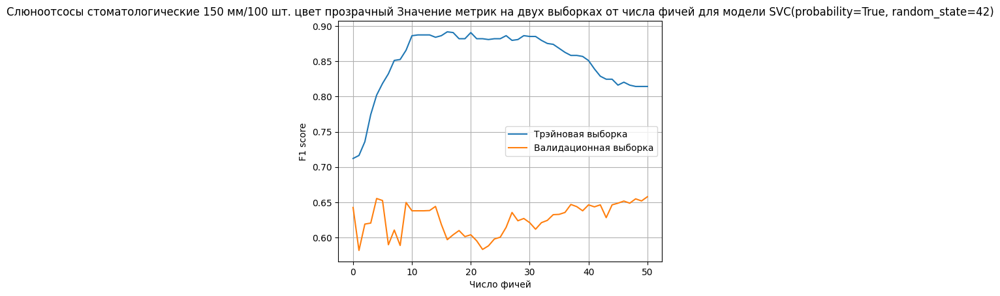

Crosvall
True Positives (TP): 72
True Negatives (TN): 42
False Positives (FP): 41
False Negatives (FN): 34
TPR: 0.6792452830188679
FPR: 0.4939759036144578
Presicion = TP / (TP + FP) = 72 / (72 + 41) = 72 / 113 = 0.6371681415929203
Recall = TP / (TP + FN) = 72 / (72 + 34) = 72 / 106 = 0.6792452830188679
F1 score = 2 * precision * recall / (precision + recall) = 0.6575342465753424


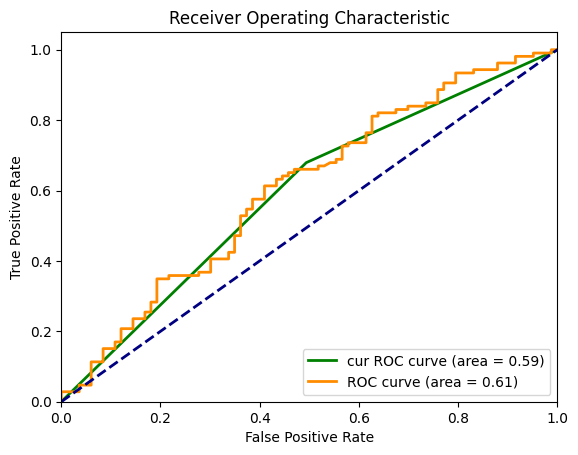

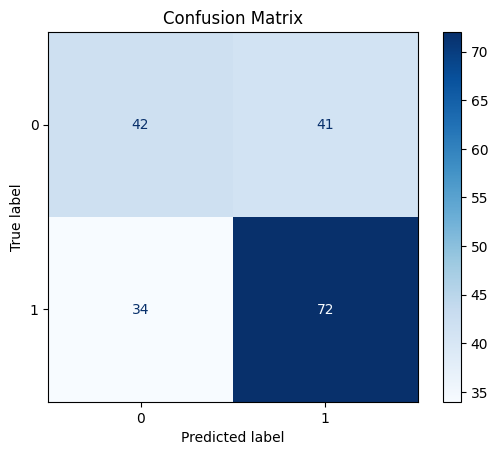

      Metric     Value
0    ROC AUC  0.605990
1       Gini  0.211980
2  Precision  0.637168
3     Recall  0.679245
4   F1 Score  0.657534
5   Accuracy  0.603175
Train


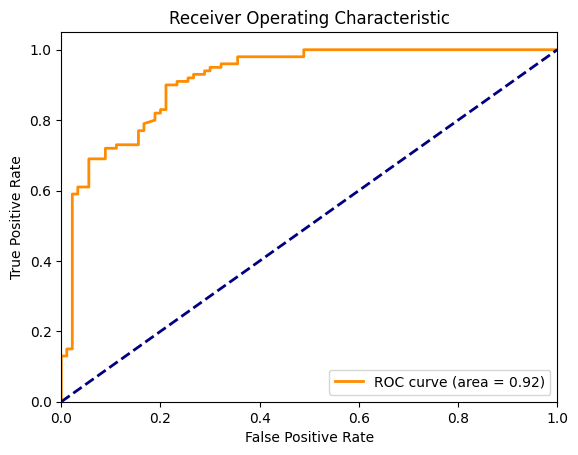

True Positives (TP): 79
True Negatives (TN): 75
False Positives (FP): 15
False Negatives (FN): 21
TPR: 0.79
FPR: 0.16666666666666666


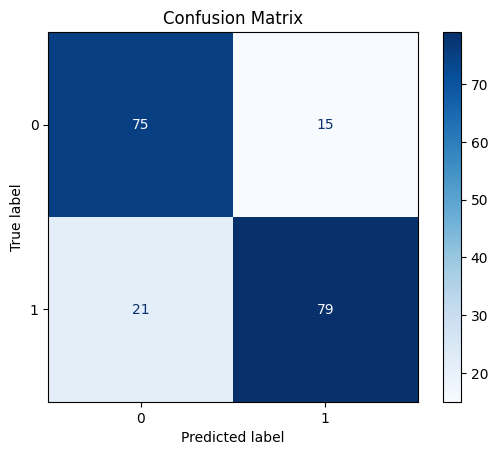

      Metric     Value
0    ROC AUC  0.915667
1       Gini  0.831333
2  Precision  0.840426
3     Recall  0.790000
4   F1 Score  0.814433
5   Accuracy  0.810526
['price_rolling_mean_3', 'amount_rolling_median_14', 'not_working_day', 'day_num', 'amount_rolling_median_9', 'amount_rolling_median_12', 'price_rolling_median_9', 'ewm_sales_week_14', 'is_holiday', 'amount_rolling_median_3', 'pre_holiday', 'price_rolling_median_14', 'new_year_holidays_period', 'diff_3', 'diff_1', 'month', 'amount_rolling_mean_9', 'price_rolling_median_7', 'price_rolling_mean_14', 'amount_rolling_mean_12', 'diff_2', 'price_rolling_mean_12', 'year', 'not_working_day_prev', 'diff_14', 'price_rolling_median_12', 'price_rolling_median_5', 'diff_7', 'amount_rolling_mean_14', 'not_working_day_next', 'diff_12', 'diff_5', 'amount_rolling_mean_2', 'amount_rolling_median_7', 'amount_rolling_median_5', 'price_rolling_mean_9', 'amount_rolling_mean_5', 'unit_price', 'ewm_sales_week_3', 'diff_9', 'price_rolling_mean_2', 'pri

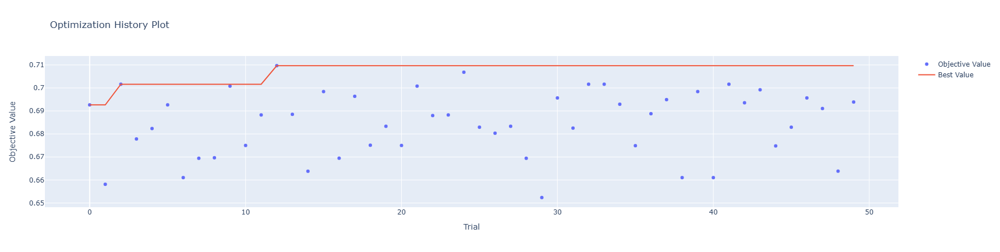

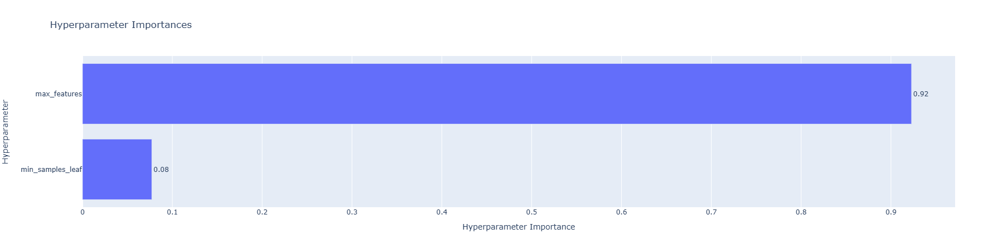

Best trial:
  Value: 0.7096774193548387
  Params: 
    min_samples_leaf: 6
    max_features: 6


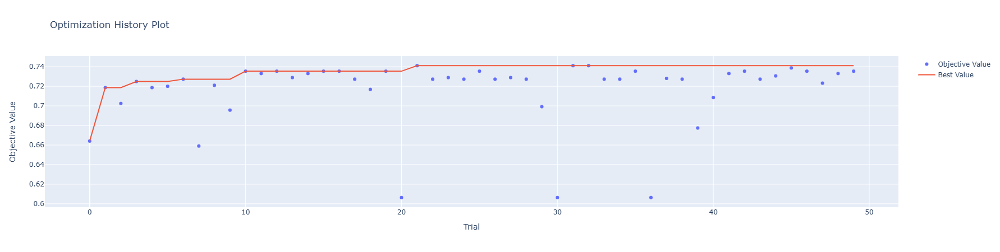

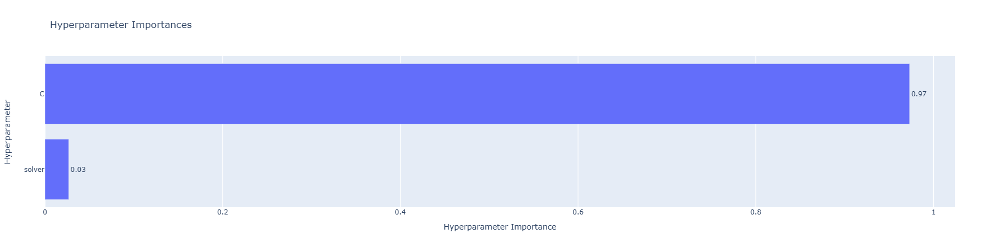

Best trial:
  Value: 0.7410714285714286
  Params: 
    C: 945.495132555019
    solver: liblinear


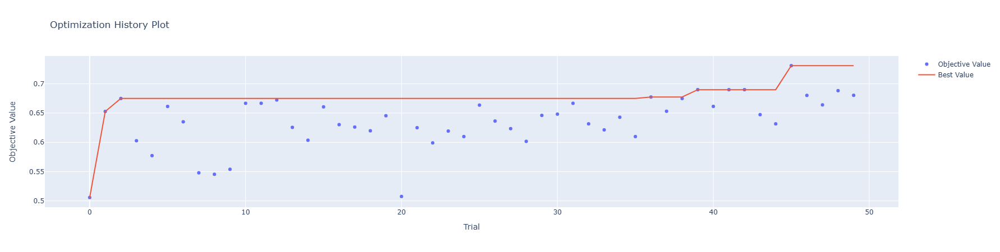

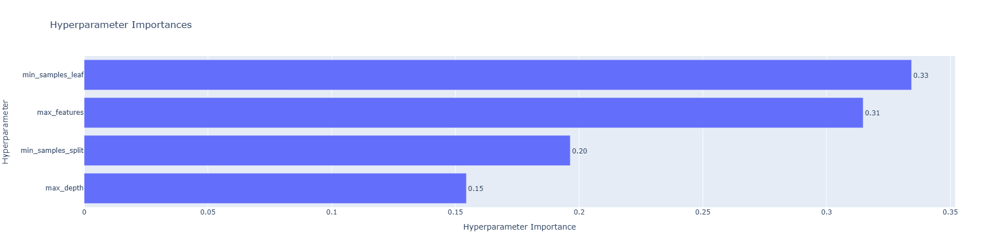

Best trial:
  Value: 0.7309236947791165
  Params: 
    max_depth: 26
    min_samples_split: 11
    min_samples_leaf: 16
    max_features: 24


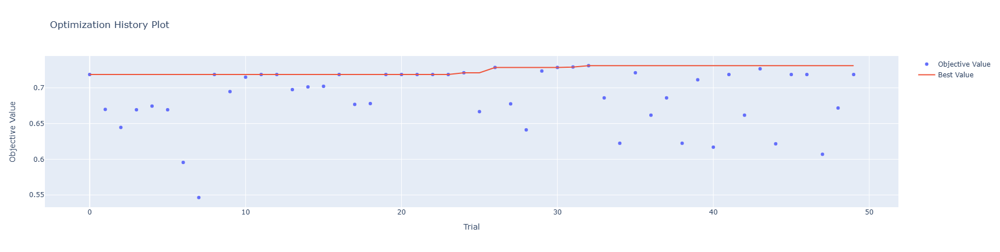

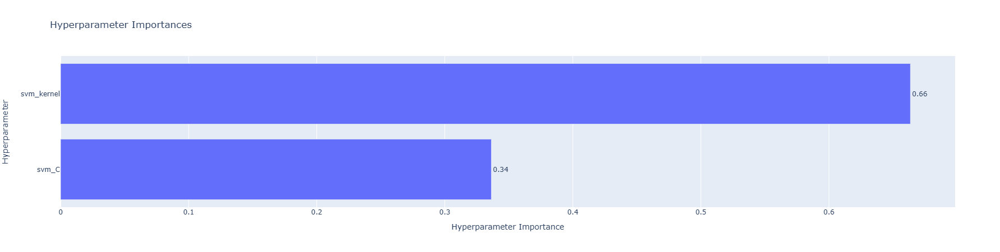

Best trial:
  Value: 0.7310344827586206
  Params: 
    svm_C: 0.12176985604735462
    svm_kernel: rbf
True Positives (TP): 88
True Negatives (TN): 29
False Positives (FP): 54
False Negatives (FN): 18
TPR: 0.8301886792452831
FPR: 0.6506024096385542
Presicion = TP / (TP + FP) = 88 / (88 + 54) = 88 / 142 = 0.6197183098591549
Recall = TP / (TP + FN) = 88 / (88 + 18) = 88 / 106 = 0.8301886792452831
F1 score = 2 * precision * recall / (precision + recall) = 0.7096774193548387


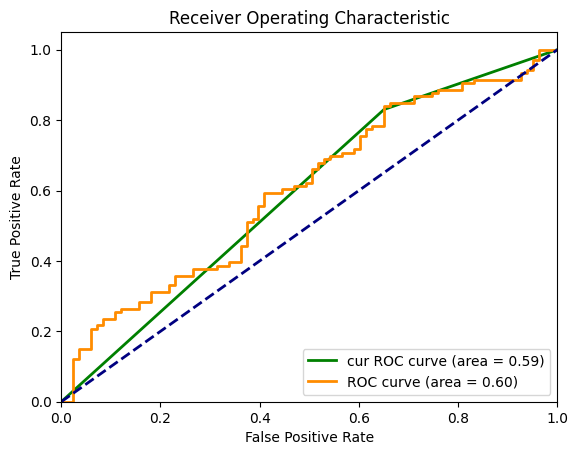

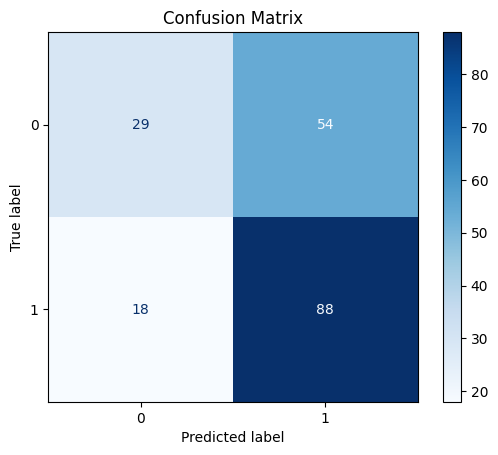

      Metric     Value
0    ROC AUC  0.603774
1       Gini  0.207547
2  Precision  0.619718
3     Recall  0.830189
4   F1 Score  0.709677
5   Accuracy  0.619048
True Positives (TP): 83
True Negatives (TN): 48
False Positives (FP): 35
False Negatives (FN): 23
TPR: 0.7830188679245284
FPR: 0.42168674698795183
Presicion = TP / (TP + FP) = 83 / (83 + 35) = 83 / 118 = 0.7033898305084746
Recall = TP / (TP + FN) = 83 / (83 + 23) = 83 / 106 = 0.7830188679245284
F1 score = 2 * precision * recall / (precision + recall) = 0.7410714285714286


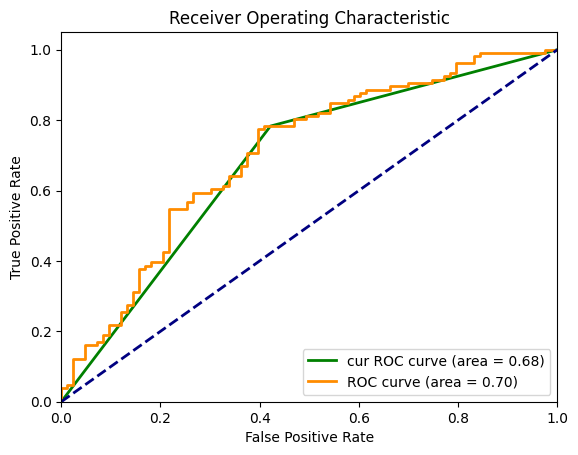

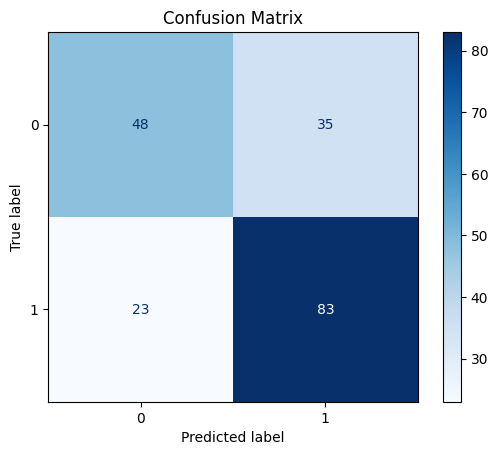

      Metric     Value
0    ROC AUC  0.704365
1       Gini  0.408729
2  Precision  0.703390
3     Recall  0.783019
4   F1 Score  0.741071
5   Accuracy  0.693122
True Positives (TP): 91
True Negatives (TN): 31
False Positives (FP): 52
False Negatives (FN): 15
TPR: 0.8584905660377359
FPR: 0.6265060240963856
Presicion = TP / (TP + FP) = 91 / (91 + 52) = 91 / 143 = 0.6363636363636364
Recall = TP / (TP + FN) = 91 / (91 + 15) = 91 / 106 = 0.8584905660377359
F1 score = 2 * precision * recall / (precision + recall) = 0.7309236947791165


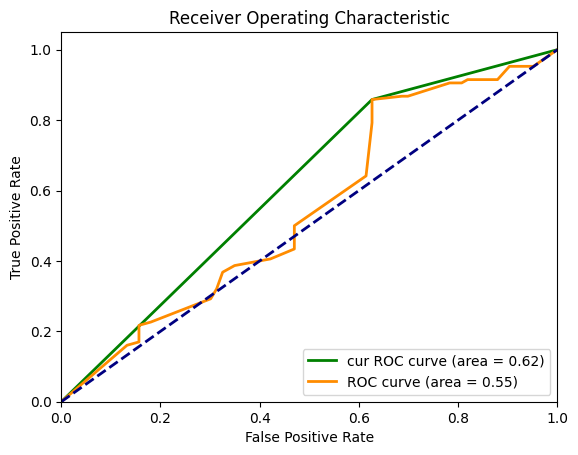

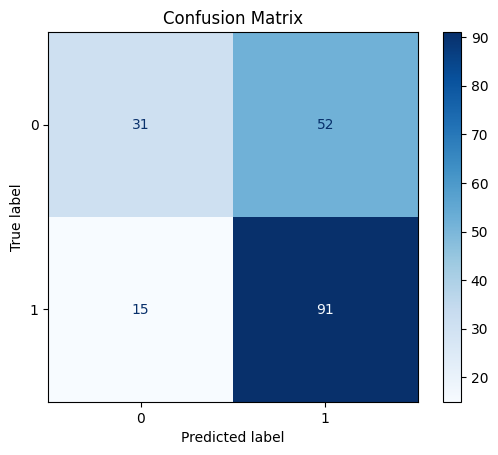

      Metric     Value
0    ROC AUC  0.548818
1       Gini  0.097636
2  Precision  0.636364
3     Recall  0.858491
4   F1 Score  0.730924
5   Accuracy  0.645503
True Positives (TP): 106
True Negatives (TN): 5
False Positives (FP): 78
False Negatives (FN): 0
TPR: 1.0
FPR: 0.9397590361445783
Presicion = TP / (TP + FP) = 106 / (106 + 78) = 106 / 184 = 0.5760869565217391
Recall = TP / (TP + FN) = 106 / (106 + 0) = 106 / 106 = 1.0
F1 score = 2 * precision * recall / (precision + recall) = 0.7310344827586206


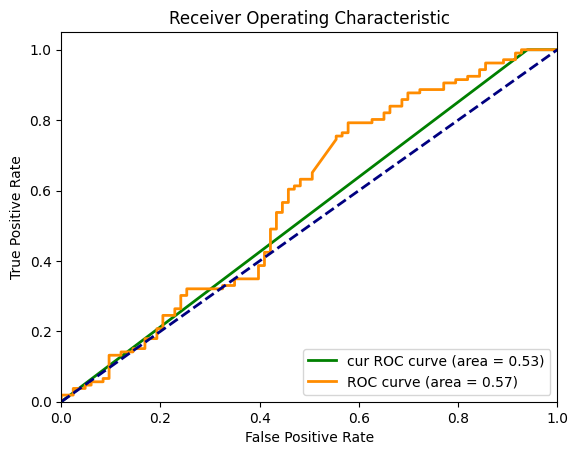

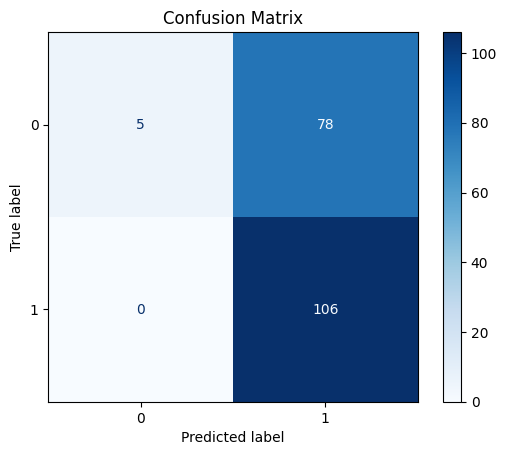

      Metric     Value
0    ROC AUC  0.574449
1       Gini  0.148897
2  Precision  0.576087
3     Recall  1.000000
4   F1 Score  0.731034
5   Accuracy  0.587302
Результат для Слюноотсосы стоматологические 150 мм/100 шт. цвет прозрачный


,Model,Standart Features,Best features,Bset Features and Hyperparameters
0,RandomForest,0.651982,0.717300,"[0.5897931348033645, 0.7096774193548387]"
1,LogReg,0.616162,0.731278,"[0.6806660604682883, 0.7410714285714286]"
2,Tree,0.640000,0.678571,"[0.6159922709706751, 0.7309236947791165]"
3,SVM,0.657534,0.657534,"[0.5301204819277109, 0.7310344827586206]"


In [60]:
for idx in ['1А51011А5101Прозрачный']:
    item_id = wb_df[wb_df['sku_id'] == idx]['sku_name'].unique()[0]
    cur_train, cur_val, useless_features = make_df(item_id, st_date, fn_date, st_date_test, fn_date_test)
    useless_features = np.delete(useless_features[2:], 8) 
    model_array = []
    model_array.append(RandomForestClassifier(random_state=42))
    model_array.append(LogisticRegression(random_state=42))
    model_array.append(DecisionTreeClassifier(random_state=42))
    model_array.append(SVC(random_state=42, probability=True))
    first_iter_metrics = []
    for i in range(4):
        z, _ = sales_mask(cur_train, cur_val, useless_features, model=model_array[i], print_flag=False)
        first_iter_metrics.append(_[1])
    print(first_iter_metrics)
    rf_features, rf_metr = give_rf_features(item_id)
    log_features, log_metr = give_log_features(item_id)
    tree_features, tree_metr = give_tree_features(item_id)
    svm_features, svm_metr = give_svm_features(item_id)
    
    second_iter_metrics = [rf_metr, log_metr, tree_metr, svm_metr]
    
    rf_best_params = find_best_params(rf_objective, 50)
    log_best_params = find_best_params(log_objective, 50)
    tree_best_params = find_best_params(tree_objective, 50)
    svm_best_params = find_best_params(svm_objective, 50)
    
    model_1 = RandomForestClassifier(
        min_samples_leaf=rf_best_params['min_samples_leaf'],
        max_features=rf_best_params['max_features'],
        random_state=42
        )
    
    model_2 = LogisticRegression(
        C = log_best_params['C'],
        solver=log_best_params['solver'],
        max_iter=1000,
        random_state=42
        )
    
    model_3 =  DecisionTreeClassifier(
        max_depth=tree_best_params['max_depth'],
        min_samples_split=tree_best_params['min_samples_split'],
        min_samples_leaf=tree_best_params['min_samples_leaf'],
        max_features=tree_best_params['max_features'],
        random_state=42
        )
    
    model_4 = SVC(C=svm_best_params['svm_C'], kernel=svm_best_params['svm_kernel'], probability=True, random_state=42)
    
    rf_metr_upd = evaluate(model_1, rf_features)
    log_metr_upd = evaluate(model_2, log_features)
    tree_metr_upd = evaluate(model_3, tree_features)
    svm_metr_upd = evaluate(model_4, svm_features)
    
    third_iter_metrics = [rf_metr_upd, log_metr_upd, tree_metr_upd, svm_metr_upd]
    result = {
            "Model": ["RandomForest", "LogReg", "Tree", "SVM"],
            "Standart Features" : first_iter_metrics,
            "Best features" : second_iter_metrics,
            "Bset Features and Hyperparameters" : third_iter_metrics
    }
    print(f"Результат для {item_id}")
    result = pd.DataFrame(result)
    from IPython.display import display
    display(result)

[0.6902654867256637, 0.6939890710382514, 0.6458923512747875, 0.7817258883248731]


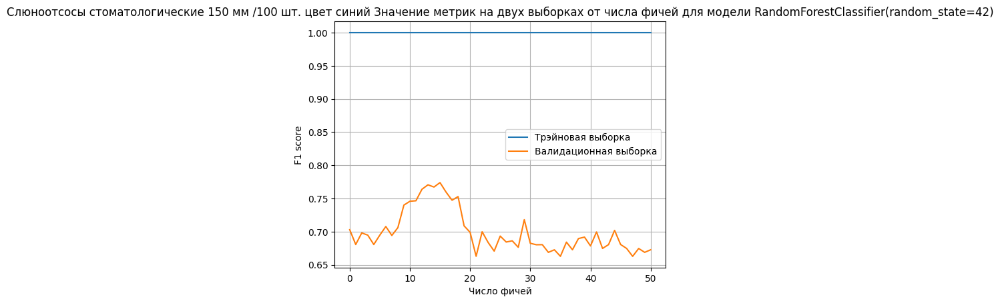

Crosvall
True Positives (TP): 142
True Negatives (TN): 36
False Positives (FP): 52
False Negatives (FN): 31
TPR: 0.8208092485549133
FPR: 0.5909090909090909
Presicion = TP / (TP + FP) = 142 / (142 + 52) = 142 / 194 = 0.7319587628865979
Recall = TP / (TP + FN) = 142 / (142 + 31) = 142 / 173 = 0.8208092485549133
F1 score = 2 * precision * recall / (precision + recall) = 0.7738419618528611


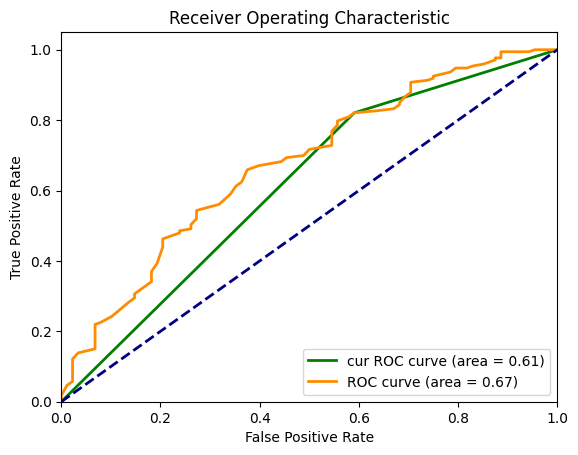

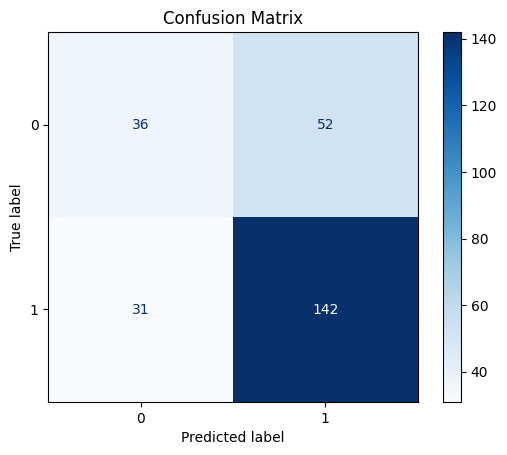

      Metric     Value
0    ROC AUC  0.673706
1       Gini  0.347412
2  Precision  0.731959
3     Recall  0.820809
4   F1 Score  0.773842
5   Accuracy  0.681992
Train


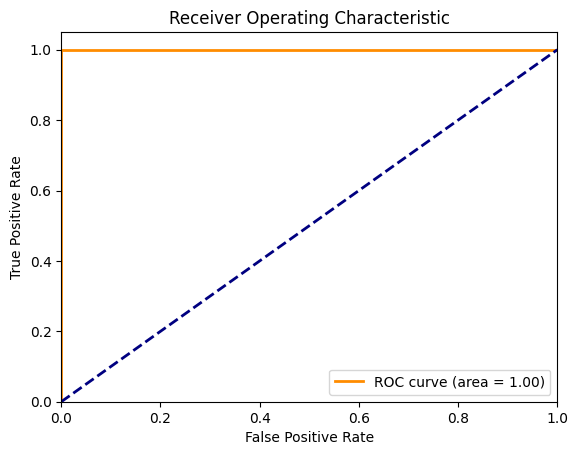

True Positives (TP): 184
True Negatives (TN): 93
False Positives (FP): 0
False Negatives (FN): 0
TPR: 1.0
FPR: 0.0


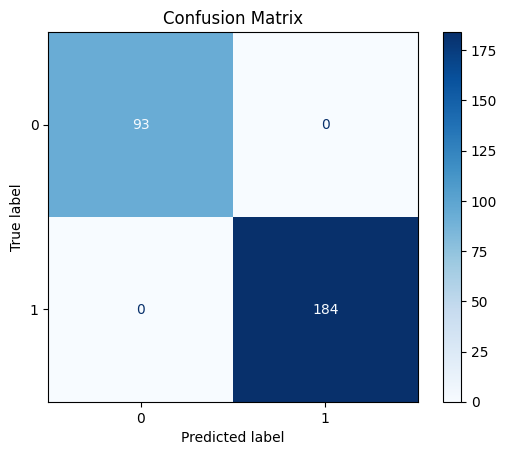

      Metric  Value
0    ROC AUC    1.0
1       Gini    1.0
2  Precision    1.0
3     Recall    1.0
4   F1 Score    1.0
5   Accuracy    1.0
['ewm_sales_week_7', 'unit_price', 'not_working_day', 'pre_holiday', 'not_working_day_prev', 'not_working_day_next', 'new_year_holidays_period', 'may_holidays_period', 'is_holiday', 'diff_1', 'diff_2', 'diff_3', 'diff_5', 'diff_7', 'diff_9', 'diff_12']


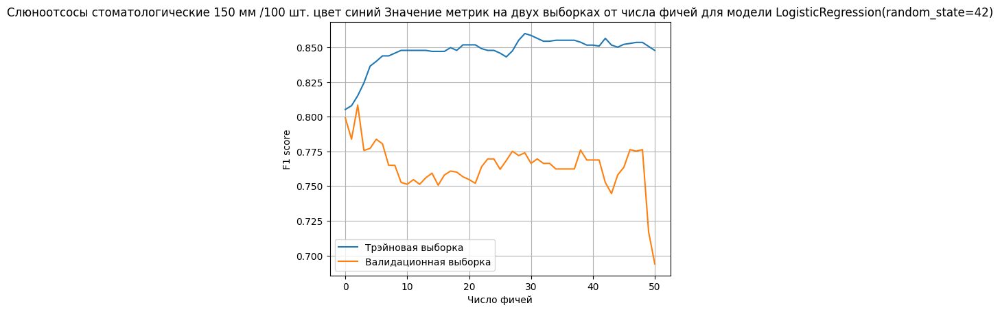

Crosvall
True Positives (TP): 154
True Negatives (TN): 34
False Positives (FP): 54
False Negatives (FN): 19
TPR: 0.8901734104046243
FPR: 0.6136363636363636
Presicion = TP / (TP + FP) = 154 / (154 + 54) = 154 / 208 = 0.7403846153846154
Recall = TP / (TP + FN) = 154 / (154 + 19) = 154 / 173 = 0.8901734104046243
F1 score = 2 * precision * recall / (precision + recall) = 0.8083989501312336


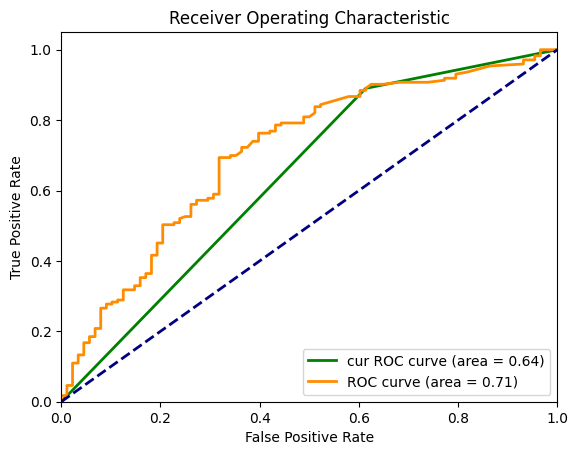

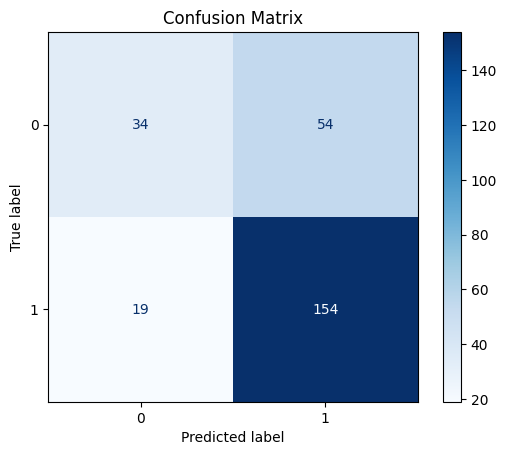

      Metric     Value
0    ROC AUC  0.709012
1       Gini  0.418024
2  Precision  0.740385
3     Recall  0.890173
4   F1 Score  0.808399
5   Accuracy  0.720307
Train


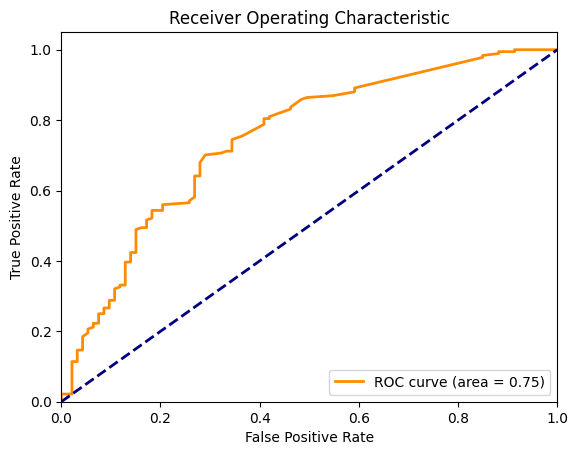

True Positives (TP): 183
True Negatives (TN): 11
False Positives (FP): 82
False Negatives (FN): 1
TPR: 0.9945652173913043
FPR: 0.8817204301075269


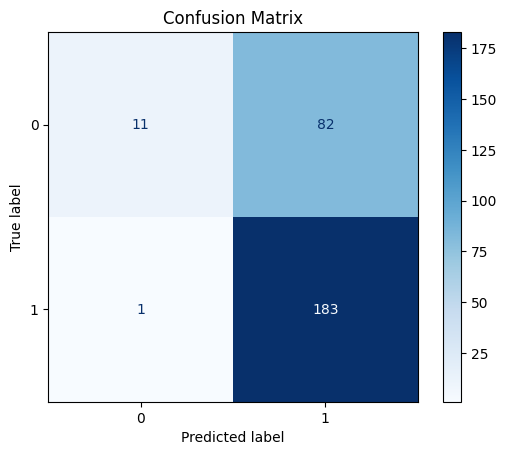

      Metric     Value
0    ROC AUC  0.747253
1       Gini  0.494507
2  Precision  0.690566
3     Recall  0.994565
4   F1 Score  0.815145
5   Accuracy  0.700361
['new_year_holidays_period', 'diff_1', 'amount_rolling_mean_3']


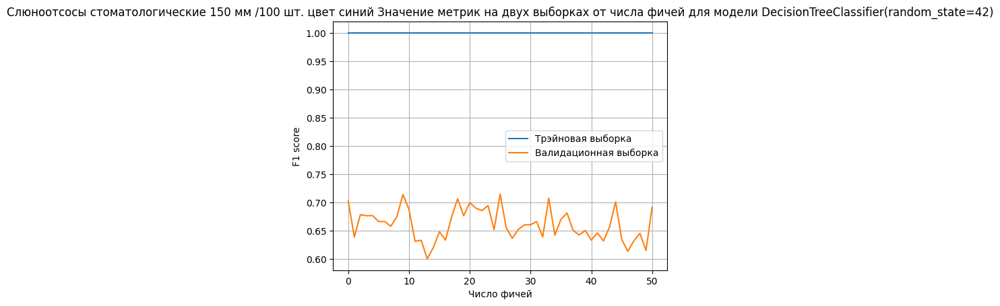

Crosvall
True Positives (TP): 123
True Negatives (TN): 40
False Positives (FP): 48
False Negatives (FN): 50
TPR: 0.7109826589595376
FPR: 0.5454545454545454
Presicion = TP / (TP + FP) = 123 / (123 + 48) = 123 / 171 = 0.7192982456140351
Recall = TP / (TP + FN) = 123 / (123 + 50) = 123 / 173 = 0.7109826589595376
F1 score = 2 * precision * recall / (precision + recall) = 0.7151162790697675


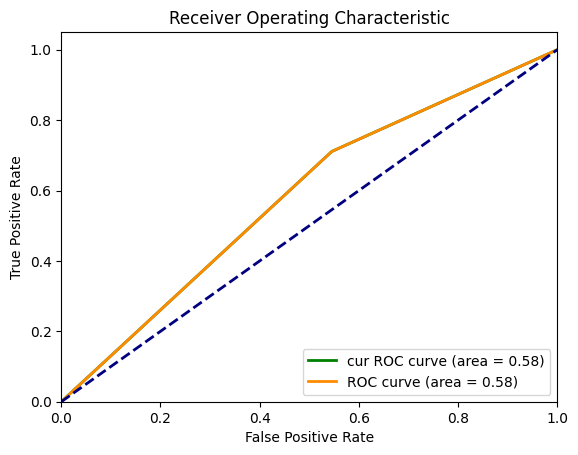

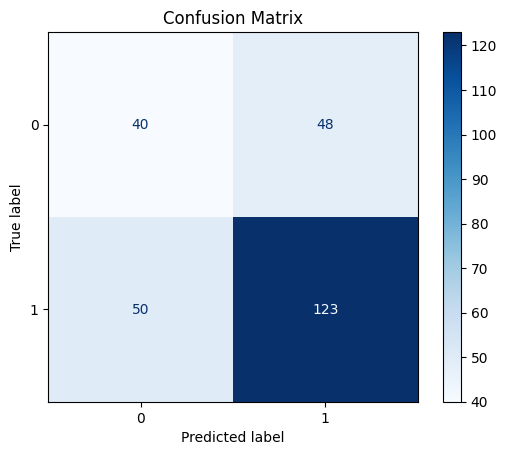

      Metric     Value
0    ROC AUC  0.582764
1       Gini  0.165528
2  Precision  0.719298
3     Recall  0.710983
4   F1 Score  0.715116
5   Accuracy  0.624521
Train


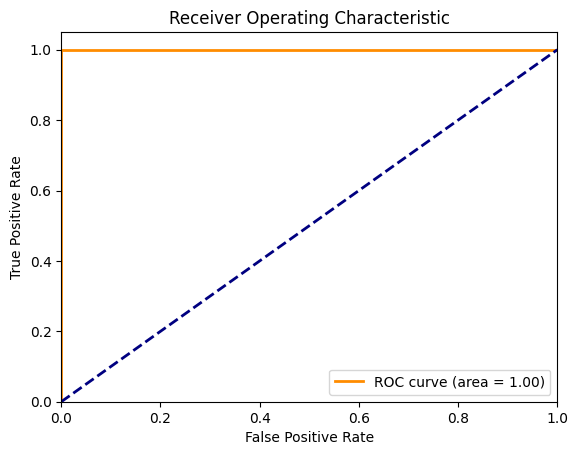

True Positives (TP): 184
True Negatives (TN): 93
False Positives (FP): 0
False Negatives (FN): 0
TPR: 1.0
FPR: 0.0


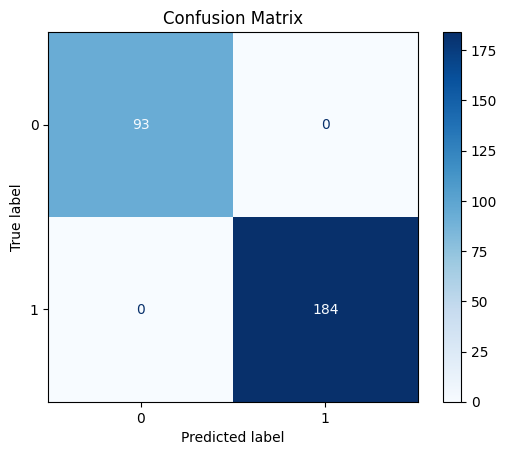

      Metric  Value
0    ROC AUC    1.0
1       Gini    1.0
2  Precision    1.0
3     Recall    1.0
4   F1 Score    1.0
5   Accuracy    1.0
['ewm_sales_week_7', 'unit_price', 'not_working_day', 'pre_holiday', 'not_working_day_prev', 'not_working_day_next', 'new_year_holidays_period', 'may_holidays_period', 'is_holiday', 'diff_1', 'diff_2', 'diff_3', 'diff_5', 'diff_7', 'diff_9', 'diff_12', 'diff_14', 'price_rolling_mean_2', 'price_rolling_mean_3', 'price_rolling_mean_5', 'price_rolling_mean_7', 'price_rolling_mean_9', 'price_rolling_mean_12', 'price_rolling_mean_14', 'amount_rolling_mean_2', 'amount_rolling_mean_3']


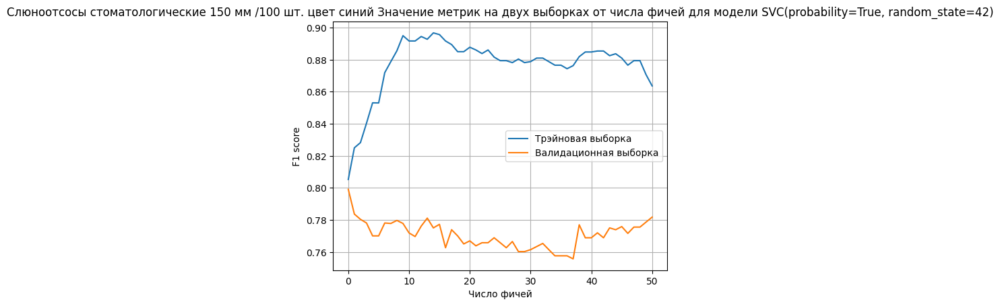

Crosvall
True Positives (TP): 173
True Negatives (TN): 1
False Positives (FP): 87
False Negatives (FN): 0
TPR: 1.0
FPR: 0.9886363636363636
Presicion = TP / (TP + FP) = 173 / (173 + 87) = 173 / 260 = 0.6653846153846154
Recall = TP / (TP + FN) = 173 / (173 + 0) = 173 / 173 = 1.0
F1 score = 2 * precision * recall / (precision + recall) = 0.7990762124711317


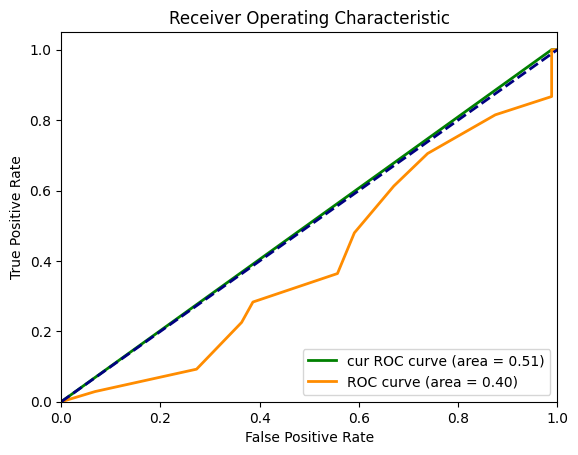

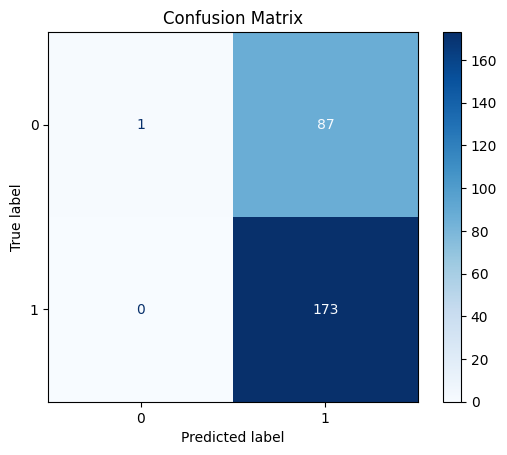

      Metric     Value
0    ROC AUC  0.402161
1       Gini -0.195678
2  Precision  0.665385
3     Recall  1.000000
4   F1 Score  0.799076
5   Accuracy  0.666667
Train


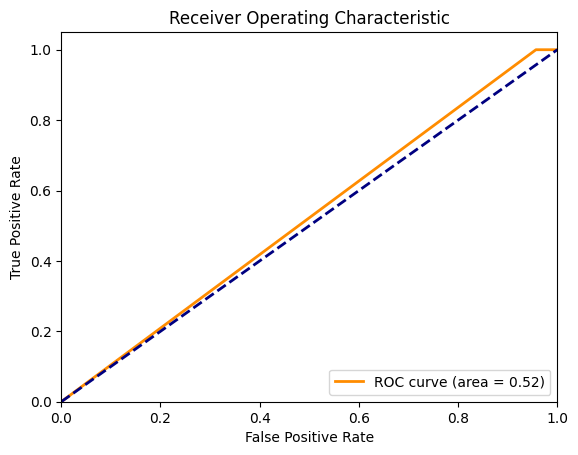

True Positives (TP): 184
True Negatives (TN): 4
False Positives (FP): 89
False Negatives (FN): 0
TPR: 1.0
FPR: 0.956989247311828


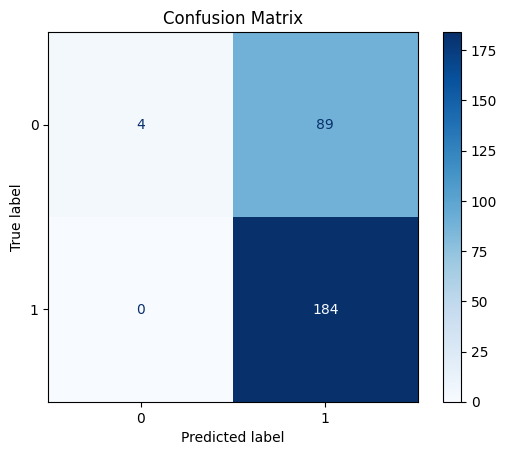

      Metric     Value
0    ROC AUC  0.521505
1       Gini  0.043011
2  Precision  0.673993
3     Recall  1.000000
4   F1 Score  0.805252
5   Accuracy  0.678700
['new_year_holidays_period']


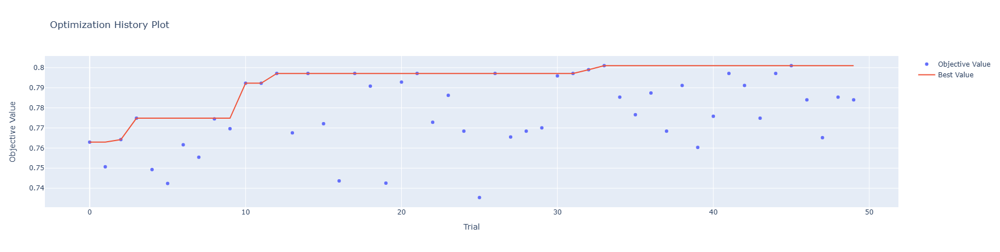

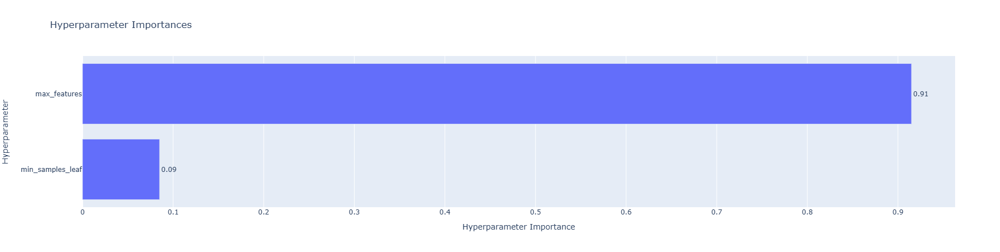

Best trial:
  Value: 0.8010075566750631
  Params: 
    min_samples_leaf: 5
    max_features: 2


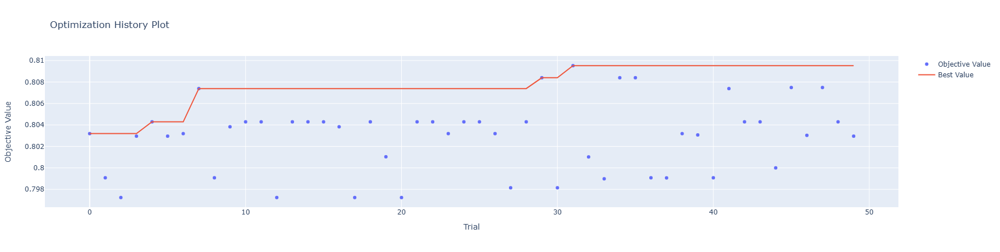

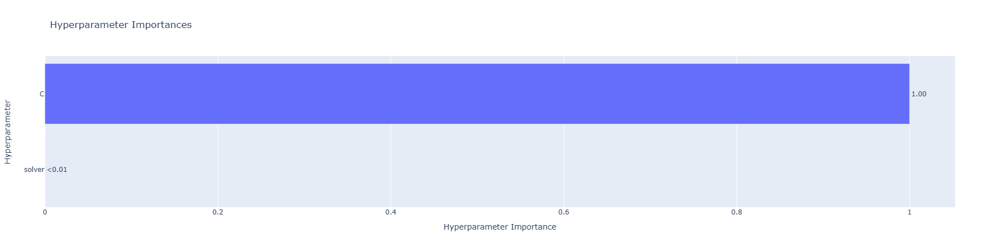

Best trial:
  Value: 0.8095238095238094
  Params: 
    C: 1.8117195407391977
    solver: saga
    l1_ratio: 0.629486827754353


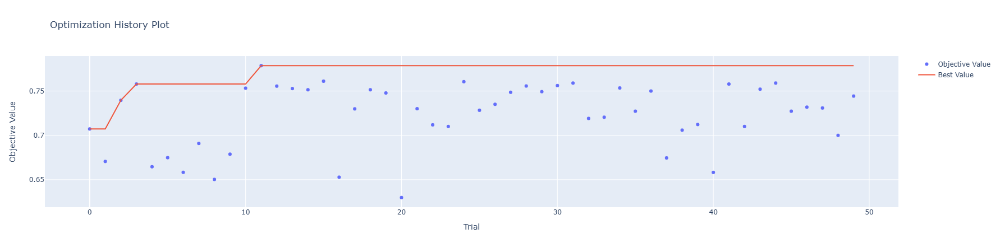

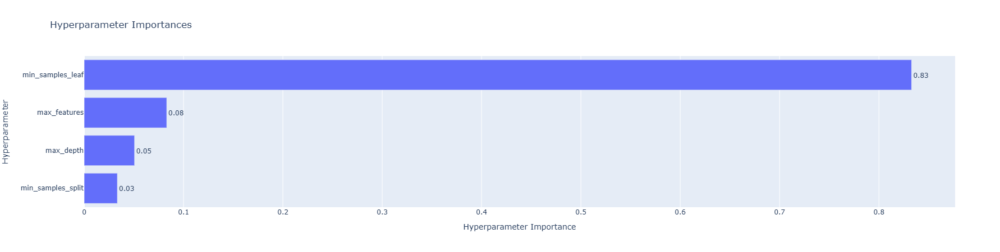

Best trial:
  Value: 0.7786259541984734
  Params: 
    max_depth: 23
    min_samples_split: 2
    min_samples_leaf: 20
    max_features: 23


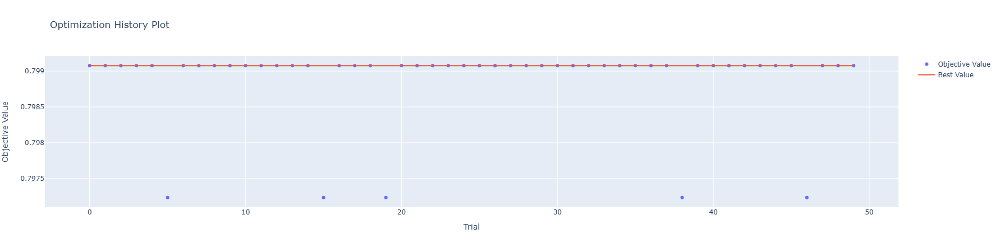

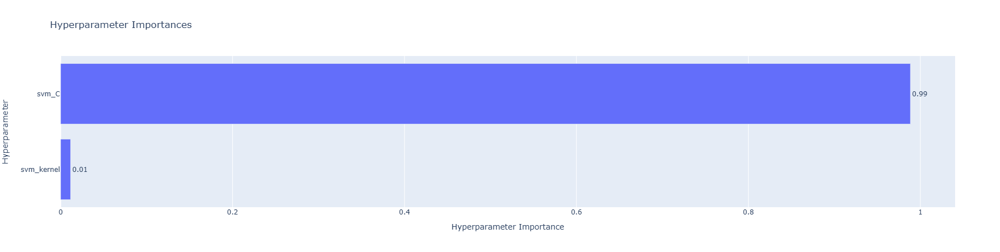

Best trial:
  Value: 0.7990762124711317
  Params: 
    svm_C: 0.23857822880992394
    svm_kernel: rbf
True Positives (TP): 159
True Negatives (TN): 23
False Positives (FP): 65
False Negatives (FN): 14
TPR: 0.9190751445086706
FPR: 0.7386363636363636
Presicion = TP / (TP + FP) = 159 / (159 + 65) = 159 / 224 = 0.7098214285714286
Recall = TP / (TP + FN) = 159 / (159 + 14) = 159 / 173 = 0.9190751445086706
F1 score = 2 * precision * recall / (precision + recall) = 0.8010075566750631


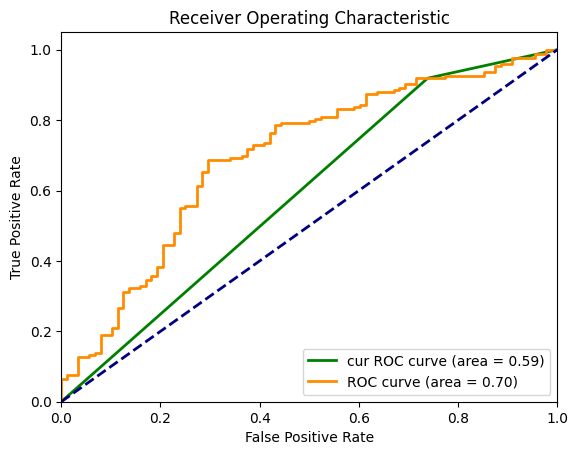

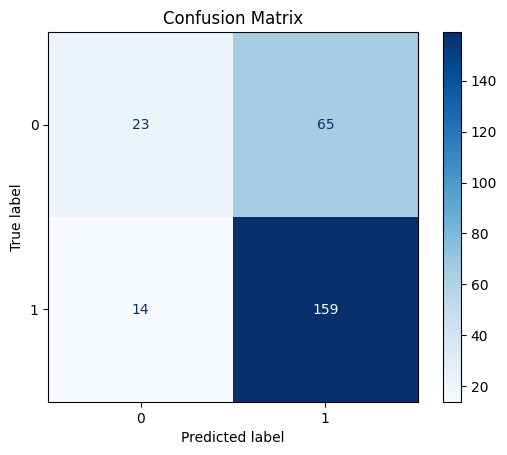

      Metric     Value
0    ROC AUC  0.697583
1       Gini  0.395166
2  Precision  0.709821
3     Recall  0.919075
4   F1 Score  0.801008
5   Accuracy  0.697318
True Positives (TP): 153
True Negatives (TN): 36
False Positives (FP): 52
False Negatives (FN): 20
TPR: 0.884393063583815
FPR: 0.5909090909090909
Presicion = TP / (TP + FP) = 153 / (153 + 52) = 153 / 205 = 0.7463414634146341
Recall = TP / (TP + FN) = 153 / (153 + 20) = 153 / 173 = 0.884393063583815
F1 score = 2 * precision * recall / (precision + recall) = 0.8095238095238094


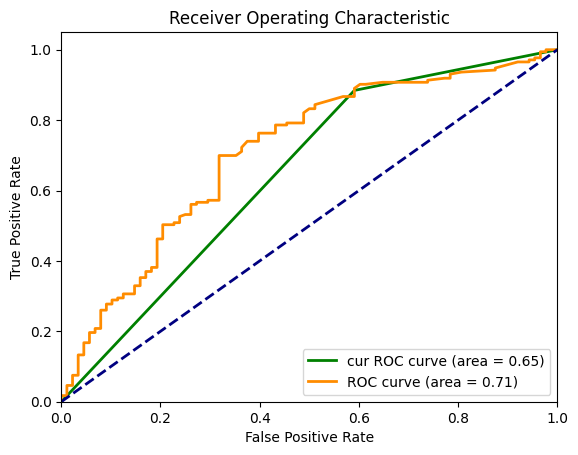

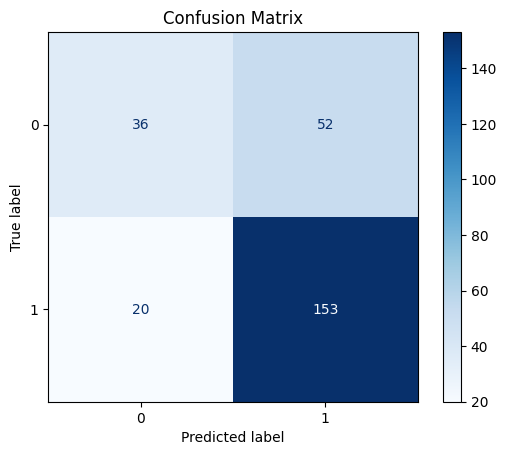

      Metric     Value
0    ROC AUC  0.709669
1       Gini  0.419338
2  Precision  0.746341
3     Recall  0.884393
4   F1 Score  0.809524
5   Accuracy  0.724138
True Positives (TP): 153
True Negatives (TN): 21
False Positives (FP): 67
False Negatives (FN): 20
TPR: 0.884393063583815
FPR: 0.7613636363636364
Presicion = TP / (TP + FP) = 153 / (153 + 67) = 153 / 220 = 0.6954545454545454
Recall = TP / (TP + FN) = 153 / (153 + 20) = 153 / 173 = 0.884393063583815
F1 score = 2 * precision * recall / (precision + recall) = 0.7786259541984734


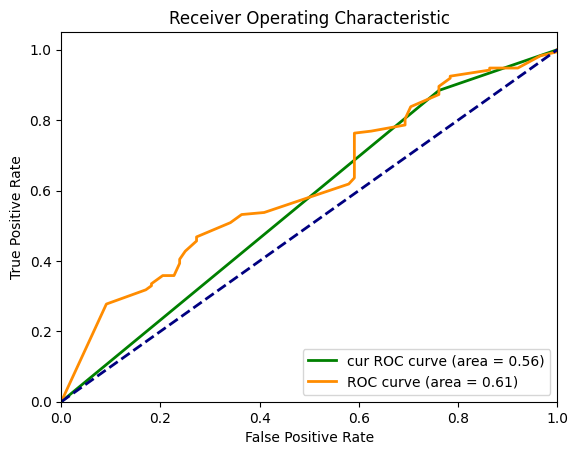

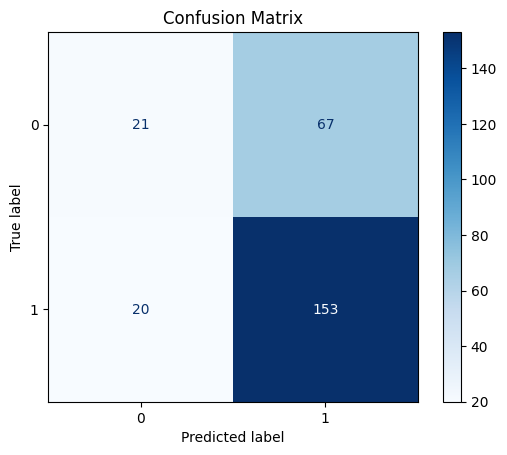

      Metric     Value
0    ROC AUC  0.613505
1       Gini  0.227010
2  Precision  0.695455
3     Recall  0.884393
4   F1 Score  0.778626
5   Accuracy  0.666667
True Positives (TP): 173
True Negatives (TN): 1
False Positives (FP): 87
False Negatives (FN): 0
TPR: 1.0
FPR: 0.9886363636363636
Presicion = TP / (TP + FP) = 173 / (173 + 87) = 173 / 260 = 0.6653846153846154
Recall = TP / (TP + FN) = 173 / (173 + 0) = 173 / 173 = 1.0
F1 score = 2 * precision * recall / (precision + recall) = 0.7990762124711317


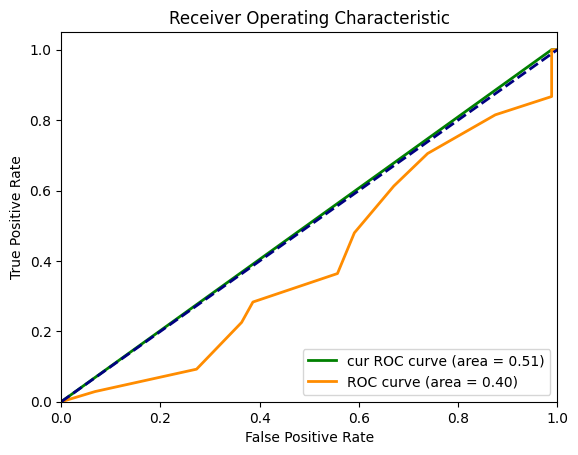

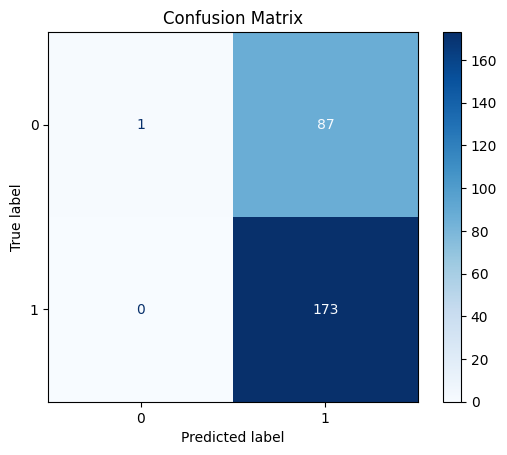

      Metric     Value
0    ROC AUC  0.402161
1       Gini -0.195678
2  Precision  0.665385
3     Recall  1.000000
4   F1 Score  0.799076
5   Accuracy  0.666667
Результат для Слюноотсосы стоматологические 150 мм /100 шт. цвет синий


,Model,Standart Features,Best features,Bset Features and Hyperparameters
0,RandomForest,0.690265,0.773842,"[0.5902193904361535, 0.8010075566750631]"
1,LogReg,0.693989,0.808399,"[0.646741986337362, 0.8095238095238094]"
2,Tree,0.645892,0.715116,"[0.5615147136100893, 0.7786259541984734]"
3,SVM,0.781726,0.799076,"[0.5056818181818182, 0.7990762124711317]"


In [61]:
for idx in ['1А51031А5103Синий']:
    item_id = wb_df[wb_df['sku_id'] == idx]['sku_name'].unique()[0]
    cur_train, cur_val, useless_features = make_df(item_id, st_date, fn_date, st_date_test, fn_date_test)
    useless_features = np.delete(useless_features[2:], 8) 
    model_array = []
    model_array.append(RandomForestClassifier(random_state=42))
    model_array.append(LogisticRegression(random_state=42))
    model_array.append(DecisionTreeClassifier(random_state=42))
    model_array.append(SVC(random_state=42, probability=True))
    first_iter_metrics = []
    for i in range(4):
        z, _ = sales_mask(cur_train, cur_val, useless_features, model=model_array[i], print_flag=False)
        first_iter_metrics.append(_[1])
    print(first_iter_metrics)
    rf_features, rf_metr = give_rf_features(item_id)
    log_features, log_metr = give_log_features(item_id)
    tree_features, tree_metr = give_tree_features(item_id)
    svm_features, svm_metr = give_svm_features(item_id)
    
    second_iter_metrics = [rf_metr, log_metr, tree_metr, svm_metr]
    
    rf_best_params = find_best_params(rf_objective, 50)
    log_best_params = find_best_params(log_objective, 50)
    tree_best_params = find_best_params(tree_objective, 50)
    svm_best_params = find_best_params(svm_objective, 50)
    
    model_1 = RandomForestClassifier(
        min_samples_leaf=rf_best_params['min_samples_leaf'],
        max_features=rf_best_params['max_features'],
        random_state=42
        )
    
    model_2 = LogisticRegression(
        C = log_best_params['C'],
        solver=log_best_params['solver'],
        max_iter=1000,
        random_state=42
        )
    
    model_3 =  DecisionTreeClassifier(
        max_depth=tree_best_params['max_depth'],
        min_samples_split=tree_best_params['min_samples_split'],
        min_samples_leaf=tree_best_params['min_samples_leaf'],
        max_features=tree_best_params['max_features'],
        random_state=42
        )
    
    model_4 = SVC(C=svm_best_params['svm_C'], kernel=svm_best_params['svm_kernel'], probability=True, random_state=42)
    
    rf_metr_upd = evaluate(model_1, rf_features)
    log_metr_upd = evaluate(model_2, log_features)
    tree_metr_upd = evaluate(model_3, tree_features)
    svm_metr_upd = evaluate(model_4, svm_features)
    
    third_iter_metrics = [rf_metr_upd, log_metr_upd, tree_metr_upd, svm_metr_upd]
    result = {
            "Model": ["RandomForest", "LogReg", "Tree", "SVM"],
            "Standart Features" : first_iter_metrics,
            "Best features" : second_iter_metrics,
            "Bset Features and Hyperparameters" : third_iter_metrics
    }
    print(f"Результат для {item_id}")
    result = pd.DataFrame(result)
    from IPython.display import display
    display(result)

[0.9052969502407705, 0.8620102214650767, 0.7948243992606284, 0.9070866141732284]


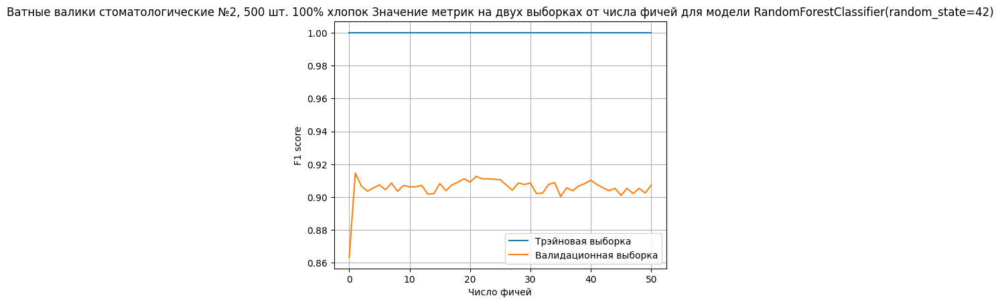

Crosvall
True Positives (TP): 284
True Negatives (TN): 10
False Positives (FP): 49
False Negatives (FN): 4
TPR: 0.9861111111111112
FPR: 0.8305084745762712
Presicion = TP / (TP + FP) = 284 / (284 + 49) = 284 / 333 = 0.8528528528528528
Recall = TP / (TP + FN) = 284 / (284 + 4) = 284 / 288 = 0.9861111111111112
F1 score = 2 * precision * recall / (precision + recall) = 0.9146537842190017


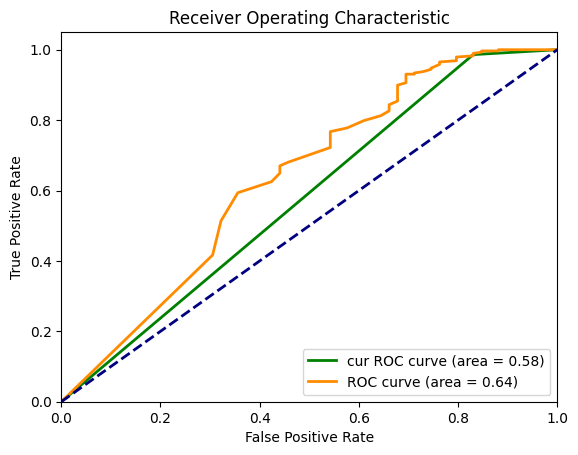

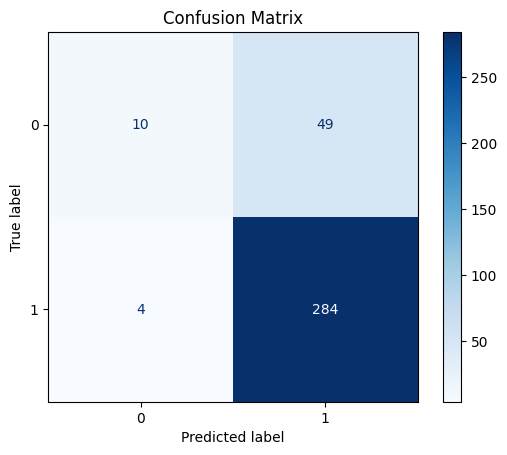

      Metric     Value
0    ROC AUC  0.636005
1       Gini  0.272010
2  Precision  0.852853
3     Recall  0.986111
4   F1 Score  0.914654
5   Accuracy  0.847262
Train


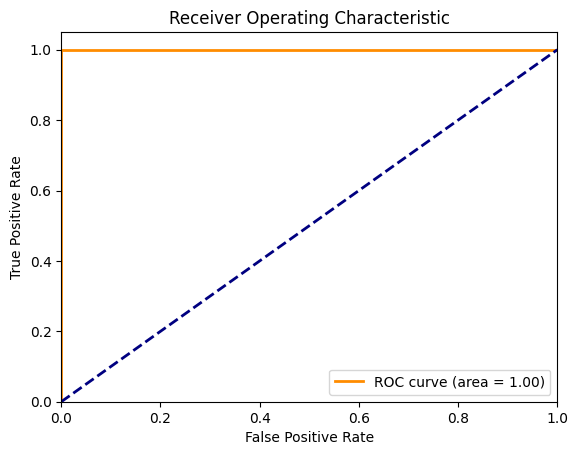

True Positives (TP): 294
True Negatives (TN): 56
False Positives (FP): 0
False Negatives (FN): 0
TPR: 1.0
FPR: 0.0


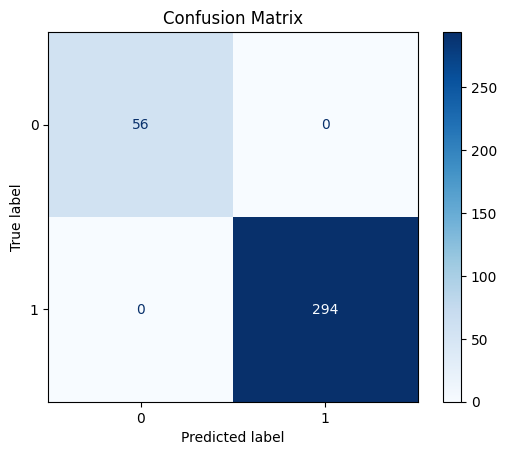

      Metric  Value
0    ROC AUC    1.0
1       Gini    1.0
2  Precision    1.0
3     Recall    1.0
4   F1 Score    1.0
5   Accuracy    1.0
['ewm_sales_week_3', 'unit_price']


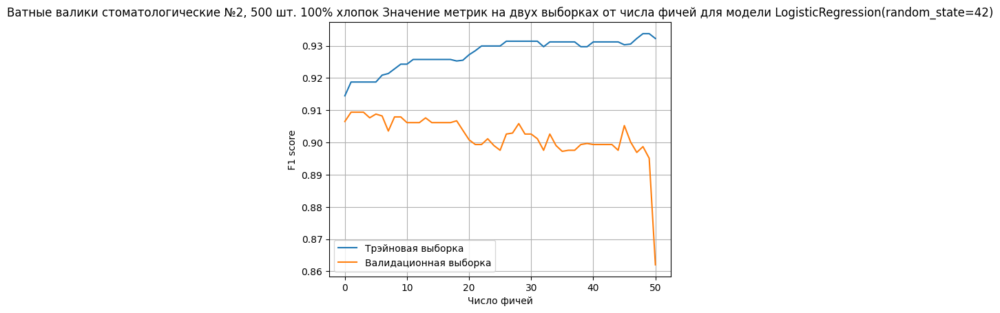

Crosvall
True Positives (TP): 286
True Negatives (TN): 4
False Positives (FP): 55
False Negatives (FN): 2
TPR: 0.9930555555555556
FPR: 0.9322033898305084
Presicion = TP / (TP + FP) = 286 / (286 + 55) = 286 / 341 = 0.8387096774193549
Recall = TP / (TP + FN) = 286 / (286 + 2) = 286 / 288 = 0.9930555555555556
F1 score = 2 * precision * recall / (precision + recall) = 0.9093799682034978


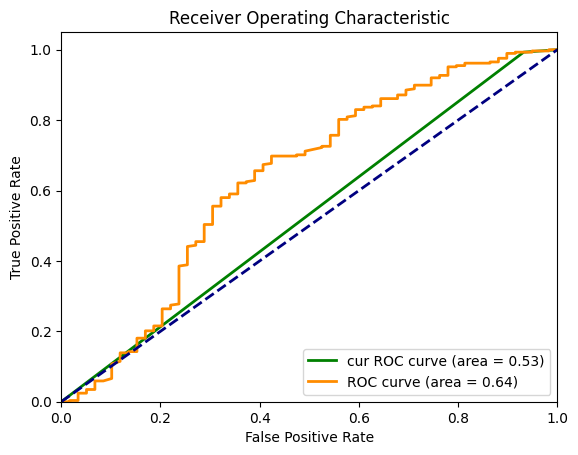

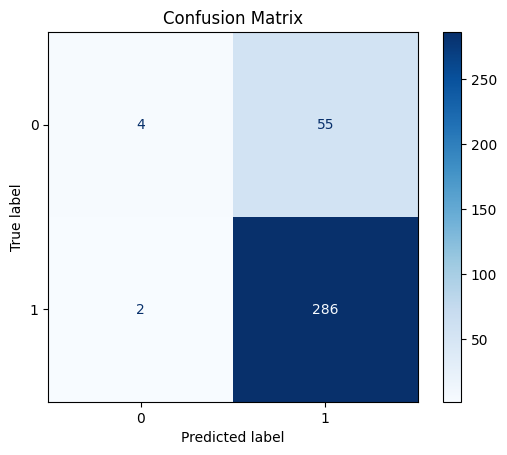

      Metric     Value
0    ROC AUC  0.635034
1       Gini  0.270068
2  Precision  0.838710
3     Recall  0.993056
4   F1 Score  0.909380
5   Accuracy  0.835735
Train


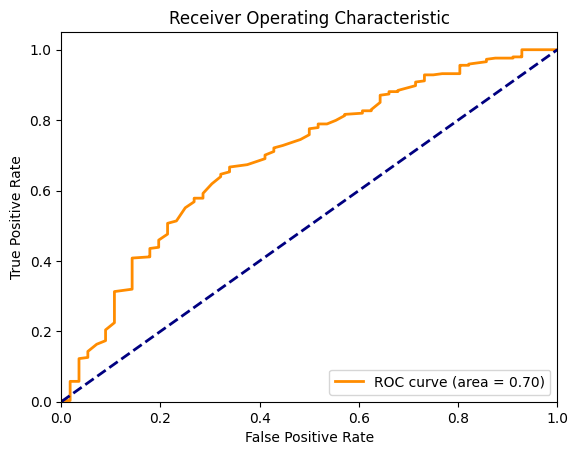

True Positives (TP): 294
True Negatives (TN): 4
False Positives (FP): 52
False Negatives (FN): 0
TPR: 1.0
FPR: 0.9285714285714286


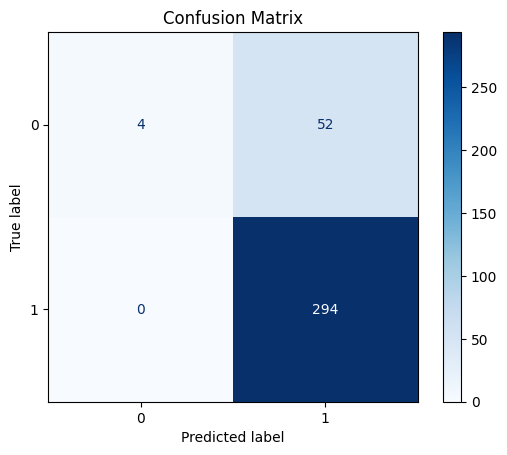

      Metric     Value
0    ROC AUC  0.695123
1       Gini  0.390245
2  Precision  0.849711
3     Recall  1.000000
4   F1 Score  0.918750
5   Accuracy  0.851429
['diff_2', 'diff_5']


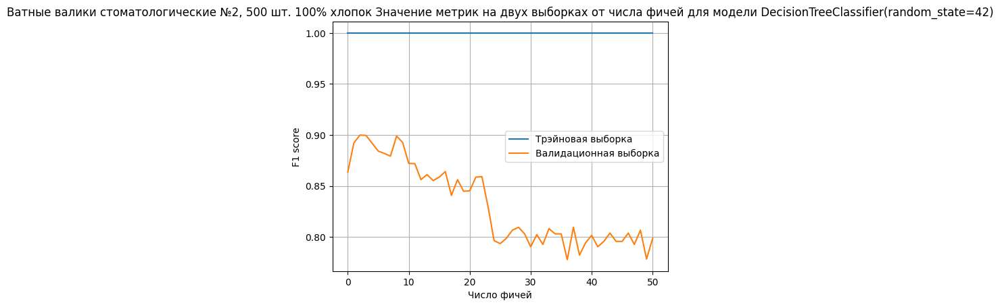

Crosvall
True Positives (TP): 274
True Negatives (TN): 12
False Positives (FP): 47
False Negatives (FN): 14
TPR: 0.9513888888888888
FPR: 0.7966101694915254
Presicion = TP / (TP + FP) = 274 / (274 + 47) = 274 / 321 = 0.8535825545171339
Recall = TP / (TP + FN) = 274 / (274 + 14) = 274 / 288 = 0.9513888888888888
F1 score = 2 * precision * recall / (precision + recall) = 0.8998357963875205


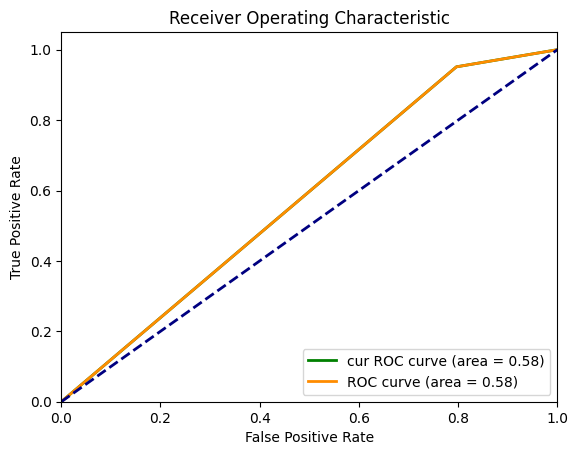

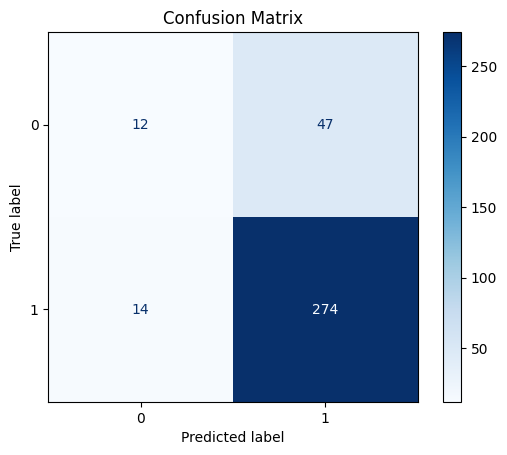

      Metric     Value
0    ROC AUC  0.577389
1       Gini  0.154779
2  Precision  0.853583
3     Recall  0.951389
4   F1 Score  0.899836
5   Accuracy  0.824207
Train


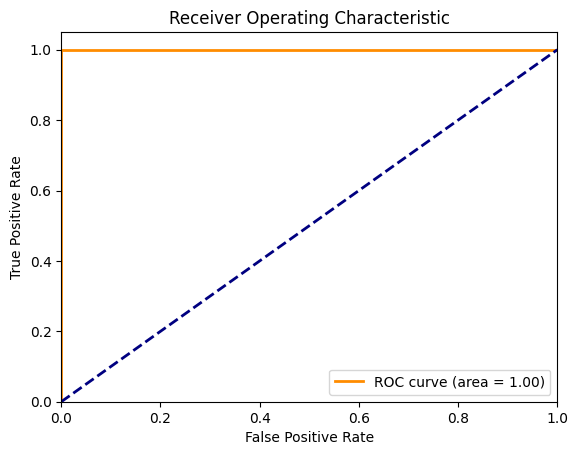

True Positives (TP): 294
True Negatives (TN): 56
False Positives (FP): 0
False Negatives (FN): 0
TPR: 1.0
FPR: 0.0


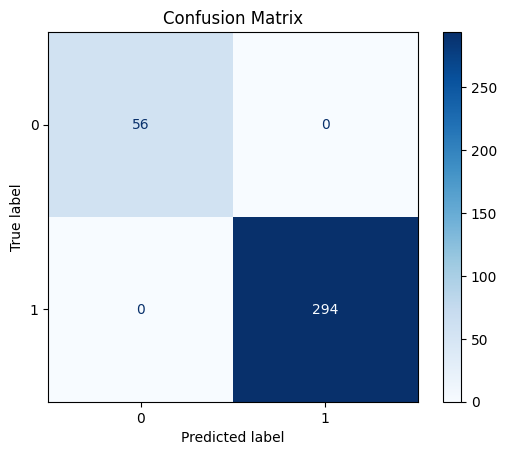

      Metric  Value
0    ROC AUC    1.0
1       Gini    1.0
2  Precision    1.0
3     Recall    1.0
4   F1 Score    1.0
5   Accuracy    1.0
['ewm_sales_week_3', 'unit_price', 'not_working_day']


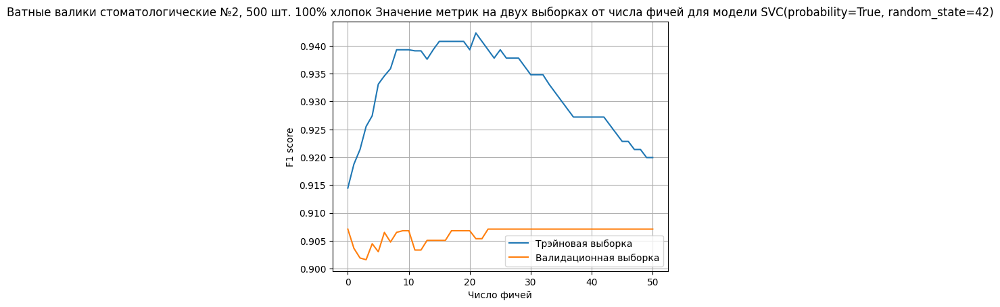

Crosvall
True Positives (TP): 288
True Negatives (TN): 0
False Positives (FP): 59
False Negatives (FN): 0
TPR: 1.0
FPR: 1.0
Presicion = TP / (TP + FP) = 288 / (288 + 59) = 288 / 347 = 0.829971181556196
Recall = TP / (TP + FN) = 288 / (288 + 0) = 288 / 288 = 1.0
F1 score = 2 * precision * recall / (precision + recall) = 0.9070866141732284


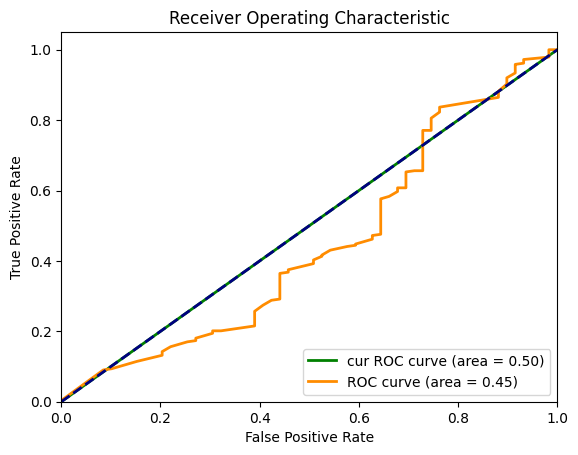

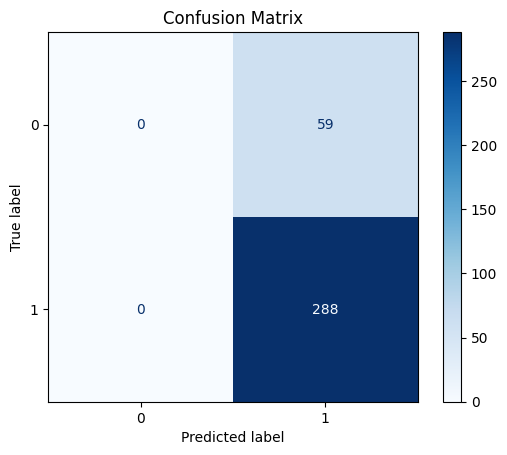

      Metric     Value
0    ROC AUC  0.445504
1       Gini -0.108992
2  Precision  0.829971
3     Recall  1.000000
4   F1 Score  0.907087
5   Accuracy  0.829971
Train


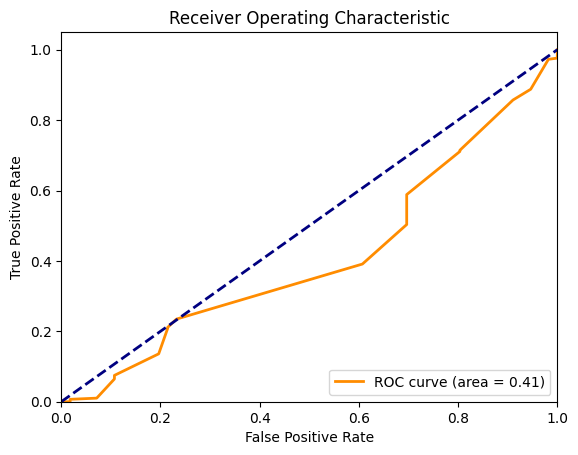

True Positives (TP): 294
True Negatives (TN): 1
False Positives (FP): 55
False Negatives (FN): 0
TPR: 1.0
FPR: 0.9821428571428571


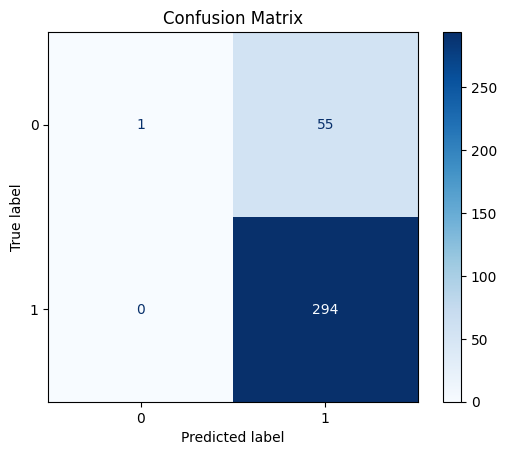

      Metric     Value
0    ROC AUC  0.411109
1       Gini -0.177782
2  Precision  0.842407
3     Recall  1.000000
4   F1 Score  0.914463
5   Accuracy  0.842857
['diff_1']


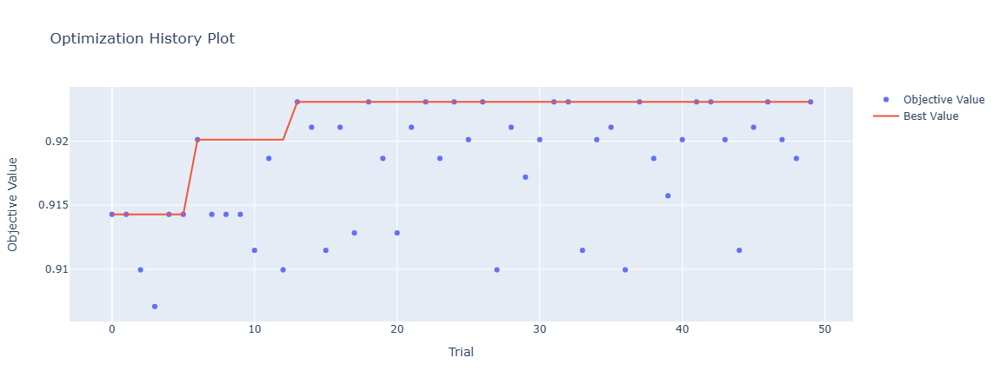

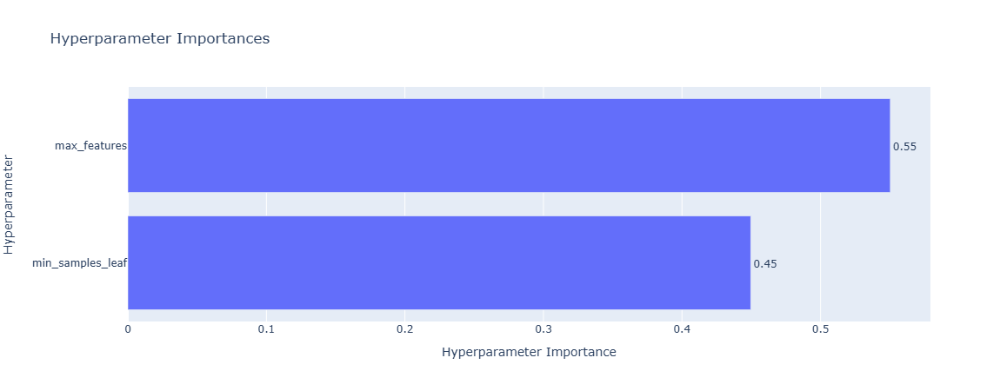

Best trial:
  Value: 0.923076923076923
  Params: 
    min_samples_leaf: 3
    max_features: 2


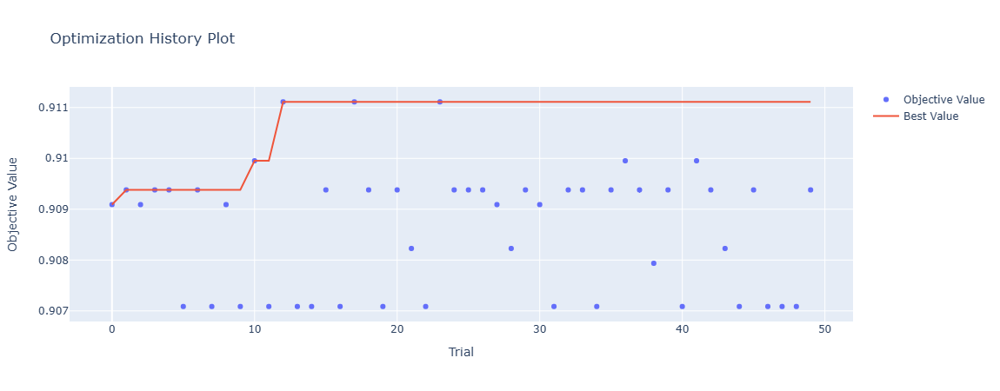

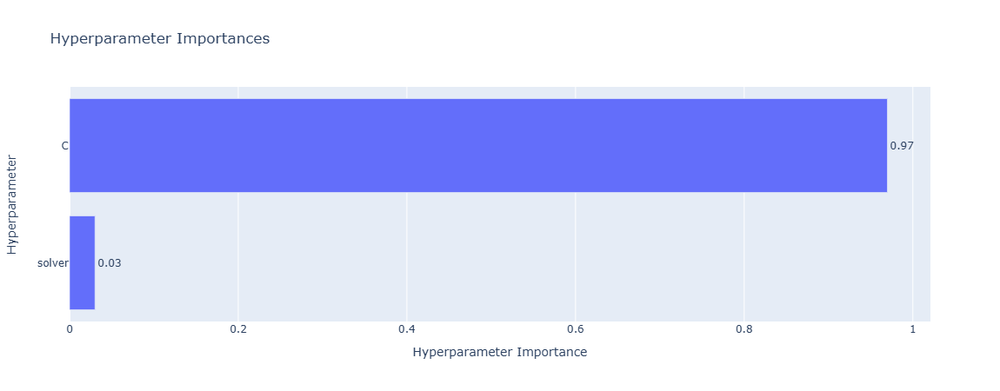

Best trial:
  Value: 0.9111111111111112
  Params: 
    C: 0.15362717169068912
    solver: lbfgs


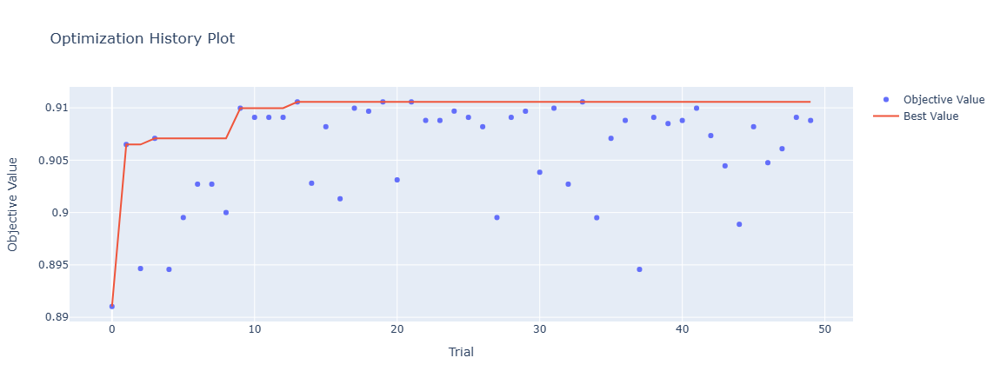

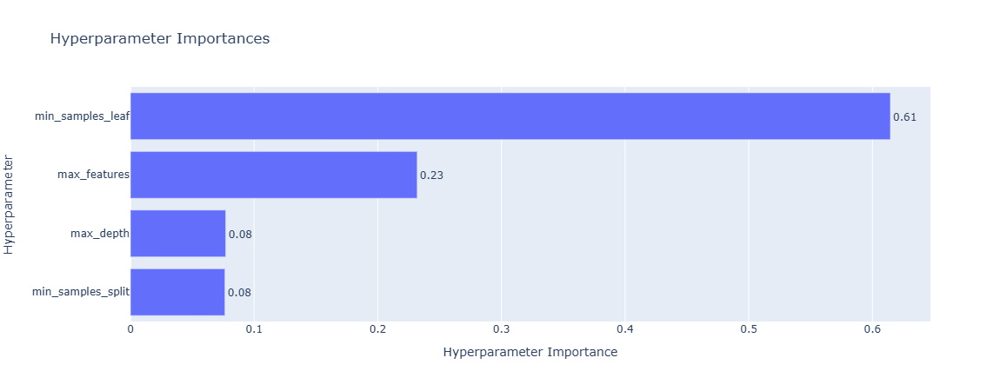

Best trial:
  Value: 0.9105691056910569
  Params: 
    max_depth: 22
    min_samples_split: 6
    min_samples_leaf: 10
    max_features: 3


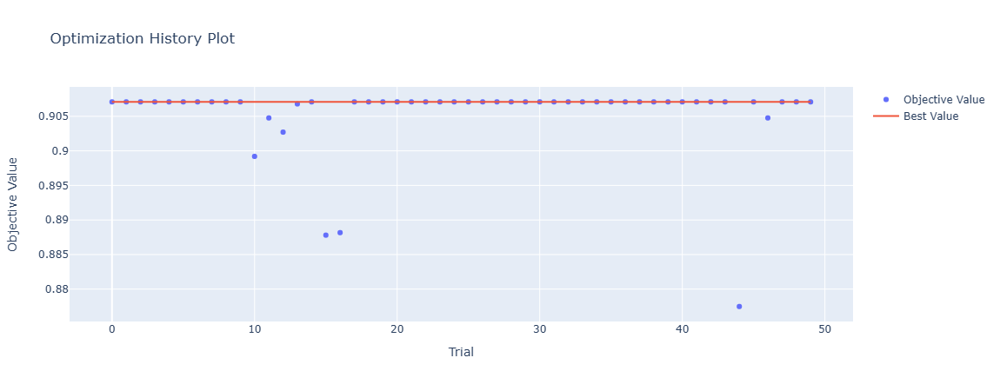

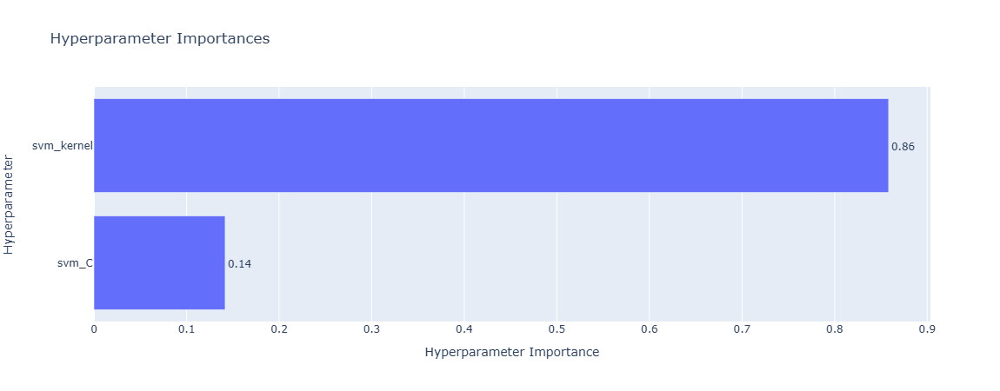

Best trial:
  Value: 0.9070866141732284
  Params: 
    svm_C: 0.02460871951780029
    svm_kernel: sigmoid
True Positives (TP): 288
True Negatives (TN): 11
False Positives (FP): 48
False Negatives (FN): 0
TPR: 1.0
FPR: 0.8135593220338984
Presicion = TP / (TP + FP) = 288 / (288 + 48) = 288 / 336 = 0.8571428571428571
Recall = TP / (TP + FN) = 288 / (288 + 0) = 288 / 288 = 1.0
F1 score = 2 * precision * recall / (precision + recall) = 0.923076923076923


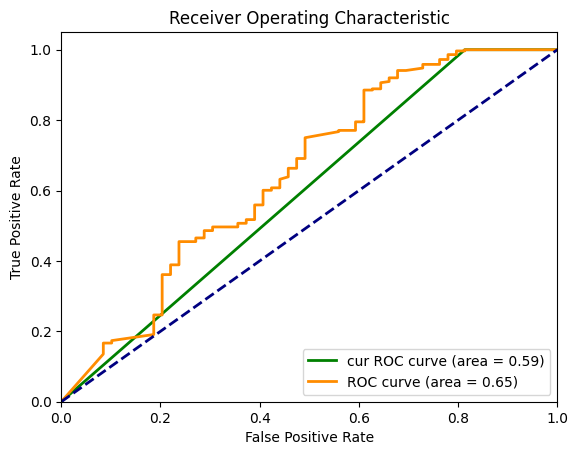

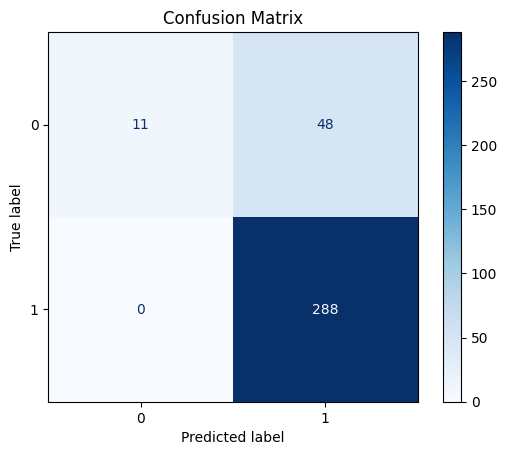

      Metric     Value
0    ROC AUC  0.647805
1       Gini  0.295610
2  Precision  0.857143
3     Recall  1.000000
4   F1 Score  0.923077
5   Accuracy  0.861671
True Positives (TP): 287
True Negatives (TN): 4
False Positives (FP): 55
False Negatives (FN): 1
TPR: 0.9965277777777778
FPR: 0.9322033898305084
Presicion = TP / (TP + FP) = 287 / (287 + 55) = 287 / 342 = 0.8391812865497076
Recall = TP / (TP + FN) = 287 / (287 + 1) = 287 / 288 = 0.9965277777777778
F1 score = 2 * precision * recall / (precision + recall) = 0.9111111111111112


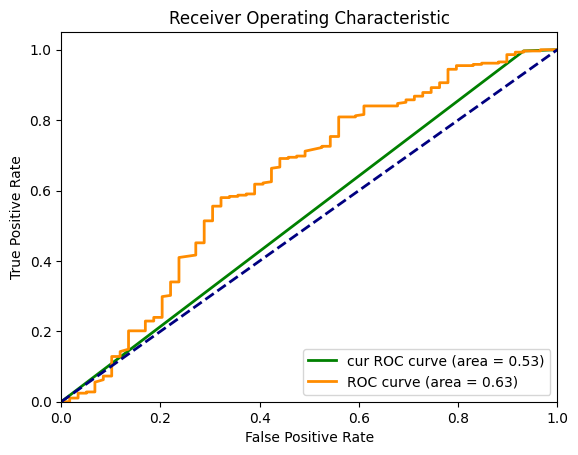

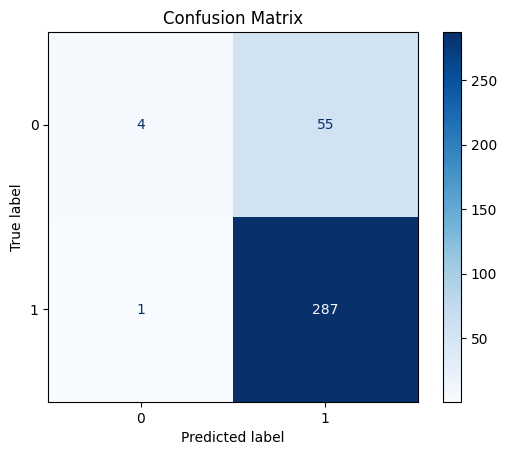

      Metric     Value
0    ROC AUC  0.632033
1       Gini  0.264065
2  Precision  0.839181
3     Recall  0.996528
4   F1 Score  0.911111
5   Accuracy  0.838617
True Positives (TP): 280
True Negatives (TN): 12
False Positives (FP): 47
False Negatives (FN): 8
TPR: 0.9722222222222222
FPR: 0.7966101694915254
Presicion = TP / (TP + FP) = 280 / (280 + 47) = 280 / 327 = 0.8562691131498471
Recall = TP / (TP + FN) = 280 / (280 + 8) = 280 / 288 = 0.9722222222222222
F1 score = 2 * precision * recall / (precision + recall) = 0.9105691056910569


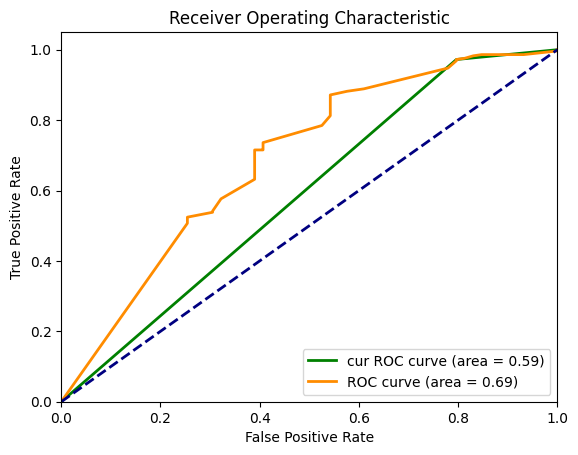

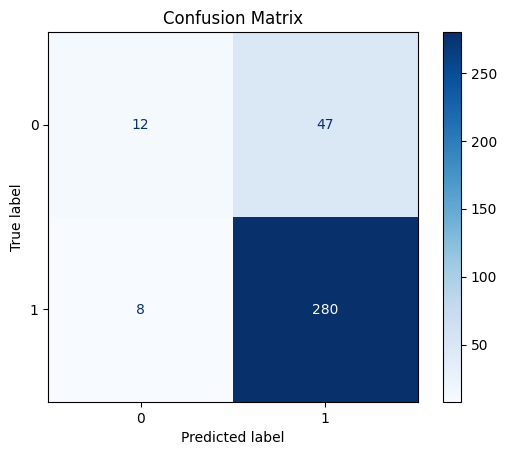

      Metric     Value
0    ROC AUC  0.689972
1       Gini  0.379944
2  Precision  0.856269
3     Recall  0.972222
4   F1 Score  0.910569
5   Accuracy  0.841499
True Positives (TP): 288
True Negatives (TN): 0
False Positives (FP): 59
False Negatives (FN): 0
TPR: 1.0
FPR: 1.0
Presicion = TP / (TP + FP) = 288 / (288 + 59) = 288 / 347 = 0.829971181556196
Recall = TP / (TP + FN) = 288 / (288 + 0) = 288 / 288 = 1.0
F1 score = 2 * precision * recall / (precision + recall) = 0.9070866141732284


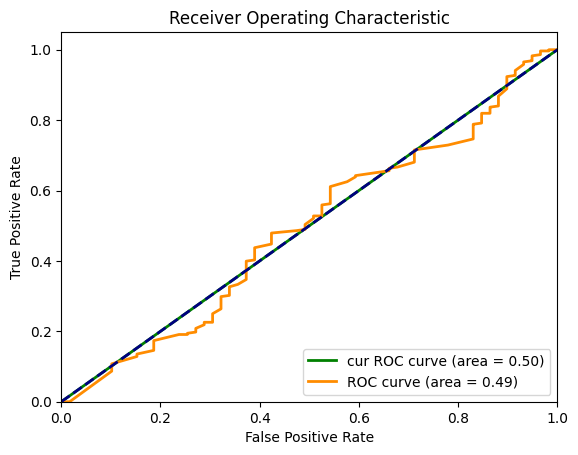

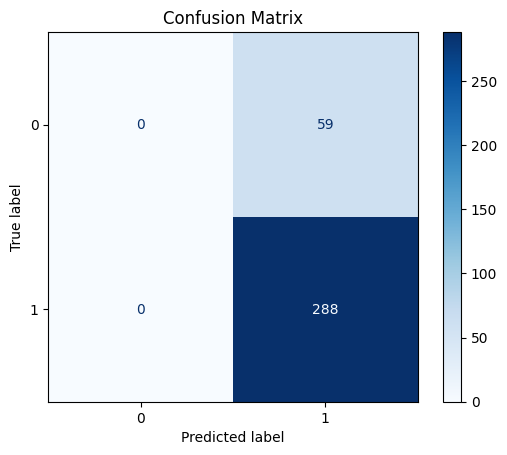

      Metric     Value
0    ROC AUC  0.491614
1       Gini -0.016773
2  Precision  0.829971
3     Recall  1.000000
4   F1 Score  0.907087
5   Accuracy  0.829971
Результат для Ватные валики стоматологические №2, 500 шт. 100% хлопок


,Model,Standart Features,Best features,Bset Features and Hyperparameters
0,RandomForest,0.905297,0.914654,"[0.5932203389830508, 0.923076923076923]"
1,LogReg,0.862010,0.909380,"[0.5321621939736346, 0.9111111111111112]"
2,Tree,0.794824,0.899836,"[0.5878060263653484, 0.9105691056910569]"
3,SVM,0.907087,0.907087,"[0.5, 0.9070866141732284]"


In [62]:
for idx in ['1А00151А0015Б']:
    item_id = wb_df[wb_df['sku_id'] == idx]['sku_name'].unique()[0]
    cur_train, cur_val, useless_features = make_df(item_id, st_date, fn_date, st_date_test, fn_date_test)
    useless_features = np.delete(useless_features[2:], 8) 
    model_array = []
    model_array.append(RandomForestClassifier(random_state=42))
    model_array.append(LogisticRegression(random_state=42))
    model_array.append(DecisionTreeClassifier(random_state=42))
    model_array.append(SVC(random_state=42, probability=True))
    first_iter_metrics = []
    for i in range(4):
        z, _ = sales_mask(cur_train, cur_val, useless_features, model=model_array[i], print_flag=False)
        first_iter_metrics.append(_[1])
    print(first_iter_metrics)
    rf_features, rf_metr = give_rf_features(item_id)
    log_features, log_metr = give_log_features(item_id)
    tree_features, tree_metr = give_tree_features(item_id)
    svm_features, svm_metr = give_svm_features(item_id)
    
    second_iter_metrics = [rf_metr, log_metr, tree_metr, svm_metr]
    
    rf_best_params = find_best_params(rf_objective, 50)
    log_best_params = find_best_params(log_objective, 50)
    tree_best_params = find_best_params(tree_objective, 50)
    svm_best_params = find_best_params(svm_objective, 50)
    
    model_1 = RandomForestClassifier(
        min_samples_leaf=rf_best_params['min_samples_leaf'],
        max_features=rf_best_params['max_features'],
        random_state=42
        )
    
    model_2 = LogisticRegression(
        C = log_best_params['C'],
        solver=log_best_params['solver'],
        max_iter=1000,
        random_state=42
        )
    
    model_3 =  DecisionTreeClassifier(
        max_depth=tree_best_params['max_depth'],
        min_samples_split=tree_best_params['min_samples_split'],
        min_samples_leaf=tree_best_params['min_samples_leaf'],
        max_features=tree_best_params['max_features'],
        random_state=42
        )
    
    model_4 = SVC(C=svm_best_params['svm_C'], kernel=svm_best_params['svm_kernel'], probability=True, random_state=42)
    
    rf_metr_upd = evaluate(model_1, rf_features)
    log_metr_upd = evaluate(model_2, log_features)
    tree_metr_upd = evaluate(model_3, tree_features)
    svm_metr_upd = evaluate(model_4, svm_features)
    
    third_iter_metrics = [rf_metr_upd, log_metr_upd, tree_metr_upd, svm_metr_upd]
    result = {
            "Model": ["RandomForest", "LogReg", "Tree", "SVM"],
            "Standart Features" : first_iter_metrics,
            "Best features" : second_iter_metrics,
            "Bset Features and Hyperparameters" : third_iter_metrics
    }
    print(f"Результат для {item_id}")
    result = pd.DataFrame(result)
    from IPython.display import display
    display(result)

[0.5321100917431193, 0.5820433436532507, 0.553935860058309, 0.46840148698884754]


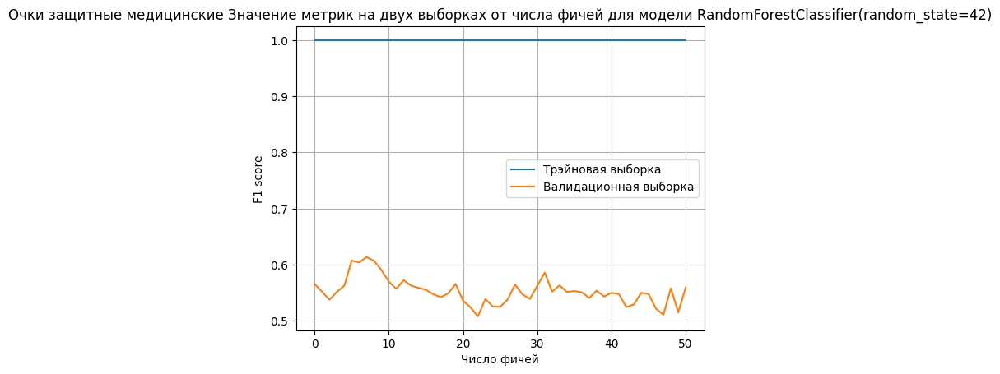

Crosvall
True Positives (TP): 100
True Negatives (TN): 102
False Positives (FP): 62
False Negatives (FN): 64
TPR: 0.6097560975609756
FPR: 0.3780487804878049
Presicion = TP / (TP + FP) = 100 / (100 + 62) = 100 / 162 = 0.6172839506172839
Recall = TP / (TP + FN) = 100 / (100 + 64) = 100 / 164 = 0.6097560975609756
F1 score = 2 * precision * recall / (precision + recall) = 0.6134969325153374


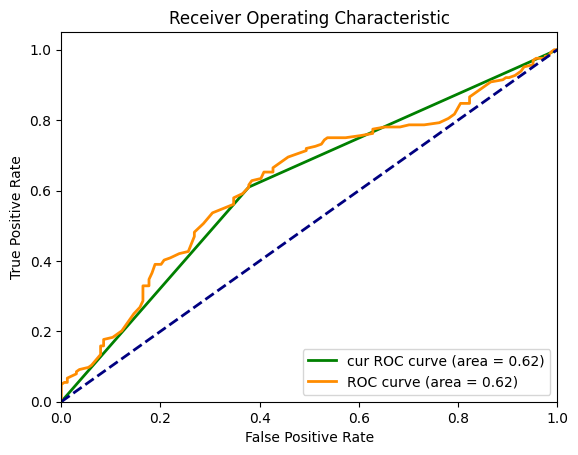

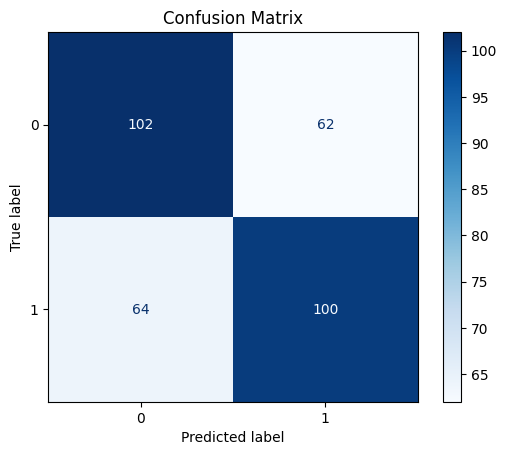

      Metric     Value
0    ROC AUC  0.624814
1       Gini  0.249628
2  Precision  0.617284
3     Recall  0.609756
4   F1 Score  0.613497
5   Accuracy  0.615854
Train


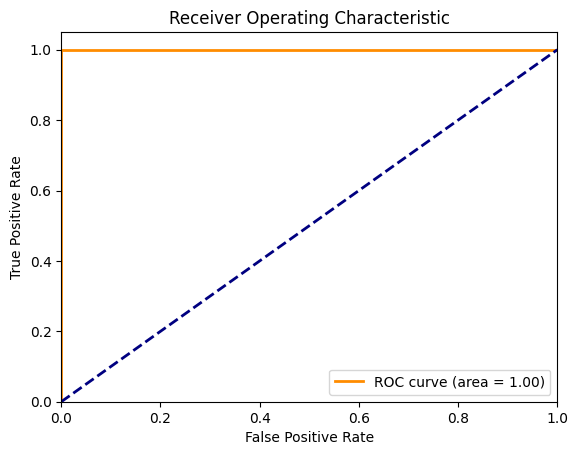

True Positives (TP): 154
True Negatives (TN): 175
False Positives (FP): 0
False Negatives (FN): 0
TPR: 1.0
FPR: 0.0


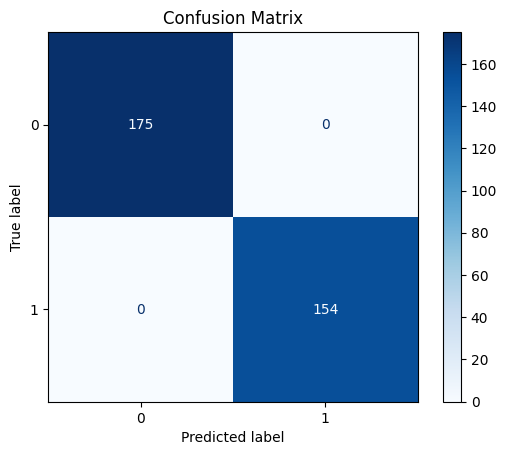

      Metric  Value
0    ROC AUC    1.0
1       Gini    1.0
2  Precision    1.0
3     Recall    1.0
4   F1 Score    1.0
5   Accuracy    1.0
['ewm_sales_week_7', 'unit_price', 'not_working_day', 'pre_holiday', 'not_working_day_prev', 'not_working_day_next', 'new_year_holidays_period', 'may_holidays_period']


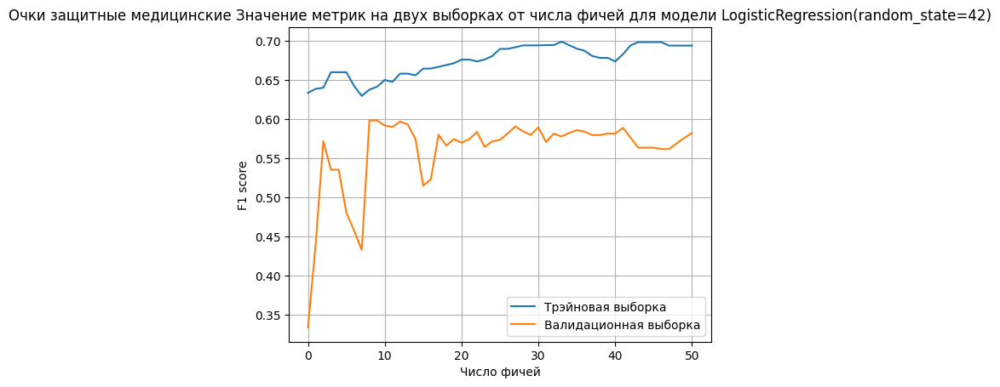

Crosvall
True Positives (TP): 96
True Negatives (TN): 103
False Positives (FP): 61
False Negatives (FN): 68
TPR: 0.5853658536585366
FPR: 0.3719512195121951
Presicion = TP / (TP + FP) = 96 / (96 + 61) = 96 / 157 = 0.6114649681528662
Recall = TP / (TP + FN) = 96 / (96 + 68) = 96 / 164 = 0.5853658536585366
F1 score = 2 * precision * recall / (precision + recall) = 0.5981308411214953


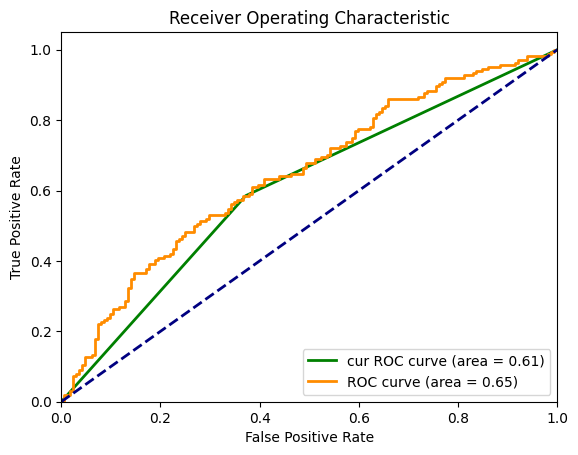

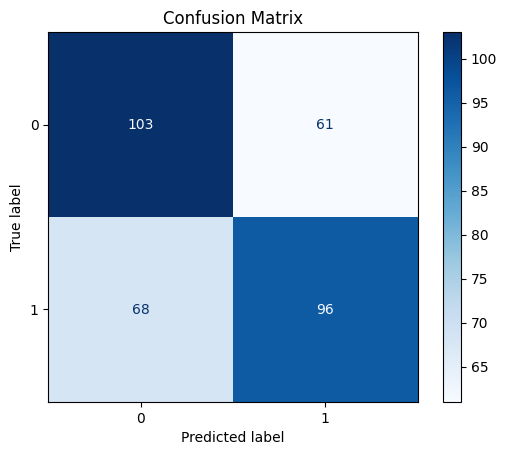

      Metric     Value
0    ROC AUC  0.648015
1       Gini  0.296029
2  Precision  0.611465
3     Recall  0.585366
4   F1 Score  0.598131
5   Accuracy  0.606707
Train


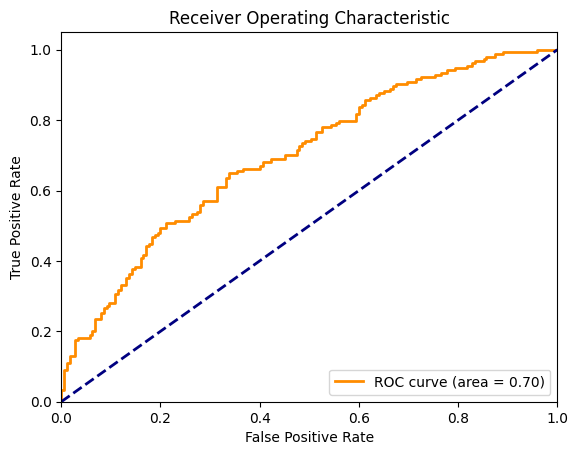

True Positives (TP): 102
True Negatives (TN): 111
False Positives (FP): 64
False Negatives (FN): 52
TPR: 0.6623376623376623
FPR: 0.3657142857142857


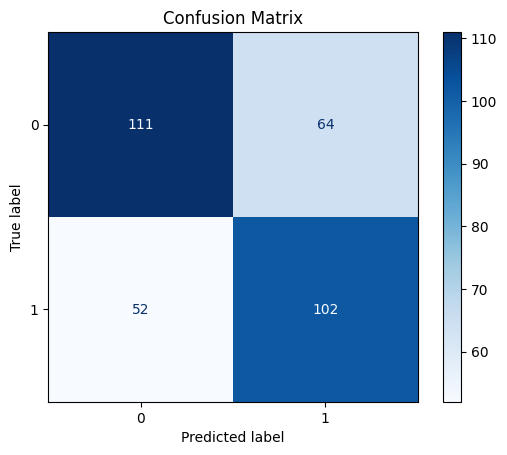

      Metric     Value
0    ROC AUC  0.697996
1       Gini  0.395993
2  Precision  0.614458
3     Recall  0.662338
4   F1 Score  0.637500
5   Accuracy  0.647416
['not_working_day', 'pre_holiday', 'may_holidays_period', 'year', 'new_year_holidays_period', 'day_num', 'diff_1', 'diff_7', 'price_rolling_median_5']


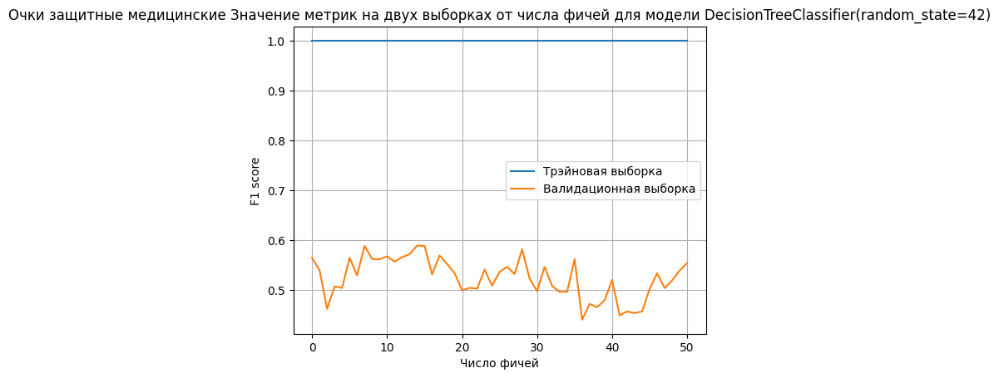

Crosvall
True Positives (TP): 102
True Negatives (TN): 84
False Positives (FP): 80
False Negatives (FN): 62
TPR: 0.6219512195121951
FPR: 0.4878048780487805
Presicion = TP / (TP + FP) = 102 / (102 + 80) = 102 / 182 = 0.5604395604395604
Recall = TP / (TP + FN) = 102 / (102 + 62) = 102 / 164 = 0.6219512195121951
F1 score = 2 * precision * recall / (precision + recall) = 0.5895953757225434


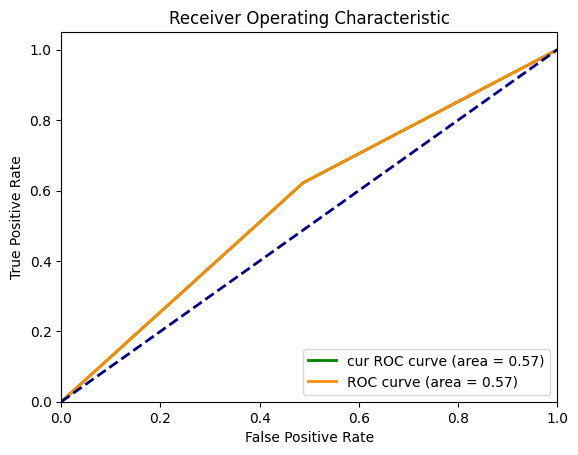

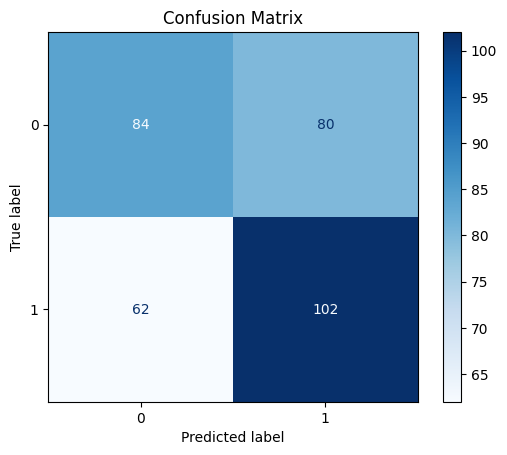

      Metric     Value
0    ROC AUC  0.567073
1       Gini  0.134146
2  Precision  0.560440
3     Recall  0.621951
4   F1 Score  0.589595
5   Accuracy  0.567073
Train


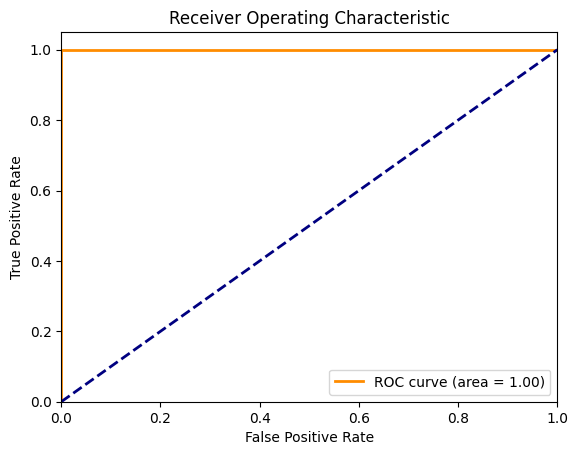

True Positives (TP): 154
True Negatives (TN): 175
False Positives (FP): 0
False Negatives (FN): 0
TPR: 1.0
FPR: 0.0


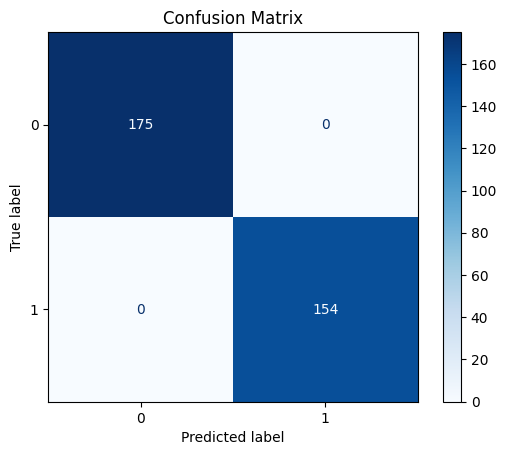

      Metric  Value
0    ROC AUC    1.0
1       Gini    1.0
2  Precision    1.0
3     Recall    1.0
4   F1 Score    1.0
5   Accuracy    1.0
['ewm_sales_week_7', 'unit_price', 'not_working_day', 'pre_holiday', 'not_working_day_prev', 'not_working_day_next', 'new_year_holidays_period', 'may_holidays_period', 'is_holiday', 'diff_1', 'diff_2', 'diff_3', 'diff_5', 'diff_7', 'diff_9']


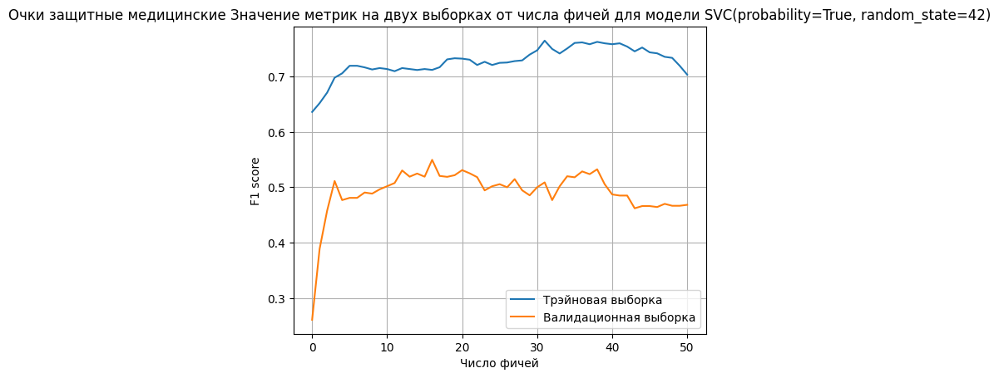

Crosvall
True Positives (TP): 75
True Negatives (TN): 130
False Positives (FP): 34
False Negatives (FN): 89
TPR: 0.4573170731707317
FPR: 0.2073170731707317
Presicion = TP / (TP + FP) = 75 / (75 + 34) = 75 / 109 = 0.6880733944954128
Recall = TP / (TP + FN) = 75 / (75 + 89) = 75 / 164 = 0.4573170731707317
F1 score = 2 * precision * recall / (precision + recall) = 0.5494505494505494


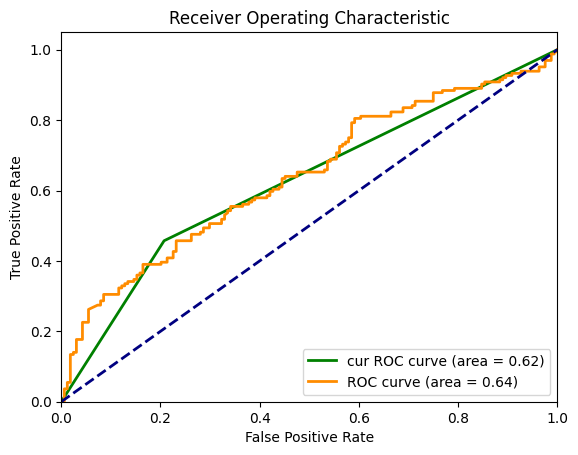

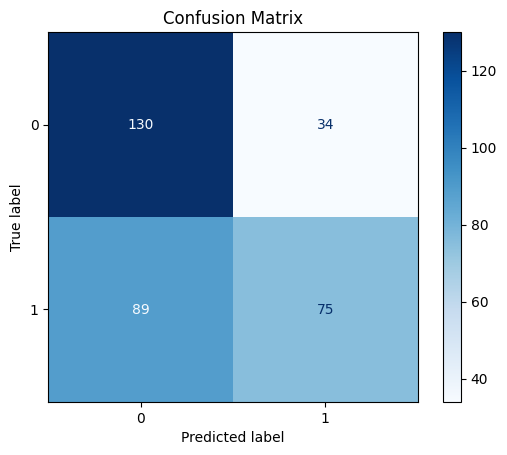

      Metric     Value
0    ROC AUC  0.640671
1       Gini  0.281343
2  Precision  0.688073
3     Recall  0.457317
4   F1 Score  0.549451
5   Accuracy  0.625000
Train


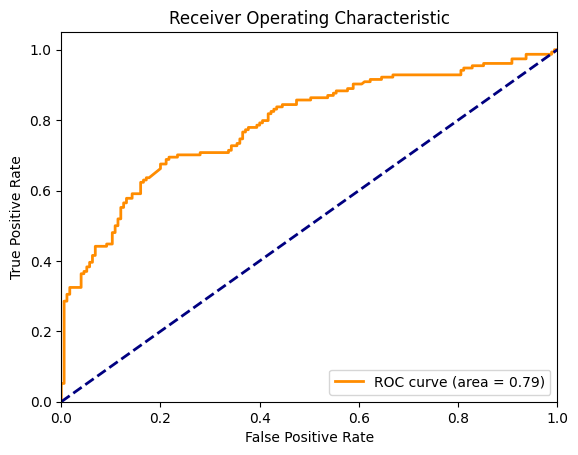

True Positives (TP): 106
True Negatives (TN): 137
False Positives (FP): 38
False Negatives (FN): 48
TPR: 0.6883116883116883
FPR: 0.21714285714285714


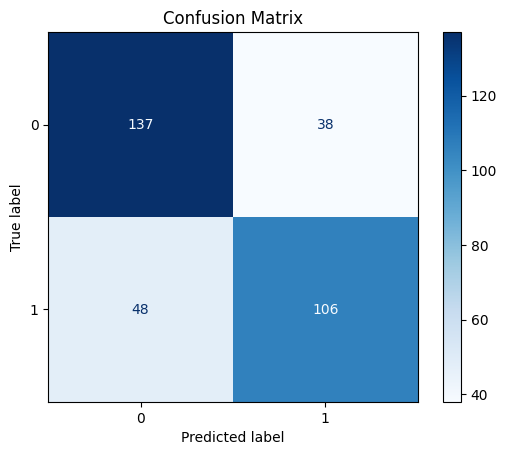

      Metric     Value
0    ROC AUC  0.787848
1       Gini  0.575696
2  Precision  0.736111
3     Recall  0.688312
4   F1 Score  0.711409
5   Accuracy  0.738602
['price_rolling_median_3', 'price_rolling_median_7', 'diff_5', 'unit_price', 'diff_14', 'price_rolling_mean_7', 'new_year_holidays_period', 'price_rolling_median_12', 'price_rolling_mean_2', 'price_rolling_median_9', 'price_rolling_median_5', 'price_rolling_mean_5', 'diff_9', 'price_rolling_mean_3', 'price_rolling_median_14', 'diff_3', 'amount_rolling_mean_5']


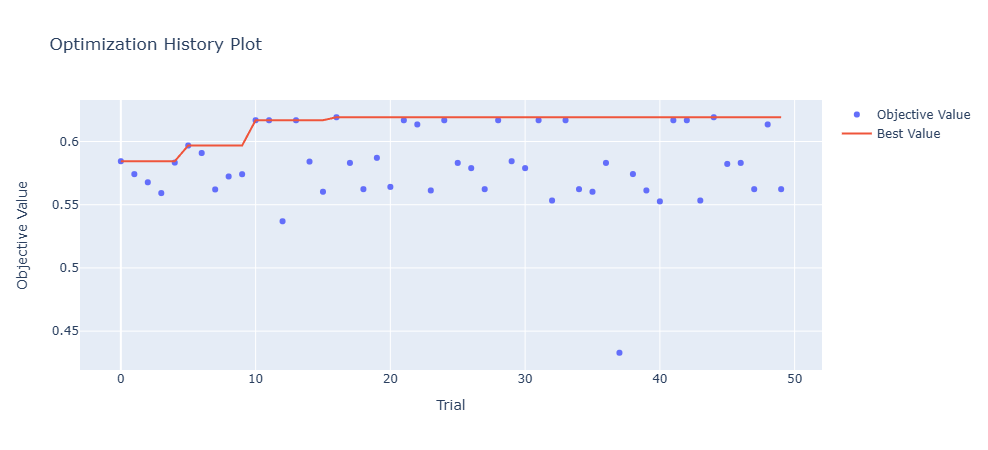

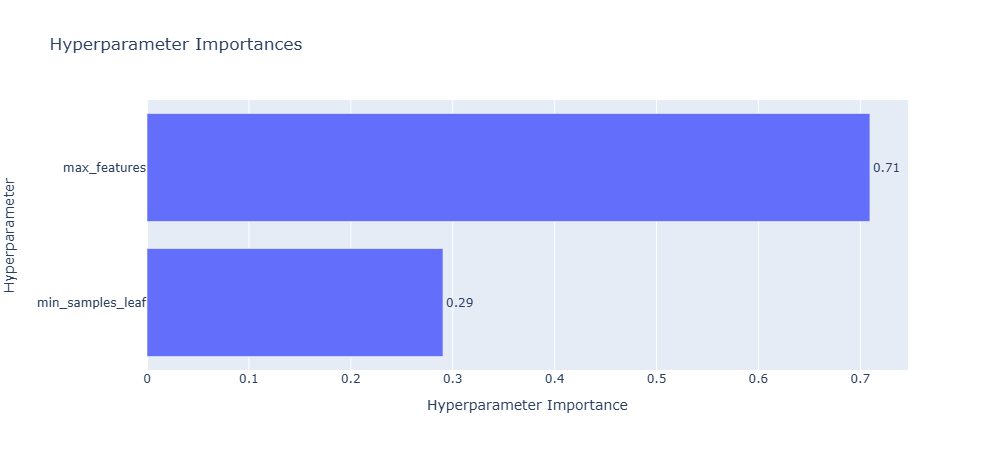

Best trial:
  Value: 0.6191950464396284
  Params: 
    min_samples_leaf: 1
    max_features: 3


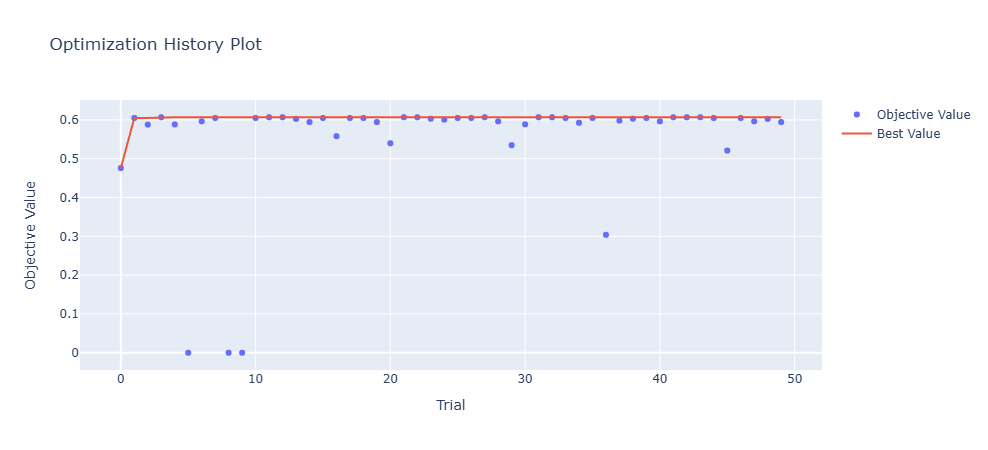

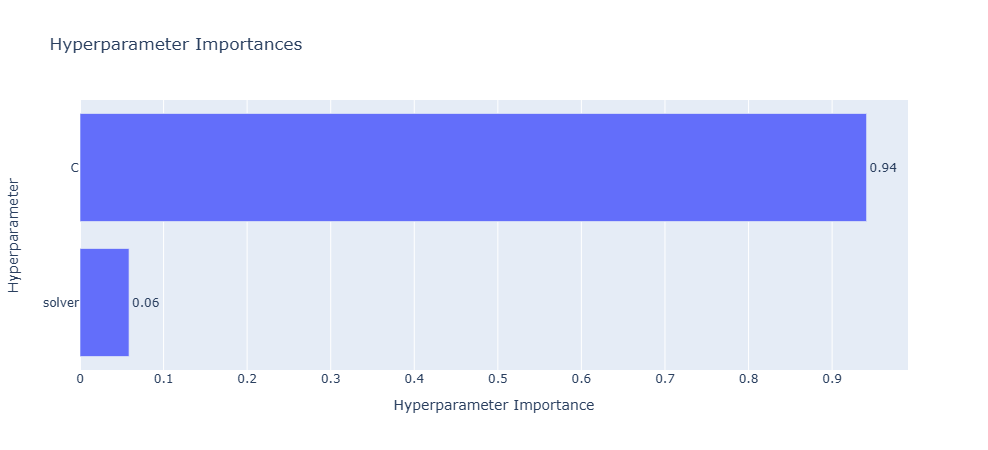

Best trial:
  Value: 0.6068111455108359
  Params: 
    C: 6.898478422732727
    solver: liblinear


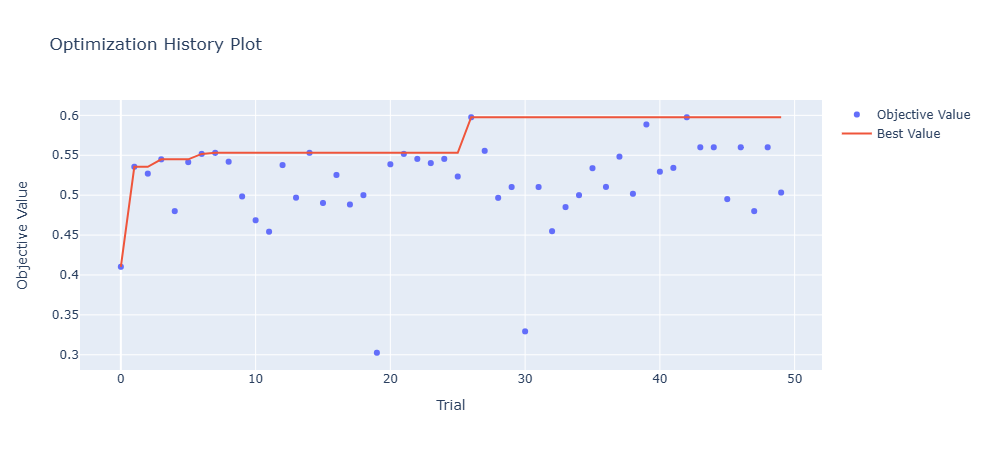

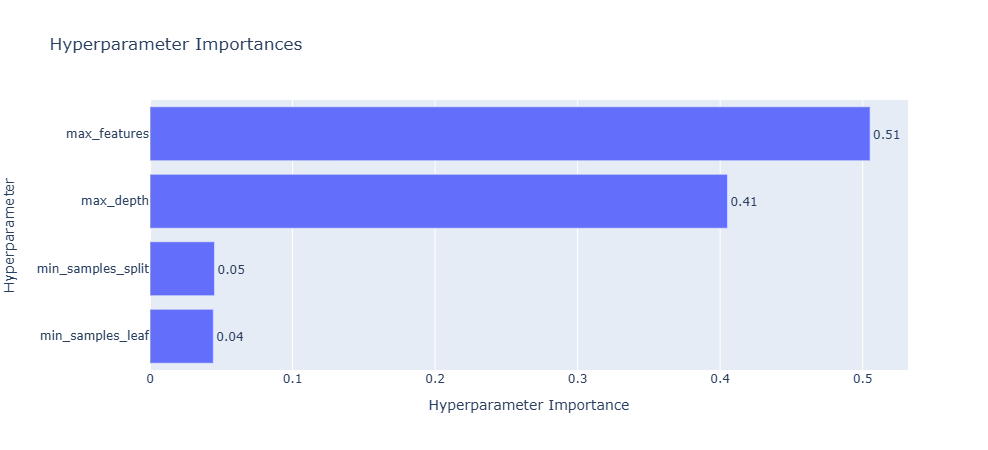

Best trial:
  Value: 0.5976331360946745
  Params: 
    max_depth: 30
    min_samples_split: 6
    min_samples_leaf: 13
    max_features: 10


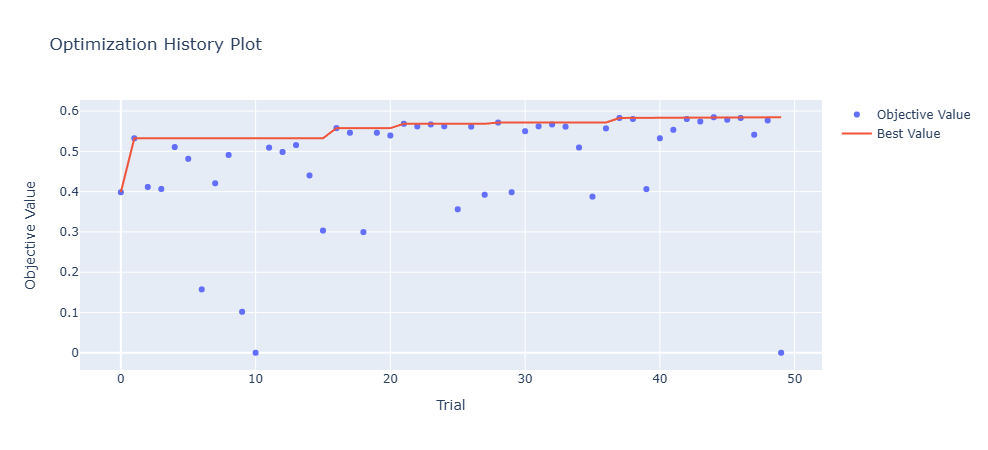

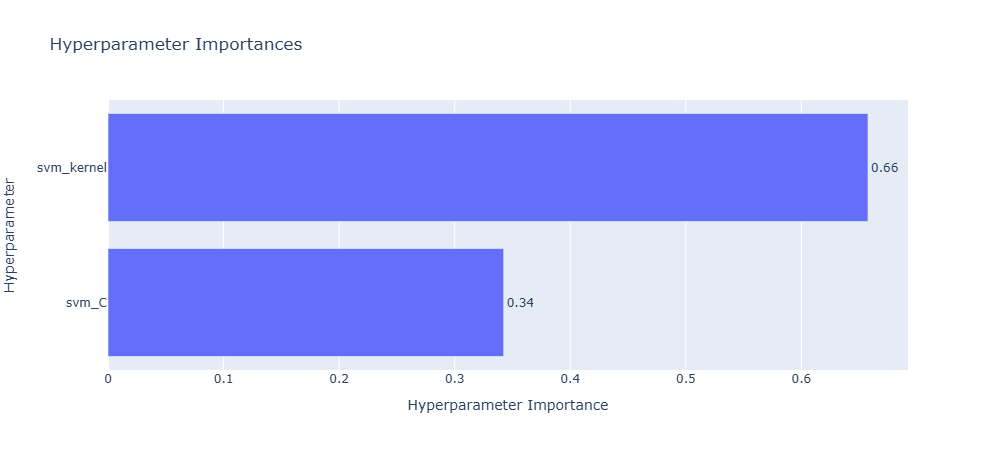

Best trial:
  Value: 0.5846153846153846
  Params: 
    svm_C: 9.003612437327956
    svm_kernel: rbf
True Positives (TP): 100
True Negatives (TN): 105
False Positives (FP): 59
False Negatives (FN): 64
TPR: 0.6097560975609756
FPR: 0.3597560975609756
Presicion = TP / (TP + FP) = 100 / (100 + 59) = 100 / 159 = 0.6289308176100629
Recall = TP / (TP + FN) = 100 / (100 + 64) = 100 / 164 = 0.6097560975609756
F1 score = 2 * precision * recall / (precision + recall) = 0.6191950464396284


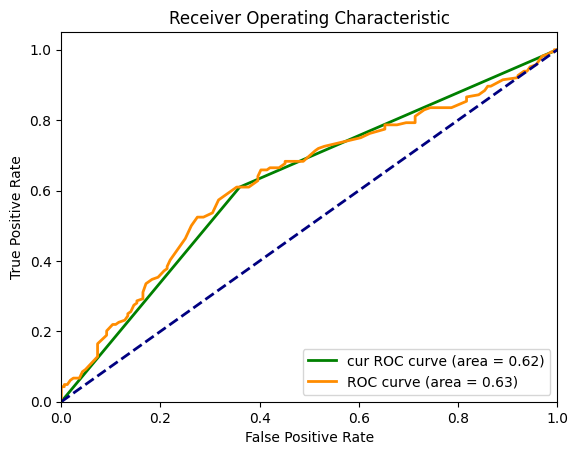

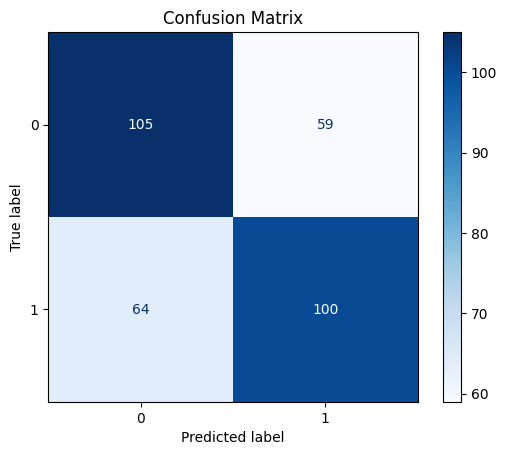

      Metric     Value
0    ROC AUC  0.629313
1       Gini  0.258626
2  Precision  0.628931
3     Recall  0.609756
4   F1 Score  0.619195
5   Accuracy  0.625000
True Positives (TP): 98
True Negatives (TN): 103
False Positives (FP): 61
False Negatives (FN): 66
TPR: 0.5975609756097561
FPR: 0.3719512195121951
Presicion = TP / (TP + FP) = 98 / (98 + 61) = 98 / 159 = 0.6163522012578616
Recall = TP / (TP + FN) = 98 / (98 + 66) = 98 / 164 = 0.5975609756097561
F1 score = 2 * precision * recall / (precision + recall) = 0.6068111455108359


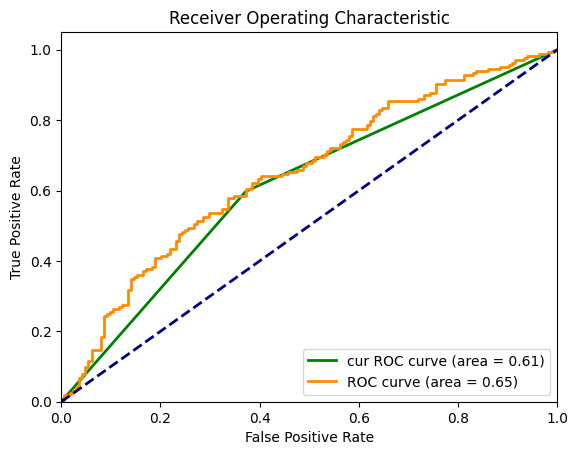

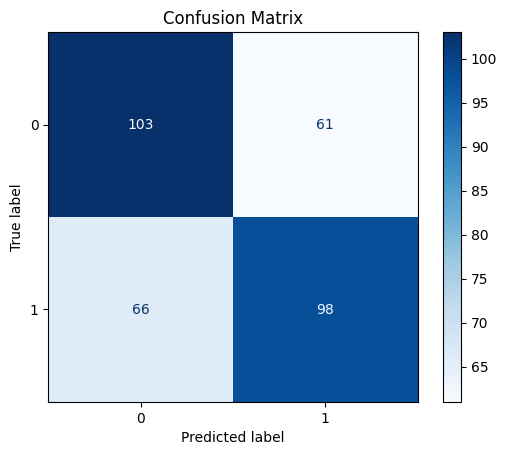

      Metric     Value
0    ROC AUC  0.648758
1       Gini  0.297516
2  Precision  0.616352
3     Recall  0.597561
4   F1 Score  0.606811
5   Accuracy  0.612805
True Positives (TP): 101
True Negatives (TN): 91
False Positives (FP): 73
False Negatives (FN): 63
TPR: 0.6158536585365854
FPR: 0.4451219512195122
Presicion = TP / (TP + FP) = 101 / (101 + 73) = 101 / 174 = 0.5804597701149425
Recall = TP / (TP + FN) = 101 / (101 + 63) = 101 / 164 = 0.6158536585365854
F1 score = 2 * precision * recall / (precision + recall) = 0.5976331360946745


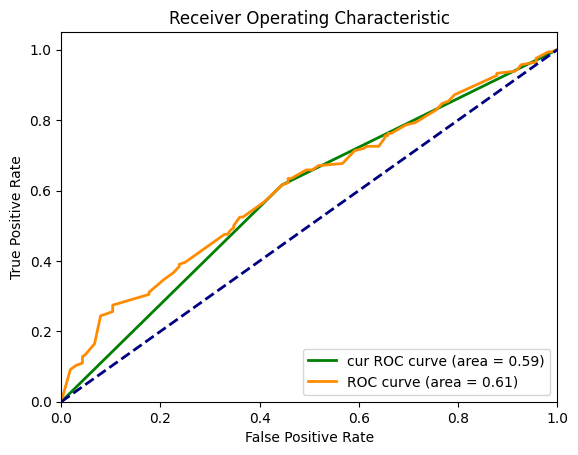

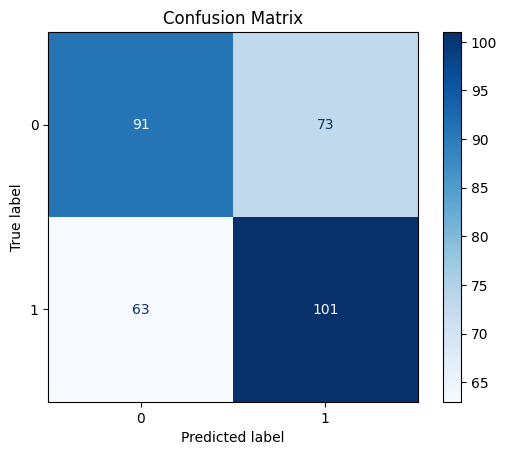

      Metric     Value
0    ROC AUC  0.608771
1       Gini  0.217542
2  Precision  0.580460
3     Recall  0.615854
4   F1 Score  0.597633
5   Accuracy  0.585366
True Positives (TP): 95
True Negatives (TN): 98
False Positives (FP): 66
False Negatives (FN): 69
TPR: 0.5792682926829268
FPR: 0.4024390243902439
Presicion = TP / (TP + FP) = 95 / (95 + 66) = 95 / 161 = 0.5900621118012422
Recall = TP / (TP + FN) = 95 / (95 + 69) = 95 / 164 = 0.5792682926829268
F1 score = 2 * precision * recall / (precision + recall) = 0.5846153846153846


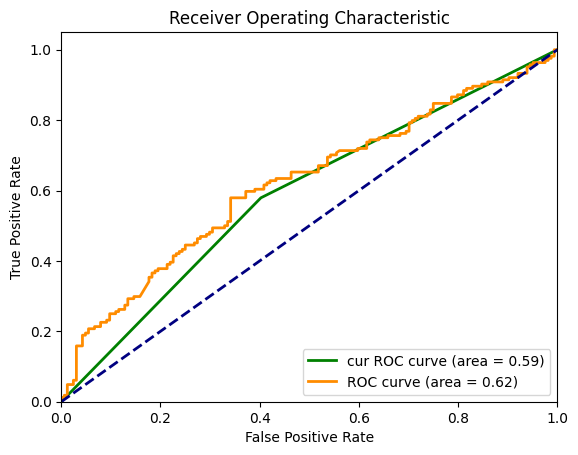

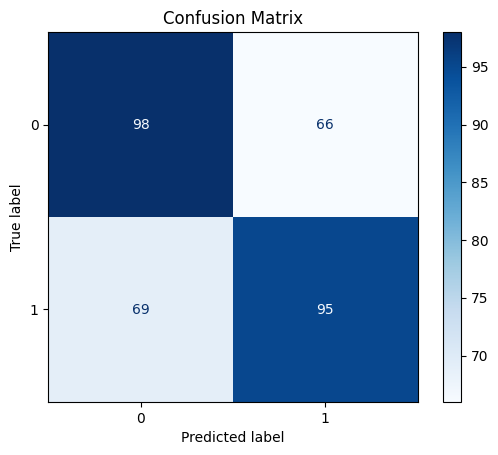

      Metric     Value
0    ROC AUC  0.619535
1       Gini  0.239069
2  Precision  0.590062
3     Recall  0.579268
4   F1 Score  0.584615
5   Accuracy  0.588415
Результат для Очки защитные медицинские


,Model,Standart Features,Best features,Bset Features and Hyperparameters
0,RandomForest,0.532110,0.613497,"[0.625, 0.6191950464396284]"
1,LogReg,0.582043,0.598131,"[0.6128048780487805, 0.6068111455108359]"
2,Tree,0.553936,0.589595,"[0.5853658536585367, 0.5976331360946745]"
3,SVM,0.468401,0.549451,"[0.5884146341463414, 0.5846153846153846]"


In [63]:
for idx in ['SG01_1']:
    item_id = wb_df[wb_df['sku_id'] == idx]['sku_name'].unique()[0]
    cur_train, cur_val, useless_features = make_df(item_id, st_date, fn_date, st_date_test, fn_date_test)
    useless_features = np.delete(useless_features[2:], 8) 
    model_array = []
    model_array.append(RandomForestClassifier(random_state=42))
    model_array.append(LogisticRegression(random_state=42))
    model_array.append(DecisionTreeClassifier(random_state=42))
    model_array.append(SVC(random_state=42, probability=True))
    first_iter_metrics = []
    for i in range(4):
        z, _ = sales_mask(cur_train, cur_val, useless_features, model=model_array[i], print_flag=False)
        first_iter_metrics.append(_[1])
    print(first_iter_metrics)
    rf_features, rf_metr = give_rf_features(item_id)
    log_features, log_metr = give_log_features(item_id)
    tree_features, tree_metr = give_tree_features(item_id)
    svm_features, svm_metr = give_svm_features(item_id)
    
    second_iter_metrics = [rf_metr, log_metr, tree_metr, svm_metr]
    
    rf_best_params = find_best_params(rf_objective, 50)
    log_best_params = find_best_params(log_objective, 50)
    tree_best_params = find_best_params(tree_objective, 50)
    svm_best_params = find_best_params(svm_objective, 50)
    
    model_1 = RandomForestClassifier(
        min_samples_leaf=rf_best_params['min_samples_leaf'],
        max_features=rf_best_params['max_features'],
        random_state=42
        )
    
    model_2 = LogisticRegression(
        C = log_best_params['C'],
        solver=log_best_params['solver'],
        max_iter=1000,
        random_state=42
        )
    
    model_3 =  DecisionTreeClassifier(
        max_depth=tree_best_params['max_depth'],
        min_samples_split=tree_best_params['min_samples_split'],
        min_samples_leaf=tree_best_params['min_samples_leaf'],
        max_features=tree_best_params['max_features'],
        random_state=42
        )
    
    model_4 = SVC(C=svm_best_params['svm_C'], kernel=svm_best_params['svm_kernel'], probability=True, random_state=42)
    
    rf_metr_upd = evaluate(model_1, rf_features)
    log_metr_upd = evaluate(model_2, log_features)
    tree_metr_upd = evaluate(model_3, tree_features)
    svm_metr_upd = evaluate(model_4, svm_features)
    
    third_iter_metrics = [rf_metr_upd, log_metr_upd, tree_metr_upd, svm_metr_upd]
    result = {
            "Model": ["RandomForest", "LogReg", "Tree", "SVM"],
            "Standart Features" : first_iter_metrics,
            "Best features" : second_iter_metrics,
            "Bset Features and Hyperparameters" : third_iter_metrics
    }
    print(f"Результат для {item_id}")
    result = pd.DataFrame(result)
    from IPython.display import display
    display(result)

[0.5288753799392097, 0.579088471849866, 0.42900302114803623, 0.5571847507331378]


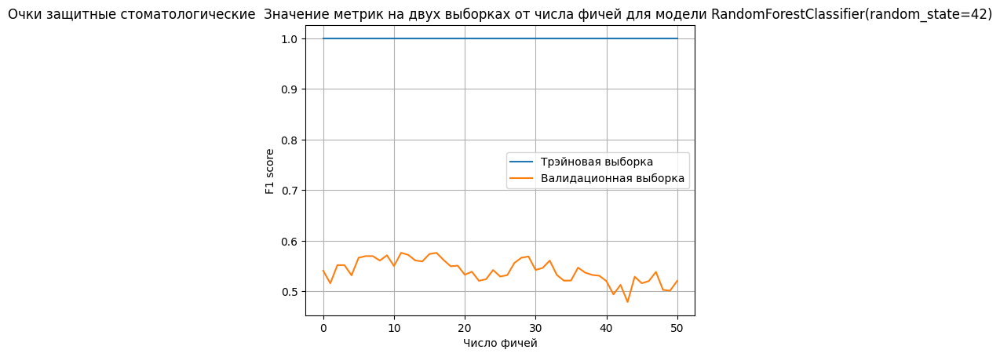

Crosvall
True Positives (TP): 100
True Negatives (TN): 106
False Positives (FP): 53
False Negatives (FN): 94
TPR: 0.5154639175257731
FPR: 0.3333333333333333
Presicion = TP / (TP + FP) = 100 / (100 + 53) = 100 / 153 = 0.6535947712418301
Recall = TP / (TP + FN) = 100 / (100 + 94) = 100 / 194 = 0.5154639175257731
F1 score = 2 * precision * recall / (precision + recall) = 0.5763688760806917


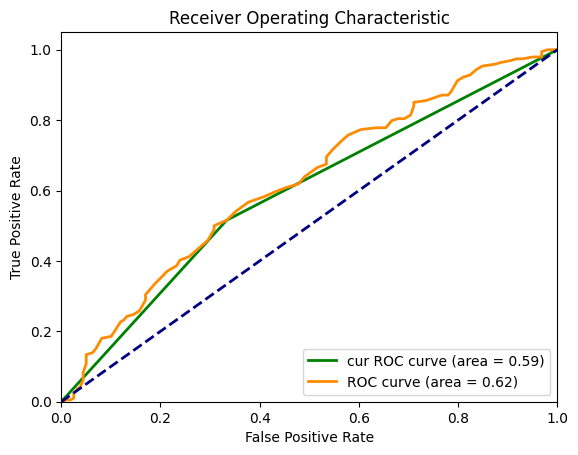

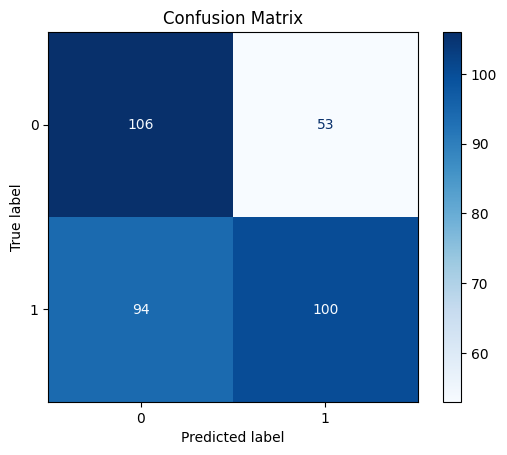

      Metric     Value
0    ROC AUC  0.620469
1       Gini  0.240939
2  Precision  0.653595
3     Recall  0.515464
4   F1 Score  0.576369
5   Accuracy  0.583569
Train


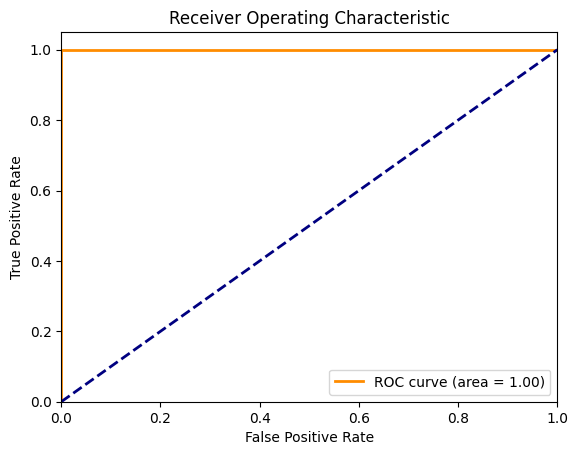

True Positives (TP): 181
True Negatives (TN): 173
False Positives (FP): 0
False Negatives (FN): 0
TPR: 1.0
FPR: 0.0


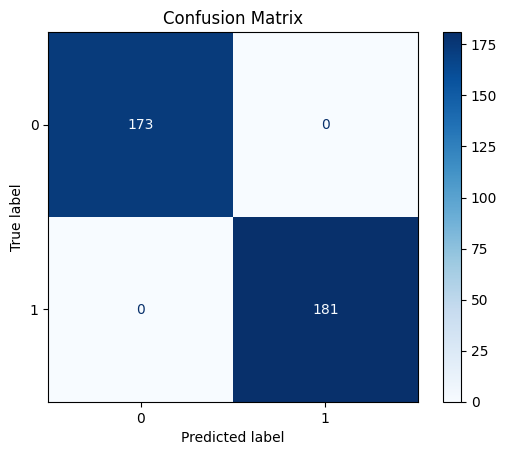

      Metric  Value
0    ROC AUC    1.0
1       Gini    1.0
2  Precision    1.0
3     Recall    1.0
4   F1 Score    1.0
5   Accuracy    1.0
['ewm_sales_week_3', 'unit_price', 'not_working_day', 'pre_holiday', 'not_working_day_prev', 'not_working_day_next', 'new_year_holidays_period', 'may_holidays_period', 'is_holiday', 'diff_1', 'diff_2', 'diff_3']


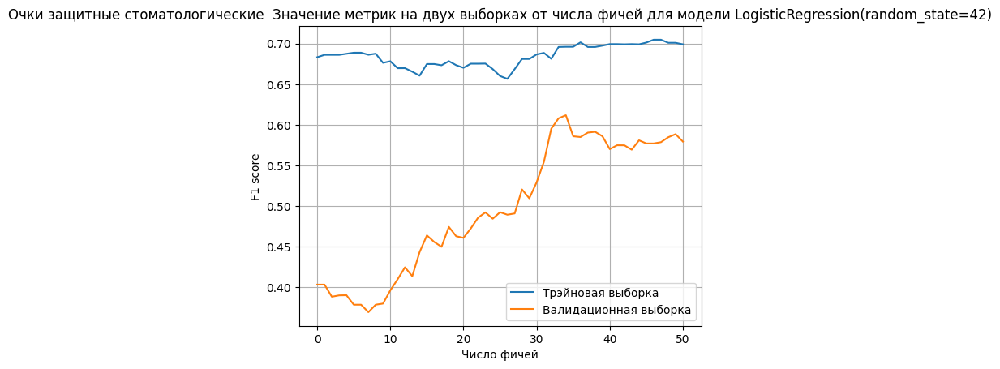

Crosvall
True Positives (TP): 111
True Negatives (TN): 101
False Positives (FP): 58
False Negatives (FN): 83
TPR: 0.5721649484536082
FPR: 0.36477987421383645
Presicion = TP / (TP + FP) = 111 / (111 + 58) = 111 / 169 = 0.6568047337278107
Recall = TP / (TP + FN) = 111 / (111 + 83) = 111 / 194 = 0.5721649484536082
F1 score = 2 * precision * recall / (precision + recall) = 0.6115702479338843


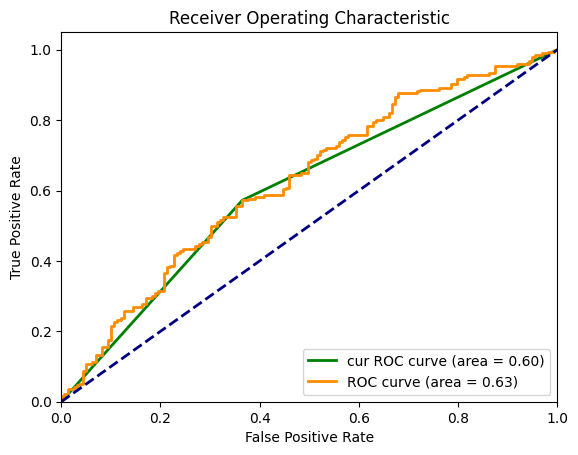

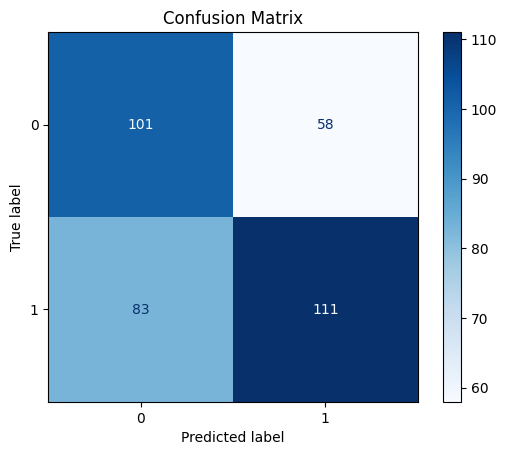

      Metric     Value
0    ROC AUC  0.626564
1       Gini  0.253128
2  Precision  0.656805
3     Recall  0.572165
4   F1 Score  0.611570
5   Accuracy  0.600567
Train


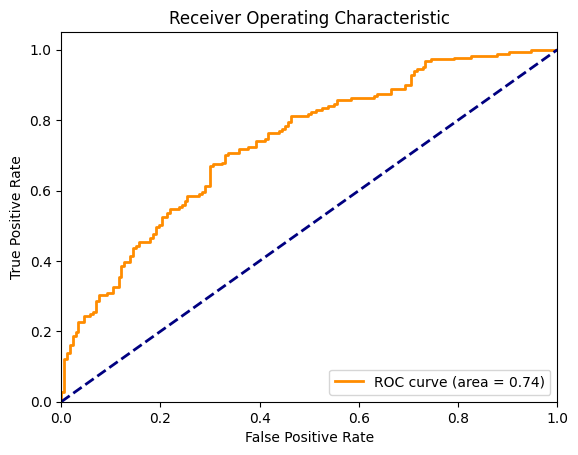

True Positives (TP): 127
True Negatives (TN): 116
False Positives (FP): 57
False Negatives (FN): 54
TPR: 0.7016574585635359
FPR: 0.32947976878612717


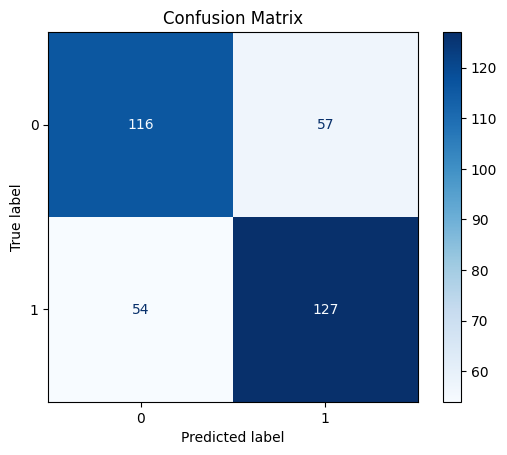

      Metric     Value
0    ROC AUC  0.735541
1       Gini  0.471082
2  Precision  0.690217
3     Recall  0.701657
4   F1 Score  0.695890
5   Accuracy  0.686441
['new_year_holidays_period', 'may_holidays_period', 'unit_price', 'not_working_day', 'diff_2', 'price_rolling_mean_2', 'price_rolling_median_2', 'diff_9', 'price_rolling_median_14', 'price_rolling_median_12', 'diff_12', 'price_rolling_median_5', 'price_rolling_mean_3', 'price_rolling_mean_9', 'diff_7', 'price_rolling_mean_12', 'price_rolling_median_3', 'price_rolling_mean_14', 'pre_holiday', 'price_rolling_median_7', 'price_rolling_mean_5', 'price_rolling_mean_7', 'price_rolling_median_9', 'diff_5', 'is_holiday', 'not_working_day_prev', 'diff_3', 'not_working_day_next', 'diff_1', 'diff_14', 'amount_rolling_median_5', 'day_num', 'amount_rolling_median_12', 'year', 'amount_rolling_median_14']


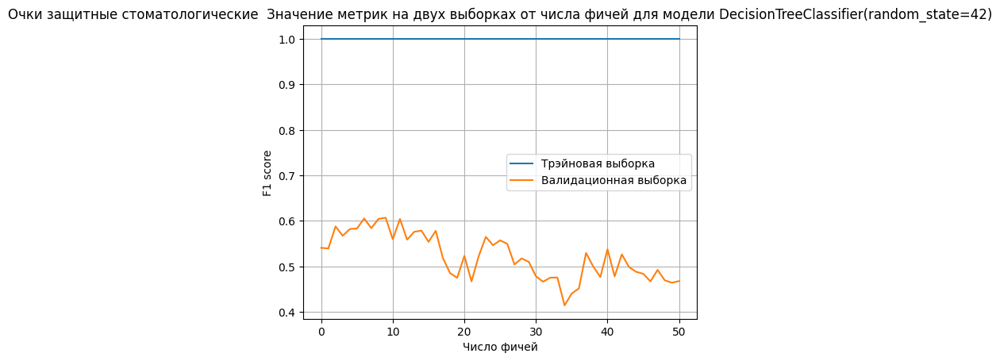

Crosvall
True Positives (TP): 112
True Negatives (TN): 96
False Positives (FP): 63
False Negatives (FN): 82
TPR: 0.5773195876288659
FPR: 0.39622641509433965
Presicion = TP / (TP + FP) = 112 / (112 + 63) = 112 / 175 = 0.64
Recall = TP / (TP + FN) = 112 / (112 + 82) = 112 / 194 = 0.5773195876288659
F1 score = 2 * precision * recall / (precision + recall) = 0.6070460704607047


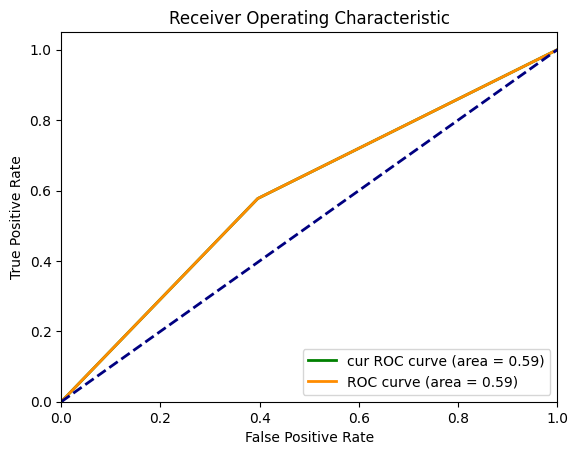

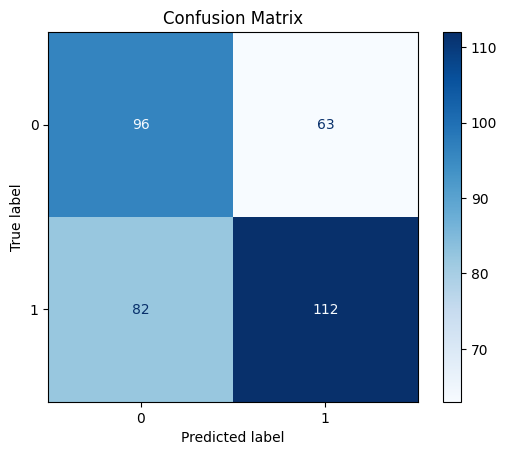

      Metric     Value
0    ROC AUC  0.590547
1       Gini  0.181093
2  Precision  0.640000
3     Recall  0.577320
4   F1 Score  0.607046
5   Accuracy  0.589235
Train


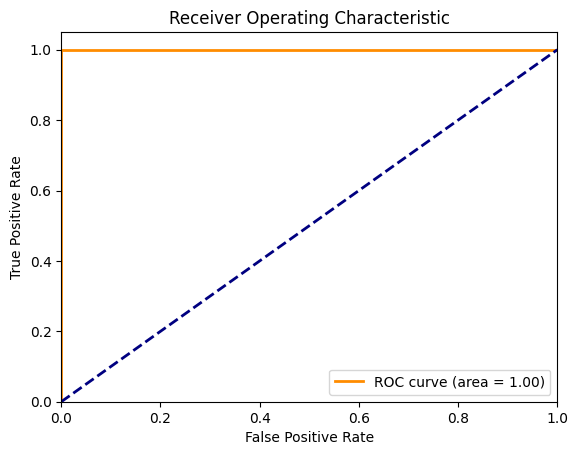

True Positives (TP): 181
True Negatives (TN): 173
False Positives (FP): 0
False Negatives (FN): 0
TPR: 1.0
FPR: 0.0


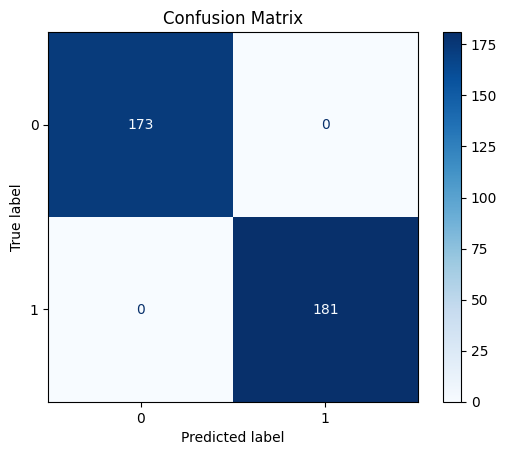

      Metric  Value
0    ROC AUC    1.0
1       Gini    1.0
2  Precision    1.0
3     Recall    1.0
4   F1 Score    1.0
5   Accuracy    1.0
['ewm_sales_week_3', 'unit_price', 'not_working_day', 'pre_holiday', 'not_working_day_prev', 'not_working_day_next', 'new_year_holidays_period', 'may_holidays_period', 'is_holiday', 'diff_1']


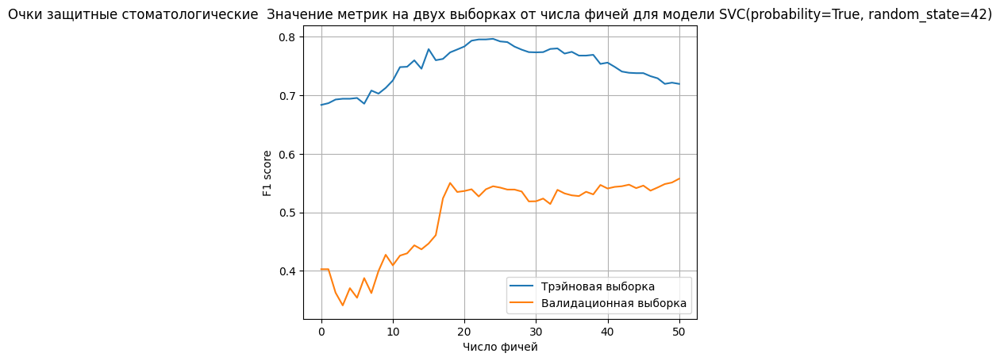

Crosvall
True Positives (TP): 95
True Negatives (TN): 107
False Positives (FP): 52
False Negatives (FN): 99
TPR: 0.4896907216494845
FPR: 0.3270440251572327
Presicion = TP / (TP + FP) = 95 / (95 + 52) = 95 / 147 = 0.6462585034013606
Recall = TP / (TP + FN) = 95 / (95 + 99) = 95 / 194 = 0.4896907216494845
F1 score = 2 * precision * recall / (precision + recall) = 0.5571847507331378


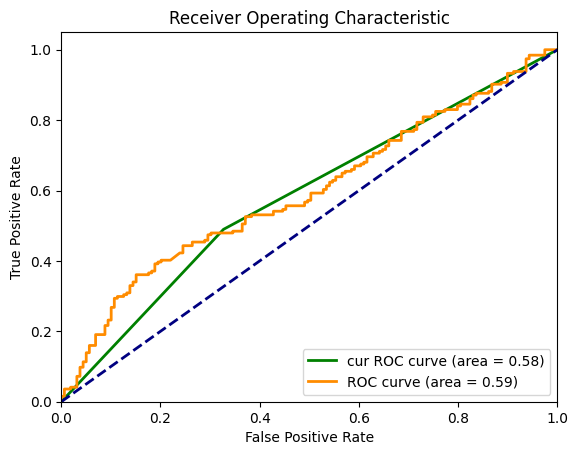

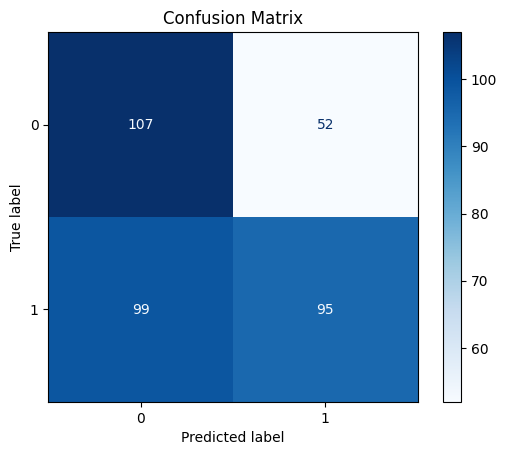

      Metric     Value
0    ROC AUC  0.593594
1       Gini  0.187188
2  Precision  0.646259
3     Recall  0.489691
4   F1 Score  0.557185
5   Accuracy  0.572238
Train


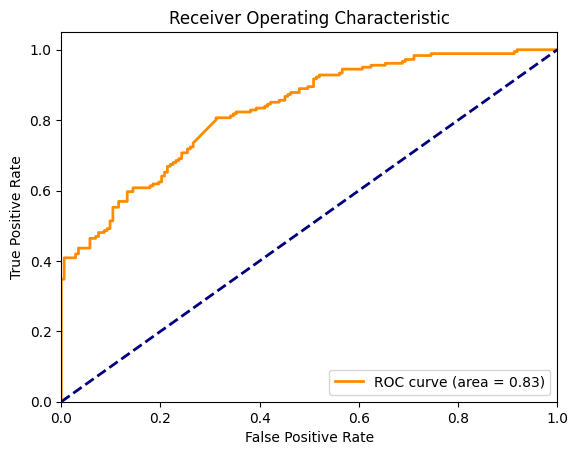

True Positives (TP): 124
True Negatives (TN): 133
False Positives (FP): 40
False Negatives (FN): 57
TPR: 0.6850828729281768
FPR: 0.23121387283236994


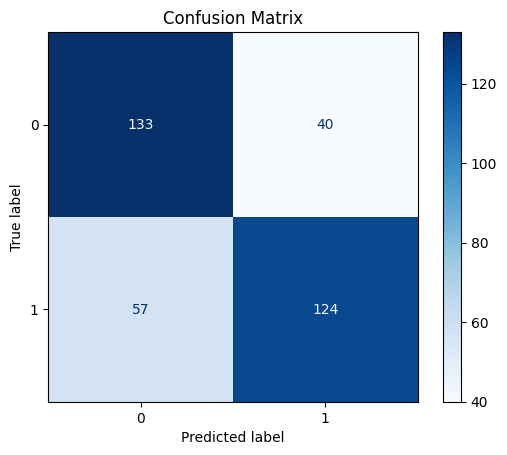

      Metric     Value
0    ROC AUC  0.828218
1       Gini  0.656437
2  Precision  0.756098
3     Recall  0.685083
4   F1 Score  0.718841
5   Accuracy  0.725989
['new_year_holidays_period', 'may_holidays_period', 'not_working_day', 'is_holiday', 'pre_holiday', 'not_working_day_prev', 'diff_7', 'diff_2', 'not_working_day_next', 'diff_14', 'diff_9', 'price_rolling_median_14', 'price_rolling_mean_14', 'diff_3', 'diff_12', 'day_num', 'price_rolling_mean_3', 'amount_rolling_mean_14', 'diff_1', 'unit_price', 'diff_5', 'price_rolling_median_3', 'price_rolling_median_9', 'price_rolling_median_12', 'amount_rolling_mean_3', 'price_rolling_mean_12', 'year', 'price_rolling_mean_9', 'price_rolling_mean_7', 'price_rolling_mean_5', 'amount_rolling_median_5', 'price_rolling_median_5', 'price_rolling_median_7', 'amount_rolling_mean_9', 'price_rolling_mean_2', 'amount_rolling_median_12', 'amount_rolling_median_7', 'amount_rolling_mean_12', 'price_rolling_median_2', 'amount_rolling_mean_7', 'amount_rolli

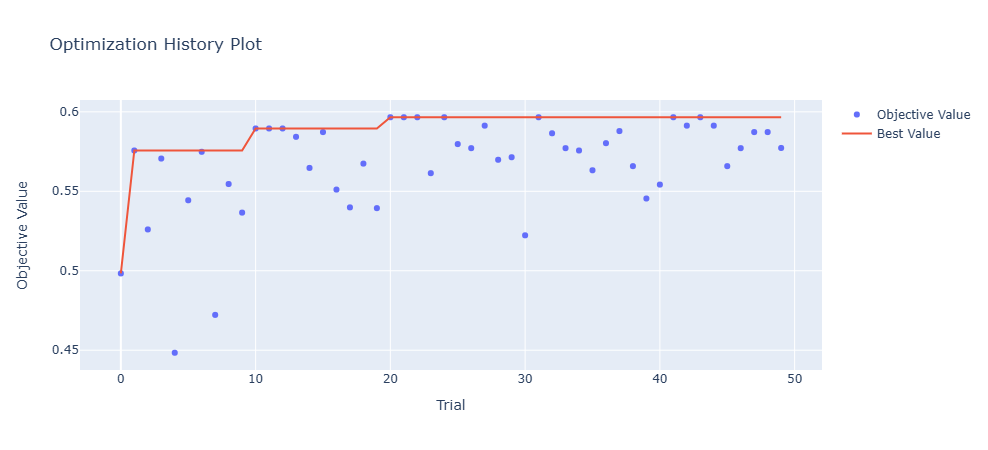

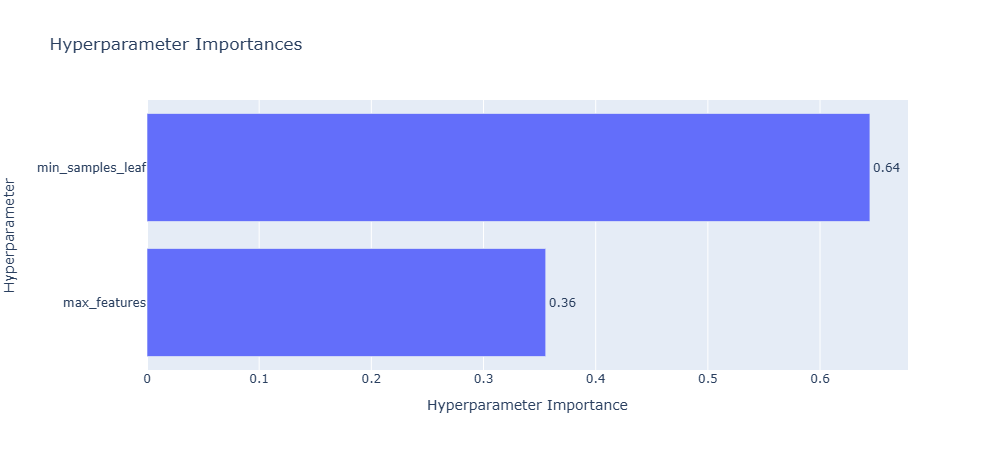

Best trial:
  Value: 0.5965909090909091
  Params: 
    min_samples_leaf: 2
    max_features: 8


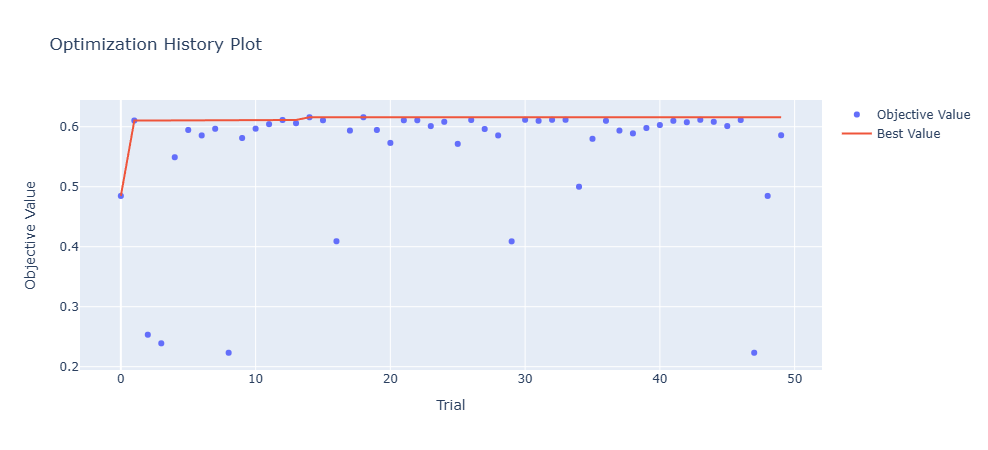

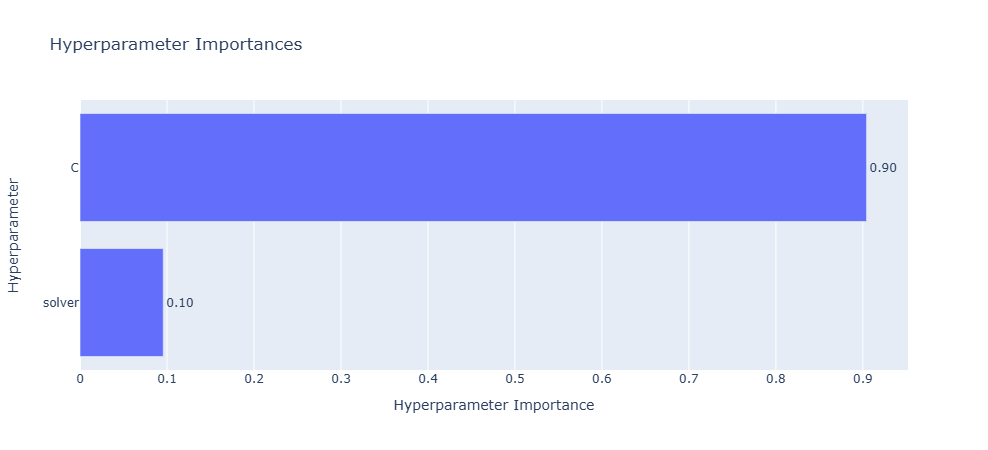

Best trial:
  Value: 0.6158038147138964
  Params: 
    C: 1.0343469640188028
    solver: liblinear


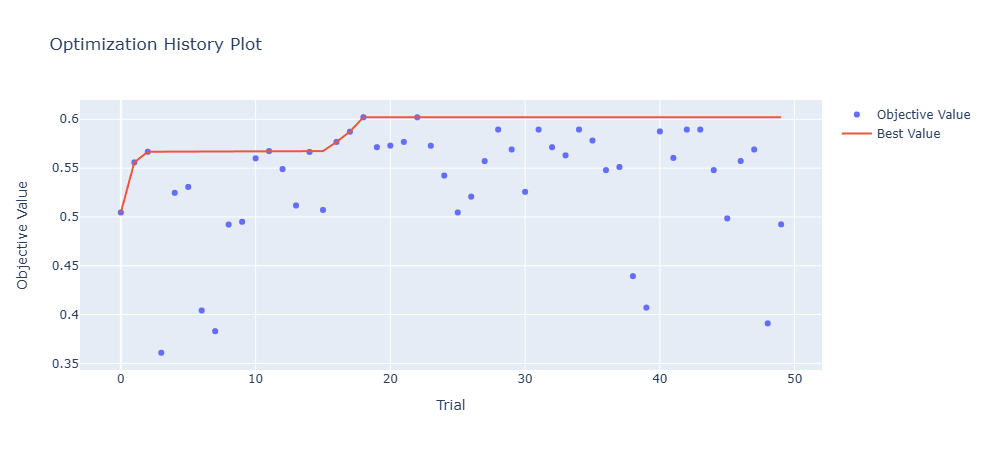

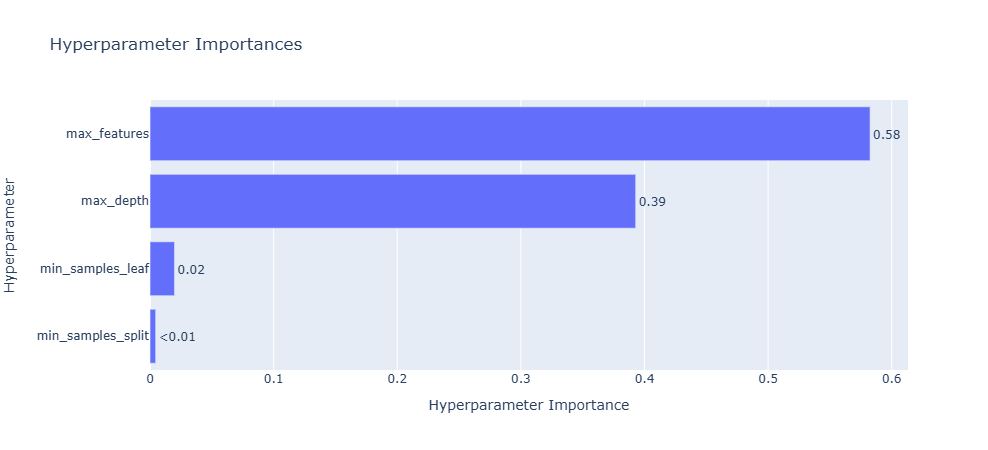

Best trial:
  Value: 0.6020942408376964
  Params: 
    max_depth: 14
    min_samples_split: 8
    min_samples_leaf: 14
    max_features: 8


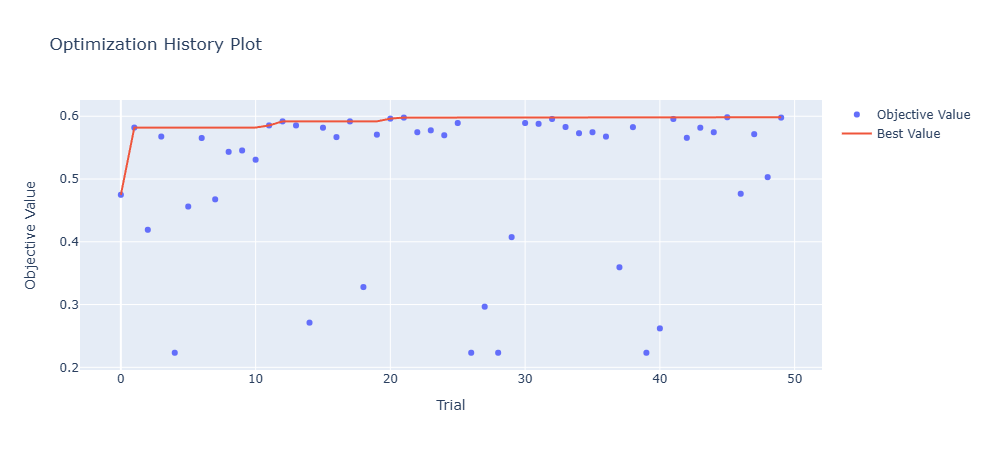

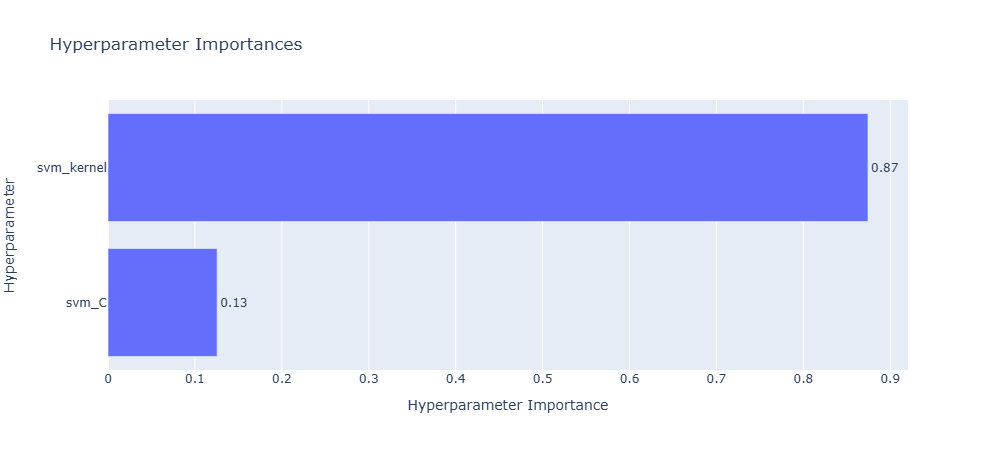

Best trial:
  Value: 0.5983827493261455
  Params: 
    svm_C: 0.07180065236668128
    svm_kernel: linear
True Positives (TP): 105
True Negatives (TN): 106
False Positives (FP): 53
False Negatives (FN): 89
TPR: 0.5412371134020618
FPR: 0.3333333333333333
Presicion = TP / (TP + FP) = 105 / (105 + 53) = 105 / 158 = 0.6645569620253164
Recall = TP / (TP + FN) = 105 / (105 + 89) = 105 / 194 = 0.5412371134020618
F1 score = 2 * precision * recall / (precision + recall) = 0.5965909090909091


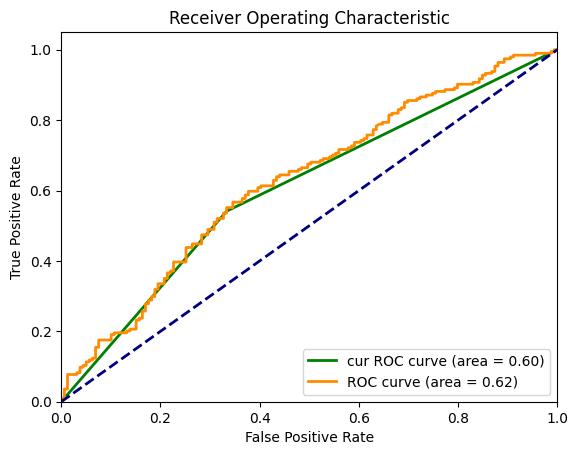

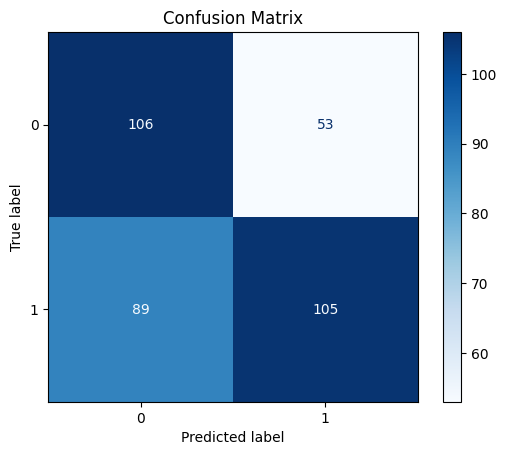

      Metric     Value
0    ROC AUC  0.624506
1       Gini  0.249011
2  Precision  0.664557
3     Recall  0.541237
4   F1 Score  0.596591
5   Accuracy  0.597734
True Positives (TP): 113
True Negatives (TN): 99
False Positives (FP): 60
False Negatives (FN): 81
TPR: 0.5824742268041238
FPR: 0.37735849056603776
Presicion = TP / (TP + FP) = 113 / (113 + 60) = 113 / 173 = 0.653179190751445
Recall = TP / (TP + FN) = 113 / (113 + 81) = 113 / 194 = 0.5824742268041238
F1 score = 2 * precision * recall / (precision + recall) = 0.6158038147138964


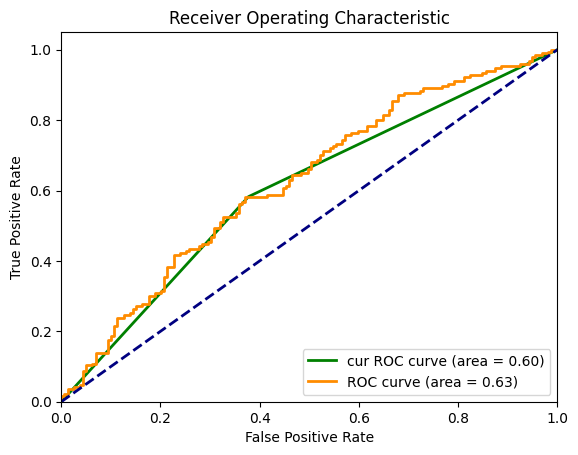

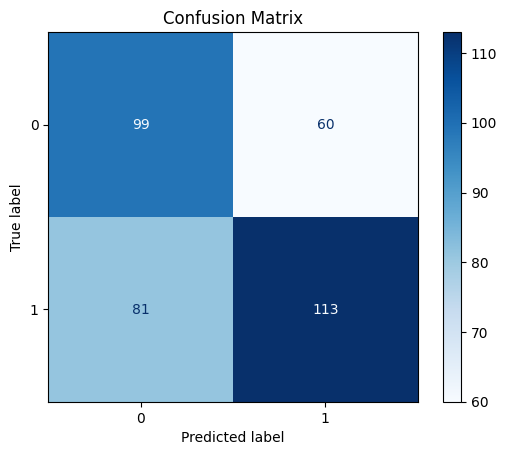

      Metric     Value
0    ROC AUC  0.625008
1       Gini  0.250016
2  Precision  0.653179
3     Recall  0.582474
4   F1 Score  0.615804
5   Accuracy  0.600567
True Positives (TP): 115
True Negatives (TN): 86
False Positives (FP): 73
False Negatives (FN): 79
TPR: 0.5927835051546392
FPR: 0.4591194968553459
Presicion = TP / (TP + FP) = 115 / (115 + 73) = 115 / 188 = 0.6117021276595744
Recall = TP / (TP + FN) = 115 / (115 + 79) = 115 / 194 = 0.5927835051546392
F1 score = 2 * precision * recall / (precision + recall) = 0.6020942408376964


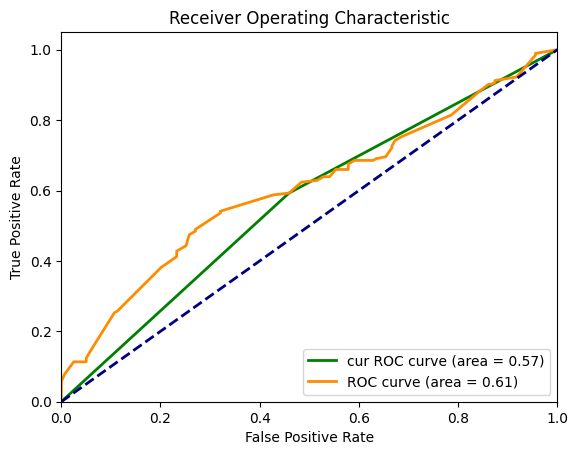

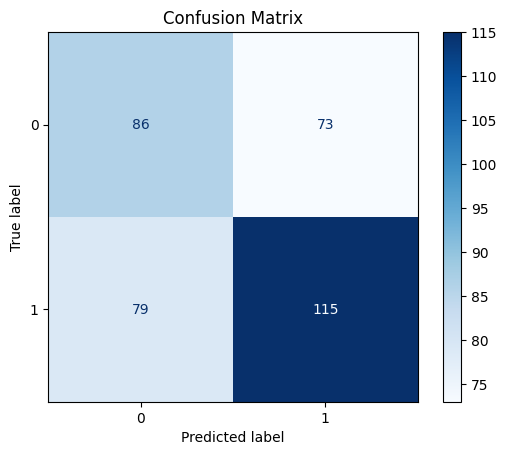

      Metric     Value
0    ROC AUC  0.605589
1       Gini  0.211178
2  Precision  0.611702
3     Recall  0.592784
4   F1 Score  0.602094
5   Accuracy  0.569405
True Positives (TP): 111
True Negatives (TN): 93
False Positives (FP): 66
False Negatives (FN): 83
TPR: 0.5721649484536082
FPR: 0.41509433962264153
Presicion = TP / (TP + FP) = 111 / (111 + 66) = 111 / 177 = 0.6271186440677966
Recall = TP / (TP + FN) = 111 / (111 + 83) = 111 / 194 = 0.5721649484536082
F1 score = 2 * precision * recall / (precision + recall) = 0.5983827493261455


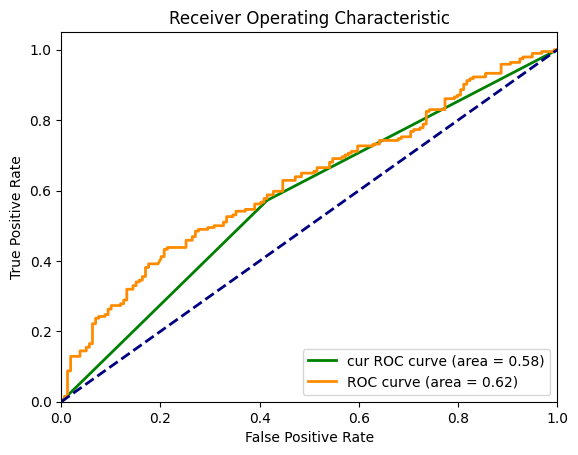

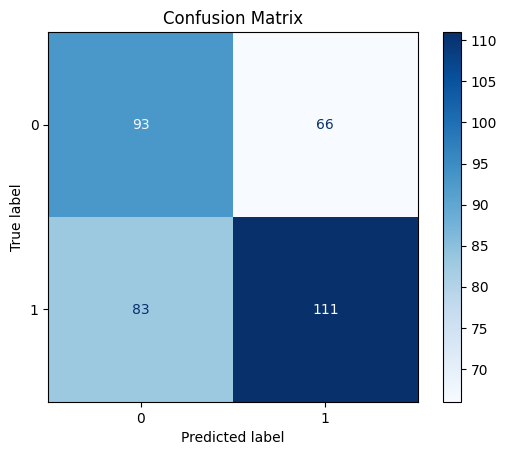

      Metric     Value
0    ROC AUC  0.623436
1       Gini  0.246872
2  Precision  0.627119
3     Recall  0.572165
4   F1 Score  0.598383
5   Accuracy  0.577904
Результат для Очки защитные стоматологические 


,Model,Standart Features,Best features,Bset Features and Hyperparameters
0,RandomForest,0.528875,0.576369,"[0.6039518900343642, 0.5965909090909091]"
1,LogReg,0.579088,0.611570,"[0.602557868119043, 0.6158038147138964]"
2,Tree,0.429003,0.607046,"[0.5668320041496466, 0.6020942408376964]"
3,SVM,0.557185,0.557185,"[0.5785353044154833, 0.5983827493261455]"


In [64]:
for idx in ['SG01']:
    item_id = wb_df[wb_df['sku_id'] == idx]['sku_name'].unique()[0]
    cur_train, cur_val, useless_features = make_df(item_id, st_date, fn_date, st_date_test, fn_date_test)
    useless_features = np.delete(useless_features[2:], 8) 
    model_array = []
    model_array.append(RandomForestClassifier(random_state=42))
    model_array.append(LogisticRegression(random_state=42))
    model_array.append(DecisionTreeClassifier(random_state=42))
    model_array.append(SVC(random_state=42, probability=True))
    first_iter_metrics = []
    for i in range(4):
        z, _ = sales_mask(cur_train, cur_val, useless_features, model=model_array[i], print_flag=False)
        first_iter_metrics.append(_[1])
    print(first_iter_metrics)
    rf_features, rf_metr = give_rf_features(item_id)
    log_features, log_metr = give_log_features(item_id)
    tree_features, tree_metr = give_tree_features(item_id)
    svm_features, svm_metr = give_svm_features(item_id)
    
    second_iter_metrics = [rf_metr, log_metr, tree_metr, svm_metr]
    
    rf_best_params = find_best_params(rf_objective, 50)
    log_best_params = find_best_params(log_objective, 50)
    tree_best_params = find_best_params(tree_objective, 50)
    svm_best_params = find_best_params(svm_objective, 50)
    
    model_1 = RandomForestClassifier(
        min_samples_leaf=rf_best_params['min_samples_leaf'],
        max_features=rf_best_params['max_features'],
        random_state=42
        )
    
    model_2 = LogisticRegression(
        C = log_best_params['C'],
        solver=log_best_params['solver'],
        max_iter=1000,
        random_state=42
        )
    
    model_3 =  DecisionTreeClassifier(
        max_depth=tree_best_params['max_depth'],
        min_samples_split=tree_best_params['min_samples_split'],
        min_samples_leaf=tree_best_params['min_samples_leaf'],
        max_features=tree_best_params['max_features'],
        random_state=42
        )
    
    model_4 = SVC(C=svm_best_params['svm_C'], kernel=svm_best_params['svm_kernel'], probability=True, random_state=42)
    
    rf_metr_upd = evaluate(model_1, rf_features)
    log_metr_upd = evaluate(model_2, log_features)
    tree_metr_upd = evaluate(model_3, tree_features)
    svm_metr_upd = evaluate(model_4, svm_features)
    
    third_iter_metrics = [rf_metr_upd, log_metr_upd, tree_metr_upd, svm_metr_upd]
    result = {
            "Model": ["RandomForest", "LogReg", "Tree", "SVM"],
            "Standart Features" : first_iter_metrics,
            "Best features" : second_iter_metrics,
            "Bset Features and Hyperparameters" : third_iter_metrics
    }
    print(f"Результат для {item_id}")
    result = pd.DataFrame(result)
    from IPython.display import display
    display(result)

In [ ]:
'1А51081А5108Зеленый', '1А00401А0040С', '1А00101А0010Б'

[0.7546012269938649, 0.6690391459074733, 0.5703422053231939, 0.7371601208459213]


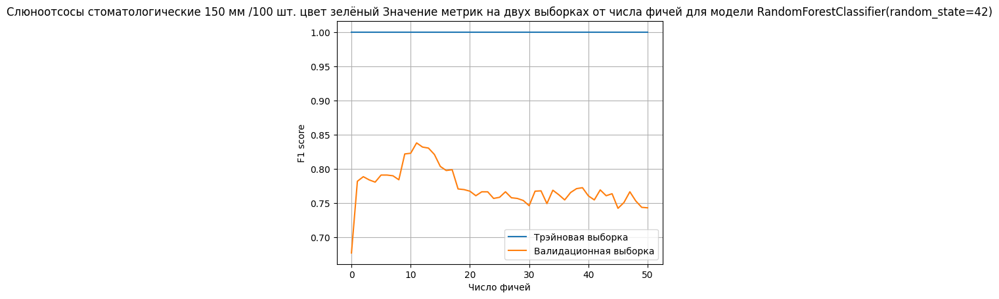

Crosvall
True Positives (TP): 150
True Negatives (TN): 22
False Positives (FP): 48
False Negatives (FN): 10
TPR: 0.9375
FPR: 0.6857142857142857
Presicion = TP / (TP + FP) = 150 / (150 + 48) = 150 / 198 = 0.7575757575757576
Recall = TP / (TP + FN) = 150 / (150 + 10) = 150 / 160 = 0.9375
F1 score = 2 * precision * recall / (precision + recall) = 0.8379888268156425


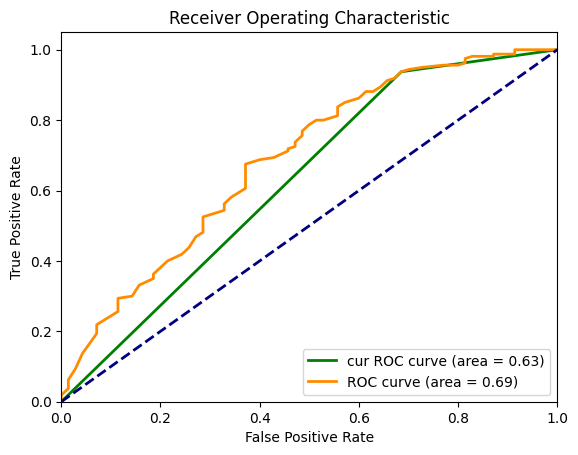

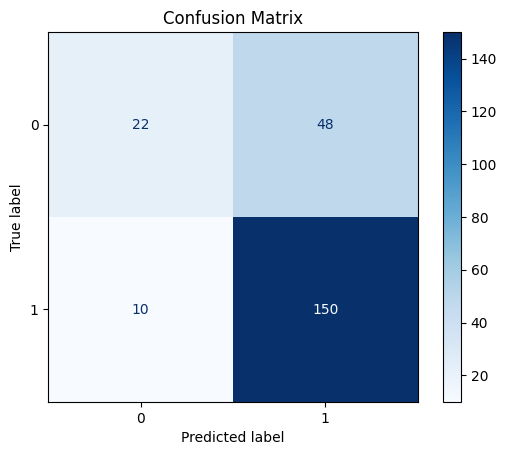

      Metric     Value
0    ROC AUC  0.687902
1       Gini  0.375804
2  Precision  0.757576
3     Recall  0.937500
4   F1 Score  0.837989
5   Accuracy  0.747826
Train


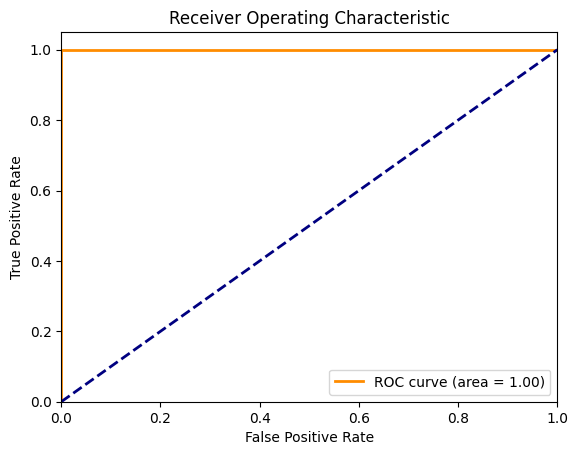

True Positives (TP): 160
True Negatives (TN): 71
False Positives (FP): 0
False Negatives (FN): 0
TPR: 1.0
FPR: 0.0


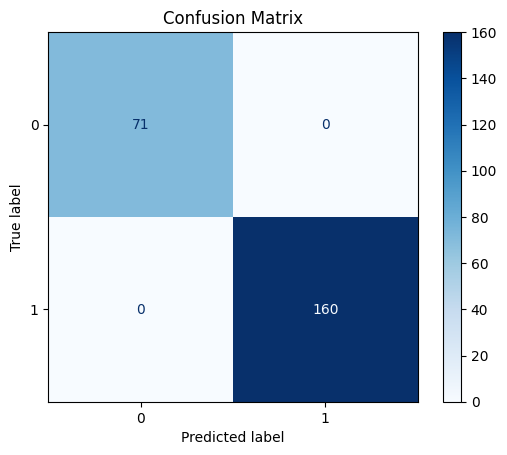

      Metric  Value
0    ROC AUC    1.0
1       Gini    1.0
2  Precision    1.0
3     Recall    1.0
4   F1 Score    1.0
5   Accuracy    1.0
['ewm_sales_week_3', 'unit_price', 'not_working_day', 'pre_holiday', 'not_working_day_prev', 'not_working_day_next', 'new_year_holidays_period', 'may_holidays_period', 'is_holiday', 'diff_1', 'diff_2', 'diff_3']


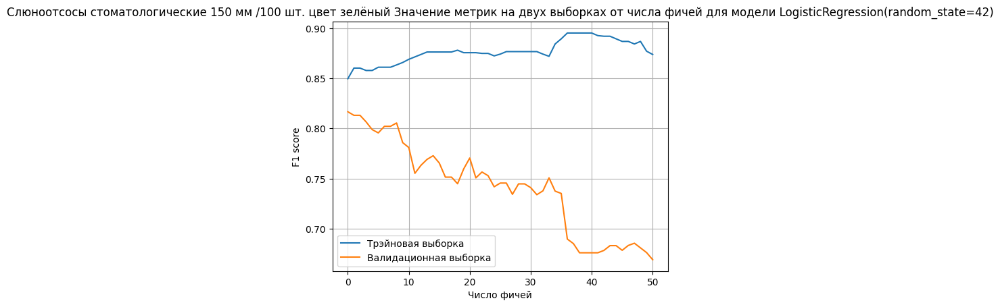

Crosvall
True Positives (TP): 156
True Negatives (TN): 4
False Positives (FP): 66
False Negatives (FN): 4
TPR: 0.975
FPR: 0.9428571428571428
Presicion = TP / (TP + FP) = 156 / (156 + 66) = 156 / 222 = 0.7027027027027027
Recall = TP / (TP + FN) = 156 / (156 + 4) = 156 / 160 = 0.975
F1 score = 2 * precision * recall / (precision + recall) = 0.8167539267015707


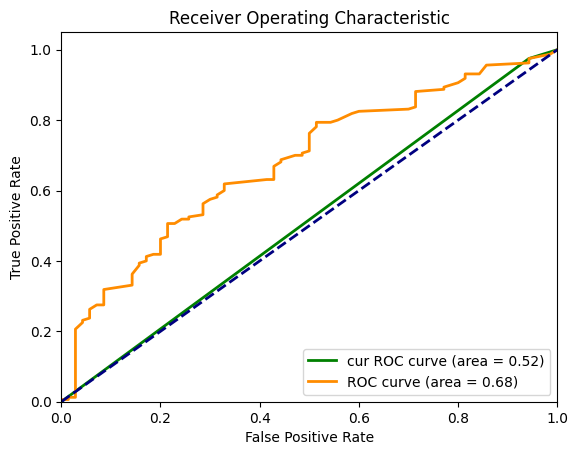

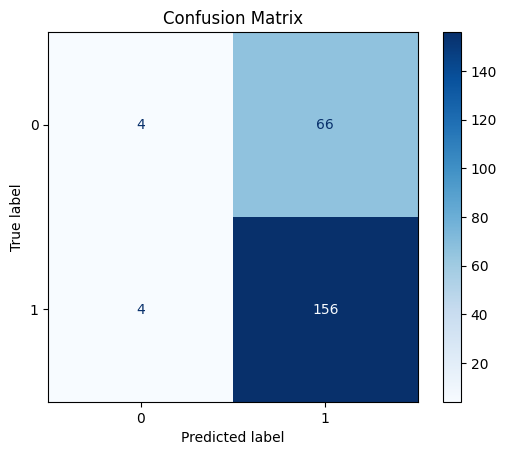

      Metric     Value
0    ROC AUC  0.679286
1       Gini  0.358571
2  Precision  0.702703
3     Recall  0.975000
4   F1 Score  0.816754
5   Accuracy  0.695652
Train


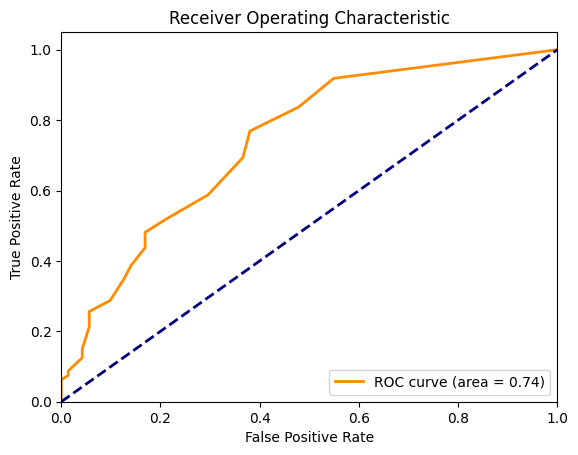

True Positives (TP): 147
True Negatives (TN): 32
False Positives (FP): 39
False Negatives (FN): 13
TPR: 0.91875
FPR: 0.5492957746478874


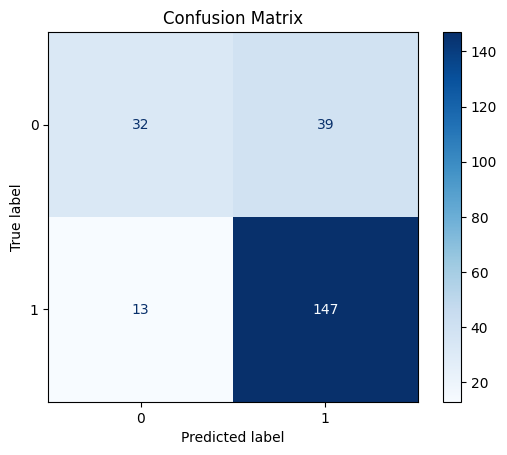

      Metric     Value
0    ROC AUC  0.740493
1       Gini  0.480986
2  Precision  0.790323
3     Recall  0.918750
4   F1 Score  0.849711
5   Accuracy  0.774892
['amount_rolling_mean_2']


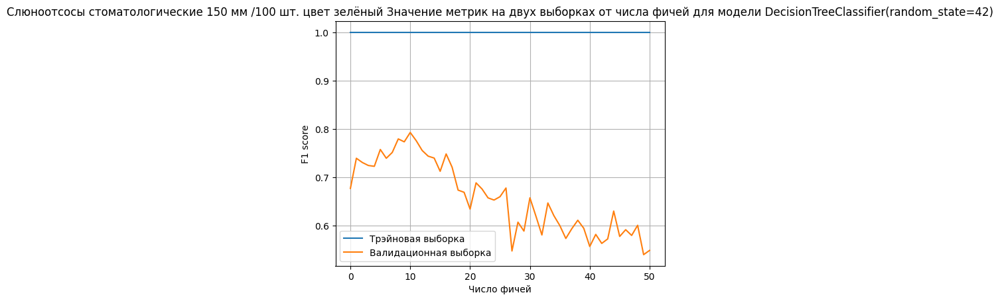

Crosvall
True Positives (TP): 132
True Negatives (TN): 29
False Positives (FP): 41
False Negatives (FN): 28
TPR: 0.825
FPR: 0.5857142857142857
Presicion = TP / (TP + FP) = 132 / (132 + 41) = 132 / 173 = 0.7630057803468208
Recall = TP / (TP + FN) = 132 / (132 + 28) = 132 / 160 = 0.825
F1 score = 2 * precision * recall / (precision + recall) = 0.7927927927927927


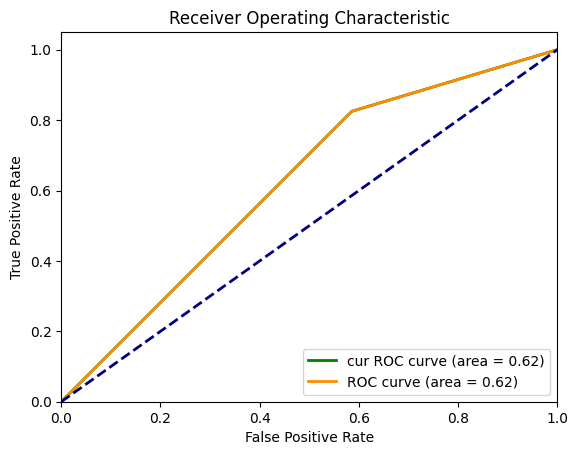

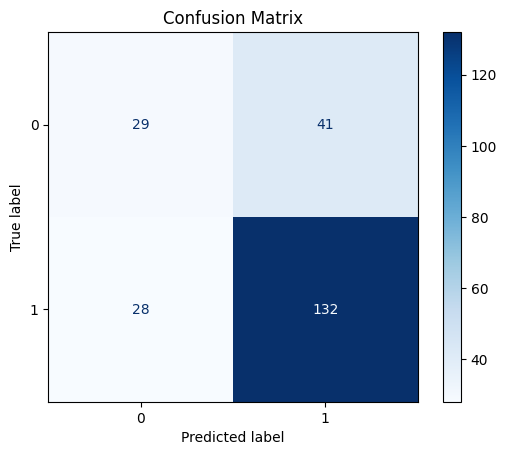

      Metric     Value
0    ROC AUC  0.619643
1       Gini  0.239286
2  Precision  0.763006
3     Recall  0.825000
4   F1 Score  0.792793
5   Accuracy  0.700000
Train


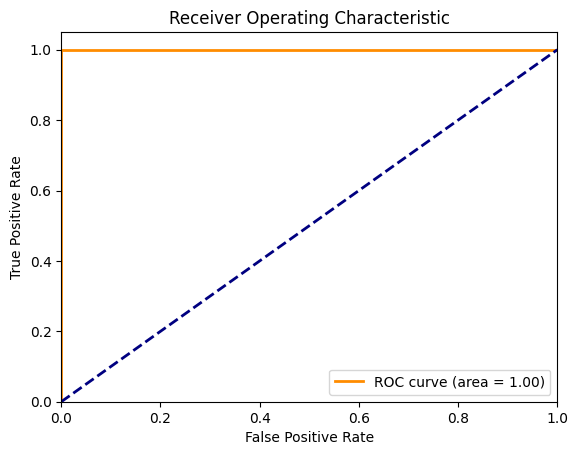

True Positives (TP): 160
True Negatives (TN): 71
False Positives (FP): 0
False Negatives (FN): 0
TPR: 1.0
FPR: 0.0


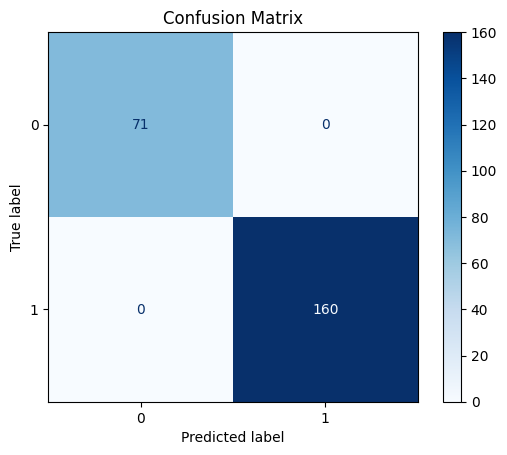

      Metric  Value
0    ROC AUC    1.0
1       Gini    1.0
2  Precision    1.0
3     Recall    1.0
4   F1 Score    1.0
5   Accuracy    1.0
['ewm_sales_week_3', 'unit_price', 'not_working_day', 'pre_holiday', 'not_working_day_prev', 'not_working_day_next', 'new_year_holidays_period', 'may_holidays_period', 'is_holiday', 'diff_1', 'diff_2']


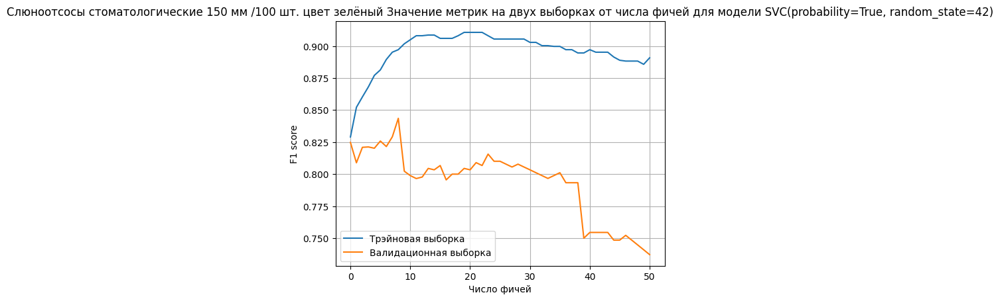

Crosvall
True Positives (TP): 151
True Negatives (TN): 23
False Positives (FP): 47
False Negatives (FN): 9
TPR: 0.94375
FPR: 0.6714285714285714
Presicion = TP / (TP + FP) = 151 / (151 + 47) = 151 / 198 = 0.7626262626262627
Recall = TP / (TP + FN) = 151 / (151 + 9) = 151 / 160 = 0.94375
F1 score = 2 * precision * recall / (precision + recall) = 0.8435754189944134


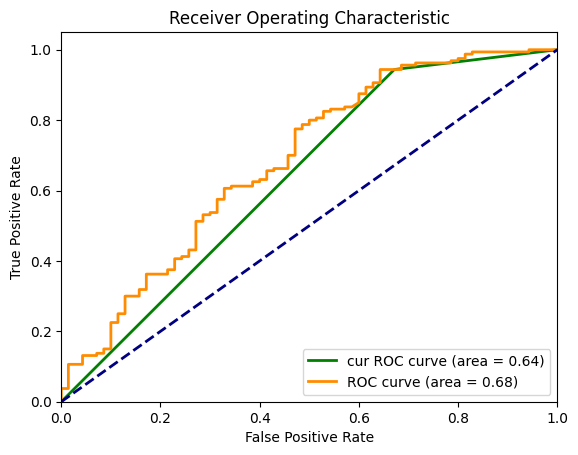

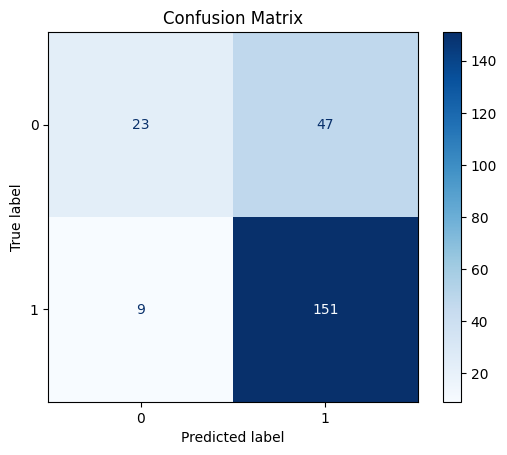

      Metric     Value
0    ROC AUC  0.684196
1       Gini  0.368393
2  Precision  0.762626
3     Recall  0.943750
4   F1 Score  0.843575
5   Accuracy  0.756522
Train


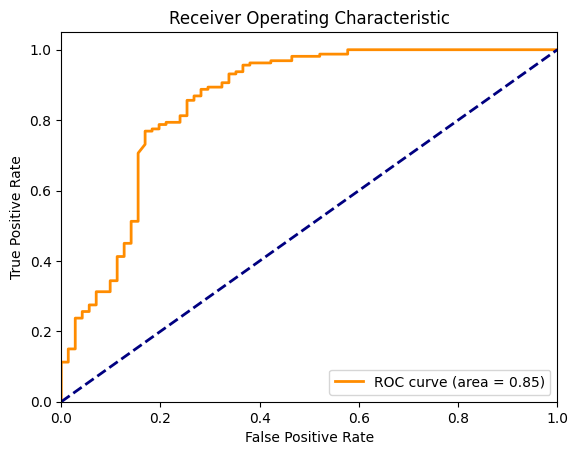

True Positives (TP): 157
True Negatives (TN): 38
False Positives (FP): 33
False Negatives (FN): 3
TPR: 0.98125
FPR: 0.4647887323943662


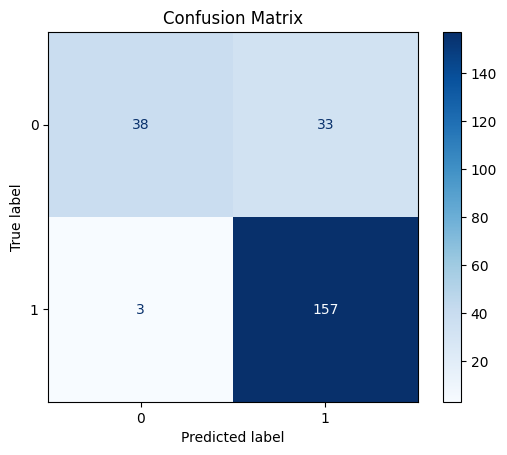

      Metric     Value
0    ROC AUC  0.853873
1       Gini  0.707746
2  Precision  0.826316
3     Recall  0.981250
4   F1 Score  0.897143
5   Accuracy  0.844156
['new_year_holidays_period', 'amount_rolling_mean_2', 'amount_rolling_median_12', 'not_working_day_prev', 'may_holidays_period', 'diff_2', 'diff_5', 'diff_1', 'not_working_day']


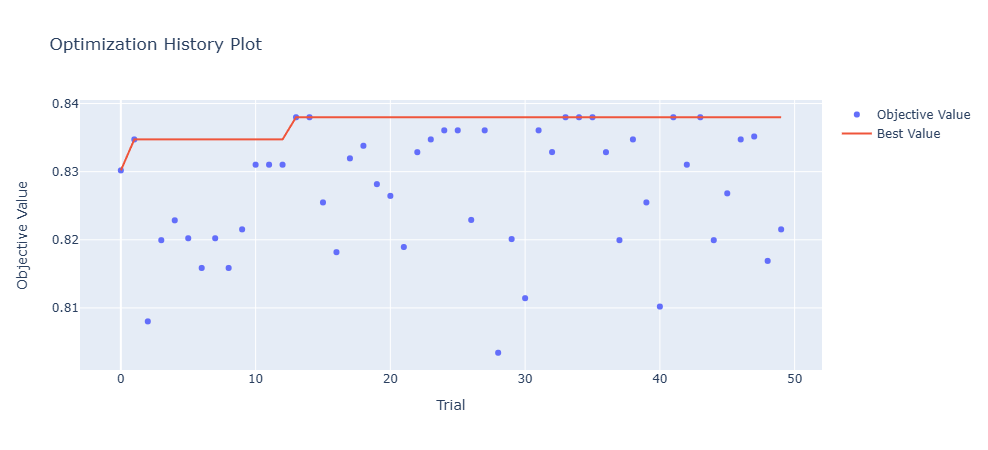

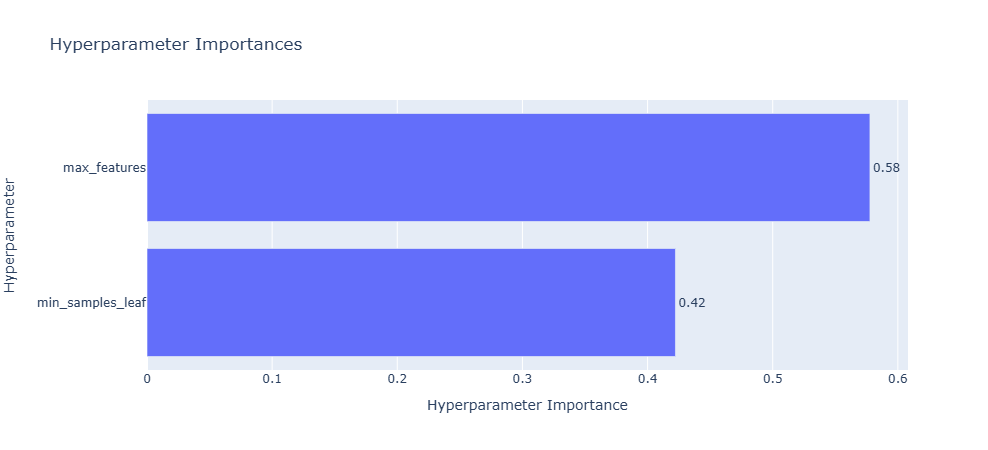

Best trial:
  Value: 0.8379888268156425
  Params: 
    min_samples_leaf: 10
    max_features: 7


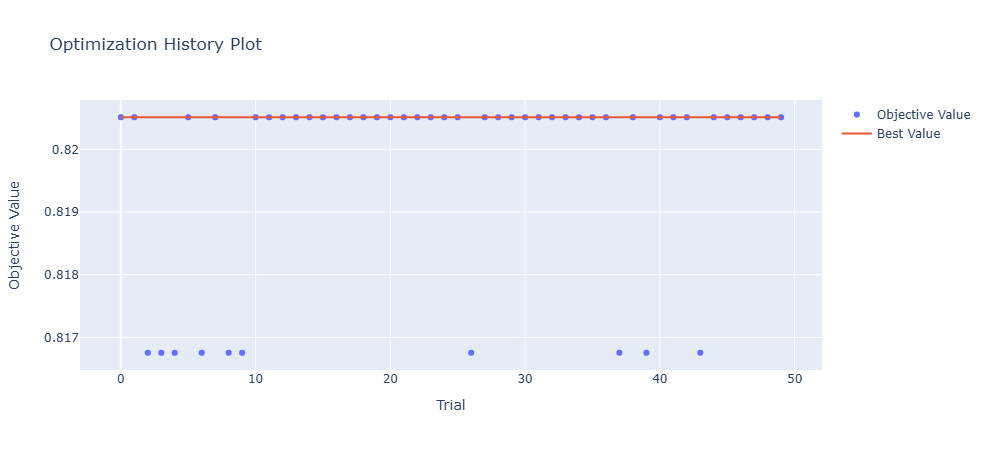

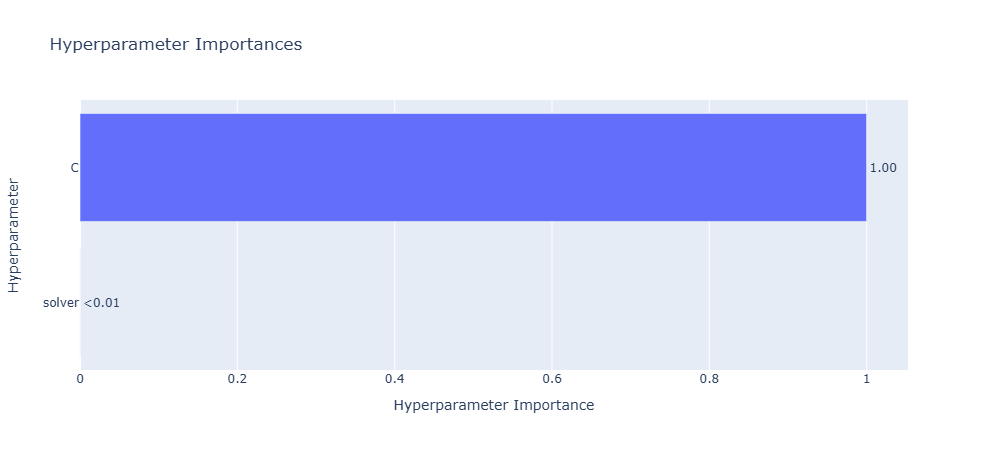

Best trial:
  Value: 0.8205128205128205
  Params: 
    C: 0.002181051421711374
    solver: lbfgs


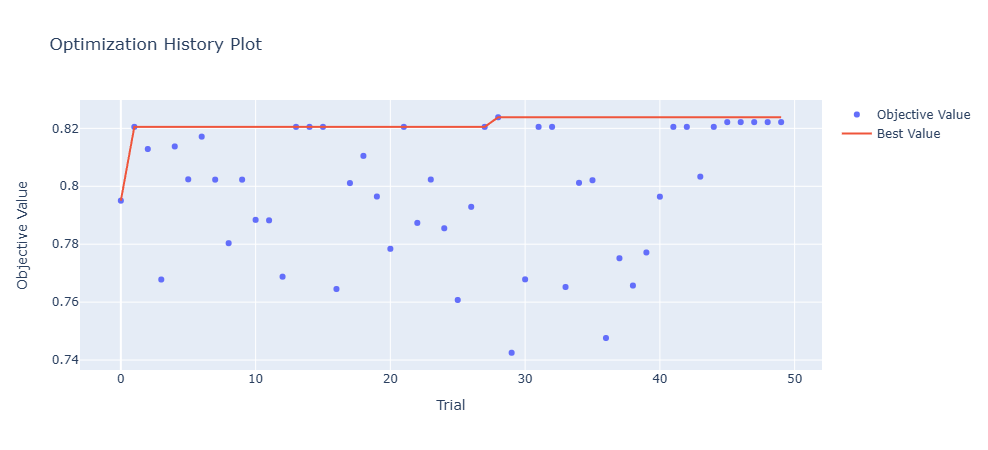

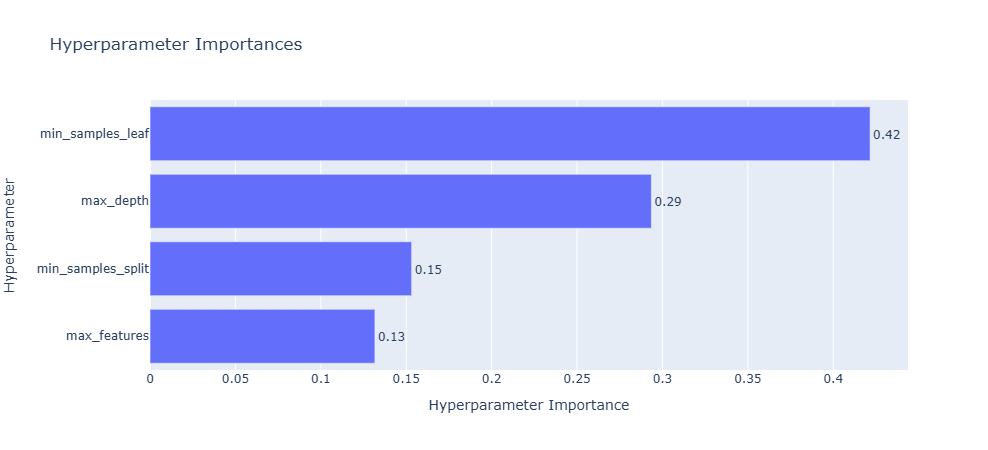

Best trial:
  Value: 0.8238341968911916
  Params: 
    max_depth: 1
    min_samples_split: 6
    min_samples_leaf: 1
    max_features: 3


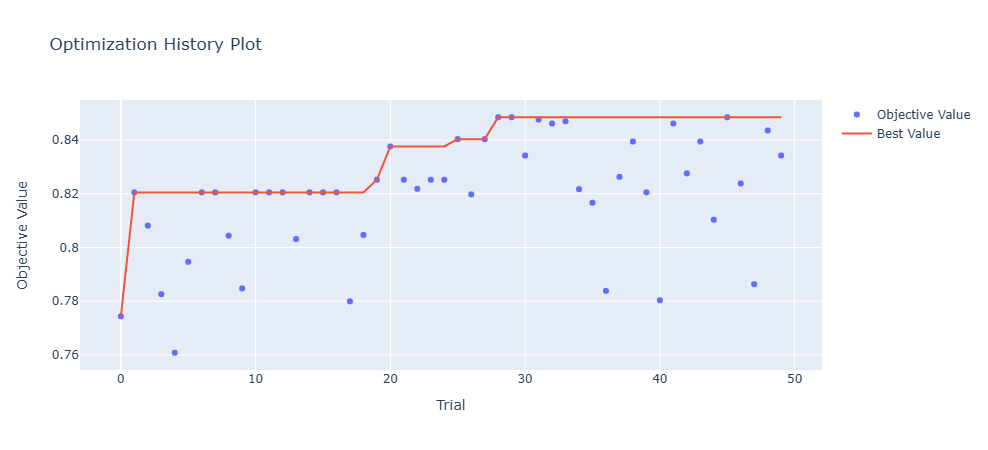

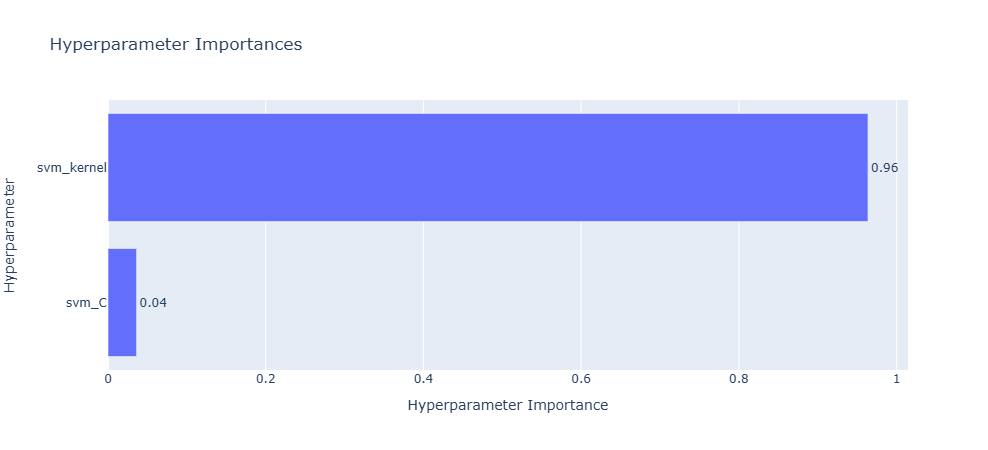

Best trial:
  Value: 0.8484848484848484
  Params: 
    svm_C: 0.7797590493902055
    svm_kernel: rbf
True Positives (TP): 150
True Negatives (TN): 22
False Positives (FP): 48
False Negatives (FN): 10
TPR: 0.9375
FPR: 0.6857142857142857
Presicion = TP / (TP + FP) = 150 / (150 + 48) = 150 / 198 = 0.7575757575757576
Recall = TP / (TP + FN) = 150 / (150 + 10) = 150 / 160 = 0.9375
F1 score = 2 * precision * recall / (precision + recall) = 0.8379888268156425


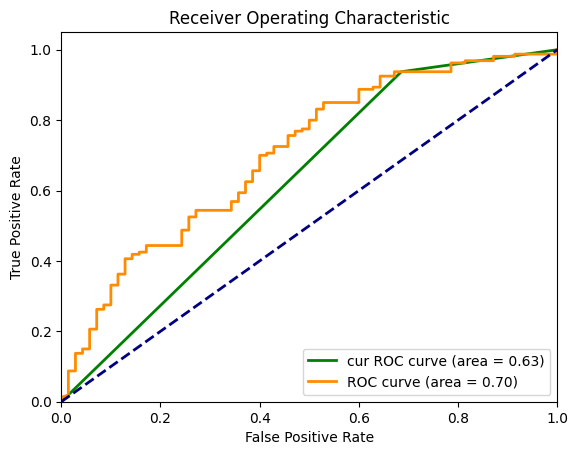

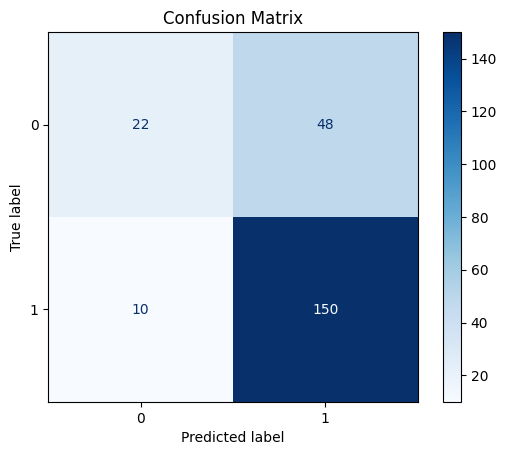

      Metric     Value
0    ROC AUC  0.702812
1       Gini  0.405625
2  Precision  0.757576
3     Recall  0.937500
4   F1 Score  0.837989
5   Accuracy  0.747826
True Positives (TP): 160
True Negatives (TN): 0
False Positives (FP): 70
False Negatives (FN): 0
TPR: 1.0
FPR: 1.0
Presicion = TP / (TP + FP) = 160 / (160 + 70) = 160 / 230 = 0.6956521739130435
Recall = TP / (TP + FN) = 160 / (160 + 0) = 160 / 160 = 1.0
F1 score = 2 * precision * recall / (precision + recall) = 0.8205128205128205


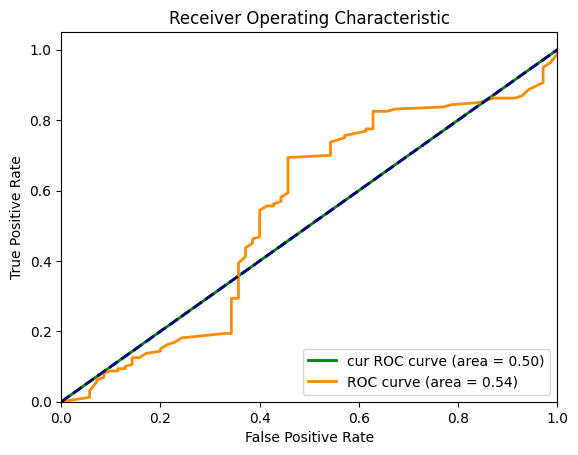

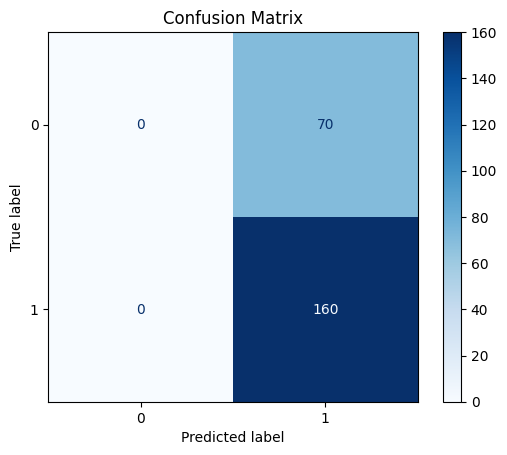

      Metric     Value
0    ROC AUC  0.539554
1       Gini  0.079107
2  Precision  0.695652
3     Recall  1.000000
4   F1 Score  0.820513
5   Accuracy  0.695652
True Positives (TP): 159
True Negatives (TN): 3
False Positives (FP): 67
False Negatives (FN): 1
TPR: 0.99375
FPR: 0.9571428571428572
Presicion = TP / (TP + FP) = 159 / (159 + 67) = 159 / 226 = 0.7035398230088495
Recall = TP / (TP + FN) = 159 / (159 + 1) = 159 / 160 = 0.99375
F1 score = 2 * precision * recall / (precision + recall) = 0.8238341968911916


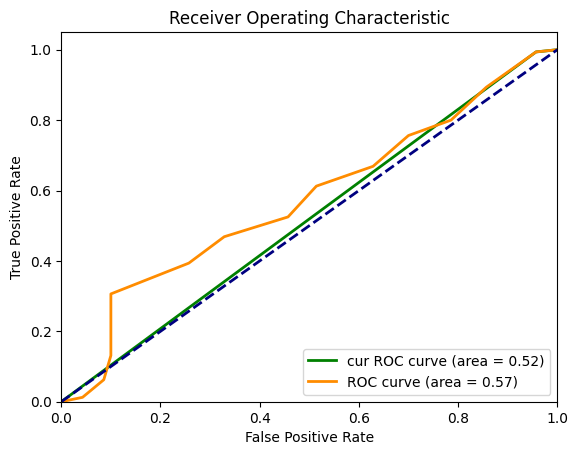

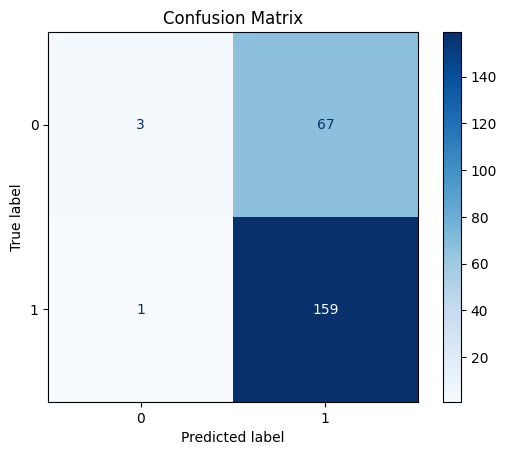

      Metric     Value
0    ROC AUC  0.573839
1       Gini  0.147679
2  Precision  0.703540
3     Recall  0.993750
4   F1 Score  0.823834
5   Accuracy  0.704348
True Positives (TP): 154
True Negatives (TN): 21
False Positives (FP): 49
False Negatives (FN): 6
TPR: 0.9625
FPR: 0.7
Presicion = TP / (TP + FP) = 154 / (154 + 49) = 154 / 203 = 0.7586206896551724
Recall = TP / (TP + FN) = 154 / (154 + 6) = 154 / 160 = 0.9625
F1 score = 2 * precision * recall / (precision + recall) = 0.8484848484848484


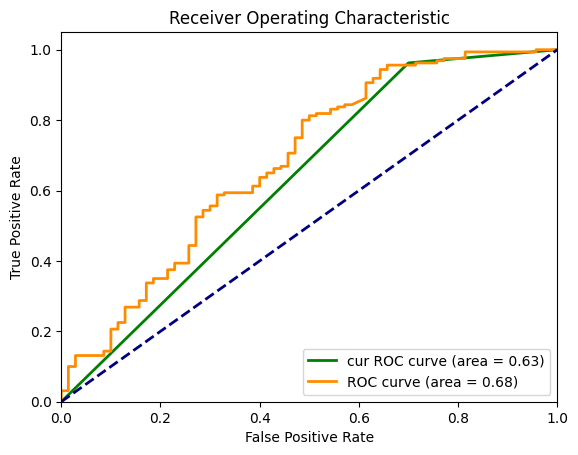

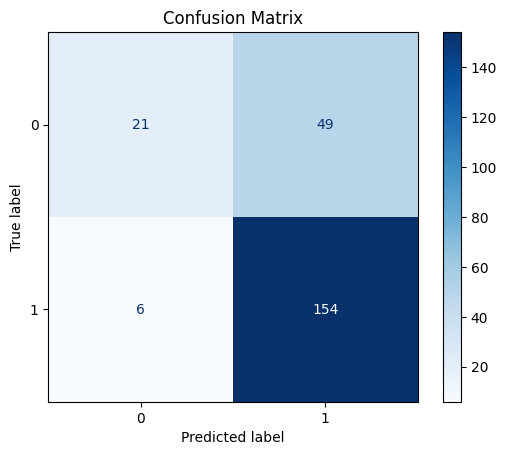

      Metric     Value
0    ROC AUC  0.682232
1       Gini  0.364464
2  Precision  0.758621
3     Recall  0.962500
4   F1 Score  0.848485
5   Accuracy  0.760870
Результат для Слюноотсосы стоматологические 150 мм /100 шт. цвет зелёный


,Model,Standart Features,Best features,Bset Features and Hyperparameters
0,RandomForest,0.754601,0.837989,"[0.6258928571428571, 0.8379888268156425]"
1,LogReg,0.669039,0.816754,"[0.5, 0.8205128205128205]"
2,Tree,0.570342,0.792793,"[0.5183035714285714, 0.8238341968911916]"
3,SVM,0.737160,0.843575,"[0.63125, 0.8484848484848484]"


In [65]:
for idx in ['1А51081А5108Зеленый']:
    item_id = wb_df[wb_df['sku_id'] == idx]['sku_name'].unique()[0]
    cur_train, cur_val, useless_features = make_df(item_id, st_date, fn_date, st_date_test, fn_date_test)
    useless_features = np.delete(useless_features[2:], 8) 
    model_array = []
    model_array.append(RandomForestClassifier(random_state=42))
    model_array.append(LogisticRegression(random_state=42))
    model_array.append(DecisionTreeClassifier(random_state=42))
    model_array.append(SVC(random_state=42, probability=True))
    first_iter_metrics = []
    for i in range(4):
        z, _ = sales_mask(cur_train, cur_val, useless_features, model=model_array[i], print_flag=False)
        first_iter_metrics.append(_[1])
    print(first_iter_metrics)
    rf_features, rf_metr = give_rf_features(item_id)
    log_features, log_metr = give_log_features(item_id)
    tree_features, tree_metr = give_tree_features(item_id)
    svm_features, svm_metr = give_svm_features(item_id)
    
    second_iter_metrics = [rf_metr, log_metr, tree_metr, svm_metr]
    
    rf_best_params = find_best_params(rf_objective, 50)
    log_best_params = find_best_params(log_objective, 50)
    tree_best_params = find_best_params(tree_objective, 50)
    svm_best_params = find_best_params(svm_objective, 50)
    
    model_1 = RandomForestClassifier(
        min_samples_leaf=rf_best_params['min_samples_leaf'],
        max_features=rf_best_params['max_features'],
        random_state=42
        )
    
    model_2 = LogisticRegression(
        C = log_best_params['C'],
        solver=log_best_params['solver'],
        max_iter=1000,
        random_state=42
        )
    
    model_3 =  DecisionTreeClassifier(
        max_depth=tree_best_params['max_depth'],
        min_samples_split=tree_best_params['min_samples_split'],
        min_samples_leaf=tree_best_params['min_samples_leaf'],
        max_features=tree_best_params['max_features'],
        random_state=42
        )
    
    model_4 = SVC(C=svm_best_params['svm_C'], kernel=svm_best_params['svm_kernel'], probability=True, random_state=42)
    
    rf_metr_upd = evaluate(model_1, rf_features)
    log_metr_upd = evaluate(model_2, log_features)
    tree_metr_upd = evaluate(model_3, tree_features)
    svm_metr_upd = evaluate(model_4, svm_features)
    
    third_iter_metrics = [rf_metr_upd, log_metr_upd, tree_metr_upd, svm_metr_upd]
    result = {
            "Model": ["RandomForest", "LogReg", "Tree", "SVM"],
            "Standart Features" : first_iter_metrics,
            "Best features" : second_iter_metrics,
            "Bset Features and Hyperparameters" : third_iter_metrics
    }
    print(f"Результат для {item_id}")
    result = pd.DataFrame(result)
    from IPython.display import display
    display(result)

[0.6451612903225806, 0.5806451612903226, 0.6206896551724138, 0.6666666666666666]


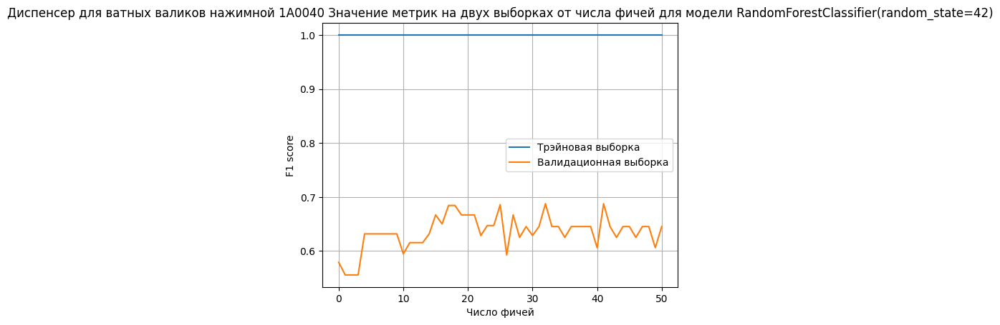

Crosvall
True Positives (TP): 11
True Negatives (TN): 7
False Positives (FP): 7
False Negatives (FN): 3
TPR: 0.7857142857142857
FPR: 0.5
Presicion = TP / (TP + FP) = 11 / (11 + 7) = 11 / 18 = 0.6111111111111112
Recall = TP / (TP + FN) = 11 / (11 + 3) = 11 / 14 = 0.7857142857142857
F1 score = 2 * precision * recall / (precision + recall) = 0.6875000000000001


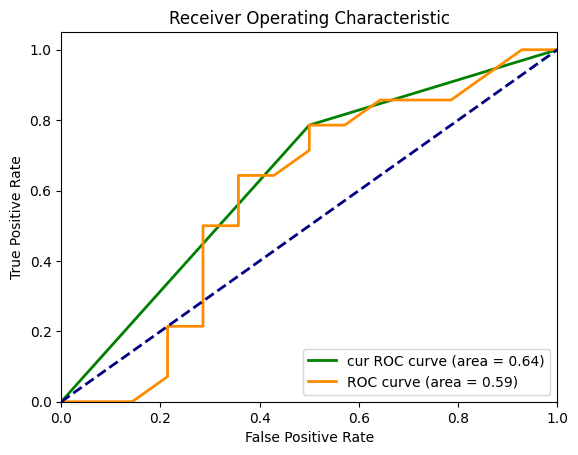

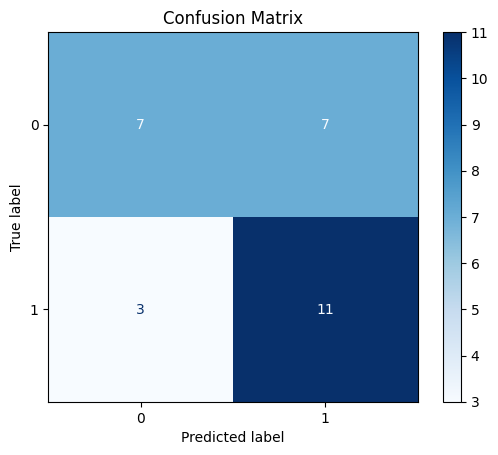

      Metric     Value
0    ROC AUC  0.589286
1       Gini  0.178571
2  Precision  0.611111
3     Recall  0.785714
4   F1 Score  0.687500
5   Accuracy  0.642857
Train


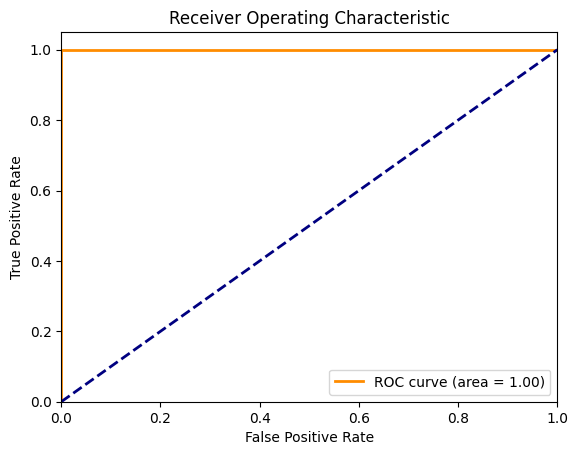

True Positives (TP): 39
True Negatives (TN): 20
False Positives (FP): 0
False Negatives (FN): 0
TPR: 1.0
FPR: 0.0


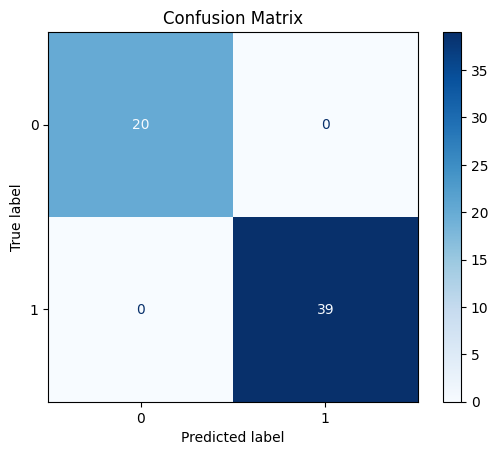

      Metric  Value
0    ROC AUC    1.0
1       Gini    1.0
2  Precision    1.0
3     Recall    1.0
4   F1 Score    1.0
5   Accuracy    1.0
['ewm_sales_week_3', 'unit_price', 'not_working_day', 'pre_holiday', 'not_working_day_prev', 'not_working_day_next', 'new_year_holidays_period', 'may_holidays_period', 'is_holiday', 'diff_1', 'diff_2', 'diff_3', 'diff_5', 'diff_7', 'diff_9', 'diff_12', 'diff_14', 'price_rolling_mean_2', 'price_rolling_mean_3', 'price_rolling_mean_5', 'price_rolling_mean_7', 'price_rolling_mean_9', 'price_rolling_mean_12', 'price_rolling_mean_14', 'amount_rolling_mean_2', 'amount_rolling_mean_3', 'amount_rolling_mean_5', 'amount_rolling_mean_7', 'amount_rolling_mean_9', 'amount_rolling_mean_12', 'amount_rolling_mean_14', 'price_rolling_median_2', 'price_rolling_median_3']


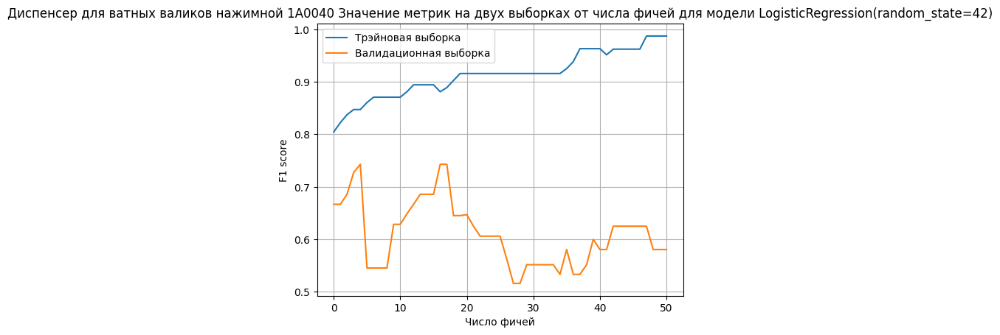

Crosvall
True Positives (TP): 13
True Negatives (TN): 6
False Positives (FP): 8
False Negatives (FN): 1
TPR: 0.9285714285714286
FPR: 0.5714285714285714
Presicion = TP / (TP + FP) = 13 / (13 + 8) = 13 / 21 = 0.6190476190476191
Recall = TP / (TP + FN) = 13 / (13 + 1) = 13 / 14 = 0.9285714285714286
F1 score = 2 * precision * recall / (precision + recall) = 0.742857142857143


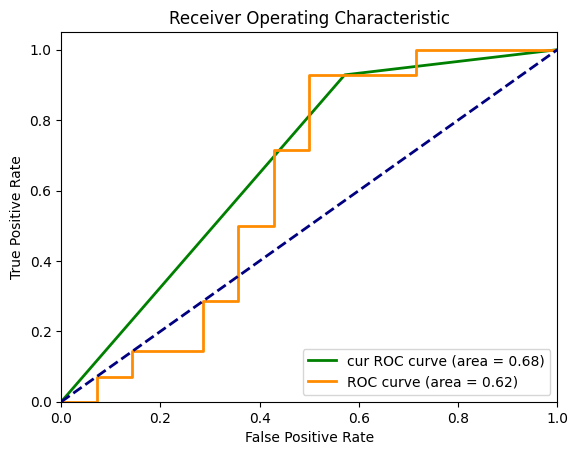

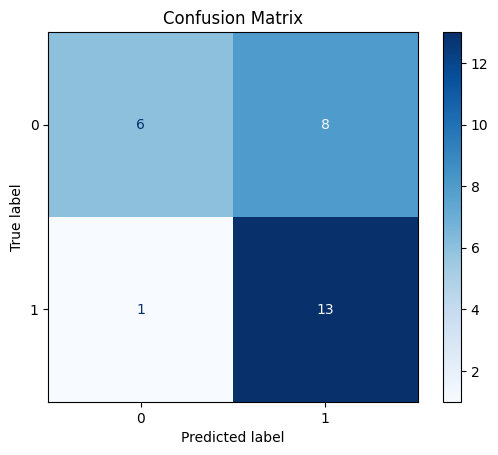

      Metric     Value
0    ROC AUC  0.617347
1       Gini  0.234694
2  Precision  0.619048
3     Recall  0.928571
4   F1 Score  0.742857
5   Accuracy  0.678571
Train


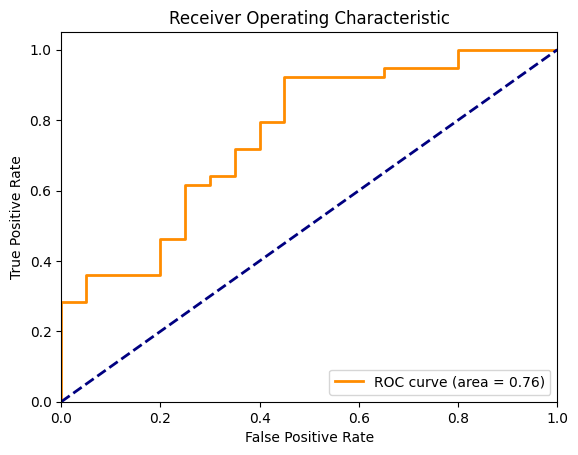

True Positives (TP): 36
True Negatives (TN): 10
False Positives (FP): 10
False Negatives (FN): 3
TPR: 0.9230769230769231
FPR: 0.5


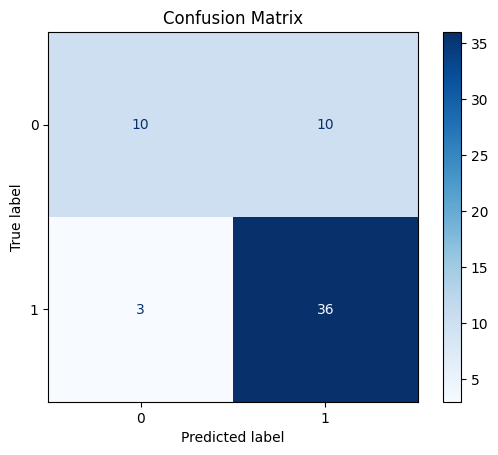

      Metric     Value
0    ROC AUC  0.756410
1       Gini  0.512821
2  Precision  0.782609
3     Recall  0.923077
4   F1 Score  0.847059
5   Accuracy  0.779661
['price_rolling_median_5', 'diff_1', 'diff_5', 'price_rolling_mean_5', 'unit_price']


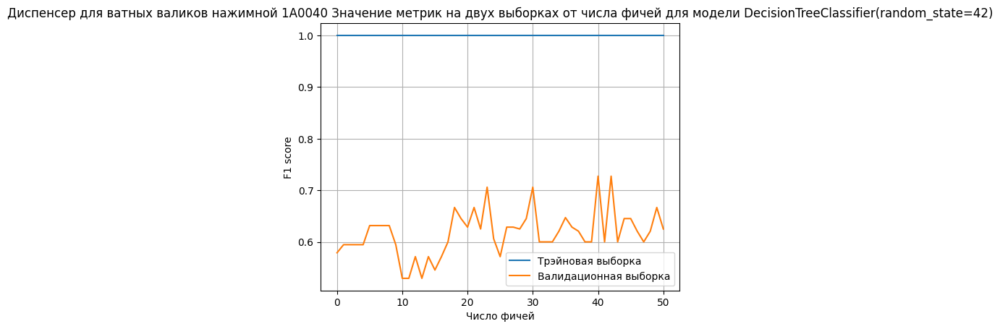

Crosvall
True Positives (TP): 12
True Negatives (TN): 7
False Positives (FP): 7
False Negatives (FN): 2
TPR: 0.8571428571428571
FPR: 0.5
Presicion = TP / (TP + FP) = 12 / (12 + 7) = 12 / 19 = 0.631578947368421
Recall = TP / (TP + FN) = 12 / (12 + 2) = 12 / 14 = 0.8571428571428571
F1 score = 2 * precision * recall / (precision + recall) = 0.7272727272727273


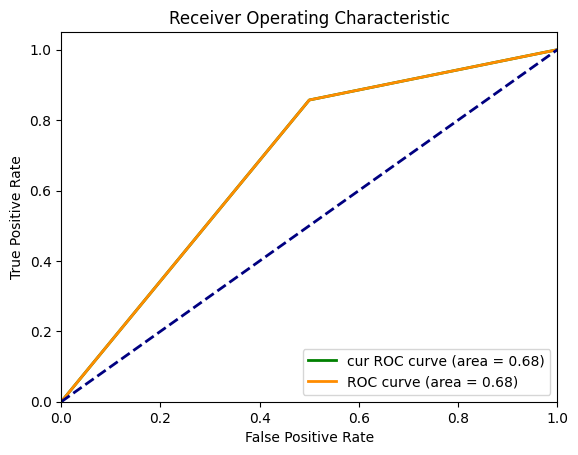

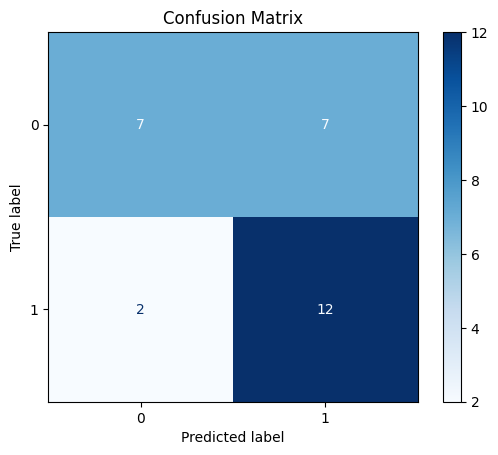

      Metric     Value
0    ROC AUC  0.678571
1       Gini  0.357143
2  Precision  0.631579
3     Recall  0.857143
4   F1 Score  0.727273
5   Accuracy  0.678571
Train


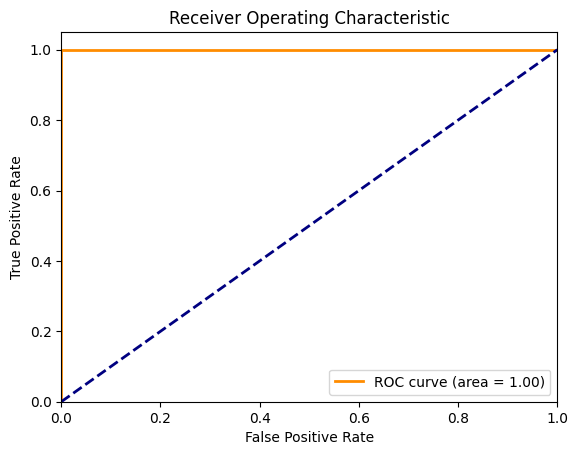

True Positives (TP): 39
True Negatives (TN): 20
False Positives (FP): 0
False Negatives (FN): 0
TPR: 1.0
FPR: 0.0


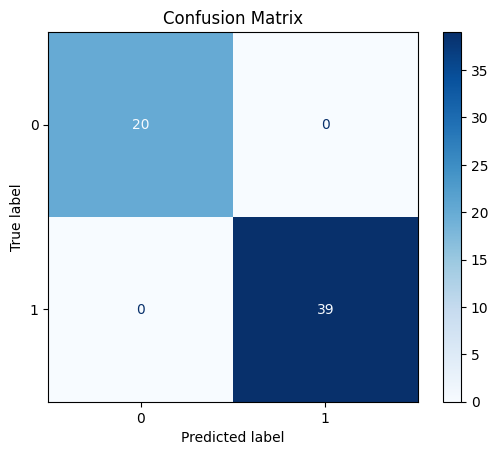

      Metric  Value
0    ROC AUC    1.0
1       Gini    1.0
2  Precision    1.0
3     Recall    1.0
4   F1 Score    1.0
5   Accuracy    1.0
['ewm_sales_week_3', 'unit_price', 'not_working_day', 'pre_holiday', 'not_working_day_prev', 'not_working_day_next', 'new_year_holidays_period', 'may_holidays_period', 'is_holiday', 'diff_1', 'diff_2', 'diff_3', 'diff_5', 'diff_7', 'diff_9', 'diff_12', 'diff_14', 'price_rolling_mean_2', 'price_rolling_mean_3', 'price_rolling_mean_5', 'price_rolling_mean_7', 'price_rolling_mean_9', 'price_rolling_mean_12', 'price_rolling_mean_14', 'amount_rolling_mean_2', 'amount_rolling_mean_3', 'amount_rolling_mean_5', 'amount_rolling_mean_7', 'amount_rolling_mean_9', 'amount_rolling_mean_12', 'amount_rolling_mean_14', 'price_rolling_median_2', 'price_rolling_median_3', 'price_rolling_median_5', 'price_rolling_median_7', 'price_rolling_median_9', 'price_rolling_median_12', 'price_rolling_median_14', 'amount_rolling_median_2', 'amount_rolling_median_3', 'amount_rol

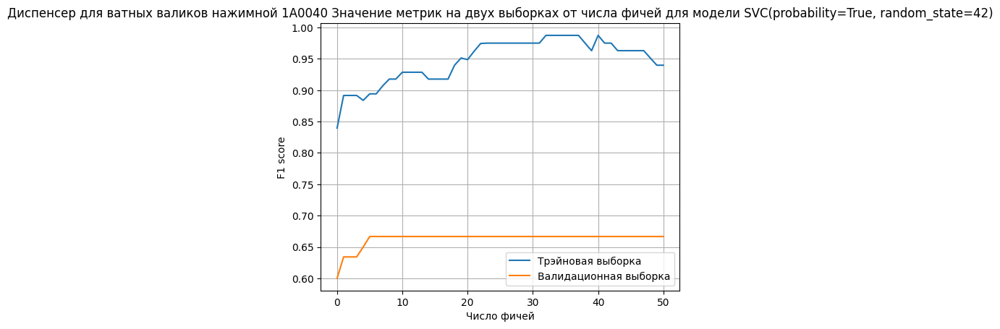

Crosvall
True Positives (TP): 14
True Negatives (TN): 0
False Positives (FP): 14
False Negatives (FN): 0
TPR: 1.0
FPR: 1.0
Presicion = TP / (TP + FP) = 14 / (14 + 14) = 14 / 28 = 0.5
Recall = TP / (TP + FN) = 14 / (14 + 0) = 14 / 14 = 1.0
F1 score = 2 * precision * recall / (precision + recall) = 0.6666666666666666


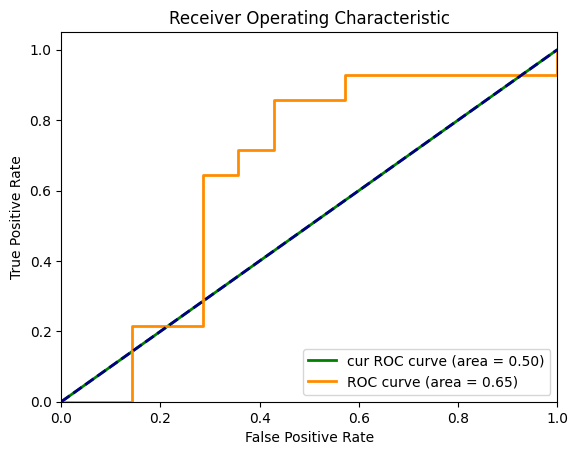

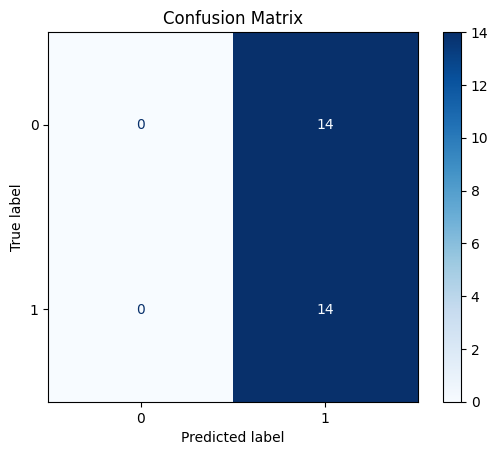

      Metric     Value
0    ROC AUC  0.647959
1       Gini  0.295918
2  Precision  0.500000
3     Recall  1.000000
4   F1 Score  0.666667
5   Accuracy  0.500000
Train


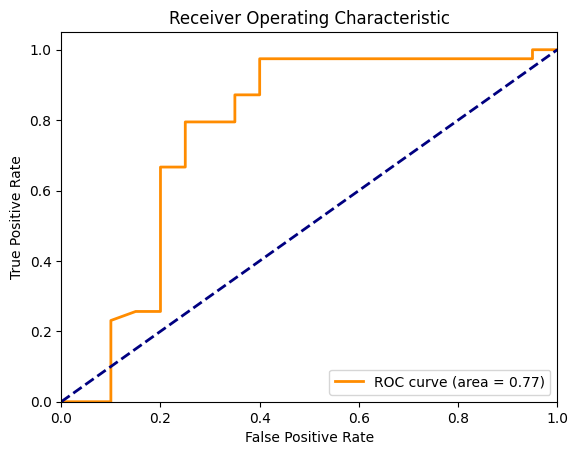

True Positives (TP): 38
True Negatives (TN): 12
False Positives (FP): 8
False Negatives (FN): 1
TPR: 0.9743589743589743
FPR: 0.4


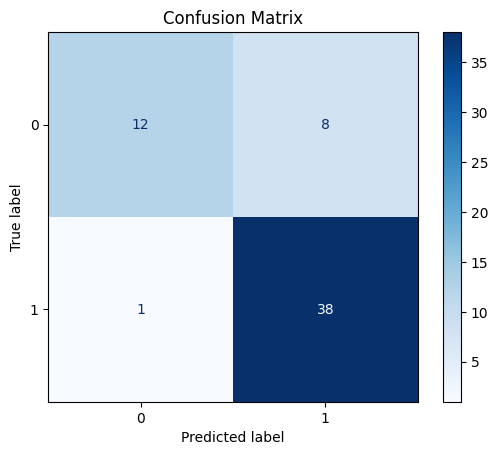

      Metric     Value
0    ROC AUC  0.767308
1       Gini  0.534615
2  Precision  0.826087
3     Recall  0.974359
4   F1 Score  0.894118
5   Accuracy  0.847458
['price_rolling_mean_2', 'diff_7', 'new_year_holidays_period', 'year', 'pre_holiday', 'unit_price']


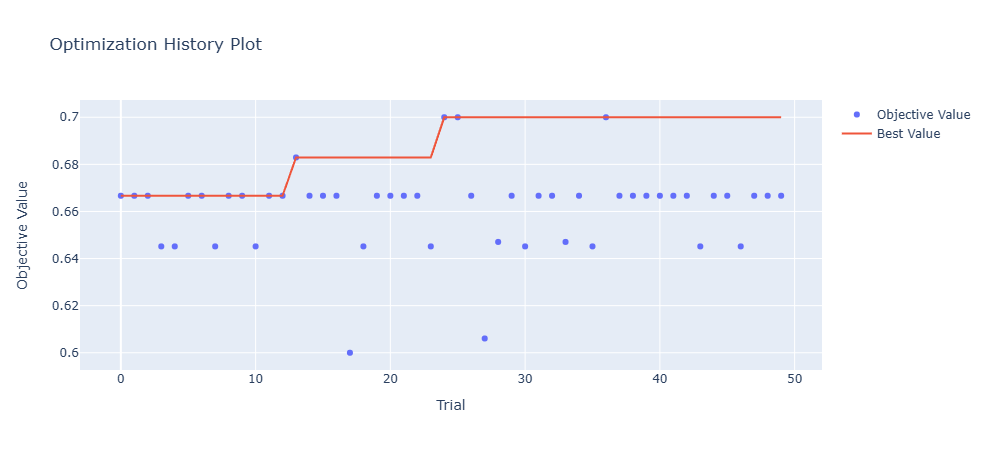

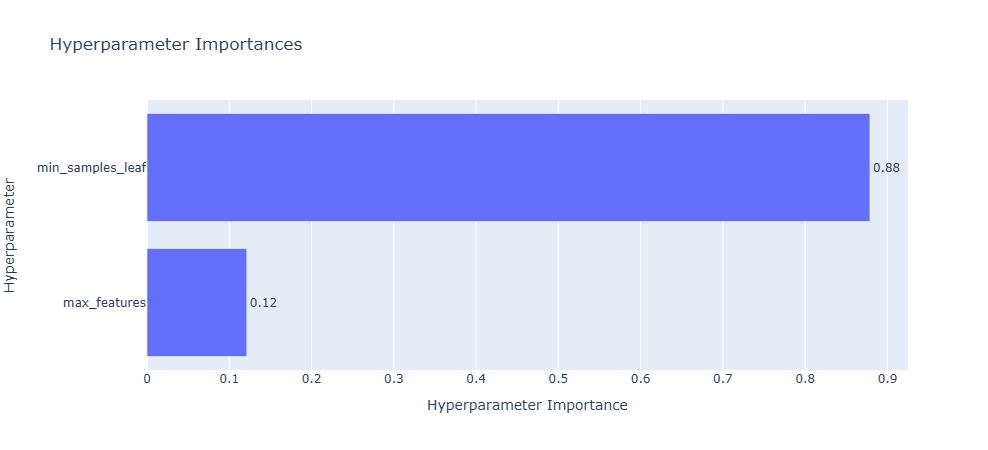

Best trial:
  Value: 0.7000000000000001
  Params: 
    min_samples_leaf: 6
    max_features: 9


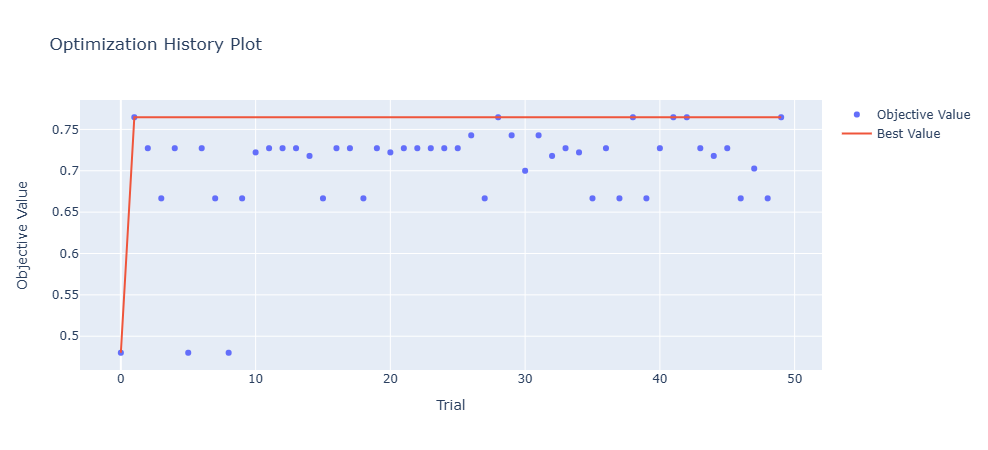

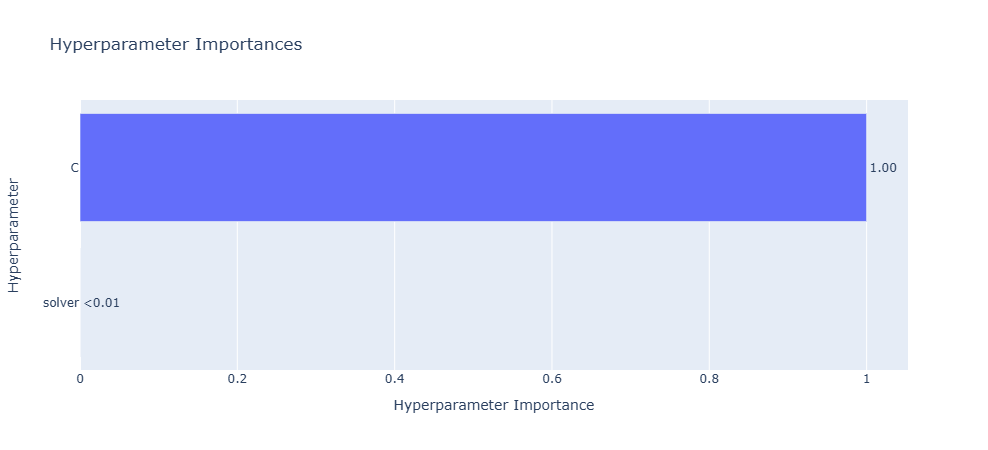

Best trial:
  Value: 0.7647058823529412
  Params: 
    C: 1.6405092865246007
    solver: lbfgs


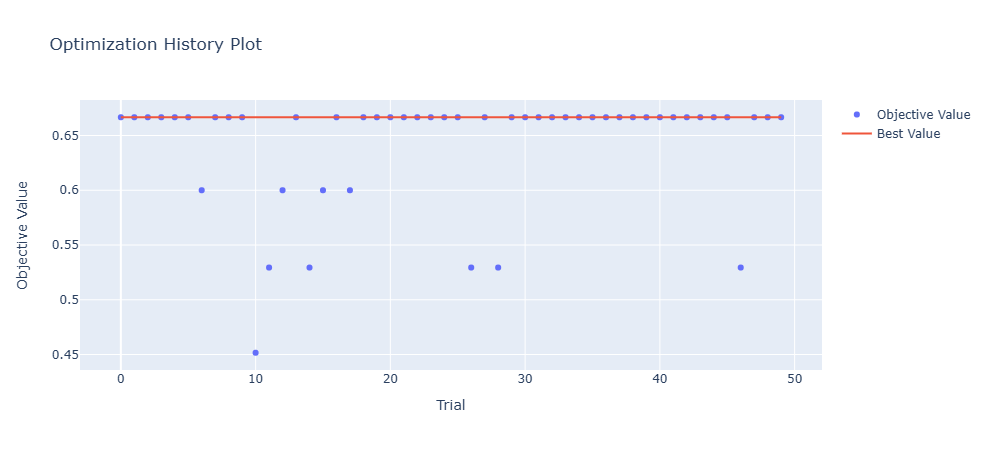

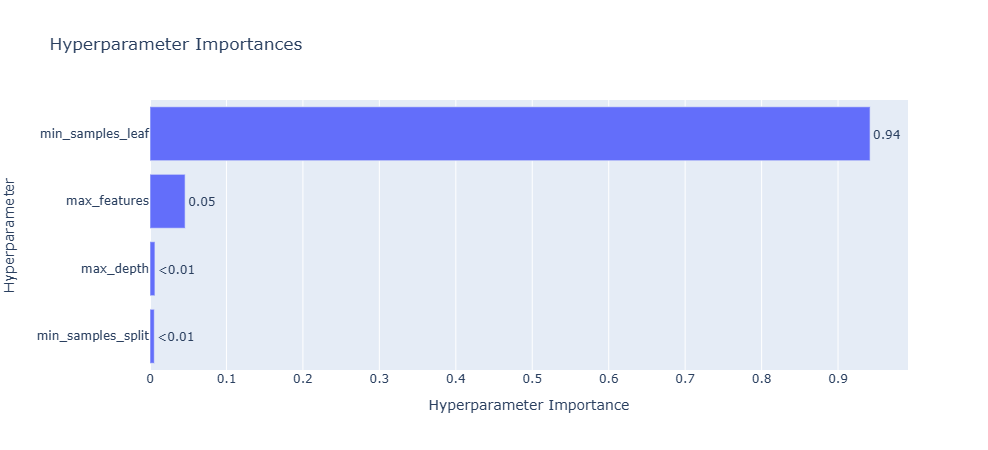

Best trial:
  Value: 0.6666666666666666
  Params: 
    max_depth: 26
    min_samples_split: 20
    min_samples_leaf: 12
    max_features: 7


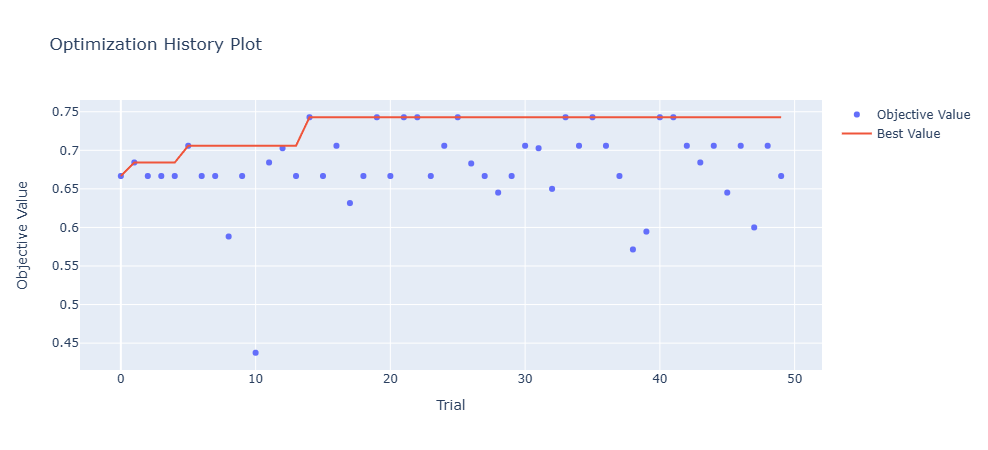

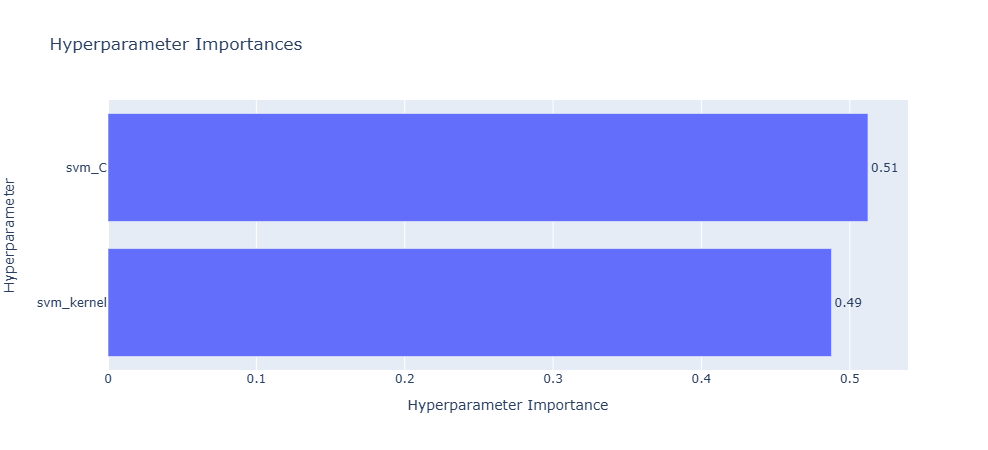

Best trial:
  Value: 0.742857142857143
  Params: 
    svm_C: 3.6777985938333155
    svm_kernel: rbf
True Positives (TP): 14
True Negatives (TN): 2
False Positives (FP): 12
False Negatives (FN): 0
TPR: 1.0
FPR: 0.8571428571428571
Presicion = TP / (TP + FP) = 14 / (14 + 12) = 14 / 26 = 0.5384615384615384
Recall = TP / (TP + FN) = 14 / (14 + 0) = 14 / 14 = 1.0
F1 score = 2 * precision * recall / (precision + recall) = 0.7000000000000001


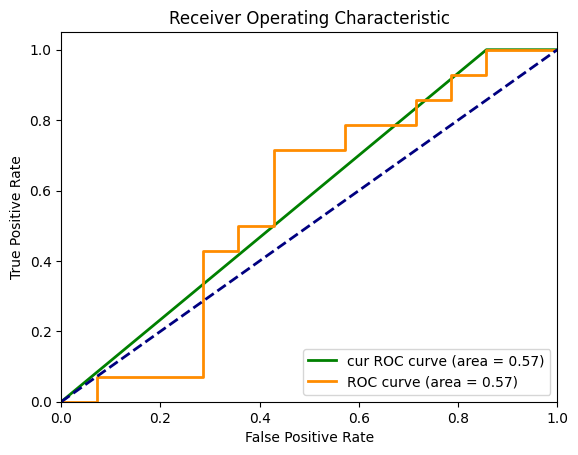

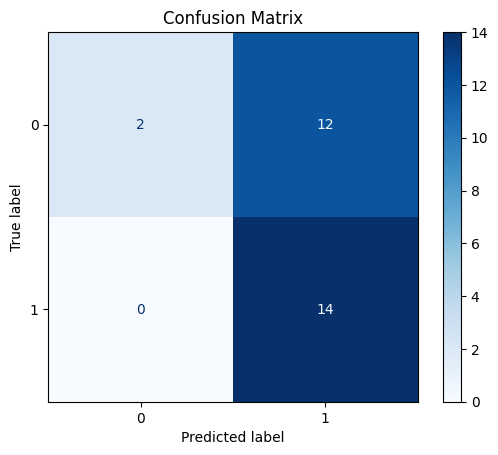

      Metric     Value
0    ROC AUC  0.566327
1       Gini  0.132653
2  Precision  0.538462
3     Recall  1.000000
4   F1 Score  0.700000
5   Accuracy  0.571429
True Positives (TP): 13
True Negatives (TN): 7
False Positives (FP): 7
False Negatives (FN): 1
TPR: 0.9285714285714286
FPR: 0.5
Presicion = TP / (TP + FP) = 13 / (13 + 7) = 13 / 20 = 0.65
Recall = TP / (TP + FN) = 13 / (13 + 1) = 13 / 14 = 0.9285714285714286
F1 score = 2 * precision * recall / (precision + recall) = 0.7647058823529412


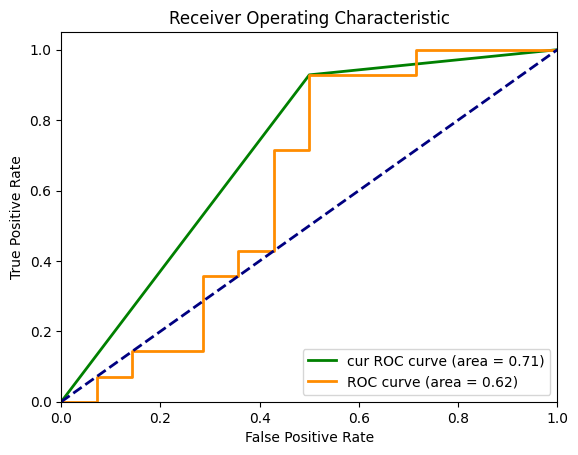

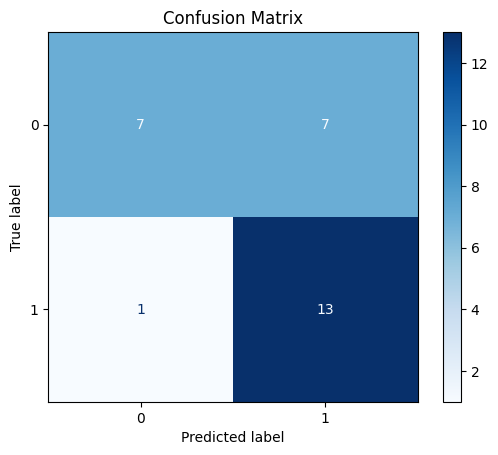

      Metric     Value
0    ROC AUC  0.617347
1       Gini  0.234694
2  Precision  0.650000
3     Recall  0.928571
4   F1 Score  0.764706
5   Accuracy  0.714286
True Positives (TP): 14
True Negatives (TN): 0
False Positives (FP): 14
False Negatives (FN): 0
TPR: 1.0
FPR: 1.0
Presicion = TP / (TP + FP) = 14 / (14 + 14) = 14 / 28 = 0.5
Recall = TP / (TP + FN) = 14 / (14 + 0) = 14 / 14 = 1.0
F1 score = 2 * precision * recall / (precision + recall) = 0.6666666666666666


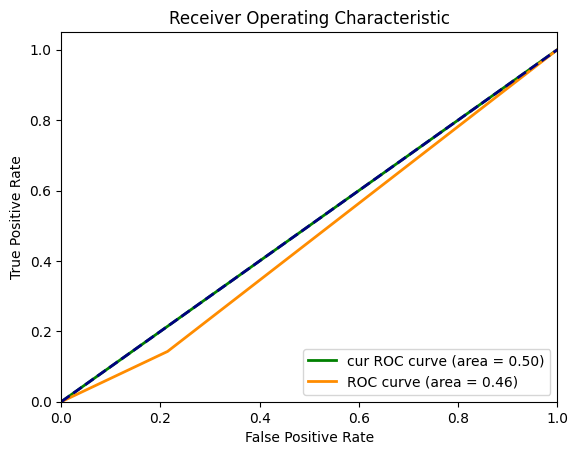

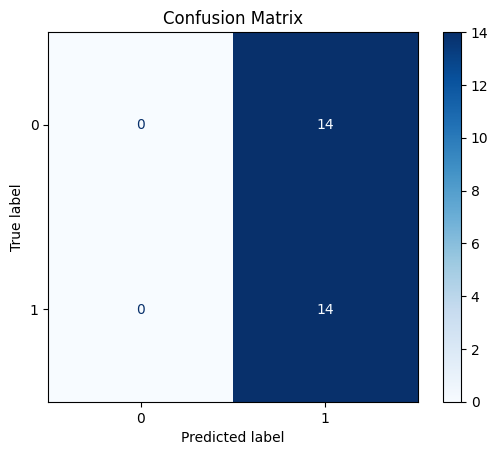

      Metric     Value
0    ROC AUC  0.464286
1       Gini -0.071429
2  Precision  0.500000
3     Recall  1.000000
4   F1 Score  0.666667
5   Accuracy  0.500000
True Positives (TP): 13
True Negatives (TN): 6
False Positives (FP): 8
False Negatives (FN): 1
TPR: 0.9285714285714286
FPR: 0.5714285714285714
Presicion = TP / (TP + FP) = 13 / (13 + 8) = 13 / 21 = 0.6190476190476191
Recall = TP / (TP + FN) = 13 / (13 + 1) = 13 / 14 = 0.9285714285714286
F1 score = 2 * precision * recall / (precision + recall) = 0.742857142857143


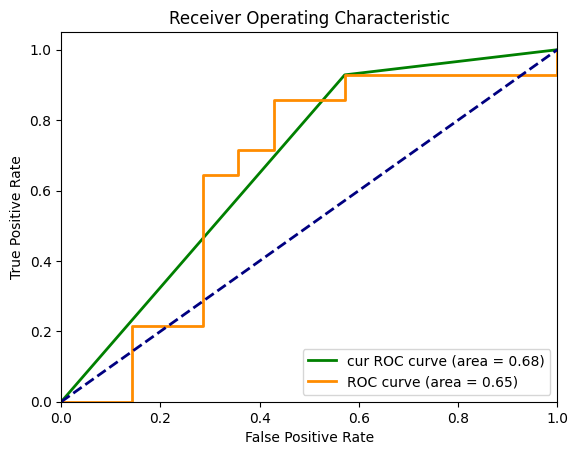

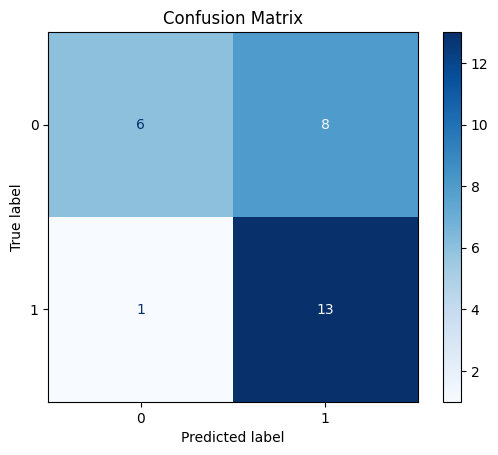

      Metric     Value
0    ROC AUC  0.647959
1       Gini  0.295918
2  Precision  0.619048
3     Recall  0.928571
4   F1 Score  0.742857
5   Accuracy  0.678571
Результат для Диспенсер для ватных валиков нажимной 1А0040


,Model,Standart Features,Best features,Bset Features and Hyperparameters
0,RandomForest,0.645161,0.687500,"[0.5714285714285714, 0.7000000000000001]"
1,LogReg,0.580645,0.742857,"[0.7142857142857143, 0.7647058823529412]"
2,Tree,0.620690,0.727273,"[0.5, 0.6666666666666666]"
3,SVM,0.666667,0.666667,"[0.6785714285714286, 0.742857142857143]"


In [66]:
for idx in ['1А00401А0040С']:
    item_id = wb_df[wb_df['sku_id'] == idx]['sku_name'].unique()[0]
    cur_train, cur_val, useless_features = make_df(item_id, st_date, fn_date, st_date_test, fn_date_test)
    useless_features = np.delete(useless_features[2:], 8) 
    model_array = []
    model_array.append(RandomForestClassifier(random_state=42))
    model_array.append(LogisticRegression(random_state=42))
    model_array.append(DecisionTreeClassifier(random_state=42))
    model_array.append(SVC(random_state=42, probability=True))
    first_iter_metrics = []
    for i in range(4):
        z, _ = sales_mask(cur_train, cur_val, useless_features, model=model_array[i], print_flag=False)
        first_iter_metrics.append(_[1])
    print(first_iter_metrics)
    rf_features, rf_metr = give_rf_features(item_id)
    log_features, log_metr = give_log_features(item_id)
    tree_features, tree_metr = give_tree_features(item_id)
    svm_features, svm_metr = give_svm_features(item_id)
    
    second_iter_metrics = [rf_metr, log_metr, tree_metr, svm_metr]
    
    rf_best_params = find_best_params(rf_objective, 50)
    log_best_params = find_best_params(log_objective, 50)
    tree_best_params = find_best_params(tree_objective, 50)
    svm_best_params = find_best_params(svm_objective, 50)
    
    model_1 = RandomForestClassifier(
        min_samples_leaf=rf_best_params['min_samples_leaf'],
        max_features=rf_best_params['max_features'],
        random_state=42
        )
    
    model_2 = LogisticRegression(
        C = log_best_params['C'],
        solver=log_best_params['solver'],
        max_iter=1000,
        random_state=42
        )
    
    model_3 =  DecisionTreeClassifier(
        max_depth=tree_best_params['max_depth'],
        min_samples_split=tree_best_params['min_samples_split'],
        min_samples_leaf=tree_best_params['min_samples_leaf'],
        max_features=tree_best_params['max_features'],
        random_state=42
        )
    
    model_4 = SVC(C=svm_best_params['svm_C'], kernel=svm_best_params['svm_kernel'], probability=True, random_state=42)
    
    rf_metr_upd = evaluate(model_1, rf_features)
    log_metr_upd = evaluate(model_2, log_features)
    tree_metr_upd = evaluate(model_3, tree_features)
    svm_metr_upd = evaluate(model_4, svm_features)
    
    third_iter_metrics = [rf_metr_upd, log_metr_upd, tree_metr_upd, svm_metr_upd]
    result = {
            "Model": ["RandomForest", "LogReg", "Tree", "SVM"],
            "Standart Features" : first_iter_metrics,
            "Best features" : second_iter_metrics,
            "Bset Features and Hyperparameters" : third_iter_metrics
    }
    print(f"Результат для {item_id}")
    result = pd.DataFrame(result)
    from IPython.display import display
    display(result)

[0.9104938271604938, 0.8938193343898573, 0.846938775510204, 0.923076923076923]


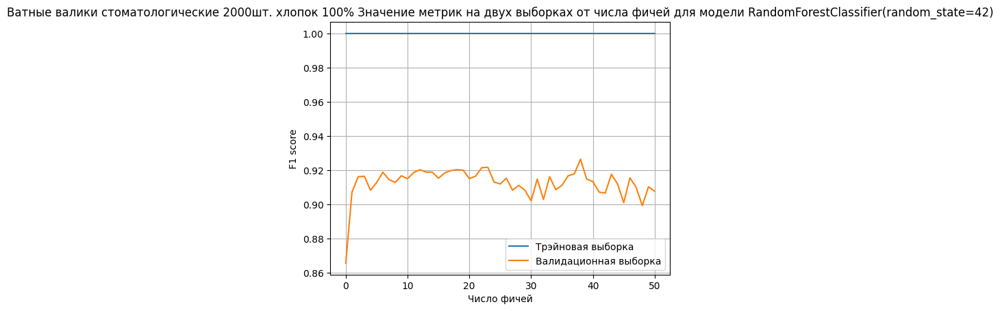

Crosvall
True Positives (TP): 302
True Negatives (TN): 10
False Positives (FP): 44
False Negatives (FN): 4
TPR: 0.9869281045751634
FPR: 0.8148148148148148
Presicion = TP / (TP + FP) = 302 / (302 + 44) = 302 / 346 = 0.8728323699421965
Recall = TP / (TP + FN) = 302 / (302 + 4) = 302 / 306 = 0.9869281045751634
F1 score = 2 * precision * recall / (precision + recall) = 0.9263803680981595


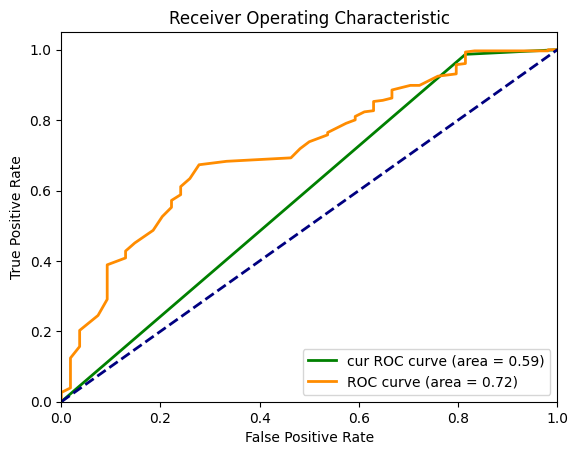

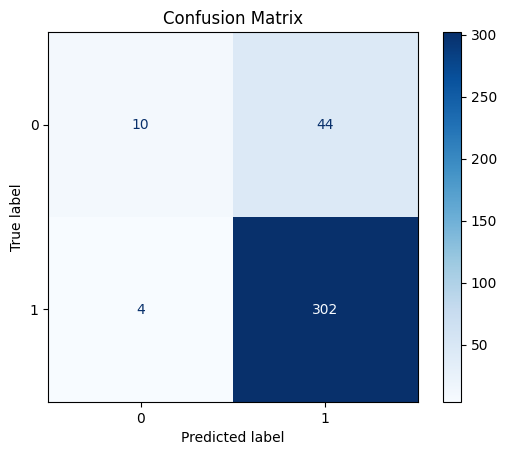

      Metric     Value
0    ROC AUC  0.717502
1       Gini  0.435004
2  Precision  0.872832
3     Recall  0.986928
4   F1 Score  0.926380
5   Accuracy  0.866667
Train


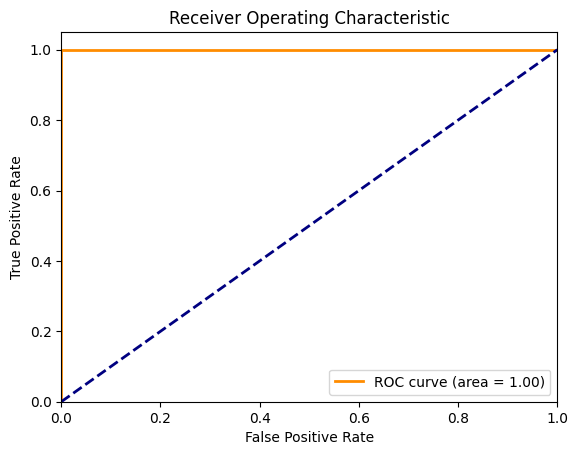

True Positives (TP): 303
True Negatives (TN): 58
False Positives (FP): 0
False Negatives (FN): 0
TPR: 1.0
FPR: 0.0


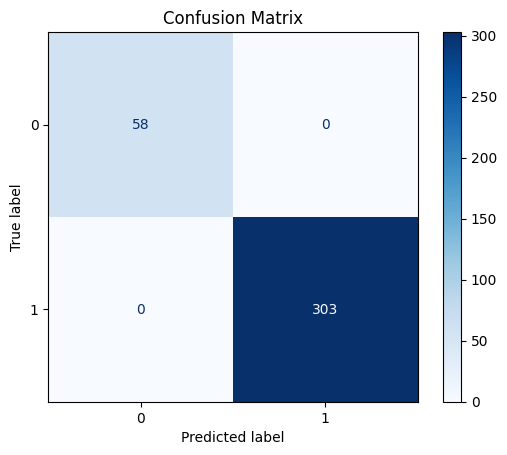

      Metric  Value
0    ROC AUC    1.0
1       Gini    1.0
2  Precision    1.0
3     Recall    1.0
4   F1 Score    1.0
5   Accuracy    1.0
['ewm_sales_week_3', 'unit_price', 'not_working_day', 'pre_holiday', 'not_working_day_prev', 'not_working_day_next', 'new_year_holidays_period', 'may_holidays_period', 'is_holiday', 'diff_1', 'diff_2', 'diff_3', 'diff_5', 'diff_7', 'diff_9', 'diff_12', 'diff_14', 'price_rolling_mean_2', 'price_rolling_mean_3', 'price_rolling_mean_5', 'price_rolling_mean_7', 'price_rolling_mean_9', 'price_rolling_mean_12', 'price_rolling_mean_14', 'amount_rolling_mean_2', 'amount_rolling_mean_3', 'amount_rolling_mean_5', 'amount_rolling_mean_7', 'amount_rolling_mean_9', 'amount_rolling_mean_12', 'amount_rolling_mean_14', 'price_rolling_median_2', 'price_rolling_median_3', 'price_rolling_median_5', 'price_rolling_median_7', 'price_rolling_median_9', 'price_rolling_median_12', 'price_rolling_median_14', 'amount_rolling_median_2']


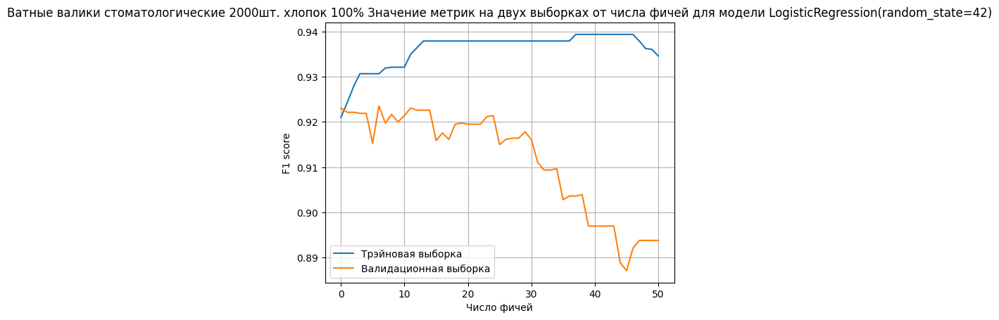

Crosvall
True Positives (TP): 302
True Negatives (TN): 8
False Positives (FP): 46
False Negatives (FN): 4
TPR: 0.9869281045751634
FPR: 0.8518518518518519
Presicion = TP / (TP + FP) = 302 / (302 + 46) = 302 / 348 = 0.867816091954023
Recall = TP / (TP + FN) = 302 / (302 + 4) = 302 / 306 = 0.9869281045751634
F1 score = 2 * precision * recall / (precision + recall) = 0.9235474006116209


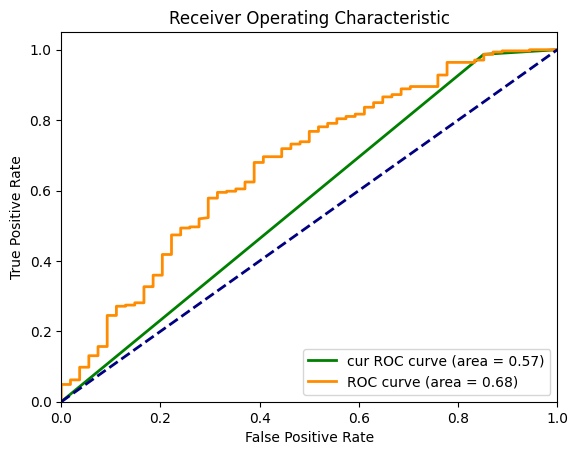

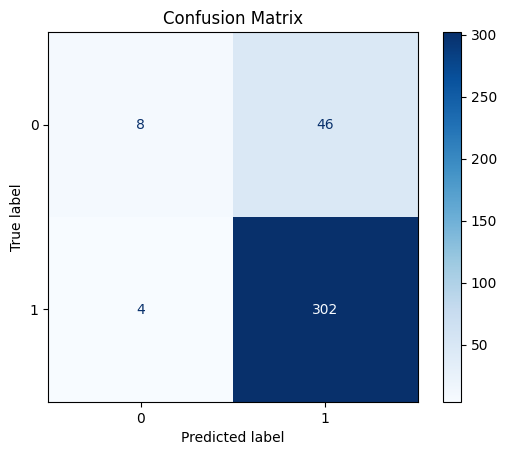

      Metric     Value
0    ROC AUC  0.675048
1       Gini  0.350097
2  Precision  0.867816
3     Recall  0.986928
4   F1 Score  0.923547
5   Accuracy  0.861111
Train


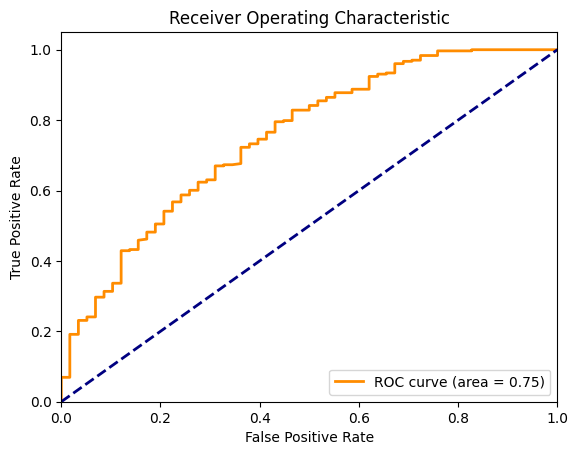

True Positives (TP): 302
True Negatives (TN): 14
False Positives (FP): 44
False Negatives (FN): 1
TPR: 0.9966996699669967
FPR: 0.7586206896551724


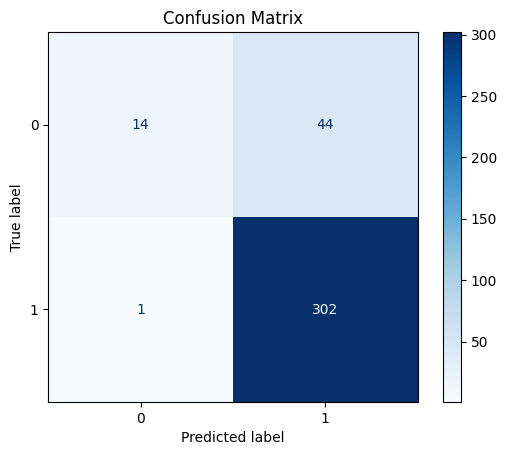

      Metric     Value
0    ROC AUC  0.750142
1       Gini  0.500285
2  Precision  0.872832
3     Recall  0.996700
4   F1 Score  0.930663
5   Accuracy  0.875346
['new_year_holidays_period', 'may_holidays_period', 'not_working_day', 'diff_5', 'pre_holiday', 'diff_2', 'unit_price']


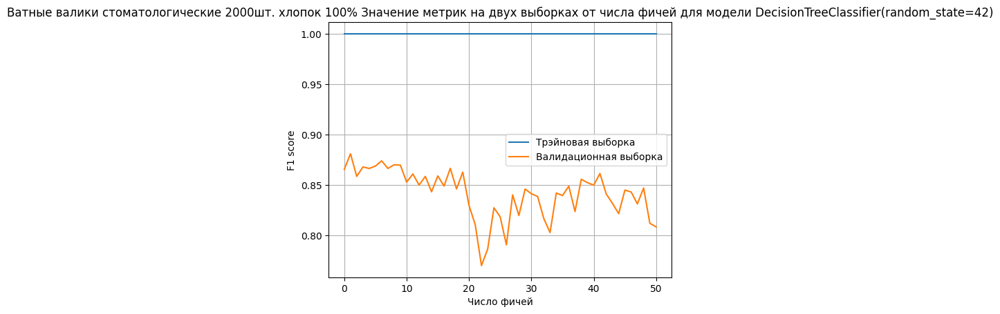

Crosvall
True Positives (TP): 274
True Negatives (TN): 12
False Positives (FP): 42
False Negatives (FN): 32
TPR: 0.8954248366013072
FPR: 0.7777777777777778
Presicion = TP / (TP + FP) = 274 / (274 + 42) = 274 / 316 = 0.8670886075949367
Recall = TP / (TP + FN) = 274 / (274 + 32) = 274 / 306 = 0.8954248366013072
F1 score = 2 * precision * recall / (precision + recall) = 0.8810289389067523


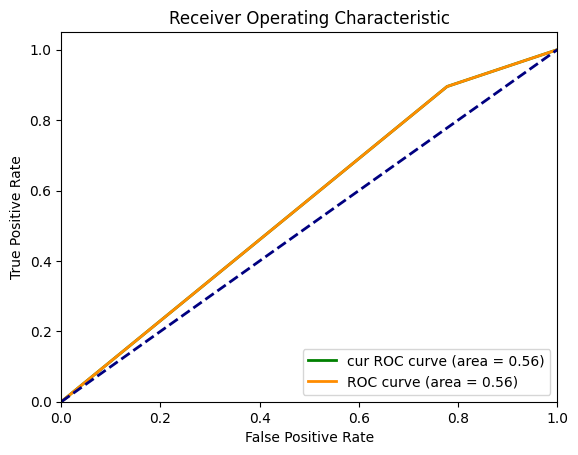

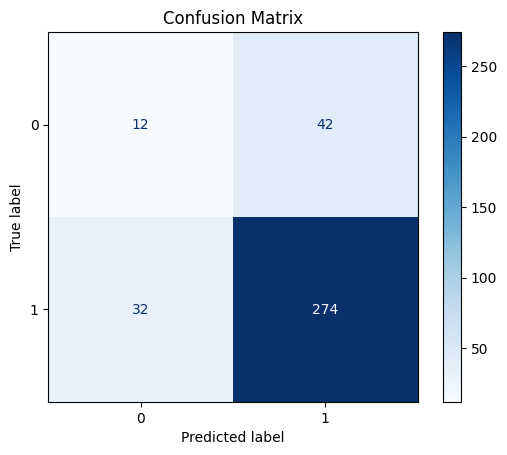

      Metric     Value
0    ROC AUC  0.558824
1       Gini  0.117647
2  Precision  0.867089
3     Recall  0.895425
4   F1 Score  0.881029
5   Accuracy  0.794444
Train


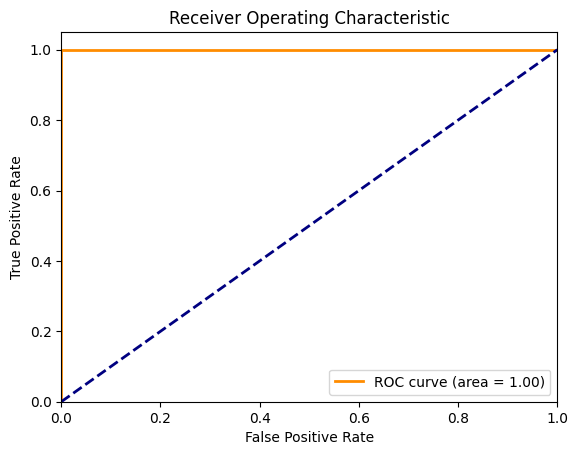

True Positives (TP): 303
True Negatives (TN): 58
False Positives (FP): 0
False Negatives (FN): 0
TPR: 1.0
FPR: 0.0


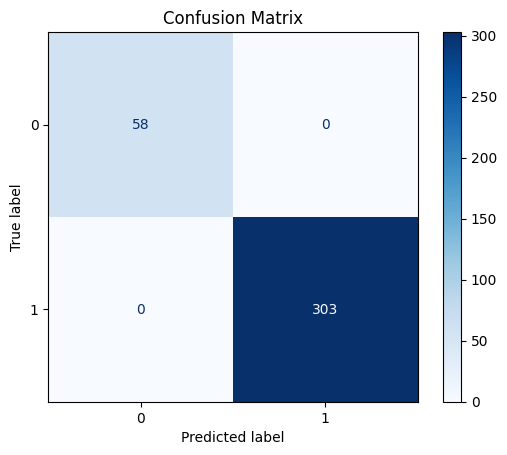

      Metric  Value
0    ROC AUC    1.0
1       Gini    1.0
2  Precision    1.0
3     Recall    1.0
4   F1 Score    1.0
5   Accuracy    1.0
['ewm_sales_week_3', 'unit_price']


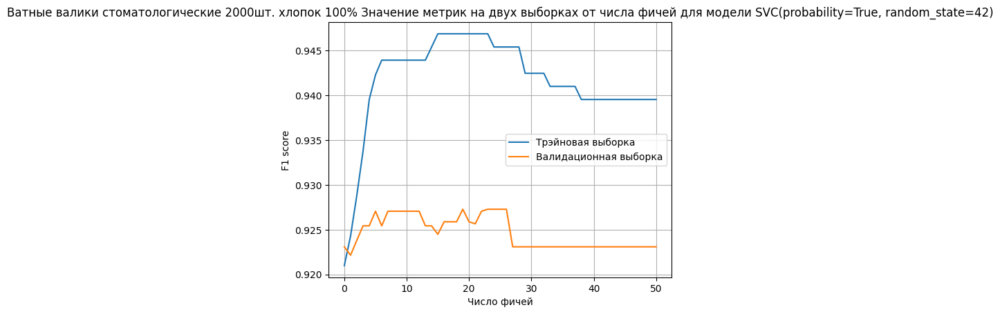

Crosvall
True Positives (TP): 306
True Negatives (TN): 6
False Positives (FP): 48
False Negatives (FN): 0
TPR: 1.0
FPR: 0.8888888888888888
Presicion = TP / (TP + FP) = 306 / (306 + 48) = 306 / 354 = 0.864406779661017
Recall = TP / (TP + FN) = 306 / (306 + 0) = 306 / 306 = 1.0
F1 score = 2 * precision * recall / (precision + recall) = 0.9272727272727274


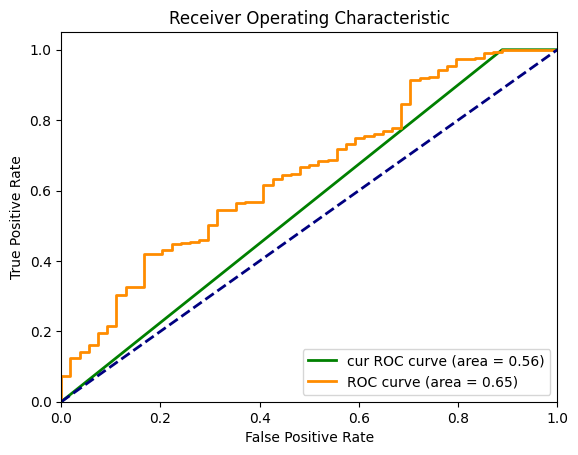

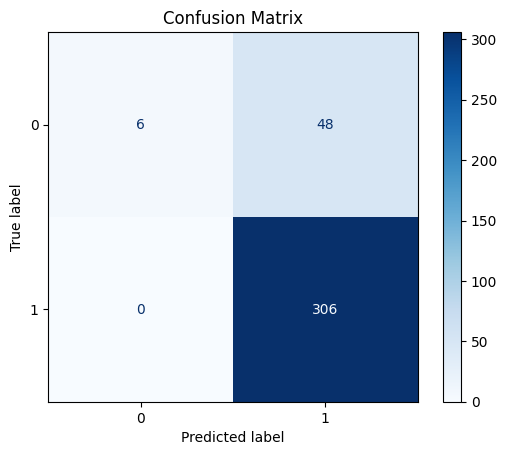

      Metric     Value
0    ROC AUC  0.651114
1       Gini  0.302227
2  Precision  0.864407
3     Recall  1.000000
4   F1 Score  0.927273
5   Accuracy  0.866667
Train


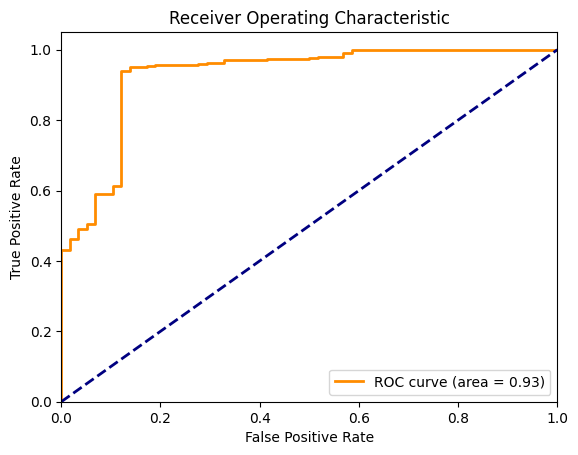

True Positives (TP): 303
True Negatives (TN): 24
False Positives (FP): 34
False Negatives (FN): 0
TPR: 1.0
FPR: 0.5862068965517241


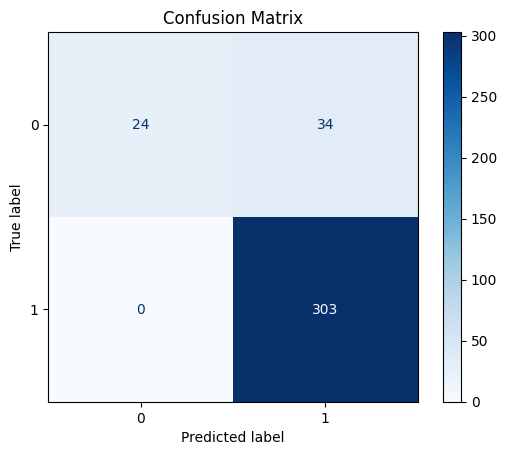

      Metric     Value
0    ROC AUC  0.927279
1       Gini  0.854558
2  Precision  0.899110
3     Recall  1.000000
4   F1 Score  0.946875
5   Accuracy  0.905817
['new_year_holidays_period', 'may_holidays_period', 'diff_12', 'is_holiday', 'price_rolling_mean_3', 'diff_9', 'diff_1', 'not_working_day_prev', 'unit_price', 'pre_holiday', 'diff_5', 'amount_rolling_mean_2', 'amount_rolling_mean_3', 'diff_7', 'price_rolling_mean_2', 'amount_rolling_mean_12', 'price_rolling_mean_5', 'diff_2', 'price_rolling_median_5', 'price_rolling_mean_7']


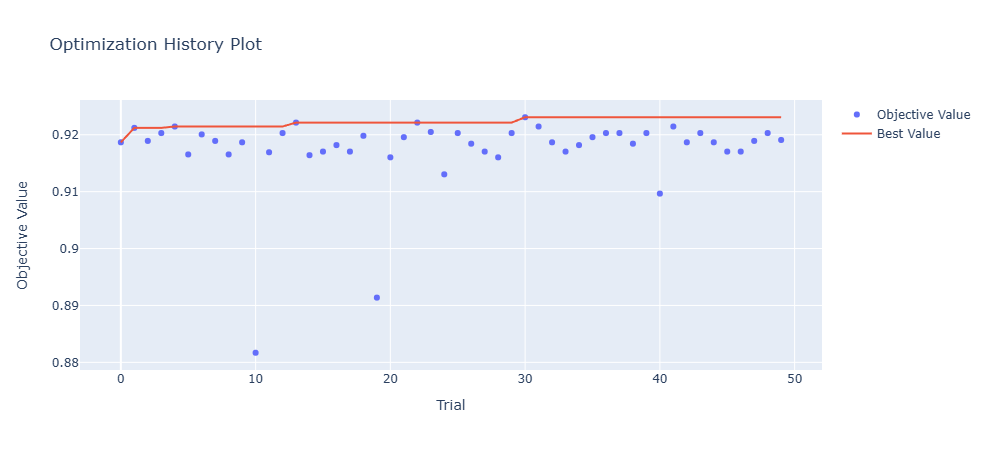

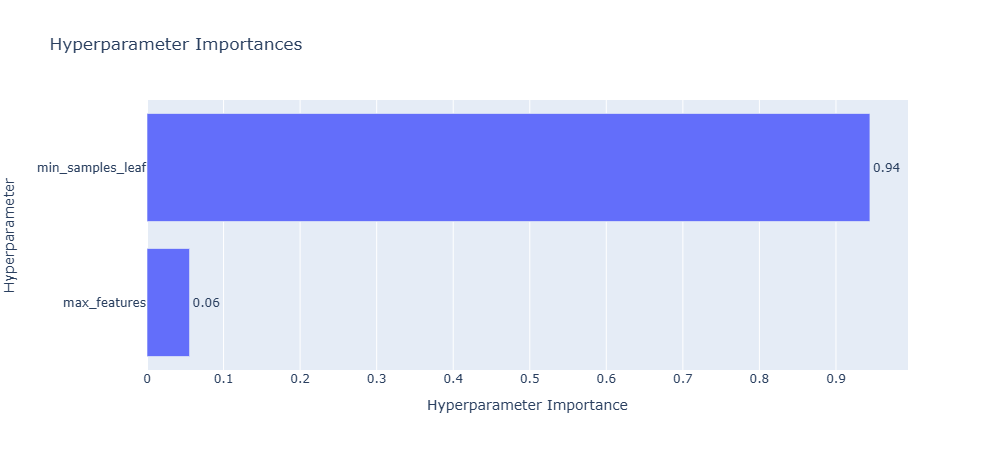

Best trial:
  Value: 0.923076923076923
  Params: 
    min_samples_leaf: 8
    max_features: 21


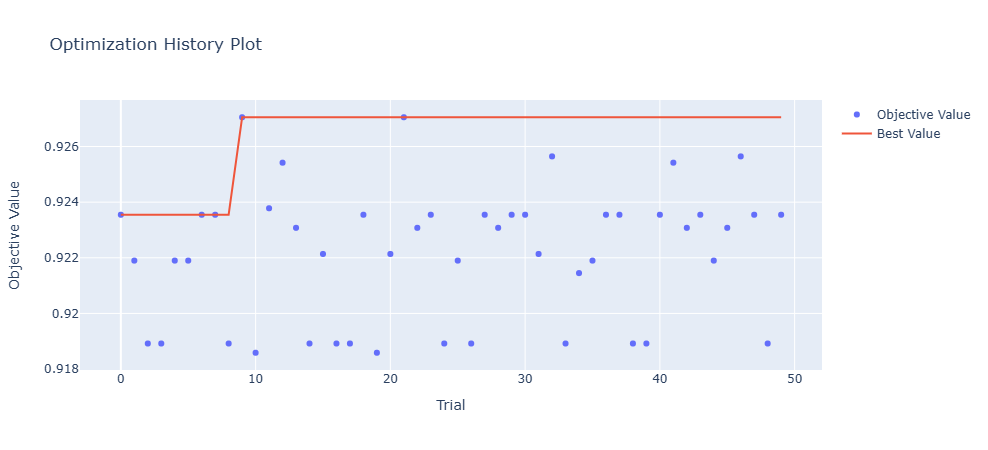

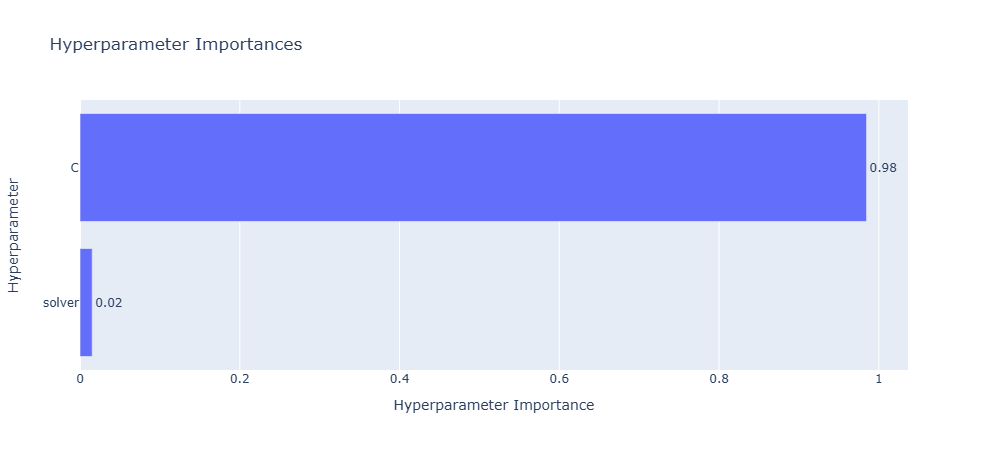

Best trial:
  Value: 0.9270516717325228
  Params: 
    C: 0.0652719112799697
    solver: saga
    l1_ratio: 0.406570071082359


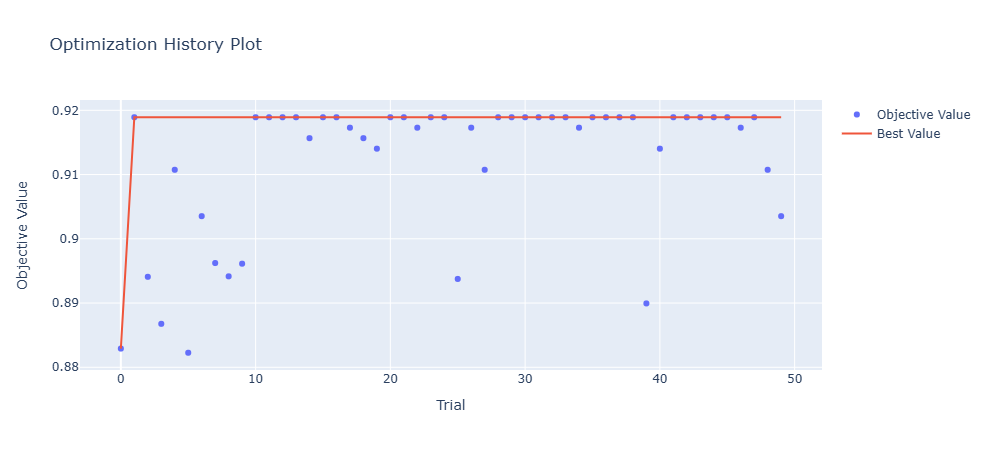

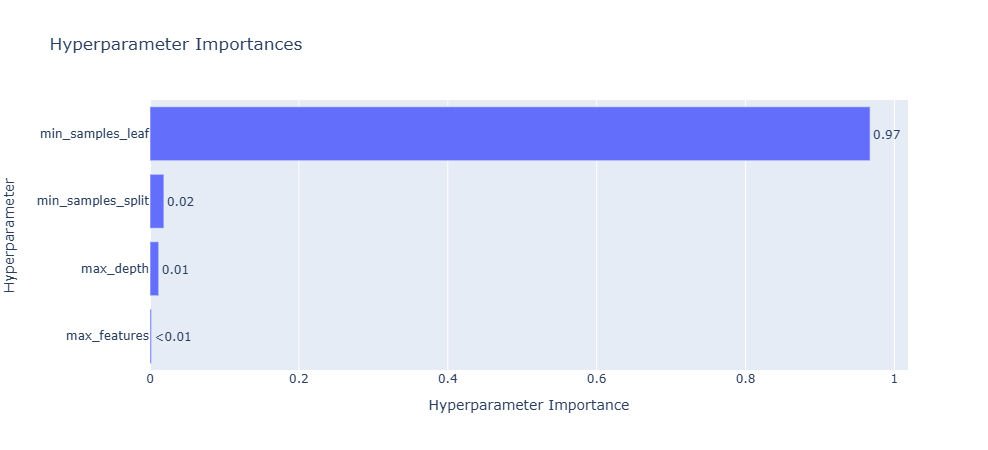

Best trial:
  Value: 0.9189189189189189
  Params: 
    max_depth: 4
    min_samples_split: 18
    min_samples_leaf: 13
    max_features: 1


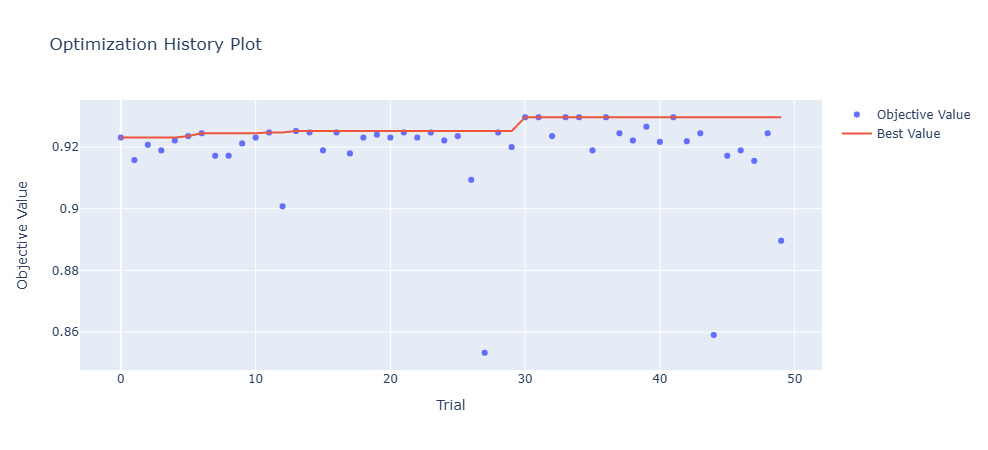

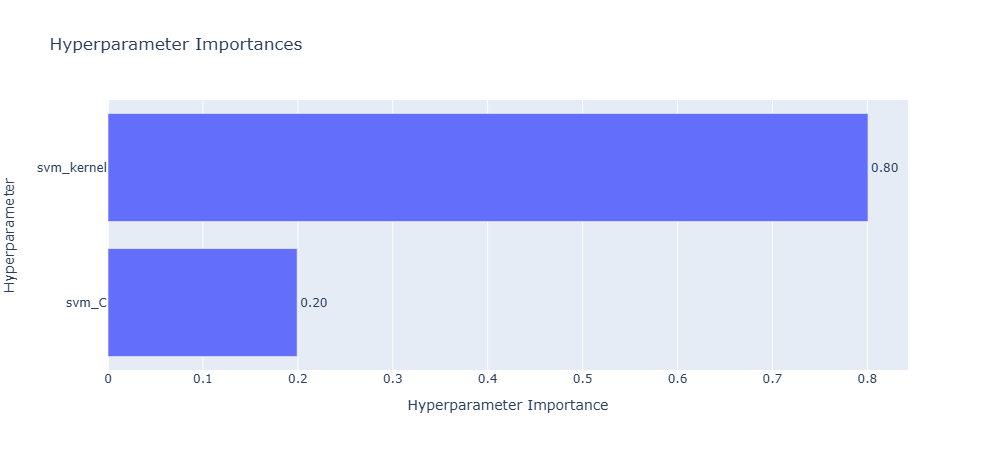

Best trial:
  Value: 0.9296636085626911
  Params: 
    svm_C: 2.4427367995897478
    svm_kernel: rbf
True Positives (TP): 306
True Negatives (TN): 3
False Positives (FP): 51
False Negatives (FN): 0
TPR: 1.0
FPR: 0.9444444444444444
Presicion = TP / (TP + FP) = 306 / (306 + 51) = 306 / 357 = 0.8571428571428571
Recall = TP / (TP + FN) = 306 / (306 + 0) = 306 / 306 = 1.0
F1 score = 2 * precision * recall / (precision + recall) = 0.923076923076923


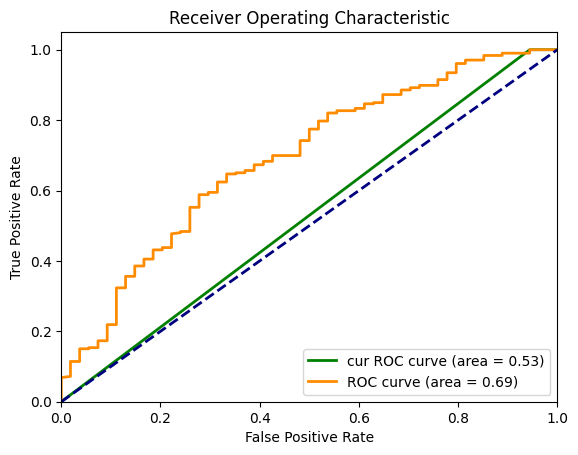

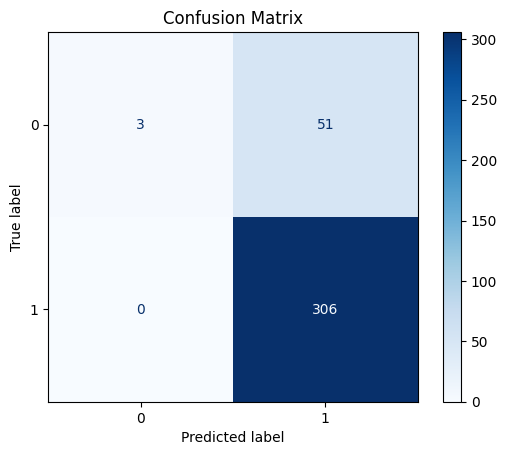

      Metric     Value
0    ROC AUC  0.690329
1       Gini  0.380658
2  Precision  0.857143
3     Recall  1.000000
4   F1 Score  0.923077
5   Accuracy  0.858333
True Positives (TP): 305
True Negatives (TN): 7
False Positives (FP): 47
False Negatives (FN): 1
TPR: 0.9967320261437909
FPR: 0.8703703703703703
Presicion = TP / (TP + FP) = 305 / (305 + 47) = 305 / 352 = 0.8664772727272727
Recall = TP / (TP + FN) = 305 / (305 + 1) = 305 / 306 = 0.9967320261437909
F1 score = 2 * precision * recall / (precision + recall) = 0.9270516717325228


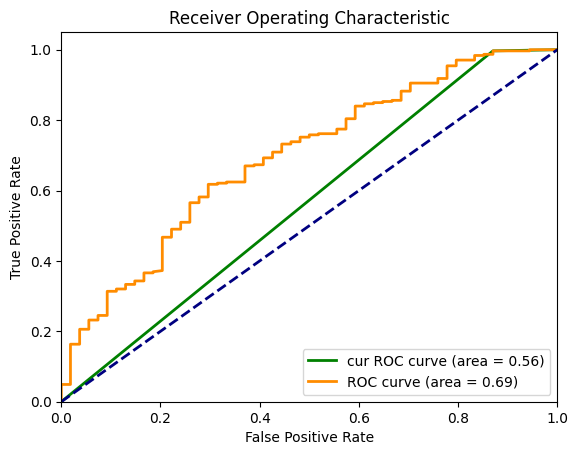

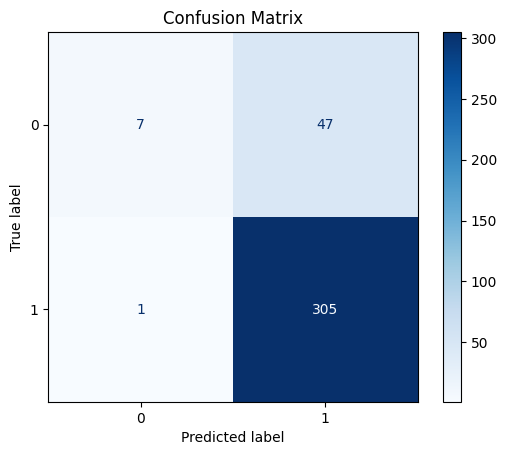

      Metric     Value
0    ROC AUC  0.694172
1       Gini  0.388344
2  Precision  0.866477
3     Recall  0.996732
4   F1 Score  0.927052
5   Accuracy  0.866667
True Positives (TP): 306
True Negatives (TN): 0
False Positives (FP): 54
False Negatives (FN): 0
TPR: 1.0
FPR: 1.0
Presicion = TP / (TP + FP) = 306 / (306 + 54) = 306 / 360 = 0.85
Recall = TP / (TP + FN) = 306 / (306 + 0) = 306 / 306 = 1.0
F1 score = 2 * precision * recall / (precision + recall) = 0.9189189189189189


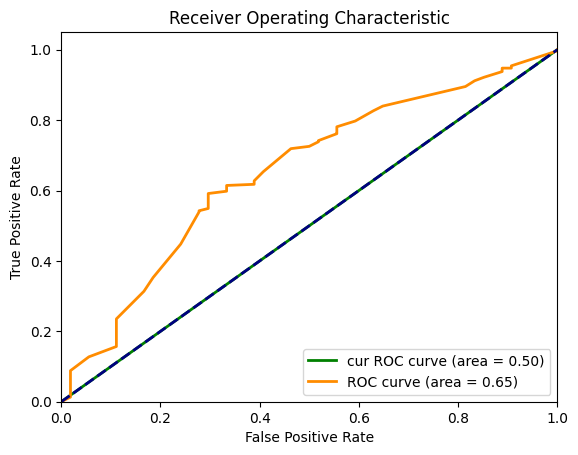

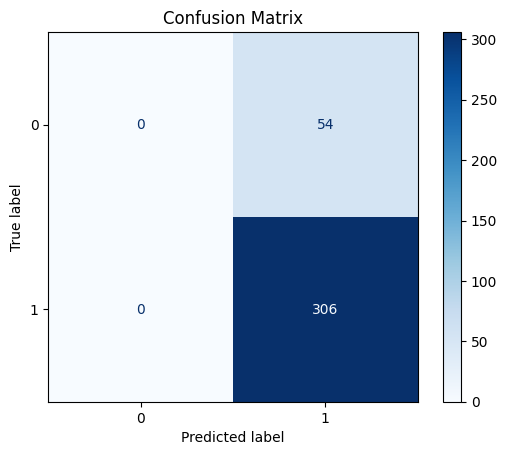

      Metric     Value
0    ROC AUC  0.653807
1       Gini  0.307613
2  Precision  0.850000
3     Recall  1.000000
4   F1 Score  0.918919
5   Accuracy  0.850000
True Positives (TP): 304
True Negatives (TN): 10
False Positives (FP): 44
False Negatives (FN): 2
TPR: 0.9934640522875817
FPR: 0.8148148148148148
Presicion = TP / (TP + FP) = 304 / (304 + 44) = 304 / 348 = 0.8735632183908046
Recall = TP / (TP + FN) = 304 / (304 + 2) = 304 / 306 = 0.9934640522875817
F1 score = 2 * precision * recall / (precision + recall) = 0.9296636085626911


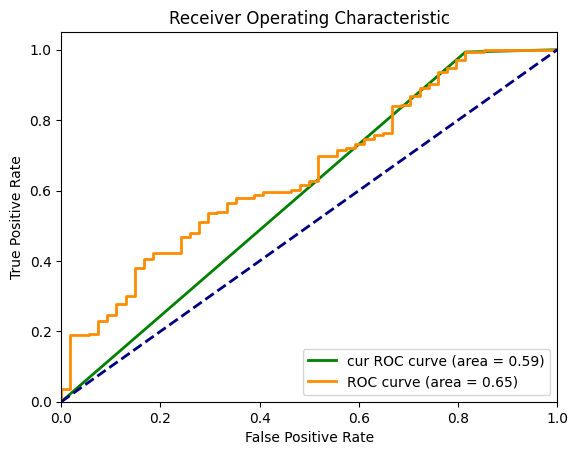

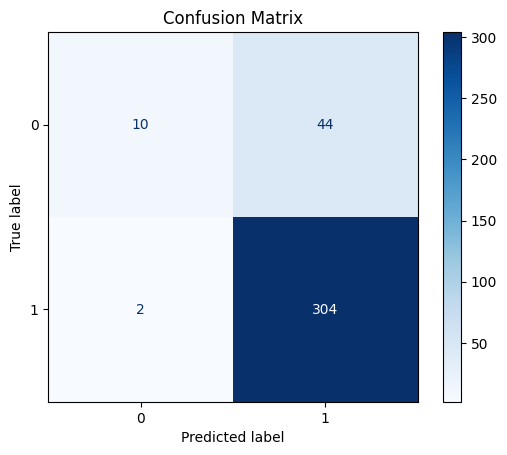

      Metric     Value
0    ROC AUC  0.651961
1       Gini  0.303922
2  Precision  0.873563
3     Recall  0.993464
4   F1 Score  0.929664
5   Accuracy  0.872222
Результат для Ватные валики стоматологические 2000шт. хлопок 100%


,Model,Standart Features,Best features,Bset Features and Hyperparameters
0,RandomForest,0.910494,0.926380,"[0.5277777777777778, 0.923076923076923]"
1,LogReg,0.893819,0.923547,"[0.5631808278867102, 0.9270516717325228]"
2,Tree,0.846939,0.881029,"[0.5, 0.9189189189189189]"
3,SVM,0.923077,0.927273,"[0.5893246187363834, 0.9296636085626911]"


In [67]:
for idx in ['1А00101А0010Б']:
    item_id = wb_df[wb_df['sku_id'] == idx]['sku_name'].unique()[0]
    cur_train, cur_val, useless_features = make_df(item_id, st_date, fn_date, st_date_test, fn_date_test)
    useless_features = np.delete(useless_features[2:], 8) 
    model_array = []
    model_array.append(RandomForestClassifier(random_state=42))
    model_array.append(LogisticRegression(random_state=42))
    model_array.append(DecisionTreeClassifier(random_state=42))
    model_array.append(SVC(random_state=42, probability=True))
    first_iter_metrics = []
    for i in range(4):
        z, _ = sales_mask(cur_train, cur_val, useless_features, model=model_array[i], print_flag=False)
        first_iter_metrics.append(_[1])
    print(first_iter_metrics)
    rf_features, rf_metr = give_rf_features(item_id)
    log_features, log_metr = give_log_features(item_id)
    tree_features, tree_metr = give_tree_features(item_id)
    svm_features, svm_metr = give_svm_features(item_id)
    
    second_iter_metrics = [rf_metr, log_metr, tree_metr, svm_metr]
    
    rf_best_params = find_best_params(rf_objective, 50)
    log_best_params = find_best_params(log_objective, 50)
    tree_best_params = find_best_params(tree_objective, 50)
    svm_best_params = find_best_params(svm_objective, 50)
    
    model_1 = RandomForestClassifier(
        min_samples_leaf=rf_best_params['min_samples_leaf'],
        max_features=rf_best_params['max_features'],
        random_state=42
        )
    
    model_2 = LogisticRegression(
        C = log_best_params['C'],
        solver=log_best_params['solver'],
        max_iter=1000,
        random_state=42
        )
    
    model_3 =  DecisionTreeClassifier(
        max_depth=tree_best_params['max_depth'],
        min_samples_split=tree_best_params['min_samples_split'],
        min_samples_leaf=tree_best_params['min_samples_leaf'],
        max_features=tree_best_params['max_features'],
        random_state=42
        )
    
    model_4 = SVC(C=svm_best_params['svm_C'], kernel=svm_best_params['svm_kernel'], probability=True, random_state=42)
    
    rf_metr_upd = evaluate(model_1, rf_features)
    log_metr_upd = evaluate(model_2, log_features)
    tree_metr_upd = evaluate(model_3, tree_features)
    svm_metr_upd = evaluate(model_4, svm_features)
    
    third_iter_metrics = [rf_metr_upd, log_metr_upd, tree_metr_upd, svm_metr_upd]
    result = {
            "Model": ["RandomForest", "LogReg", "Tree", "SVM"],
            "Standart Features" : first_iter_metrics,
            "Best features" : second_iter_metrics,
            "Bset Features and Hyperparameters" : third_iter_metrics
    }
    print(f"Результат для {item_id}")
    result = pd.DataFrame(result)
    from IPython.display import display
    display(result)

**Random Forest**

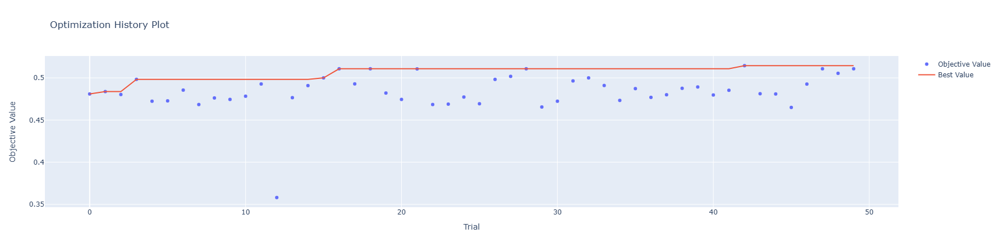

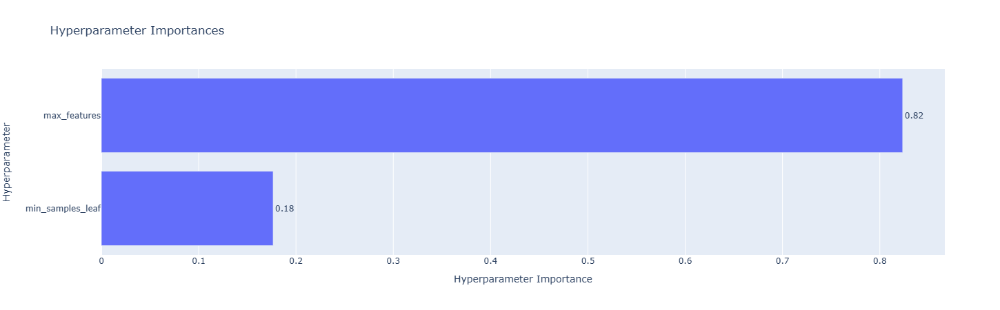

Best trial:
  Value: 0.5144927536231885
  Params: 
    min_samples_leaf: 4
    max_features: 28


In [48]:
rf_features = rf_features_old['13.00050.03130005003Белый']


best_params = find_best_params(rf_objective, 50)

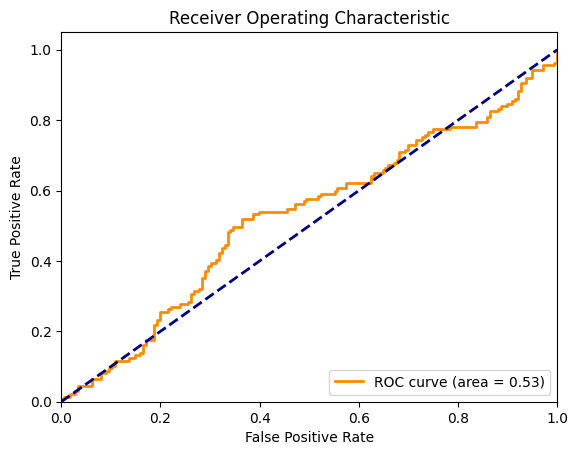

True Positives (TP): 71
True Negatives (TN): 108
False Positives (FP): 68
False Negatives (FN): 66
TPR: 0.5182481751824818
FPR: 0.38636363636363635


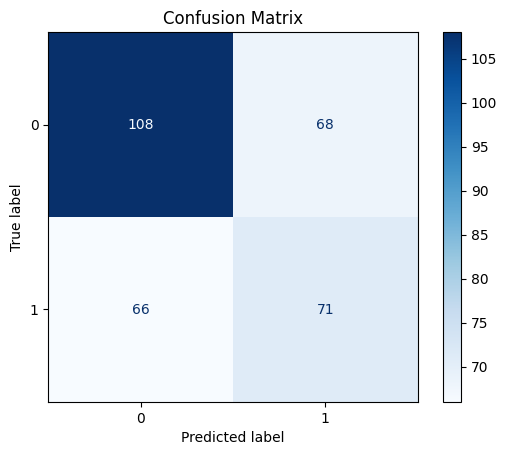

      Metric     Value
0    ROC AUC  0.525713
1       Gini  0.051427
2  Precision  0.510791
3     Recall  0.518248
4   F1 Score  0.514493
5   Accuracy  0.571885


[0.5659422694094227, 0.5144927536231885]

In [49]:
clf = RandomForestClassifier(
    n_estimators=100,
    min_samples_leaf=best_params['min_samples_leaf'],
    max_features=best_params['max_features'],
    #max_depth=best_params['max_depth'],
    random_state=42
)
evaluate(clf, rf_features)

In [57]:
cur_train, cur_val, _ = make_df(item_id, st_date, fn_date, st_date_test, fn_date_test)
cur_train = pd.concat([cur_train, cur_val])
train = cur_train[((cur_train['month'] >= 3) & (cur_train['year'] == 2023)) | ((cur_train['month'] < 3) & (cur_train['year'] == 2024))]
test = cur_train[(cur_train['month'] == 3) & (cur_train['year'] == 2024)]
rf_features = rf_features_old['13.00050.03130005003Белый']
param_space = {
    'max_features': Integer(1, len(rf_features) + 1),
    'min_samples_leaf': Integer(2, 20),
    'bootstrap': Categorical([True, False])
}

opt = BayesSearchCV(
    estimator=RandomForestClassifier(),
    search_spaces=param_space,
    n_iter=32,
    cv=3,
    scoring='f1_weighted',
    n_jobs=-1,
    random_state=42
)

opt.fit(train[rf_features], train['had_sales'])

best_params = opt.best_params_
best_score = opt.best_score_

print("Лучшие параметры:", best_params)
print("Лучшее качество (CV):", best_score)
clf = RandomForestClassifier(
    n_estimators=100,
    min_samples_leaf=best_params['min_samples_leaf'],
    max_features=best_params['max_features'],
    random_state=42
)
evaluate(clf, rf_features)

Лучшие параметры: OrderedDict([('bootstrap', False), ('max_features', 18), ('min_samples_leaf', 11)])
Лучшее качество (CV): 0.504213889912391


[0.5330955540809555, 0.4644194756554308]

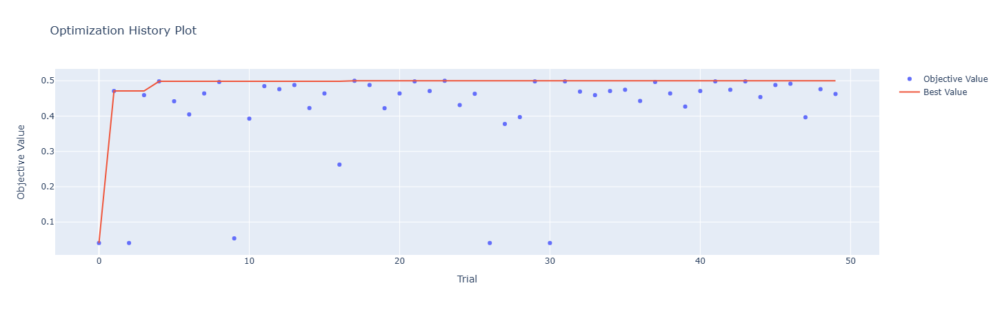

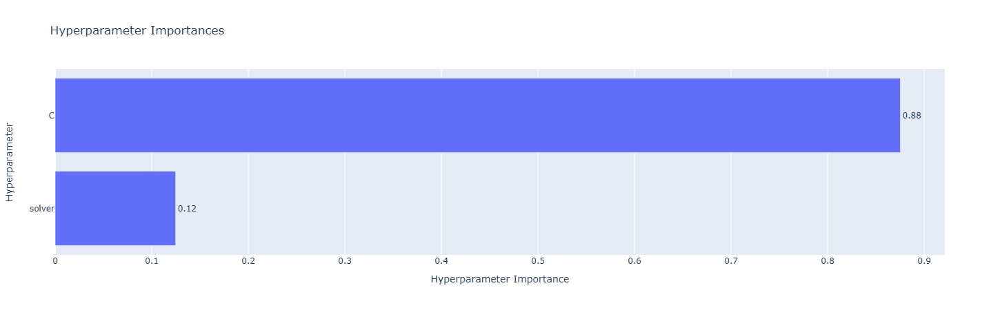

Best trial:
  Value: 0.5000000000000001
  Params: 
    C: 1.0447454516518493
    solver: saga
    l1_ratio: 0.3617804370888663


In [50]:
log_features = log_features_old['13.00050.03130005003Белый']
def logreg_objective(trial):
    C = trial.suggest_float('C', 1e-6, 1e3, log=True)
    solver = trial.suggest_categorical('solver', ['lbfgs', 'saga', 'liblinear'])
    if solver == 'saga':
        l1_ratio = trial.suggest_float('l1_ratio', 0.0, 1.0)
    else:
        l1_ratio = None

    clf = LogisticRegression(
        C=C,
        solver=solver,
        l1_ratio=l1_ratio,
        max_iter=1000,
        random_state=42
    )

    cur_train, cur_val, useless_features = make_df(item_id, st_date, fn_date, st_date_test, fn_date_test)
    z, _ = sales_mask(cur_train, cur_val, log_features, model=clf, print_flag=False)

    return _[1]


best_params = find_best_params(logreg_objective, 50)

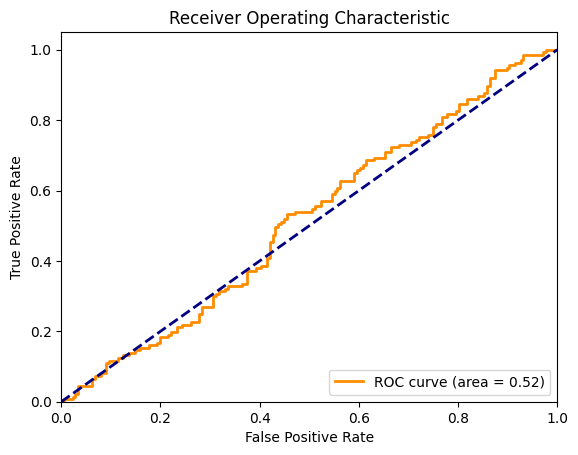

True Positives (TP): 74
True Negatives (TN): 91
False Positives (FP): 85
False Negatives (FN): 63
TPR: 0.5401459854014599
FPR: 0.48295454545454547


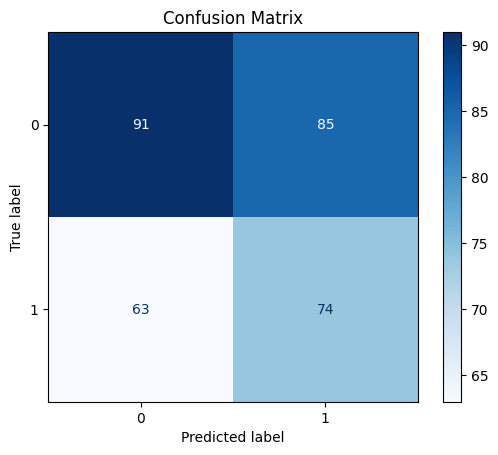

      Metric     Value
0    ROC AUC  0.517543
1       Gini  0.035086
2  Precision  0.465409
3     Recall  0.540146
4   F1 Score  0.500000
5   Accuracy  0.527157


[0.5285957199734572, 0.5000000000000001]

In [52]:
clf = LogisticRegression(
        C = best_params['C'],
        solver=best_params['solver'],
        max_iter=1000,
        random_state=42
    )
evaluate(clf, log_features)

**Desicion Tree**

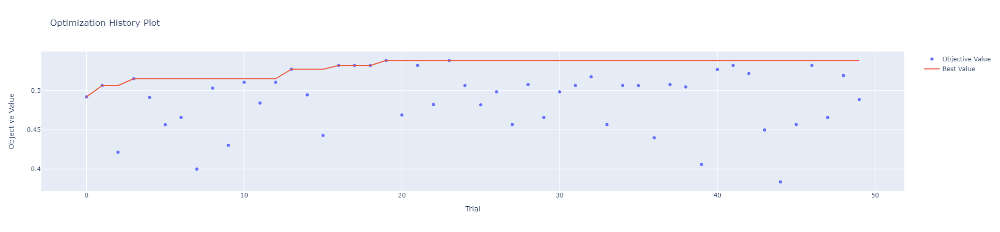

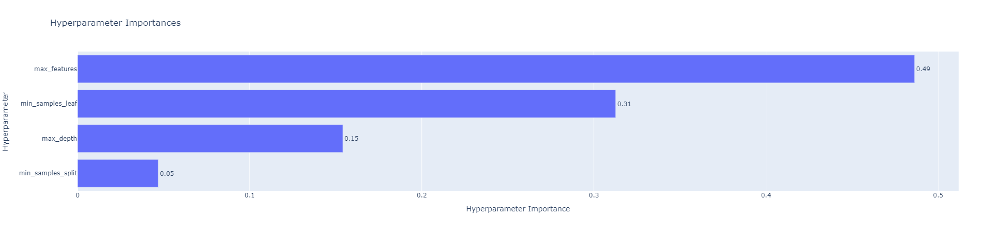

Best trial:
  Value: 0.5384615384615384
  Params: 
    max_depth: 24
    min_samples_split: 5
    min_samples_leaf: 5
    max_features: 14


In [56]:
tree_features = tree_features_old['13.00050.03130005003Белый']
def tree_objective(trial):
    max_depth = trial.suggest_int('max_depth', 1, 30)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 20)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 20)
    max_features = trial.suggest_int('max_features', 1, len(tree_features) + 1)
    
    clf = DecisionTreeClassifier(
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        max_features=max_features,
        random_state=42
    )
    cur_train, cur_val, useless_features = make_df(item_id, st_date, fn_date, st_date_test, fn_date_test)
    z, _ = sales_mask(cur_train, cur_val, tree_features, model=clf, print_flag=False)

    return _[1]

best_params = find_best_params(tree_objective, 50)

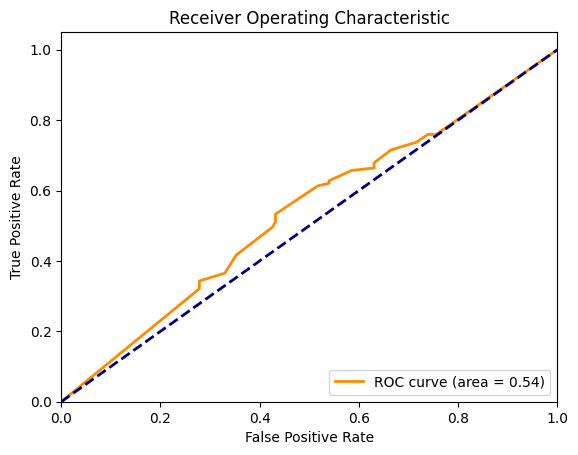

True Positives (TP): 84
True Negatives (TN): 85
False Positives (FP): 91
False Negatives (FN): 53
TPR: 0.6131386861313869
FPR: 0.5170454545454546


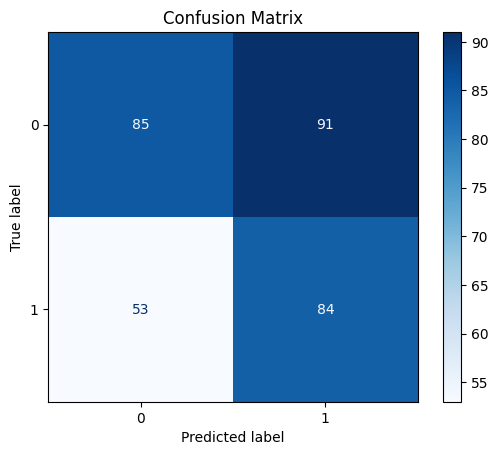

      Metric     Value
0    ROC AUC  0.536061
1       Gini  0.072122
2  Precision  0.480000
3     Recall  0.613139
4   F1 Score  0.538462
5   Accuracy  0.539936


[0.5480466157929662, 0.5384615384615384]

In [58]:
clf = DecisionTreeClassifier(
    max_depth=best_params['max_depth'],
    min_samples_split=best_params['min_samples_split'],
    min_samples_leaf=best_params['min_samples_leaf'],
    max_features=best_params['max_features'],
    random_state=42
)
evaluate(clf, tree_features)

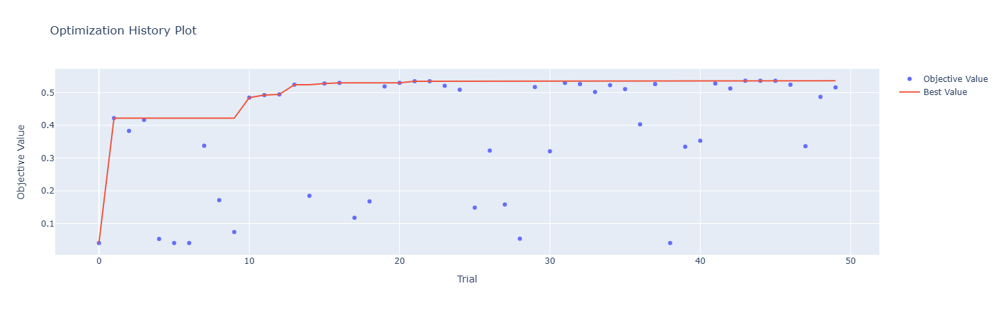

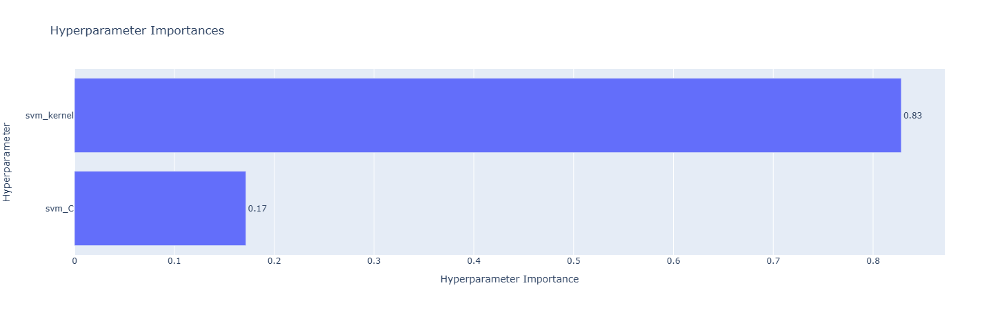

Best trial:
  Value: 0.536082474226804
  Params: 
    svm_C: 6.365041146019073
    svm_kernel: rbf


In [96]:
svm_feat = svm_features['13.00050.03130005003Белый']
def svm_objective(trial):
    svm_C = trial.suggest_float('svm_C', 0.01, 10.0, log=True)
    svm_kernel = trial.suggest_categorical('svm_kernel', ['linear', 'poly', 'rbf', 'sigmoid'])
    
    svm = make_pipeline(StandardScaler(), SVC(C=svm_C, kernel=svm_kernel, probability=True, random_state=42))
    
    cur_train, cur_val, useless_features = make_df(item_id, st_date, fn_date, st_date_test, fn_date_test)
    z, _ = sales_mask(cur_train, cur_val, svm_feat, model=svm, print_flag=False)

    return _[1]

best_params = find_best_params(svm_objective, 50)

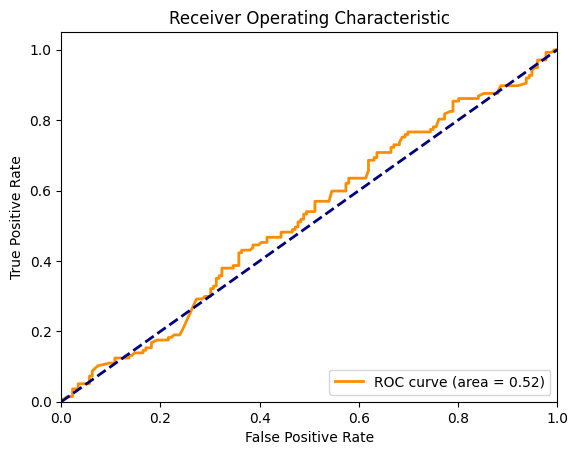

True Positives (TP): 78
True Negatives (TN): 100
False Positives (FP): 76
False Negatives (FN): 59
TPR: 0.5693430656934306
FPR: 0.4318181818181818


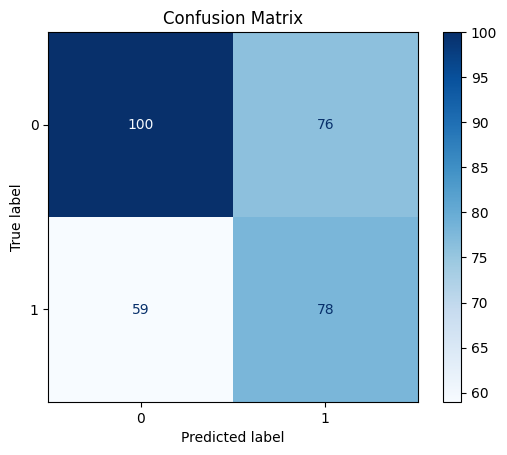

      Metric     Value
0    ROC AUC  0.521255
1       Gini  0.042510
2  Precision  0.506494
3     Recall  0.569343
4   F1 Score  0.536082
5   Accuracy  0.568690


[0.5687624419376245, 0.536082474226804]

In [97]:
svm = make_pipeline(StandardScaler(), SVC(C=best_params['svm_C'], kernel=best_params['svm_kernel'], probability=True, random_state=42))
evaluate(svm, svm_feat)

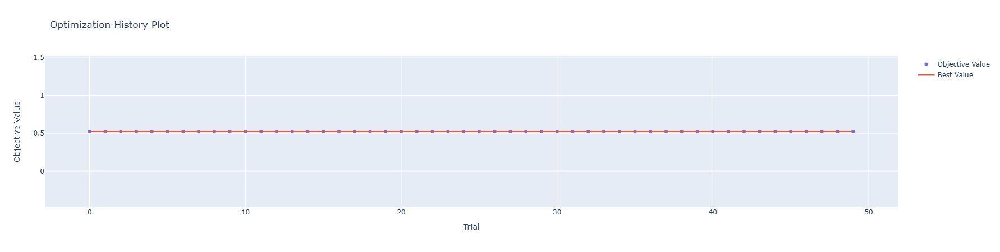

RuntimeError: Encountered zero total variance in all trees.

In [90]:
stack_features = stack_features_old['13.00050.03130005003Белый']
def stack_objective(trial):
    rf_n_estimators = trial.suggest_int('rf_n_estimators', 50, 200)
    rf_max_depth = trial.suggest_int('rf_max_depth', 5, 30)
    rf_min_samples_split = trial.suggest_int('rf_min_samples_split', 2, 10)
    rf_min_samples_leaf = trial.suggest_int('rf_min_samples_leaf', 1, 10)
    
    svm_C = trial.suggest_float('svm_C', 0.01, 10.0, log=True)
    svm_kernel = trial.suggest_categorical('svm_kernel', ['linear', 'poly', 'rbf', 'sigmoid'])
    
    lr_C = trial.suggest_float('lr_C', 0.01, 10.0, log=True)
    
    rf = RandomForestClassifier(
        n_estimators=rf_n_estimators,
        max_depth=rf_max_depth,
        min_samples_split=rf_min_samples_split,
        min_samples_leaf=rf_min_samples_leaf,
        random_state=42
    )
    
    svm = make_pipeline(
        StandardScaler(),
        SVC(C=svm_C, kernel=svm_kernel, probability=True, random_state=42)
    )
    
    lr = make_pipeline(
        StandardScaler(),
        LogisticRegression(C=lr_C, random_state=42, max_iter=1000)
    )
    
    estimators = [
        ('rf', rf),
        ('svm', svm),
        ('lr', lr)
    ]
    
    clf = StackingClassifier(
        estimators=estimators,
        final_estimator=RandomForest(random_state=42),
        passthrough=True
    )
    
    df = pd.concat([cur_train, cur_test])
    score = cross_val_score(clf, df[stack_features], df['had_sales'], cv=3, scoring='f1_weighted').mean()
    return score

best_params = find_best_params(svm_objective, 50)

In [ ]:
rf = RandomForestClassifier(
    n_estimators=best_params['rf_n_estimators'],
    max_depth=best_params['rf_max_depth'],
    min_samples_split=best_params['rf_min_samples_split'],
    min_samples_leaf=best_params['rf_min_samples_leaf'],
    random_state=42
)

svm = make_pipeline(
    StandardScaler(),
    SVC(C=best_params['svm_C'], kernel=best_params['svm_kernel'], probability=True, random_state=42)
)

lr = make_pipeline(
    StandardScaler(),
    LogisticRegression(C=best_params['lr_C'], random_state=42, max_iter=1000)
)

estimators = [
    ('rf', rf),
    ('svm', svm),
    ('lr', lr)
]

clf = StackingClassifier(
        estimators=estimators,
        final_estimator=RandomForestClassifier(random_state=42),
        passthrough=True
    )

evaluate(clf, stack_features)

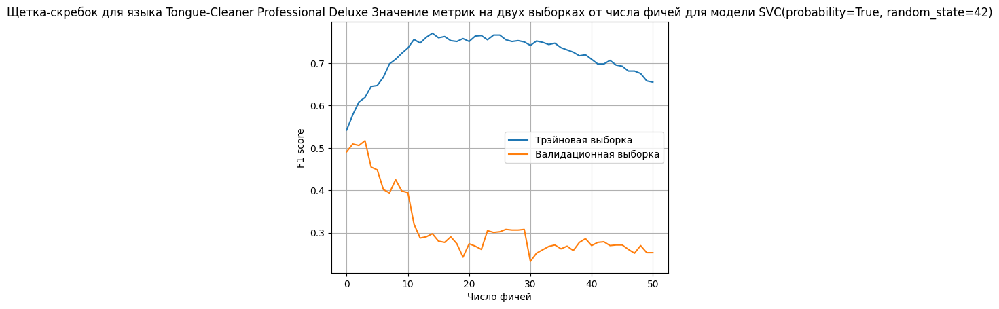

Crosvall
True Positives (TP): 69
True Negatives (TN): 115
False Positives (FP): 61
False Negatives (FN): 68
TPR: 0.5036496350364964
FPR: 0.3465909090909091
Presicion = TP / (TP + FP) = 69 / (69 + 61) = 69 / 130 = 0.5307692307692308
Recall = TP / (TP + FN) = 69 / (69 + 68) = 69 / 137 = 0.5036496350364964
F1 score = 2 * precision * recall / (precision + recall) = 0.5168539325842697


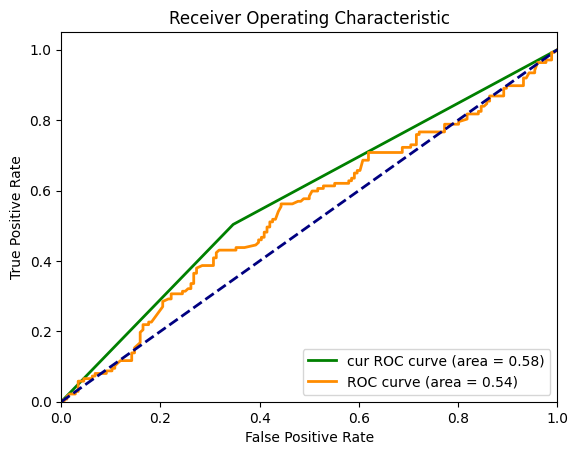

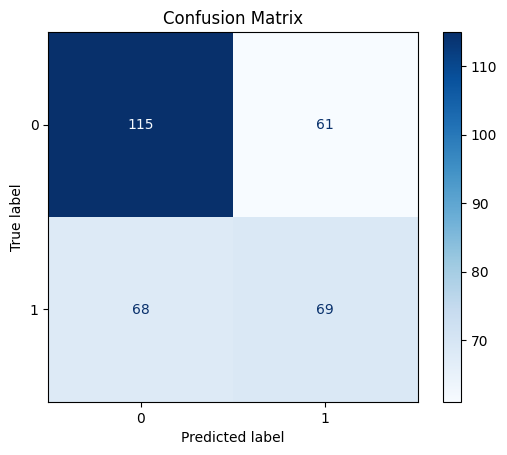

      Metric     Value
0    ROC AUC  0.538674
1       Gini  0.077347
2  Precision  0.530769
3     Recall  0.503650
4   F1 Score  0.516854
5   Accuracy  0.587859
Train


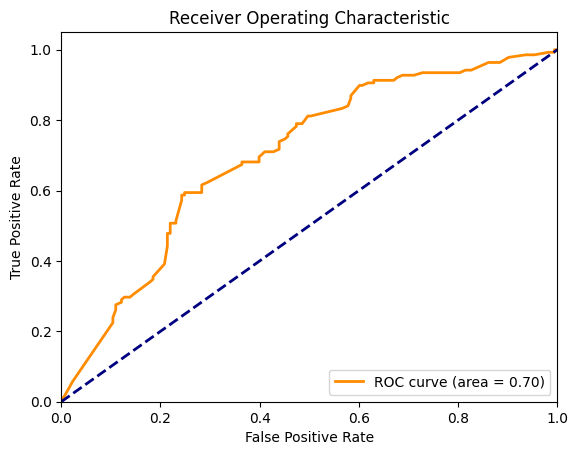

True Positives (TP): 82
True Negatives (TN): 128
False Positives (FP): 45
False Negatives (FN): 56
TPR: 0.5942028985507246
FPR: 0.26011560693641617


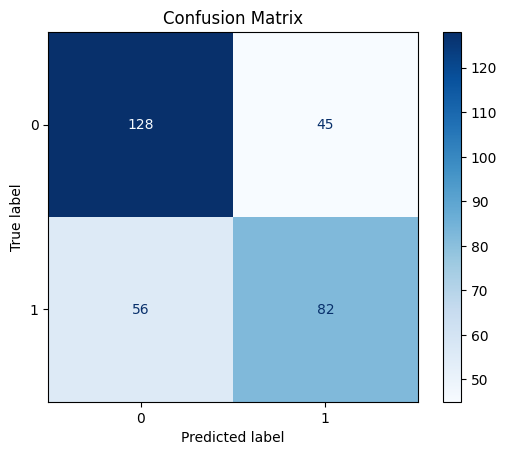

      Metric     Value
0    ROC AUC  0.700616
1       Gini  0.401231
2  Precision  0.645669
3     Recall  0.594203
4   F1 Score  0.618868
5   Accuracy  0.675241
['diff_5', 'diff_2', 'is_holiday', 'amount_rolling_median_9']
                                             Щетка-скребок для языка Tongue-Cleaner Professional Deluxe 13.00050.03130005003Белый                    


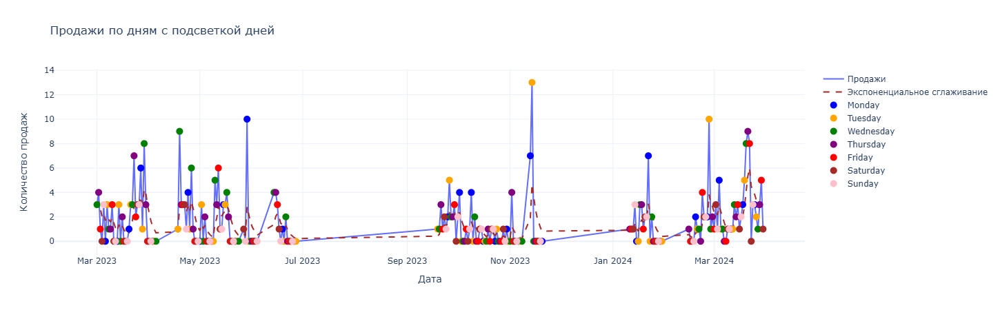

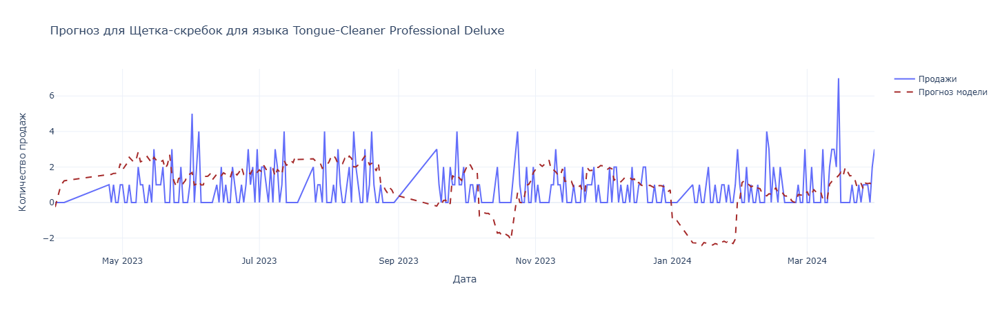

Щетка-скребок для языка Tongue-Cleaner Professional Deluxe || без классификатора MAE: 1.3200714253222487 || без классификатора MAPE: 1.7215931505244328


ValueError: operands could not be broadcast together with shapes (313,) (31,) 

In [49]:
features = ['month', 'unit_price', 'is_holiday', 'amount_rolling_mean_7', 'amount_rolling_mean_2', 'diff_1', 'diff_9', 'ewm_sales_week_9', 'price_rolling_mean_14']
for sku_id in ['13.00050.03130005003Белый']:
    item_id = wb_df[wb_df['sku_id'] == sku_id]['sku_name'].unique()[0]
    clf_features, clf_metr = give_svm_features(item_id)
    train, test, _ = make_df(item_id, st_date, fn_date, st_date_test, fn_date_test)
    clf = SVC(random_state=42, C=6.696178453776117, kernel='rbf')
    mask = np.ones(len(test))
    print('   ' * 15 + item_id + ' ' + sku_id + ' ' * 20)
    print('===' * 50)
    build_graph(pd.concat([cur_train, pd.DataFrame()]), cur_test)
    print('===' * 50)
    lin_model_pred, lin_model_metrics = LinearReg(item_id, train, test, mask, features, True)
    print(f'{item_id} || без классификатора MAE: {lin_model_metrics[2]} || без классификатора MAPE: {lin_model_metrics[3]}')
    print('===' * 50)
    mask, _ = sales_mask(cur_train, cur_test, clf_features, clf)
    lin_model_pred, lin_model_metrics = LinearReg(item_id, train, test, mask[-31:], features, True)
    print(f'{item_id} || с классификатором MAE: {lin_model_metrics[2]} || с классификатором MAPE: {lin_model_metrics[3]}')
    print('###' * 50)

In [ ]:
acc_arr = []
f1_arr = []
name_id = []

mask_arr = []
no_mask_arr = []
features = ['month', 'unit_price', 'is_holiday', 'amount_rolling_mean_7', 'amount_rolling_mean_2', 'diff_1', 'diff_2']
for idx, item_id in enumerate(wb_df['sku_name'].unique()):
    if idx not in group:
        continue
    cur_train, cur_test = make_df(item_id, st_date, fn_date, st_date_test, fn_date_test)
    mask, _ = sales_mask(cur_train, cur_test, features)
    acc_arr.append(_[0])
    f1_arr.append(_[1])
    name_id.append(item_id)
    
    no_mask = np.ones(len(mask))
    
    lin_model_pred_m, lin_model_metrics_m = LinearReg(item_id, cur_train, cur_test, mask, features)
    lin_model_pred, lin_model_metrics = LinearReg(item_id, cur_train, cur_test, no_mask, features)
    
    mask_arr.append(lin_model_metrics_m[2])
    no_mask_arr.append(lin_model_metrics[2])

In [ ]:
df = pd.DataFrame(index=[i for i in range(len(acc_arr))])

In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df.index, y=acc_arr, name='Значение Balanced acc', mode='markers', text=name_id, hoverinfo='text'))
fig.add_trace(go.Scatter(x=df.index, y=mask_arr, name='Метрика MAE с маской', mode='lines', yaxis='y2', text=name_id, hoverinfo='text'))
fig.add_trace(go.Scatter(x=df.index, y=no_mask_arr, name='Метрика MAE без маски', mode='lines', yaxis='y2', text=name_id, hoverinfo='text'))
fig.update_layout(
    title=f'                    Значения balanced accuracy для различных товаров',
    xaxis_title='Номер товара',
    yaxis_title='Значение метрики',
    template='plotly_white',
    yaxis=dict(
        title='Качество классификации (Balanced acc)',
        titlefont=dict(color='#1f77b4'),
        tickfont=dict(color='#1f77b4')
    ),
    yaxis2=dict(
        title='Значение метрики MAE',
        titlefont=dict(color='#ff7f0e'),
        tickfont=dict(color='#ff7f0e'),
        overlaying='y',
        side='right'
    ),
    hovermode='closest'
)
fig.show()

In [ ]:
item_id = 'Микробраши Extra-THIN 100 шт./ Микроаппликаторы'
cur_train, cur_test = make_df(item_id, st_date, fn_date, st_date_test, fn_date_test)
mask, _ = sales_mask(cur_train, cur_test, features)
print(_)
predict_graph(item_id)